<a href="https://colab.research.google.com/github/sanmope/MentoriaMercosur/blob/master/MentoriaMercosur_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Mentoría: Predicción de indicadores sociales para países del MERCOSUR

[Link a la descripción del proyecto](https://github.com/jfrau/DiploDatos2020/blob/master/README.md)

## Importacion de Librerías

In [ ]:
import pandas as pd
!pip install sidetable
import sidetable


#Visualización
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
# Para que pandas no trunque aquellas celdas con contenido muy largo (como textos)
pd.set_option('display.max_colwidth', -1)
# Para que pandas no trunque la vista de todas las columnas
pd.set_option('display.max_columns', None)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  


In [ ]:
import sys
in_colab = 'google.colab' in sys.modules

if in_colab:
  BASE_DIR = "https://raw.githubusercontent.com/sanmope/MentoriaMercosur/master/"
else:
  BASE_DIR = ".."


Cargamos los datasets de cada uno de los indicadores a predecir. Los mismos pueden descargarse del siguiente [link](https://drive.google.com/drive/folders/1NVxgmk_pED1FtnqWl_M4-2vRPiyd6Pri?usp=sharing).

In [ ]:
education =  pd.read_csv(BASE_DIR + '/educacion_mercosur_cleaned.csv')
gender = pd.read_csv(BASE_DIR + 'gender_mercosur_cleaned.csv')
environment = pd.read_csv(BASE_DIR + 'environment_mercosur_cleaned.csv')
health = pd.read_csv(BASE_DIR + 'health_mercosur_cleaned.csv')
poverty = pd.read_csv(BASE_DIR + 'poverty_mercosur_cleaned.csv')
social_protection = pd.read_csv(BASE_DIR + 'socialprotection_mercosur_cleaned.csv')

Renombramos la primera columna como ***Features*** en todos los datasets.

In [ ]:
#Corrección del nombre de la primera columna
education = education.rename(columns={"Unnamed: 0": "features"})
gender = gender.rename(columns={"Unnamed: 0": "features"})
environment = environment.rename(columns={"Unnamed: 0": "features"})
health = health.rename(columns={"Unnamed: 0": "features"})
poverty = poverty.rename(columns={"Unnamed: 0": "features"})
social_protection = social_protection.rename(columns={"Unnamed: 0": "features"})

Por último veamos las dimensiones de cada uno de los datasets considerados:

In [ ]:
print('Dimensiones de los datasets: \n',
      'Educación:',education.shape, '\n', 
      'Género:',gender.shape,'\n',
     'Medio Ambiente:', environment.shape, '\n',
     'Salud:', health.shape, '\n',
      'Pobreza:',poverty.shape, '\n',
      'Protección Social:',social_protection.shape)

Dimensiones de los datasets: 
 Educación: (1272, 55) 
 Género: (996, 55) 
 Medio Ambiente: (912, 55) 
 Salud: (1344, 55) 
 Pobreza: (180, 55) 
 Protección Social: (1116, 55)


### Breve muestro estadístico

In [ ]:
gender.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 996 entries, 0 to 995
Data columns (total 55 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   features        996 non-null    object 
 1   Indicator       996 non-null    object 
 2   Country Name    996 non-null    object 
 3   Country Code    996 non-null    object 
 4   Indicator Code  996 non-null    object 
 5   1970.0          267 non-null    float64
 6   1971.0          327 non-null    float64
 7   1972.0          311 non-null    float64
 8   1973.0          303 non-null    float64
 9   1974.0          307 non-null    float64
 10  1975.0          295 non-null    float64
 11  1976.0          304 non-null    float64
 12  1977.0          324 non-null    float64
 13  1978.0          304 non-null    float64
 14  1979.0          297 non-null    float64
 15  1980.0          264 non-null    float64
 16  1981.0          235 non-null    float64
 17  1982.0          231 non-null    flo

In [ ]:
gender.describe(include='object')

,features,Indicator,Country Name,Country Code,Indicator Code
count,996,996,996,996,996
unique,83,1,12,12,83
top,"Empleo de tiempo parcial, mujeres (% del total de mujeres empleadas)",Gender,Bolivia,CHL,SP.DYN.TO65.MA.ZS
freq,12,996,83,83,12


In [ ]:
gender.describe(include='float')

,1970.0,1971.0,1972.0,1973.0,1974.0,1975.0,1976.0,1977.0,1978.0,1979.0,1980.0,1981.0,1982.0,1983.0,1984.0,1985.0,1986.0,1987.0,1988.0,1989.0,1990.0,1991.0,1992.0,1993.0,1994.0,1995.0,1996.0,1997.0,1998.0,1999.0,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
count,267.000000,327.000000,311.000000,303.000000,307.000000,295.000000,304.000000,324.000000,304.000000,297.000000,264.000000,235.000000,231.000000,214.000000,249.000000,275.000000,290.000000,294.000000,273.000000,238.000000,284.000000,636.000000,618.000000,648.000000,585.000000,619.000000,651.000000,596.000000,681.000000,772.000000,759.000000,751.000000,769.000000,752.000000,781.000000,824.000000,798.000000,825.000000,835.000000,872.000000,852.000000,873.000000,860.000000,799.000000,807.000000,805.000000,785.000000,756.000000,607.000000,340.000000
mean,3070.725406,748.889278,552.108538,771.666250,1156.919587,1581.743274,1178.669536,996.922583,934.526685,859.073386,938.459436,1795.894341,134.163296,355.478644,502.662184,312.451748,4486.404128,320.129477,314.707430,313.396708,233.902189,2200.233529,263.837849,681.383259,421.042620,1176.903429,338.466021,194.815816,298.323500,897.220445,712.149389,832.968505,600.203838,381.280899,1245.019528,351.416239,362.484716,1328.157105,553.869019,865.220892,538.852398,1187.407923,776.147141,535.511907,584.900127,754.170129,873.854447,826.383055,356.806444,33.480108
std,25513.141762,8098.923367,5476.803970,8675.474360,9582.902556,11200.964066,9865.145238,8380.859909,7856.479723,6586.765523,7555.308497,16246.008696,685.664072,2934.474845,3470.366705,2867.909595,50125.602609,3051.649782,2866.697607,2645.893927,2033.953504,32353.373528,2971.643340,9729.463709,4283.444628,15788.124203,3240.842812,1967.332722,3436.305356,10173.179375,8016.587350,10464.355075,8378.031150,4190.949654,17988.341517,4377.058892,4438.420410,20638.679532,5788.056914,9161.432936,4578.264578,12829.155655,7157.605944,5873.754162,6455.404006,7457.420292,9082.448234,9288.841691,3690.908330,24.842334
min,0.362750,0.248470,0.301900,0.344930,0.498160,0.483570,0.451560,0.624940,0.662620,0.559960,0.556870,0.765690,0.807870,0.700140,0.649920,0.769260,0.721710,0.804930,0.678680,0.917990,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.100000,0.072000,0.033000,0.015000,0.058000,0.049000
25%,24.285485,23.894865,26.887430,28.330900,34.769140,34.281510,37.426603,42.175900,43.231097,36.592250,26.052140,43.998905,43.500680,44.183260,42.676590,37.024535,37.584542,41.306790,41.365970,38.184157,16.975000,14.985000,15.079000,13.979503,14.200000,14.603000,15.305000,12.416750,14.983000,15.835750,16.150000,15.497500,16.900000,16.854750,16.612000,16.449501,16.845999,16.242000,16.900000,18.134250,16.864500,16.770000,16.197750,16.149500,16.600000,16.809999,15.385000,14.287073,11.617500,10.025000
50%,59.256626,53.184520,53.940000,56.328403,58.894390,59.580000,62.311470,63.620647,63.608763,62.925580,62.631335,63.507754,62.801000,63.451755,63.887000,63.923000,63.800730,65.028302,65.351640,66.533543,63.450500,45.687500,46.268499,44.761499,42.590000,43.694270,46.000000,42.078011,47.917999,49.211995,49.105820,49.097070,49.079860,49.331901,50.602380,51.199999,51.446785,51.502998,52.174160,52.558500,52.195999,55.018998,53.208500,52.588060,53.382999,52.139000,51.277410,50.400999,44.950370,29.820001
75%,91.846250,79.933990,87.304145,85.887675,90.060655,87.803810,88.020820,93.099457,91.586295,89.326760,87.127392,91.764075,90.843810,88.959570,88.546440,88.073630,85.855517,90.172795,92.104240,94.637400,83.765484,74.403628,74.893110,74.236250,74.099300,76.094995,77.321429,74.358500,75.485001,78.405171,78.741573,77.322924,77.326000,78.722014,78.961998,79.722418,81.117185,82.150660,84.972923,85.549806,85.962978,87.462140,85.873073,85.030722,85.836140,

In [ ]:
gender.dtypes

features          object 
Indicator         object 
Country Name      object 
Country Code      object 
Indicator Code    object 
1970.0            float64
1971.0            float64
1972.0            float64
1973.0            float64
1974.0            float64
1975.0            float64
1976.0            float64
1977.0            float64
1978.0            float64
1979.0            float64
1980.0            float64
1981.0            float64
1982.0            float64
1983.0            float64
1984.0            float64
1985.0            float64
1986.0            float64
1987.0            float64
1988.0            float64
1989.0            float64
1990.0            float64
1991.0            float64
1992.0            float64
1993.0            float64
1994.0            float64
1995.0            float64
1996.0            float64
1997.0            float64
1998.0            float64
1999.0            float64
2000.0            float64
2001.0            float64
2002.0            float64
2003.0      

Cargamos ahora la metadata de cada una de las variables para cada indicador. La misma puede descargarse desde el siguiente [link](https://drive.google.com/drive/folders/11QPQHD_hxeMZZ-VH9ppM9KXL46HRxSjy?usp=sharing).

La metadata es una explicación breve sobre el significado de cada variable y la fuente de datos, en criollo podríamos decir que básicamente es un "Diccionario de datos". Estos datos deben ser tomados de consulta y para dar sentido a los valores o información hallada.

Como observamos el punto en común entre la metadata y los conjuntos de datos es a través de las columnas **INDICATOR_CODE** e **INDICATOR_NAME**.

## Construcción de un único dataset

Dado que dependiendo el análisis muchas veces será conveniente tener toda la información condensada en un solo lugar construimos un dataset con toda la información.

In [ ]:
dataset =pd.concat([education, gender, environment, health, poverty, social_protection])
dataset.shape

(5820, 55)

In [ ]:
dataset.columns

Index(['features', 'Indicator', 'Country Name', 'Country Code',
       'Indicator Code', '1970.0', '1971.0', '1972.0', '1973.0', '1974.0',
       '1975.0', '1976.0', '1977.0', '1978.0', '1979.0', '1980.0', '1981.0',
       '1982.0', '1983.0', '1984.0', '1985.0', '1986.0', '1987.0', '1988.0',
       '1989.0', '1990.0', '1991.0', '1992.0', '1993.0', '1994.0', '1995.0',
       '1996.0', '1997.0', '1998.0', '1999.0', '2000.0', '2001.0', '2002.0',
       '2003.0', '2004.0', '2005.0', '2006.0', '2007.0', '2008.0', '2009.0',
       '2010.0', '2011.0', '2012.0', '2013.0', '2014.0', '2015.0', '2016.0',
       '2017.0', '2018.0', '2019.0'],
      dtype='object')

In [ ]:
dataset.head(3)

,features,Indicator,Country Name,Country Code,Indicator Code,1970.0,1971.0,1972.0,1973.0,1974.0,1975.0,1976.0,1977.0,1978.0,1979.0,1980.0,1981.0,1982.0,1983.0,1984.0,1985.0,1986.0,1987.0,1988.0,1989.0,1990.0,1991.0,1992.0,1993.0,1994.0,1995.0,1996.0,1997.0,1998.0,1999.0,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
0,Población entre 15 y 64 años de edad (% del total),Education,Argentina,ARG,SP.POP.1564.TO.ZS,63.615666,63.527827,63.427855,63.313371,63.178718,63.018152,62.720914,62.388615,62.045511,61.730744,61.466255,61.12062,60.912521,60.785426,60.665943,60.525325,60.484758,60.371057,60.250572,60.213212,60.291595,60.288866,60.405903,60.599449,60.802085,60.983193,61.135755,61.291539,61.449641,61.620577,61.809169,62.020439,62.213434,62.402149,62.605267,62.828610,62.992290,63.199787,63.423789,63.621335,63.769017,63.880723,63.947129,63.982692,64.015470,64.060020,64.060567,64.083523,64.121277,NaN
1,Población entre 0 y 14 años de edad (% del total),Education,Argentina,ARG,SP.POP.0014.TO.ZS,29.438848,29.380490,29.347396,29.339782,29.361379,29.416802,29.581319,29.793933,30.028849,30.244546,30.416247,30.68159,30.809384,30.857175,30.901551,30.971679,30.905310,30.933192,30.979771,30.943174,30.786013,30.679114,30.452348,30.153352,29.857655,29.598630,29.356889,29.125647,28.905752,28.686628,28.462194,28.197937,27.971353,27.759564,27.533237,27.280011,27.065701,26.804888,26.522332,26.258970,26.035958,25.822270,25.651857,25.509966,25.368129,25.211165,25.079456,24.926770,24.760934,NaN
2,"Desempleo, total (% de la población activa total) (estimación modelado OIT)",Education,Argentina,ARG,SL.UEM.TOTL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.440000,6.360000,10.100000,11.760000,18.799999,17.110001,14.820000,12.650000,14.050000,15.000000,17.320000,19.590000,15.360000,13.522000,11.506000,10.077000,8.470000,7.837000,8.645000,7.714000,7.180000,7.217000,7.100000,7.268000,7.750000,7.977000,8.347000,9.220000,9.789


In [ ]:
dataset.sample(3)

,features,Indicator,Country Name,Country Code,Indicator Code,1970.0,1971.0,1972.0,1973.0,1974.0,1975.0,1976.0,1977.0,1978.0,1979.0,1980.0,1981.0,1982.0,1983.0,1984.0,1985.0,1986.0,1987.0,1988.0,1989.0,1990.0,1991.0,1992.0,1993.0,1994.0,1995.0,1996.0,1997.0,1998.0,1999.0,2000.0,2001.0,2002.0,2003.0,2004.0,2005.0,2006.0,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0
648,Empleos en agricultura (% del total de empleos),Social_protection,Chile,CHL,SL.AGR.EMPL.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.091999,18.021999,16.552999,16.22200,15.705000,15.41200,14.42100,14.439000,14.43100,14.440000,13.601000,13.500000,13.599000,13.360000,13.160000,12.849000,12.31100,11.719000,11.199000,10.605000,10.261000,9.982000,9.475000,9.402000,9.378000,9.480000,9.252000,9.216000,9.002
787,"Prevalencia de VIH, mujeres (% entre 15 y 24 años de edad)",Gender,Guyana,GUY,SH.HIV.1524.FE.ZS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.100000,0.100000,0.100000,0.100000,0.10000,0.100000,0.10000,0.10000,0.200000,0.30000,0.400000,0.400000,0.500000,0.600000,0.600000,0.600000,0.500000,0.50000,0.400000,0.400000,0.300000,0.300000,0.300000,0.300000,0.300000,0.300000,0.300000,0.400000,0.400000,NaN
138,"Población de 55 a 59 años, varones (% de la población masculina)",Health,Brasil,BRA,SP.POP.5559.MA.5Y,2.535461,2.519724,2.499766,2.482022,2.47504,2.482778,2.490803,2.508672,2.536408,2.573972,2.619981,2.657812,2.708706,2.761238,2.800116,2.818331,2.802531,2.771523,2.740322,2.729687,2.749404,2.787358,2.851590,2.926480,2.98962,3.029585,3.03919,3.03111,3.022028,3.03523,3.082953,3.148972,3.243607,3.358062,3.480089,3.602702,3.721738,3.84393,3.966786,4.087259,4.203461,4.307208,4.403119,4.496967,4.597979,4.710881,4.821674,4.945302,5.070888,NaN


In [ ]:
dataset['Country Name'].unique()

array(['Argentina', 'Brasil', 'Paraguay', 'Uruguay', 'Venezuela',
       'Bolivia', 'Chile', 'Colombia', 'Ecuador', 'Guyana', 'Perú',
       'Suriname'], dtype=object)

In [ ]:
dataset['features'].unique()

array(['Población entre 15 y 64 años de edad (% del total)',
       'Población entre 0 y 14 años de edad (% del total)',
       'Desempleo, total (% de la población activa total) (estimación modelado OIT)',
       'Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)',
       'Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)',
       'Población activa, total',
       'Población activa, mujeres (% de la población activa total)',
       'Gasto público en educación, total (% del PIB)',
       'Gasto público en educación, total (% del gasto del gobierno)',
       'Gasto en educación de nivel terciario (% del gasto público en educación)',
       'Gasto por alumno, nivel terciario (% del PIB per cápita)',
       'Porcentaje del gasto público en educación secundaria (% del gasto público en educación)',
       'Gasto por alumno, nivel secundario (% del PIB per cápita)',
       'Porcentaje del gasto público en educación primaria (% de

Para saber cuantas Features tenemos para el dataSet completo (incluyendo todos los indicadores en un mismo dataset) el total es el siguiente:

In [ ]:
len(dataset['features'].unique())

396

Cantidad de Features por pais para el dataset entero


In [ ]:
featureByCountry = dataset.groupby('Country Name')['features'].count()
print(featureByCountry)

Country Name
Argentina    485
Bolivia      485
Brasil       485
Chile        485
Colombia     485
Ecuador      485
Guyana       485
Paraguay     485
Perú         485
Suriname     485
Uruguay      485
Venezuela    485
Name: features, dtype: int64


Podemos observar que existen la misma cantidad de features por cada pais.

In [ ]:
DataSetValuesByICode = dataset.groupby("Indicator Code").count().drop(["Country Code", "Country Name", "Indicator", "features"], axis=1)
DataSetValuesByICode["Valor"] = DataSetValuesByICode.sum(axis=1)
DataSetValuesByICode = DataSetValuesByICode.sort_values(by=['Valor'], ascending=False)
DataSetValuesByICode = ((DataSetValuesByICode/12)*100).drop(columns = ["Valor"])
DataSetValuesByICode = DataSetValuesByICode.rename(columns = lambda x : str(x)[:4])
round(DataSetValuesByICode,2)

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Indicator Code,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SP.DYN.LE00.FE.IN,200.00,200.0,200.0,200.0,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.0,200.0,200.00,200.00,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,0.00
SP.ADO.TFRT,200.00,200.0,200.0,200.0,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.0,200.0,200.00,200.00,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,0.00
SP.DYN.TO65.MA.ZS,200.00,200.0,200.0,200.0,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.0,200.0,200.00,200.00,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,0.00
SP.DYN.TO65.FE.ZS,200.00,200.0,200.0,200.0,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.0,200.0,200.00,200.00,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,0.00
SP.POP.1564.TO.ZS,200.00,200.0,200.0,200.0,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.0,200.0,200.00,200.00,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.0,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,200.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SH.STA.WAST.ZS,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,25.00,8.33,0.0,25.00,16.67,16.67,8.33,8.33,33.33,25.00,41.67,16.67,25.0,33.33,41.67,16.67,25.00,33.33,41.67,33.33,41.67,41.67,25.00,25.00,25.00,16.67,33.33,16.67,33.33,8.33,33.33,8.33,8.33,8.33
SH.STA.OWGH.ZS,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,16.67,8.33,0.0,16.67,16.67,16.67,8.33,8.33,33.33,25.00,41.67,16.67,25.0,33.33,41.67,16.67,25.00,33.33,41.67,33.33,41.67,41.67,25.00,25.00,25.00,16.67,33.33,16.67,33.33,8.33,33.33,8.33,8.33,8.33
SL.TLF.PART.ZS,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,8.33,8.33,8.33,16.67,25.00,25.00,25.00,16.67,25.00,66.67,58.33,58.33,66.67,58.33,58.33,58.33,33.33,41.67,41.67,16.67


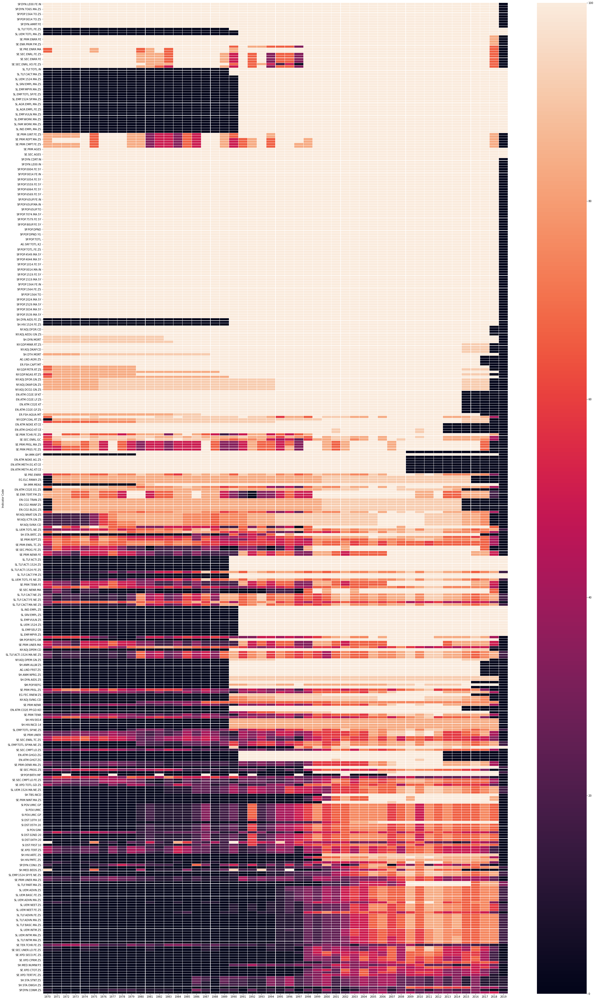

In [ ]:
plt.figure(figsize=(40, 70))
sns.heatmap(DataSetValuesByICode, cbar=True, linewidths=0.1,  vmin=0, vmax=100)
sns.set(font_scale=2.5)

Dataset total (todos los indicadores) ordenados por no Nulls ( primeros los con mayor cantidad de datos validos y ultimos los q tienen mayor cantidad de nulos)


## GÉNERO

1. ¿Cuántos **tipos de Features diferentes** existen por indicador considerado? ¿Todos los países mantienen esa misma cantidad para el mismo indicador?

In [ ]:
print("El indicador de género tiene " + str(len(gender["features"].unique())) + " features.")
print("El análisis se lleva a cabo consdierando " + str(len(gender["Country Name"].unique())) + " países.")
print(gender["Country Name"].unique())

El indicador de género tiene 83 features.
El análisis se lleva a cabo consdierando 12 países.
['Argentina' 'Brasil' 'Paraguay' 'Uruguay' 'Venezuela' 'Bolivia' 'Chile'
 'Colombia' 'Ecuador' 'Guyana' 'Perú' 'Suriname']


In [ ]:
countries = gender['Country Name'].unique()

for countries in countries:
    
    print("La cantidad de features que posee " + str(countries) + ": " + str(gender[gender['Country Name']==countries]['features'].count()) )

La cantidad de features que posee Argentina: 83
La cantidad de features que posee Brasil: 83
La cantidad de features que posee Paraguay: 83
La cantidad de features que posee Uruguay: 83
La cantidad de features que posee Venezuela: 83
La cantidad de features que posee Bolivia: 83
La cantidad de features que posee Chile: 83
La cantidad de features que posee Colombia: 83
La cantidad de features que posee Ecuador: 83
La cantidad de features que posee Guyana: 83
La cantidad de features que posee Perú: 83
La cantidad de features que posee Suriname: 83


### Análisis por Feature para toda la Región

---



2.  ¿Cuál es la **proporción de valores nulos** para cada Feature dentro de cada Indicador con respecto al intervalo temporal considerado? ¿Estos valores nulos se encuentran dispersos a lo largo de todo el intervalo temporal o existen agrupamientos (más chicos y/o más grandes) de los mismos? ¿Qué decisión se podría tomar con respecto a los mismos en un futuro?

In [ ]:
print("Los features de género que existen son los siguientes: \n", str(gender['features'].unique()))

Los features de género que existen son los siguientes: 
 ['Supervivencia hasta los 65 años, varones (% de la cohorte)'
 'Supervivencia hasta los 65 años, mujeres (% de la cohorte)'
 'Tasa de fertilidad, total (nacimientos por cada mujer)'
 'Esperanza de vida al nacer, varones (años)'
 'Esperanza de vida al nacer, mujeres (años)'
 'Prevalencia de uso de métodos anticonceptivos (% de mujeres entre 15 y 49 años)'
 'Tasa de mortalidad, adultos, varones (por cada 1.000 varones adultos)'
 'Tasa de mortalidad, adultos, mujeres (por cada 1.000 mujeres adultas)'
 'Tasa de fertilidad en adolescentes (nacimientos por cada 1.000 mujeres entre 15 y 19 años de edad)'
 'Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)'
 'Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)'
 'Desempleo, varones jóvenes (% de la población activa masculina entre 15 y 24 años de edad) (estimación modelado OIT)'
 'Desempleo, mujeres jóvenes (% de la población a

Para llevar a cabo el análisis de los datos nulos, se construye una matriz por feature y por año en la que se muestra el porcentaje de registros existentes para cada combinación considerando toda la región.

In [ ]:
GenderValuesByICode = gender.groupby("Indicator Code").count().drop(["Country Code", "Country Name", "Indicator", "features"], axis=1)
GenderValuesByICode["Valor"] = GenderValuesByICode.sum(axis=1)
GenderValuesByICode = GenderValuesByICode.sort_values(by=['Valor'], ascending=False)
GenderValuesByICode = ((GenderValuesByICode/12)*100).drop(columns = ["Valor"])
GenderValuesByICode = GenderValuesByICode.rename(columns = lambda x : str(x)[:4])
round(GenderValuesByICode,2)


,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Indicator Code,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SP.DYN.TO65.MA.ZS,100.00,100.0,100.0,100.0,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.0,100.0,100.00,100.00,100.0,100.00,100.0,100.00,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,0.00
SP.DYN.TO65.FE.ZS,100.00,100.0,100.0,100.0,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.0,100.0,100.00,100.00,100.0,100.00,100.0,100.00,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,0.00
SP.DYN.TFRT.IN,100.00,100.0,100.0,100.0,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.0,100.0,100.00,100.00,100.0,100.00,100.0,100.00,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,0.00
SP.DYN.LE00.MA.IN,100.00,100.0,100.0,100.0,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.0,100.0,100.00,100.00,100.0,100.00,100.0,100.00,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,0.00
SP.DYN.LE00.FE.IN,100.00,100.0,100.0,100.0,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.0,100.0,100.00,100.00,100.0,100.00,100.0,100.00,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SE.PRM.NINT.MA.ZS,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.00,8.33,25.00,16.67,33.33,41.67,33.33,33.33,50.00,50.00,66.67,50.0,41.67,50.00,66.67,66.67,58.33,50.00,58.33,50.00,58.33,41.67,0.00
SE.PRM.NINT.FE.ZS,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.00,0.00,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.00,8.33,25.00,16.67,33.33,41.67,33.33,33.33,50.00,50.00,66.67,50.0,41.67,50.00,66.67,66.67,58.33,50.00,58.33,50.00,58.33,41.67,0.00
SP.DYN.CONU.ZS,8.33,0.0,0.0,0.0,0.0,8.33,8.33,16.67,25.0,16.67,16.67,8.33,8.33,8.33,0.0,0.0,33.33,16.67,0.0,16.67,25.0,8.33,25.0,8.33,16.67,8.33,25.0,8.33,25.00,8.33,41.67,16.67,0.00,8.33,33.33,41.67,41.67,0.00,25.0,16.67,33.33,8.33,25.00,25.00,16.67,25.00,33.33,8.33,0.00,0.00


Se construye un mapa de calor para visualizar aquellas features con mayor porcentaje de registros, mientras mas oscuro el color menos proporción de registros hay para dicha combinación.

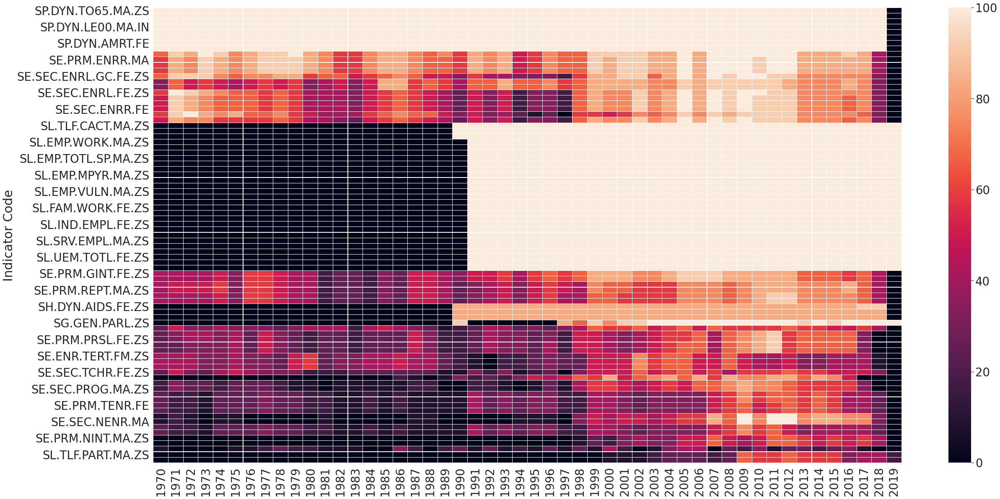

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(GenderValuesByICode, cbar=True, linewidths=0.1,  vmin=0, vmax=100)
#sns.set(font_scale=2.5)

Como puede observarse graficamente, durante el periodo de 1970 a 1990 se concentra la mayor cantidad de nulos.

In [ ]:
GenderByYear = pd.melt(gender.drop(["Country Code", "Country Name", "Indicator", "features"], axis=1), id_vars = ["Indicator Code"])
GenderByYear["variable"] = pd.to_numeric(GenderByYear["variable"] )
GenderByYear = GenderByYear.rename(columns = {"variable": "Year"})
TotalData_1990 = (GenderByYear["Year"]<=1990).sum()
WithData_1990 = ((GenderByYear["Year"]<=1990) & (GenderByYear["value"]>0)).sum()

print( "El % de registros sin datos para el período de 1970 a 1990 es de: " +  str(round((1 - (WithData_1990/TotalData_1990))*100,2)) + "%") 

TotalData_2019 = (GenderByYear["Year"]>1990).sum()
WithData_2019 = ((GenderByYear["Year"]>1990) & (GenderByYear["value"]>0)).sum()
Check = len (GenderByYear) == (TotalData_2019 + TotalData_1990 )


print( "El % de registros sin datos para el período de 1991 a 2019 es de: " +  str(round((1 - (WithData_2019/TotalData_2019))*100,2)) + "%") 


El % de registros sin datos para el período de 1970 a 1990 es de: 71.86%
El % de registros sin datos para el período de 1991 a 2019 es de: 26.41%


Se seleccionan en un principio los 30 features con mas datos en toda la región:

In [ ]:
GenderValuesByICode = GenderValuesByICode.reset_index()
GenderValuesByICode["features"] = GenderValuesByICode["Indicator Code"]
GenderValuesByICode["features"] = GenderValuesByICode["features"].map(gender.set_index("Indicator Code")["features"].to_dict())
FeaturesGenderSelection = GenderValuesByICode.iloc[0:30][["Indicator Code", "features"]].set_index("Indicator Code")
FeaturesGenderSelection

,features
Indicator Code,
SP.DYN.TO65.MA.ZS,"Supervivencia hasta los 65 años, varones (% de la cohorte)"
SP.DYN.TO65.FE.ZS,"Supervivencia hasta los 65 años, mujeres (% de la cohorte)"
SP.DYN.TFRT.IN,"Tasa de fertilidad, total (nacimientos por cada mujer)"
SP.DYN.LE00.MA.IN,"Esperanza de vida al nacer, varones (años)"
SP.DYN.LE00.FE.IN,"Esperanza de vida al nacer, mujeres (años)"
SP.DYN.AMRT.MA,"Tasa de mortalidad, adultos, varones (por cada 1.000 varones adultos)"
SP.DYN.AMRT.FE,"Tasa de mortalidad, adultos, mujeres (por cada 1.000 mujeres adultas)"
SP.ADO.TFRT,Tasa de fertilidad en adolescentes (nacimientos por cada 1.000 mujeres entre 15 y 19 años de edad)
SE.PRM.ENRL.FE.ZS,"Educación de nivel primario, alumnos (% de mujeres)"


En una primera instancia, dado que la dimensión en estudio es el género, se considera necesario seleccionar como variables de estudio aquellas que representen tanto la situación de los hombres como de las mujeres. Es decir, si se considera el indicador "Relación entre empleo y población, mayores de 15 años, mujeres (%)", entonces se seleccionará para el análisis la misma variable para hombres. Es por eso que se amplia la cantidad de features de punto de partida relevantes para abarcar ambos sexos.

In [ ]:
IDCodeSelection = GenderValuesByICode.iloc[0:30].reset_index()
IDCodeSelection = IDCodeSelection["Indicator Code"].to_list()
AddIDCode = ["SE.PRM.ENRL.MA.ZS", "SE.SEC.ENRL.GC.MA.ZS", "SL.TLF.TOTL.MA.ZS", "SL.EMP.WORK.FE.ZS", "SL.EMP.VULN.MA.ZS", "SE.SEC.ENRL.VO.MA.ZS", "SE.SEC.ENRL.MA.ZS"]
GenderIDCode =  IDCodeSelection + AddIDCode

GenderValues = GenderValuesByICode[GenderValuesByICode["Indicator Code"].isin(GenderIDCode)]

GenderValues = GenderValues.reset_index()
GenderValues["features"] = GenderValues["Indicator Code"]
GenderValues["features"] = GenderValues["features"].map(gender.set_index("Indicator Code")["features"].to_dict())
FeaturesGender = GenderValues[["Indicator Code", "features"]].set_index("Indicator Code")

print("Se agregaron "+ str(len(FeaturesGender)- len(FeaturesGenderSelection)) + " features al listado original. Quedando en total " + str(len(FeaturesGender)) + " features." )
FeaturesGender

Se agregaron 2 features al listado original. Quedando en total 32 features.


,features
Indicator Code,
SP.DYN.TO65.MA.ZS,"Supervivencia hasta los 65 años, varones (% de la cohorte)"
SP.DYN.TO65.FE.ZS,"Supervivencia hasta los 65 años, mujeres (% de la cohorte)"
SP.DYN.TFRT.IN,"Tasa de fertilidad, total (nacimientos por cada mujer)"
SP.DYN.LE00.MA.IN,"Esperanza de vida al nacer, varones (años)"
SP.DYN.LE00.FE.IN,"Esperanza de vida al nacer, mujeres (años)"
SP.DYN.AMRT.MA,"Tasa de mortalidad, adultos, varones (por cada 1.000 varones adultos)"
SP.DYN.AMRT.FE,"Tasa de mortalidad, adultos, mujeres (por cada 1.000 mujeres adultas)"
SP.ADO.TFRT,Tasa de fertilidad en adolescentes (nacimientos por cada 1.000 mujeres entre 15 y 19 años de edad)
SE.PRM.ENRL.FE.ZS,"Educación de nivel primario, alumnos (% de mujeres)"


### Análisis por País para cada Feature

4. Volviendo a los resultados del punto 2, elegir como mínimo 15 Features por Indicador con al menos el 50% de valores no nulos (y en lo posible los mismos para todos los países) y mostrar gráficamente, con gráficos de distribución o de cajas por ejemplo, la distribución de los mismos. ¿Qué se puede observar de estas distribuciones? ¿Son normales? ¿Qué sucede con los outliers? ¿Observan alguna similitud entre los features elegidos?. Para estos mismos 15 Features realizar el gráfico de línea de su serie temporal y analizarlo.

Se construye una matriz para determinar cuál es el porcentaje de registros con datos considerando las 32 features seleccionadas por país y año. Es decir, por ejemplo, para Chile en el año 1970 el 65.6% de los features tiene valores.

In [ ]:
RelevantFeaturesGender = gender[gender["Indicator Code"].isin(GenderIDCode)]
GenderDataByCountry = RelevantFeaturesGender.groupby("Country Name").count().drop(["features", "Indicator", "Country Code", "Indicator Code"], axis=1)
GenderDataByCountry["Valor"] = GenderDataByCountry.sum(axis=1)
GenderDataByCountry = GenderDataByCountry.sort_values(by=['Valor'], ascending=False)
GenderDataByCountry = ((GenderDataByCountry/len(RelevantFeaturesGender["Indicator Code"].unique()))*100).drop(columns = ["Valor"])
GenderDataByCountry = GenderDataByCountry.rename(columns = lambda x : str(x)[:4])
round(GenderDataByCountry,2)

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Country Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Chile,65.62,65.62,65.62,65.62,59.38,59.38,65.62,65.62,65.62,65.62,59.38,59.38,59.38,59.38,65.62,65.62,65.62,25.00,34.38,65.62,75.00,100.00,100.00,100.00,68.75,65.62,78.12,71.88,100.00,100.00,100.00,59.38,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,59.38,34.38
Ecuador,25.00,65.62,59.38,65.62,65.62,65.62,65.62,65.62,65.62,65.62,65.62,65.62,50.00,65.62,65.62,65.62,65.62,65.62,65.62,25.00,34.38,59.38,59.38,100.00,81.25,81.25,93.75,78.12,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,78.12,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,34.38
Colombia,59.38,59.38,59.38,53.12,53.12,59.38,53.12,59.38,59.38,59.38,59.38,59.38,59.38,65.62,65.62,65.62,65.62,65.62,65.62,65.62,46.88,93.75,93.75,93.75,71.88,87.50,100.00,59.38,93.75,93.75,93.75,81.25,100.00,59.38,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,93.75,93.75,93.75,93.75,93.75,93.75,93.75,34.38
Argentina,65.62,65.62,65.62,65.62,65.62,65.62,65.62,65.62,59.38,59.38,59.38,65.62,65.62,50.00,65.62,65.62,65.62,65.62,65.62,25.00,46.88,71.88,59.38,59.38,59.38,59.38,93.75,93.75,100.00,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,96.88,59.38,34.38
Venezuela,25.00,65.62,65.62,65.62,65.62,65.62,46.88,40.62,40.62,46.88,37.50,28.12,34.38,40.62,65.62,65.62,65.62,65.62,65.62,65.62,40.62,100.00,100.00,100.00,65.62,65.62,81.25,81.25,59.38,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,59.38,34.38
Paraguay,65.62,65.62,59.38,65.62,37.50,59.38,59.38,65.62,65.62,37.50,37.50,37.50,46.88,37.50,37.50,50.00,65.62,65.62,65.62,65.62,75.00,100.00,81.25,96.88,100.00,93.75,100.00,93.75,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,59.38,59.38,59.38,78.12,59.38,59.38,34.38
Perú,65.62,50.00,50.00,50.00,50.00,50.00,50.00,65.62,59.38,65.62,65.62,62.50,62.50,25.00,25.00,62.50,25.00,25.00,25.00,25.00,34.38,96.88,71.88,78.12,59.38,96.88,59.38,59.38,96.88,96.88,96.88,96.88,96.88,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,34.38
Uruguay,59.38,59.38,59.38,59.38,46.88,40.62,40.62,37.50,65.62,65.62,40.62,40.62,28.12,40.62,40.62,46.88,46.88,40.62,40.62,46.88,50.00,81.25,81.25,78.12,100.00,100.00,81.25,78.12,100.00,100.00,100.00,100.00,100.00,93.75,100.00,100.00,100.00,100.00,100.00,100.00,100.00,81.25,81.25,81.25,81.25,81.25,81.25,100.00,59.38,34.38
Suriname,25.00,59.38,65.62,65.62,65.62,65.62,65.62,65.62,65.62,65.62,25.00,31.25,37.50,25.00,25.00,43.75,65.62,65.62,65.62,65.62,75.00,100.00,100.00,100.00,81.25,59.38,59.38,59.38,59.38,59.38,59.38,100.00,100.00,59.38,59.38,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,78.12,78.12,78.12,34.38


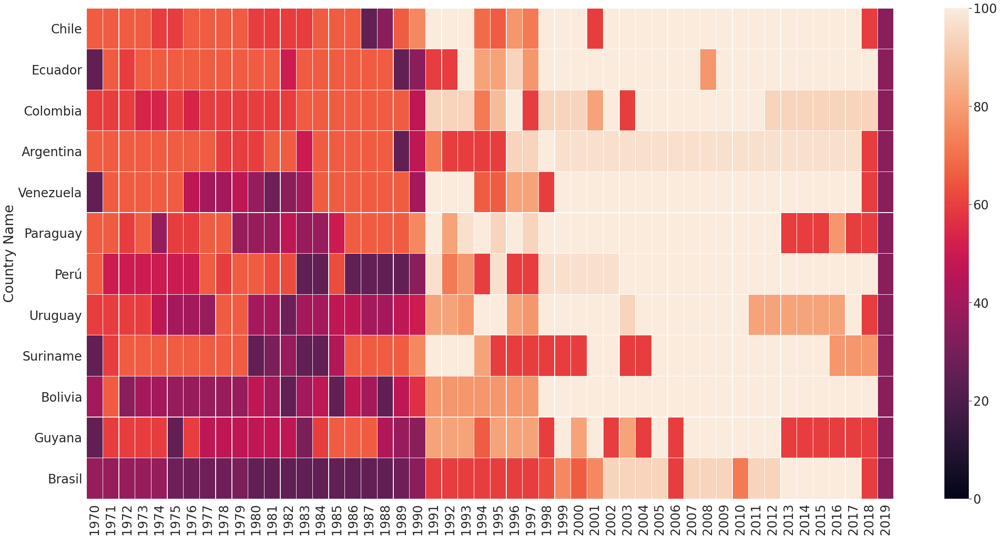

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(GenderDataByCountry, cbar=True, linewidths=.3, vmin=0, vmax=100)

Se realiza un heatmap considerando como centro el 50% de esta forma se puede visualizar cuáles son las combinaciones que tienen mas del 50% de registros con datos.

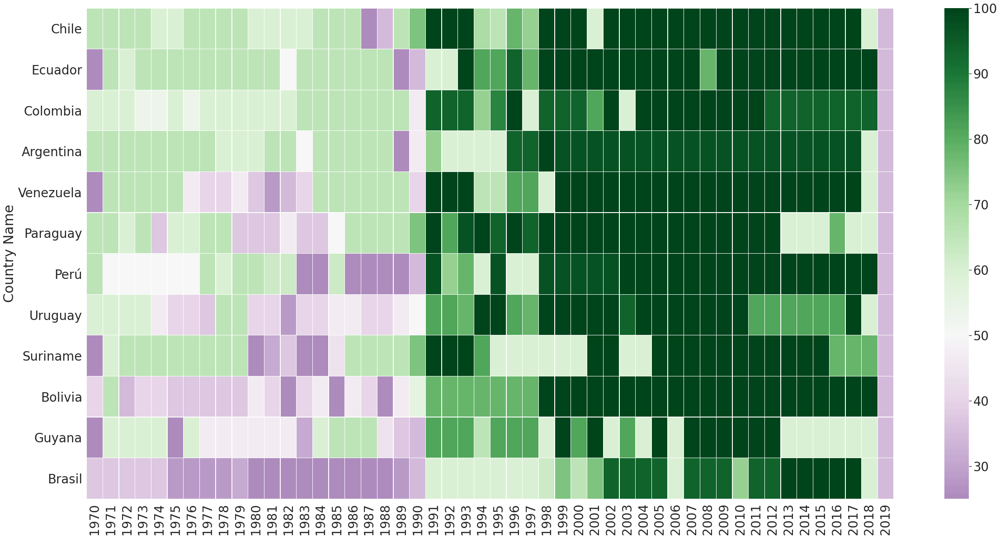

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(GenderDataByCountry, cbar=True, linewidths=.3, center=50, cmap="PRGn")

In [ ]:
print("El % de países que tienen más del 50% de los features con datos para cada año es: \n" + str(round((GenderDataByCountry[GenderDataByCountry>50].count()/len(gender["Country Name"].unique()))*100, 0).astype(int)))

El % de países que tienen más del 50% de los features con datos para cada año es: 
1970    50 
1971    83 
1972    75 
1973    75 
1974    58 
1975    58 
1976    58 
1977    58 
1978    67 
1979    58 
1980    42 
1981    42 
1982    33 
1983    25 
1984    50 
1985    58 
1986    67 
1987    58 
1988    50 
1989    42 
1990    33 
1991    100
1992    100
1993    100
1994    100
1995    100
1996    100
1997    100
1998    100
1999    100
2000    100
2001    100
2002    100
2003    100
2004    100
2005    100
2006    100
2007    100
2008    100
2009    100
2010    100
2011    100
2012    100
2013    100
2014    100
2015    100
2016    100
2017    100
2018    100
2019    0  
dtype: int64


In [ ]:
GenderByYear = pd.melt(RelevantFeaturesGender, id_vars = ["features", "Indicator" , "Country Name","Country Code", "Indicator Code"])
GenderByYear["variable"] = pd.to_numeric(GenderByYear["variable"] )
GenderByYear = GenderByYear.rename(columns = {"variable": "Year"})
GenderByYear["Year"] = GenderByYear["Year"].apply(lambda x: str(x)[:4])

GenderByYear

,features,Indicator,Country Name,Country Code,Indicator Code,Year,value
0,"Supervivencia hasta los 65 años, varones (% de la cohorte)",Gender,Argentina,ARG,SP.DYN.TO65.MA.ZS,1970,60.275267
1,"Supervivencia hasta los 65 años, mujeres (% de la cohorte)",Gender,Argentina,ARG,SP.DYN.TO65.FE.ZS,1970,75.508816
2,"Tasa de fertilidad, total (nacimientos por cada mujer)",Gender,Argentina,ARG,SP.DYN.TFRT.IN,1970,3.079000
3,"Esperanza de vida al nacer, varones (años)",Gender,Argentina,ARG,SP.DYN.LE00.MA.IN,1970,63.349000
4,"Esperanza de vida al nacer, mujeres (años)",Gender,Argentina,ARG,SP.DYN.LE00.FE.IN,1970,70.000000
...,...,...,...,...,...,...,...
19195,"Inscripción escolar, nivel preprimario, varones (% bruto)",Gender,Suriname,SUR,SE.PRE.ENRR.MA,2019,NaN
19196,"Inscripción escolar, nivel preprimario, mujeres (% bruto)",Gender,Suriname,SUR,SE.PRE.ENRR.FE,2019,NaN
19197,Proporción de inscripciones de mujeres con respecto a varones en la educación secundaria (%),Gender,Suriname,SUR,SE.ENR.SECO.FM.ZS,2019,NaN
19198,Proporción de niñas con respecto a niños en educación primaria y secundaria (%),Gender,Suriname,SUR,SE.ENR.PRSC.FM.ZS,2019,NaN


A partir de 1991, todos los paises en análisis tienen información para más del 50% de los features relevantes. Esto se evidencia en el heatmap, donde aquellas combinaciones con más del 50% de registros se muestran en diferentes tonalidades de verdes. Aquellas combinaciones que no alcanzan el 50% de los registros tienen diferentes tonalidades de violeta.

Se modifica la estructura del dataset para poder analizar el porcentaje de registros con datos por país, por feature y por año, para decidir qué features considerar para cada país.

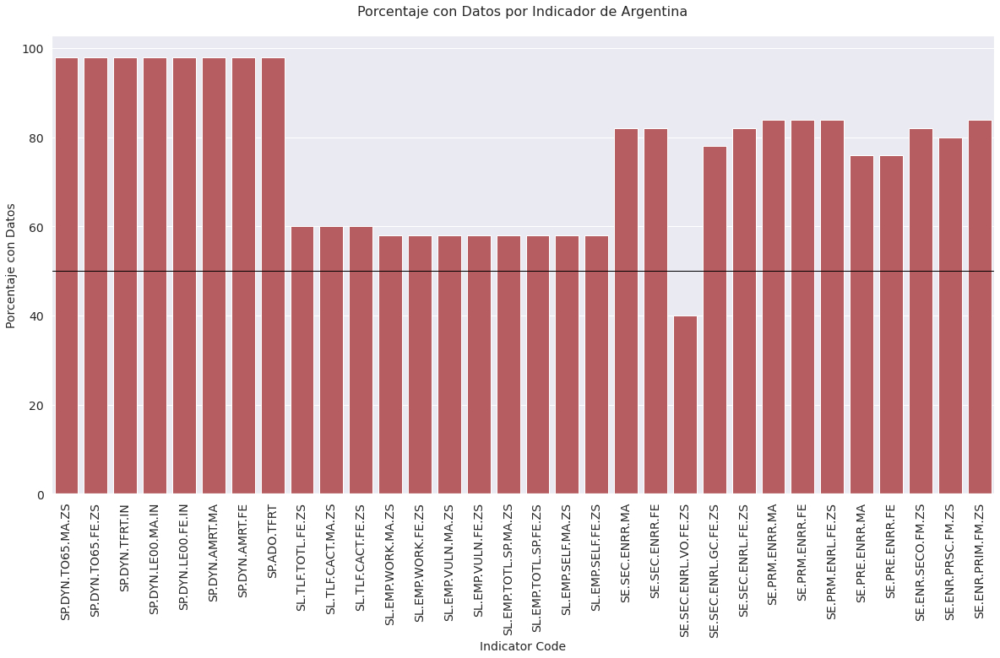

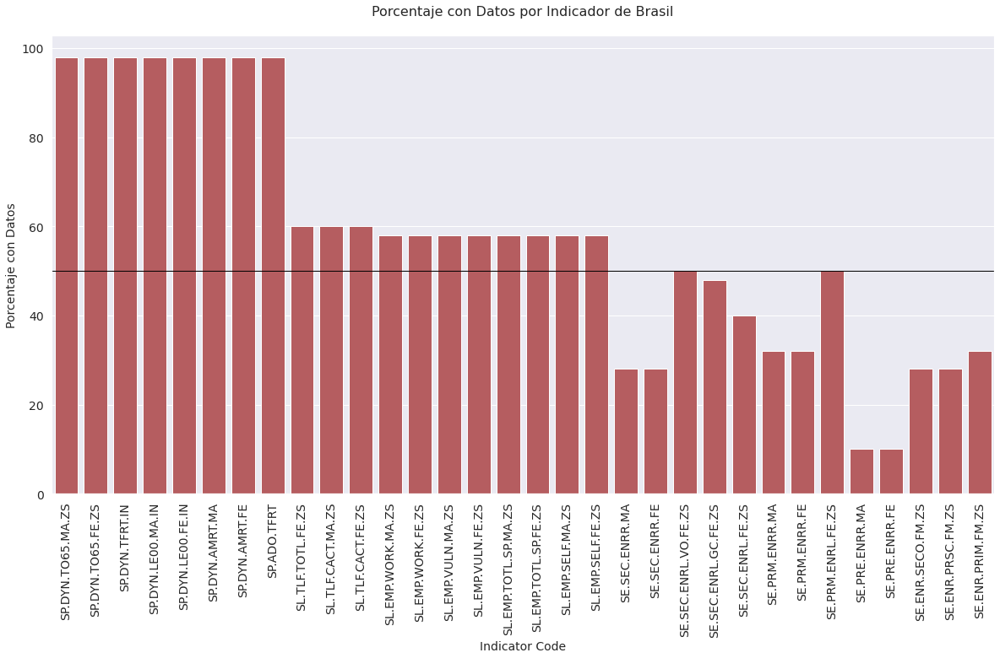

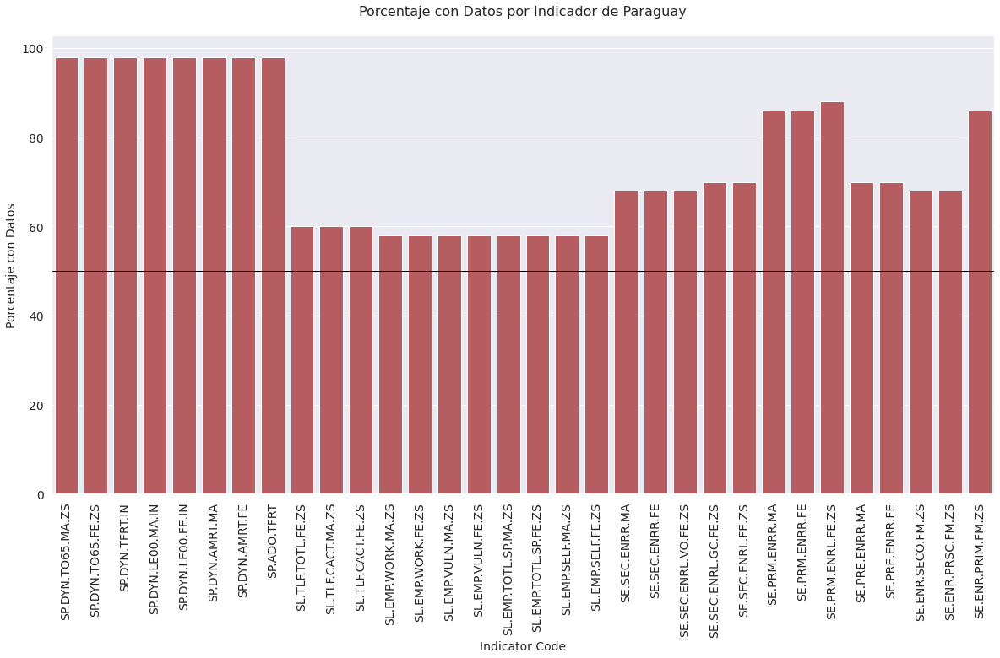

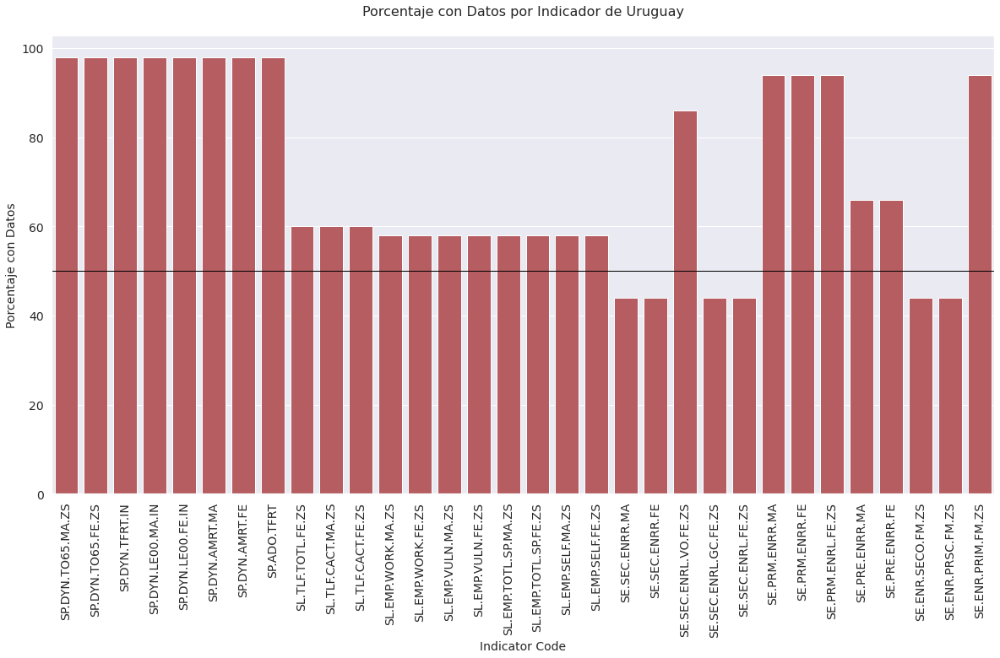

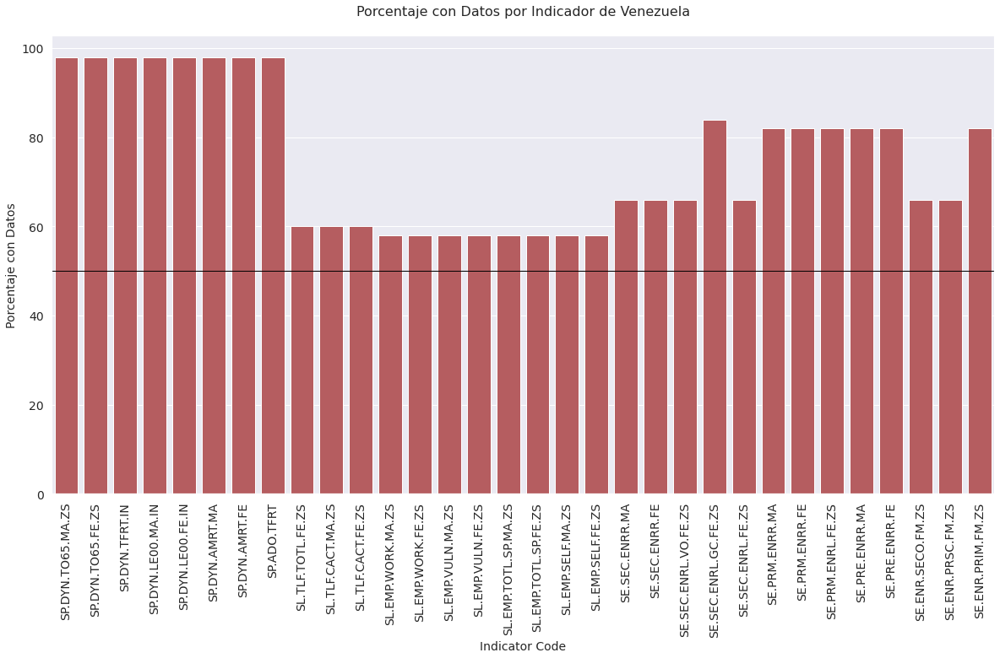

...

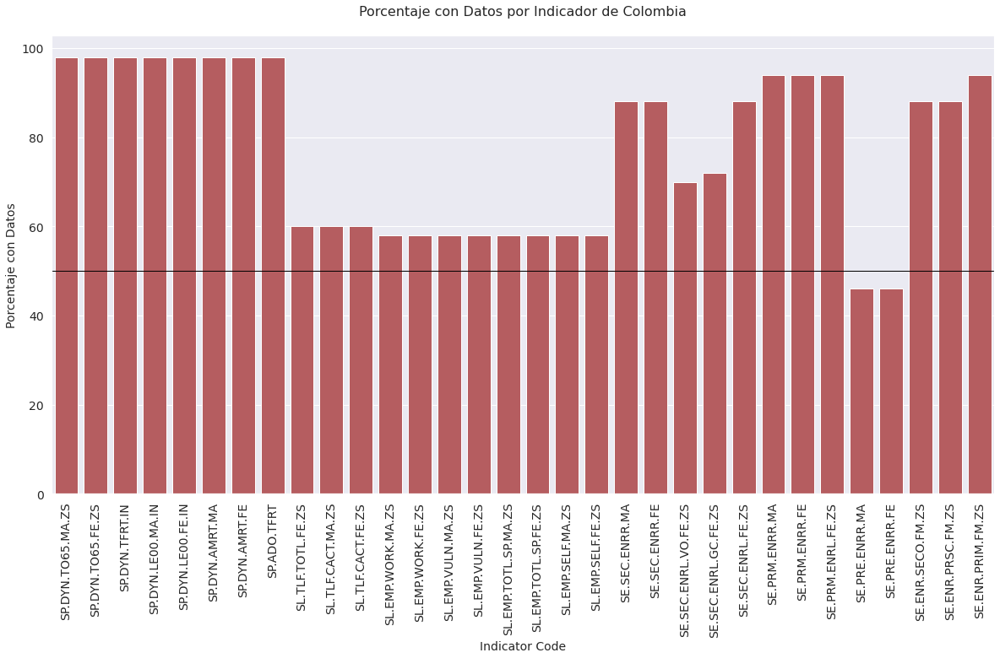

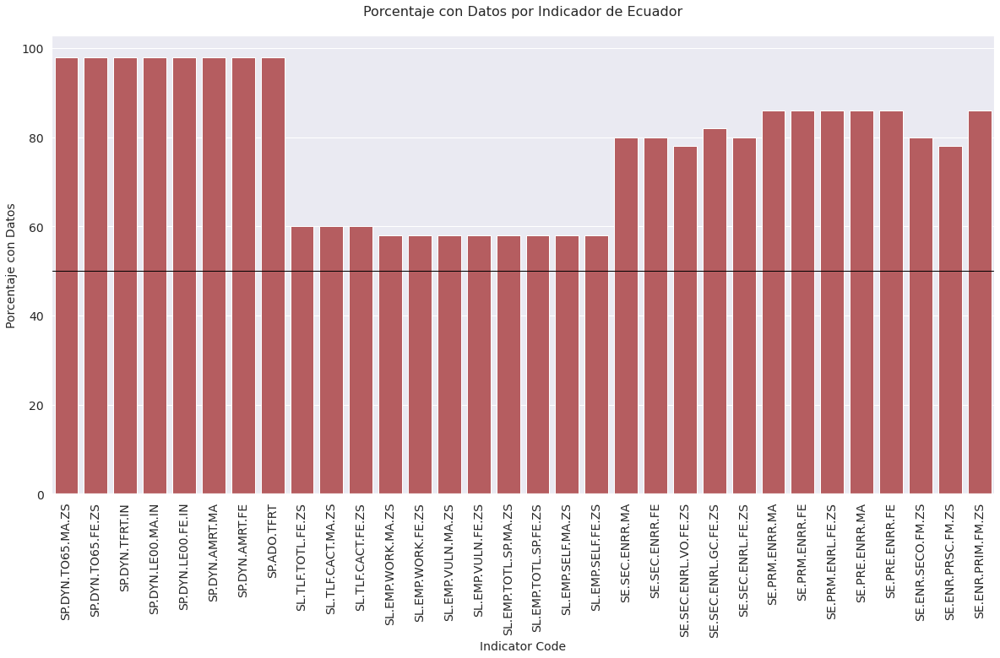

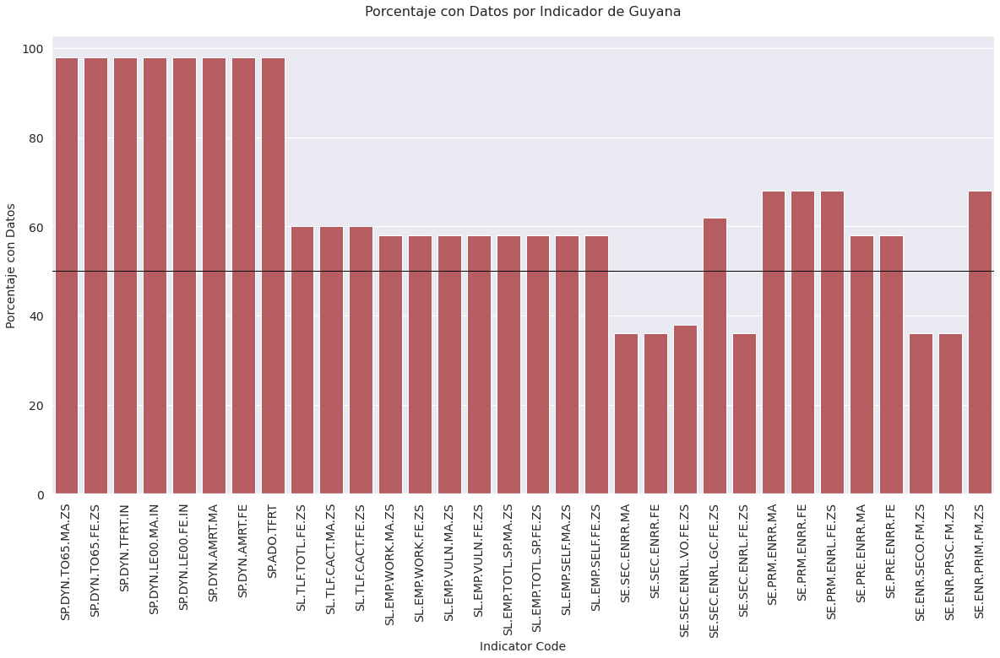

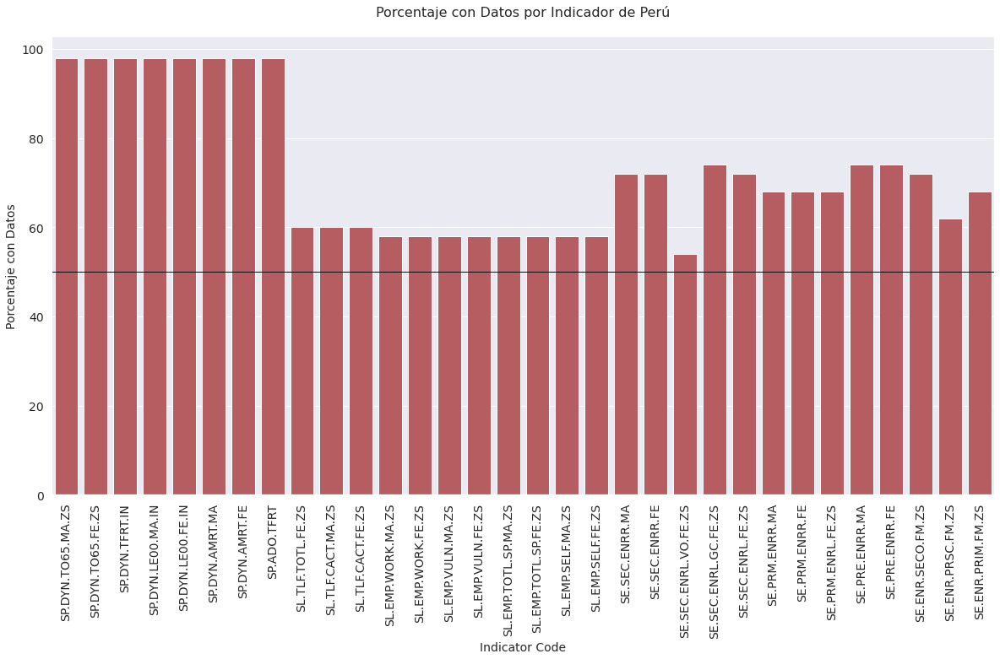

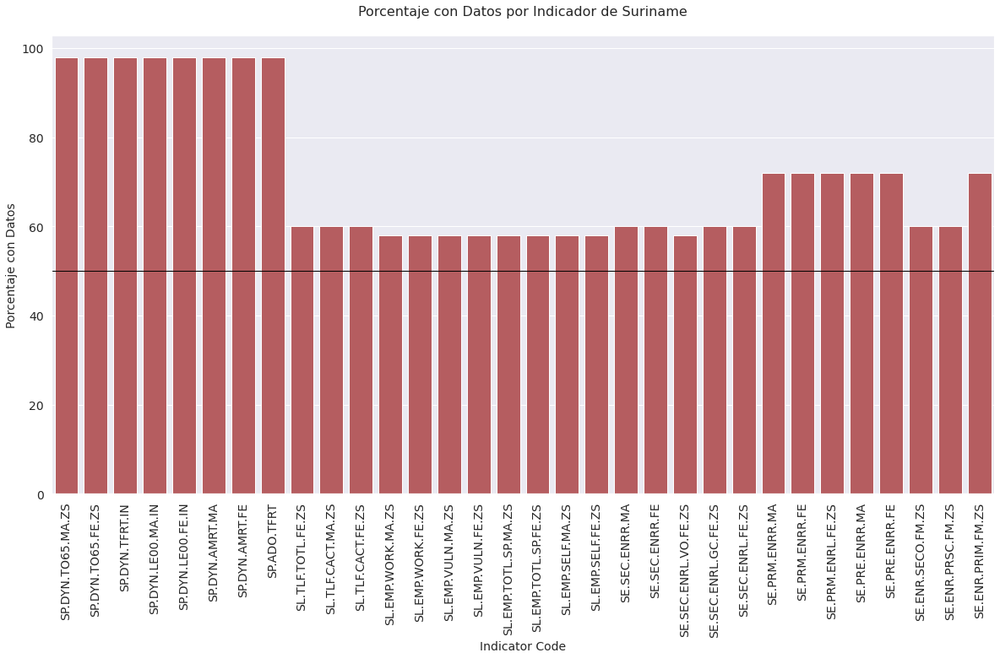

In [ ]:
GenderFeaturesByID = RelevantFeaturesGender.drop(["Country Code", "Indicator", "features"], axis=1)
GenderFeaturesByID = GenderFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
GenderFeaturesByID["Porcentaje de Registros"] = (GenderFeaturesByID.sum(axis=1)/50)*100
GenderFeaturesByID = GenderFeaturesByID["Porcentaje de Registros"].reset_index().sort_values(by='Indicator Code', ascending=False)

countries = gender['Country Name'].drop_duplicates().to_list()
for country in countries:
    plt.figure(figsize=(20, 10))
    sns.barplot(x="Indicator Code", y="Porcentaje de Registros", data=GenderFeaturesByID[GenderFeaturesByID["Country Name"]== country], color = "r")
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('Indicator Code', fontsize=14)
    plt.ylabel('Porcentaje con Datos', fontsize=14)
    plt.title("Porcentaje con Datos por Indicador de " + str(country) + "\n", fontsize=16)
    plt.axhline(y=50,linewidth=1, color='black')


In [ ]:
GenderFeaturesByID = RelevantFeaturesGender.drop(["Country Code", "Indicator", "features"], axis=1)
GenderFeaturesByID = GenderFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
GenderFeaturesByID["Porcentaje de Registros"] = (GenderFeaturesByID.sum(axis=1)/50)*100
GenderFeaturesByID["Mayor a 50%"] = GenderFeaturesByID["Porcentaje de Registros"]>50
GenderFeaturesByID = GenderFeaturesByID[["Porcentaje de Registros" , "Mayor a 50%"]].reset_index().sort_values(by='Indicator Code', ascending=False)
countries = gender['Country Name'].drop_duplicates()
GenderIDbyCountry = []
for country in countries:
       GenderIDbyCountry.append( GenderFeaturesByID.loc[GenderFeaturesByID["Country Name"]==country].iloc[0:15] )
GenderIDbyCountry

[   Country Name     Indicator Code  Porcentaje de Registros  Mayor a 50%
 31  Argentina    SP.DYN.TO65.MA.ZS  98.0                     True       
 30  Argentina    SP.DYN.TO65.FE.ZS  98.0                     True       
 29  Argentina    SP.DYN.TFRT.IN     98.0                     True       
 28  Argentina    SP.DYN.LE00.MA.IN  98.0                     True       
 27  Argentina    SP.DYN.LE00.FE.IN  98.0                     True       
 26  Argentina    SP.DYN.AMRT.MA     98.0                     True       
 25  Argentina    SP.DYN.AMRT.FE     98.0                     True       
 24  Argentina    SP.ADO.TFRT        98.0                     True       
 23  Argentina    SL.TLF.TOTL.FE.ZS  60.0                     True       
 22  Argentina    SL.TLF.CACT.MA.ZS  60.0                     True       
 21  Argentina    SL.TLF.CACT.FE.ZS  60.0                     True       
 20  Argentina    SL.EMP.WORK.MA.ZS  58.0                     True       
 19  Argentina    SL.EMP.WORK.FE.ZS  5

In [ ]:
GenderIDbyCountry = GenderIDbyCountry.copy()
GenderIDFeatures = GenderIDbyCountry[0]["Indicator Code"].unique()
GenderIDFeatures

array(['SP.DYN.TO65.MA.ZS', 'SP.DYN.TO65.FE.ZS', 'SP.DYN.TFRT.IN',
       'SP.DYN.LE00.MA.IN', 'SP.DYN.LE00.FE.IN', 'SP.DYN.AMRT.MA',
       'SP.DYN.AMRT.FE', 'SP.ADO.TFRT', 'SL.TLF.TOTL.FE.ZS',
       'SL.TLF.CACT.MA.ZS', 'SL.TLF.CACT.FE.ZS', 'SL.EMP.WORK.MA.ZS',
       'SL.EMP.WORK.FE.ZS', 'SL.EMP.VULN.MA.ZS', 'SL.EMP.VULN.FE.ZS'],
      dtype=object)

In [ ]:
                                                                                                 
print("Asignación de ID Code elegidos con su respectivo feature." )
gender[gender["Indicator Code"].isin(GenderIDFeatures)][["Indicator Code", "features"]].drop_duplicates().reset_index().drop(columns=["index"])

Asignación de ID Code elegidos con su respectivo feature.


,Indicator Code,features
0,SP.DYN.TO65.MA.ZS,"Supervivencia hasta los 65 años, varones (% de la cohorte)"
1,SP.DYN.TO65.FE.ZS,"Supervivencia hasta los 65 años, mujeres (% de la cohorte)"
2,SP.DYN.TFRT.IN,"Tasa de fertilidad, total (nacimientos por cada mujer)"
3,SP.DYN.LE00.MA.IN,"Esperanza de vida al nacer, varones (años)"
4,SP.DYN.LE00.FE.IN,"Esperanza de vida al nacer, mujeres (años)"
5,SP.DYN.AMRT.MA,"Tasa de mortalidad, adultos, varones (por cada 1.000 varones adultos)"
6,SP.DYN.AMRT.FE,"Tasa de mortalidad, adultos, mujeres (por cada 1.000 mujeres adultas)"
7,SP.ADO.TFRT,Tasa de fertilidad en adolescentes (nacimientos por cada 1.000 mujeres entre 15 y 19 años de edad)
8,SL.TLF.TOTL.FE.ZS,"Población activa, mujeres (% de la población activa total)"
9,SL.TLF.CACT.MA.ZS,"Tasa de población activa, varones (% de la población masculina mayor de 15 años) (estimación modelado OIT)"


#### Histograma por Feature para cada país

Para realizar los siguientes análisis, se construye un dataset que tenga solo las columnas relevantes de análisis y que solo considere los ID Features seleccionados en el paso anterior. 

In [ ]:
columns=gender.columns
GenderData=gender.drop(["Indicator", "Country Code", "features"], axis=1).rename(columns = lambda x : str(x)[:4] if x in columns[5:] else x)
GenderData=GenderData[GenderData["Indicator Code"].isin(GenderIDFeatures)]

In [ ]:
GenderDataMelt = pd.melt(GenderData, id_vars = ["Indicator Code" , "Country Name"])
GenderDataMelt["variable"] = pd.to_numeric(GenderDataMelt["variable"] )
GenderDataMelt = GenderDataMelt.rename(columns = {"variable": "Year"})
GenderDataMelt

,Indicator Code,Country Name,Year,value
0,SP.DYN.TO65.MA.ZS,Argentina,1970,60.275267
1,SP.DYN.TO65.FE.ZS,Argentina,1970,75.508816
2,SP.DYN.TFRT.IN,Argentina,1970,3.079000
3,SP.DYN.LE00.MA.IN,Argentina,1970,63.349000
4,SP.DYN.LE00.FE.IN,Argentina,1970,70.000000
...,...,...,...,...
8995,SL.TLF.CACT.FE.ZS,Suriname,2019,38.752998
8996,SL.EMP.WORK.MA.ZS,Suriname,2019,83.916000
8997,SL.EMP.WORK.FE.ZS,Suriname,2019,89.319000
8998,SL.EMP.VULN.MA.ZS,Suriname,2019,13.451000


Se crea un dataset por país

In [ ]:
GenderDataMelt = GenderDataMelt.copy()
arg=GenderDataMelt[GenderDataMelt["Country Name"]=="Argentina"]
bra=GenderDataMelt[GenderDataMelt["Country Name"]=="Brasil"]
ur=GenderDataMelt[GenderDataMelt["Country Name"]=="Uruguay"]
par=GenderDataMelt[GenderDataMelt["Country Name"]=="Paraguay"]
ven=GenderDataMelt[GenderDataMelt["Country Name"]=="Venezuela"]
bol=GenderDataMelt[GenderDataMelt["Country Name"]=="Bolivia"]
chi=GenderDataMelt[GenderDataMelt["Country Name"]=="Chile"]
guy=GenderDataMelt[GenderDataMelt["Country Name"]=="Guyana"]
sur=GenderDataMelt[GenderDataMelt["Country Name"]=="Suriname"]
col=GenderDataMelt[GenderDataMelt["Country Name"]=="Colombia"]
ecu=GenderDataMelt[GenderDataMelt["Country Name"]=="Ecuador"]
per=GenderDataMelt[GenderDataMelt["Country Name"]=="Perú"]

Se grafican los histogramas para cada ID Features

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:198: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in le

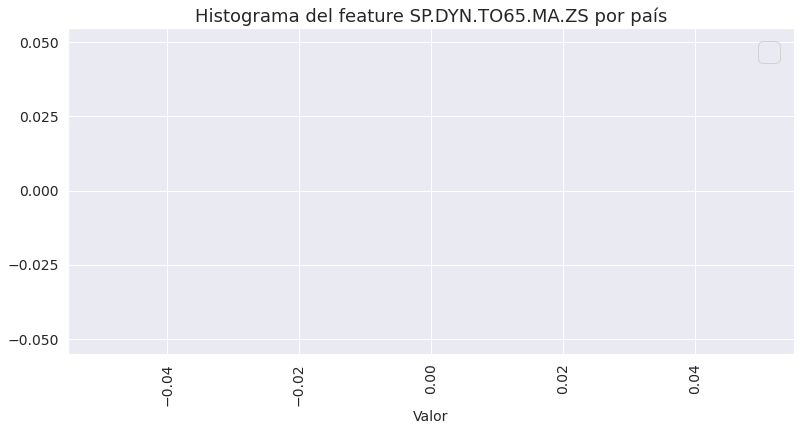

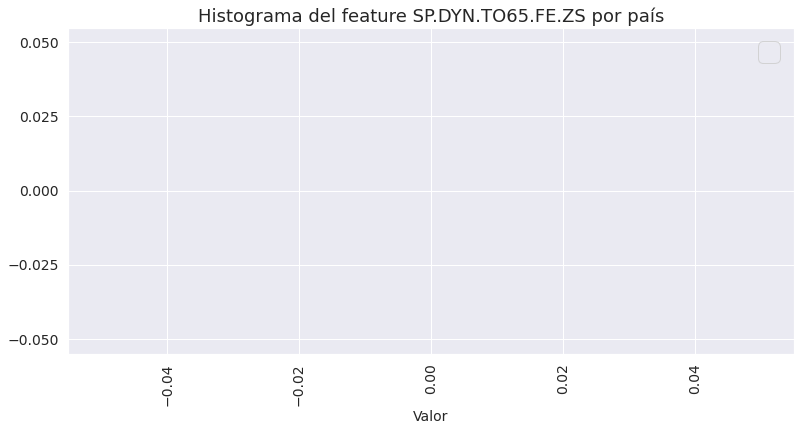

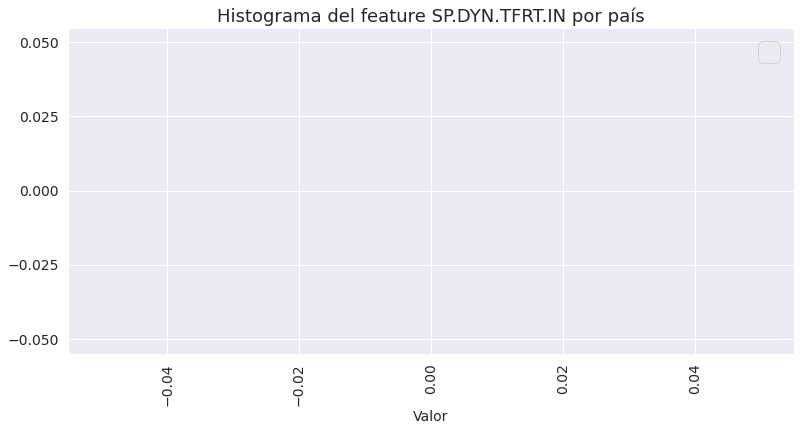

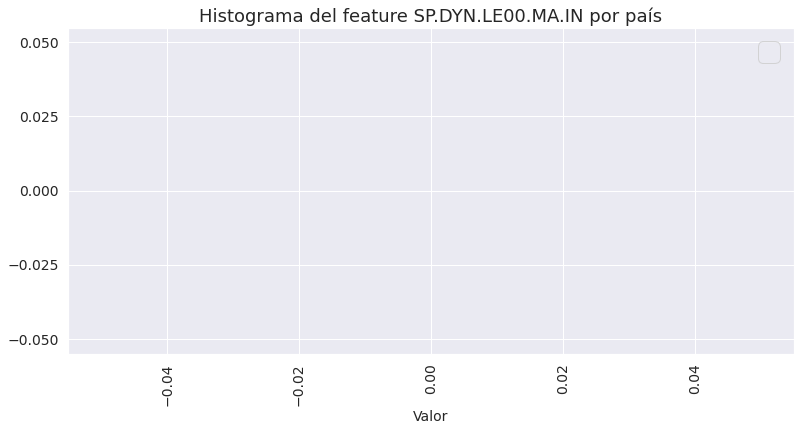

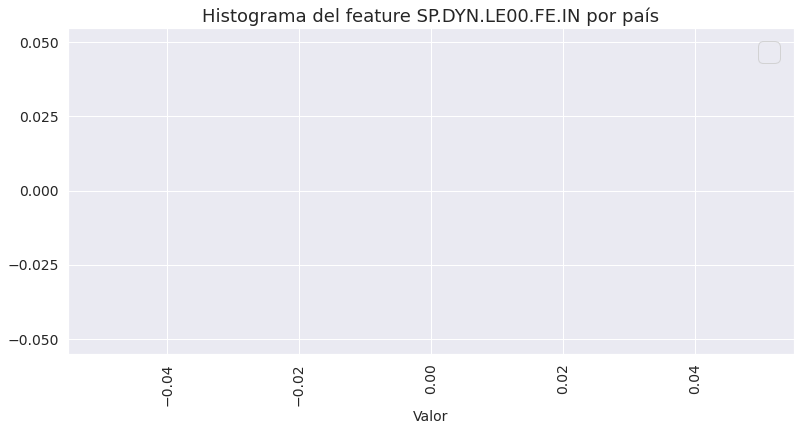

...

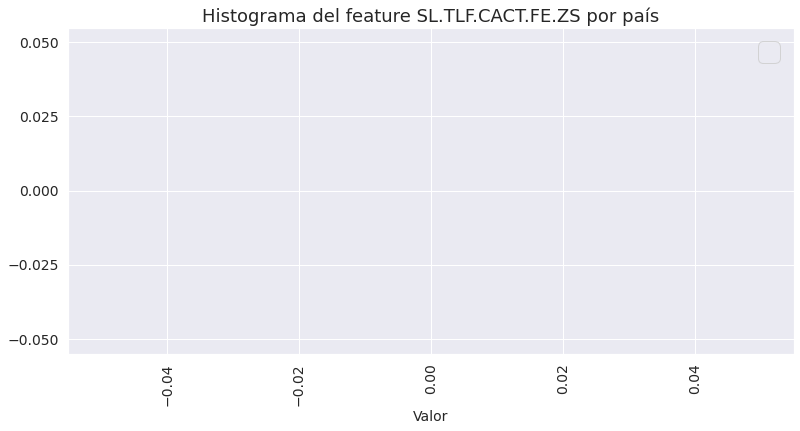

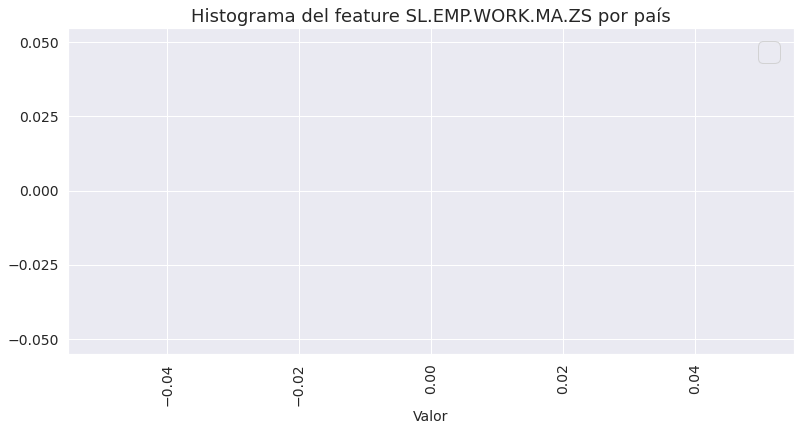

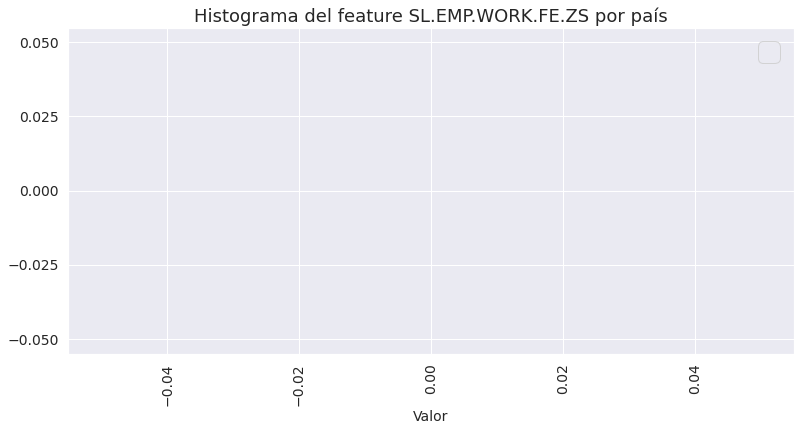

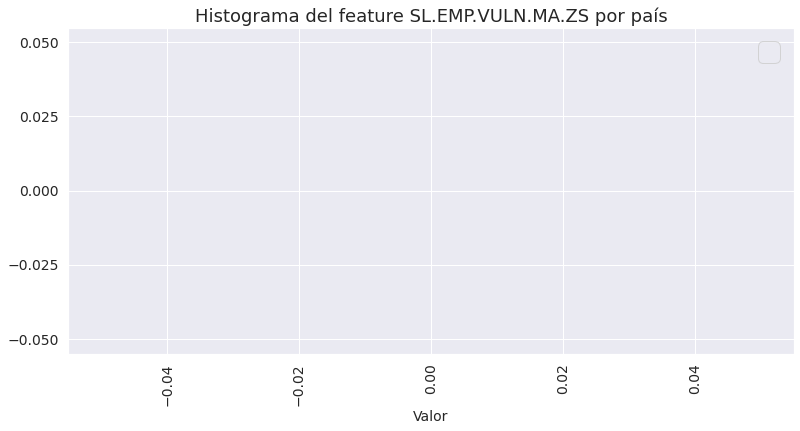

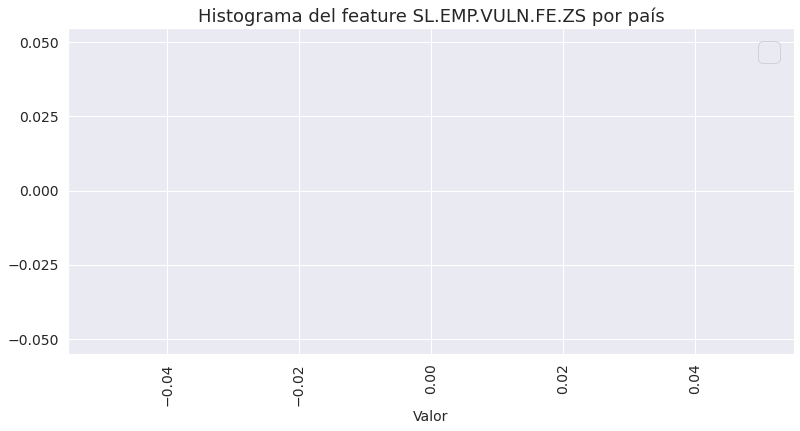

In [ ]:
GenderIDbyCountry = GenderIDbyCountry.copy()
GenderIDFeatures = GenderIDbyCountry[0]["Indicator Code"].unique()

for Features in GenderIDFeatures:
    plt.figure(figsize=(13,6))
    sns.distplot(arg[arg["Indicator Code"]==Features]["value"], label="arg", hist=False)
    sns.distplot(bra[bra["Indicator Code"]==Features]["value"], label="bra", hist=False)
    sns.distplot(ur[ur["Indicator Code"]==Features]["value"], label="ur", hist=False)
    sns.distplot(par[par["Indicator Code"]==Features]["value"], label="par", hist=False)
    sns.distplot(ven[ven["Indicator Code"]==Features]["value"], label="ven", hist=False)
    sns.distplot(bol[bol["Indicator Code"]==Features]["value"], label="bol", hist=False)
    sns.distplot(chi[chi["Indicator Code"]==Features]["value"], label="chi", hist=False)
    sns.distplot(guy[guy["Indicator Code"]==Features]["value"], label="guy", hist=False)
    sns.distplot(sur[sur["Indicator Code"]==Features]["value"], label="sur", hist=False)
    sns.distplot(col[col["Indicator Code"]==Features]["value"], label="col", hist=False)
    sns.distplot(ecu[ecu["Indicator Code"]==Features]["value"], label="ecu", hist=False)
    sns.distplot(per[per["Indicator Code"]==Features]["value"], label="per", hist=False)
    plt.title("Histograma del feature "+ str(Features) + " por país", fontsize=18)
    plt.legend( loc='upper right', borderaxespad=0.5)
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('Valor', fontsize=14)
  

    

Como puede evidenciarse en todos los histogramas, las distribuciones de cada feature en los diferentes países difiere bastante. Es decir, en la región cada uno de los features se distribuye diferente dependiendo del país que se analice. Es posible que con un análisis mas detallado de cada feature, se encuentren países donde la feature se distribuye similar.

#### BoxPlot por Feature

Para profundizar el análisis llevado a cabo hasta ahora, se construyen Box Plot para cada feature por país. 

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


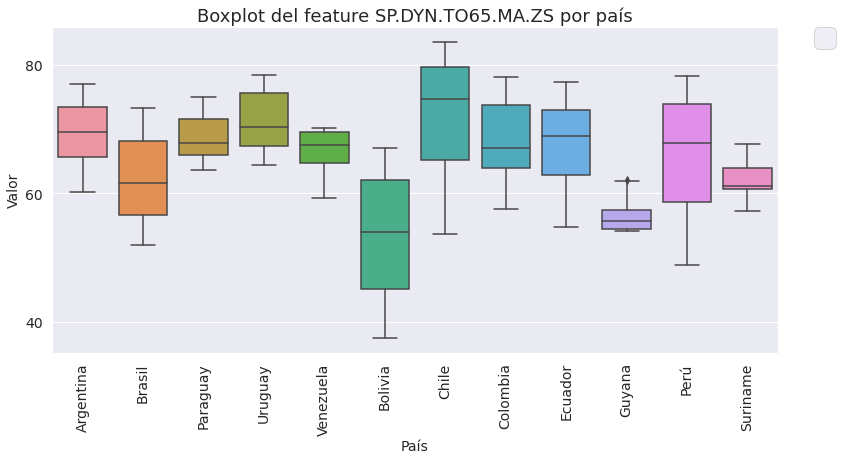

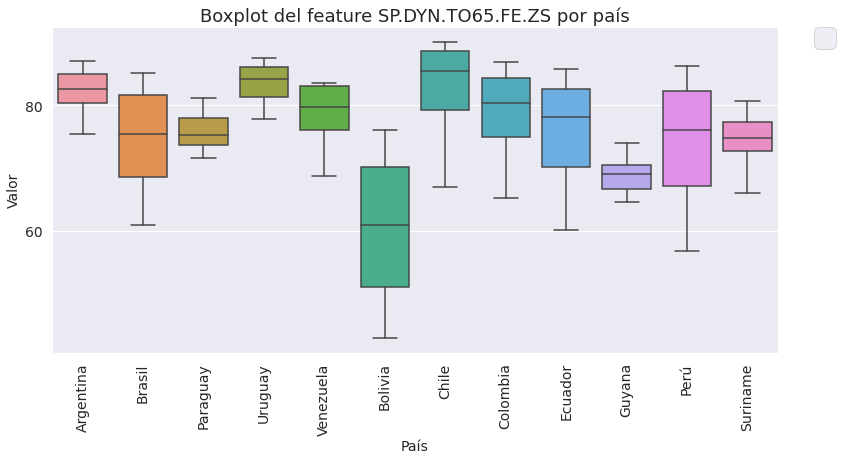

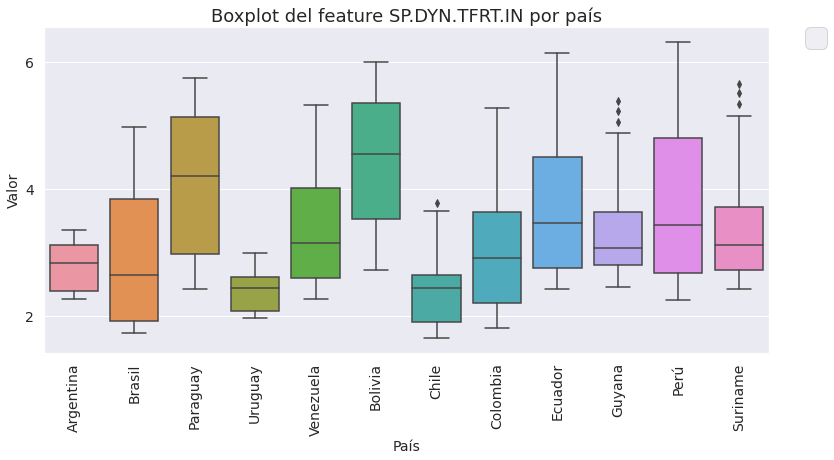

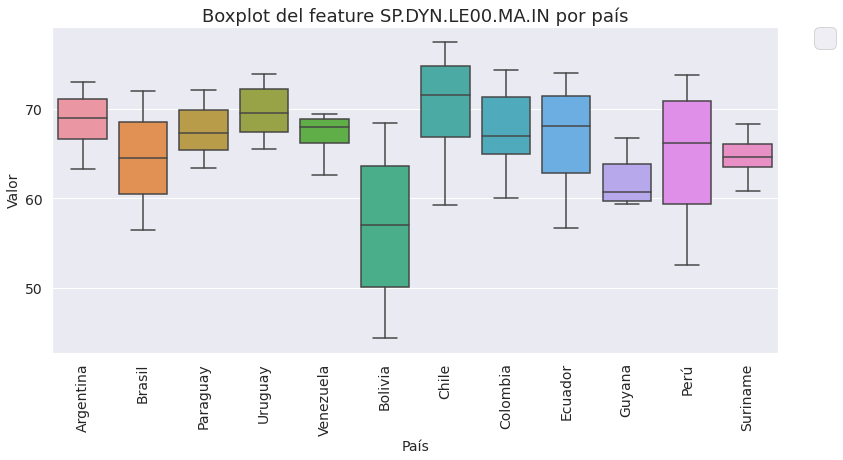

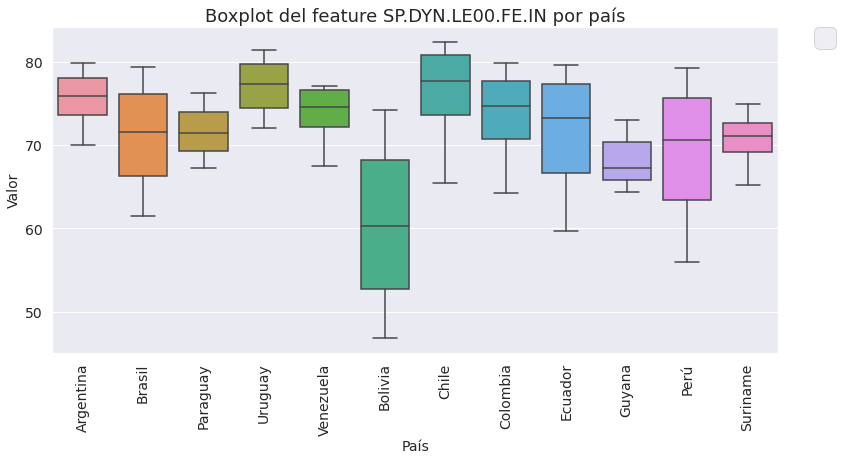

...

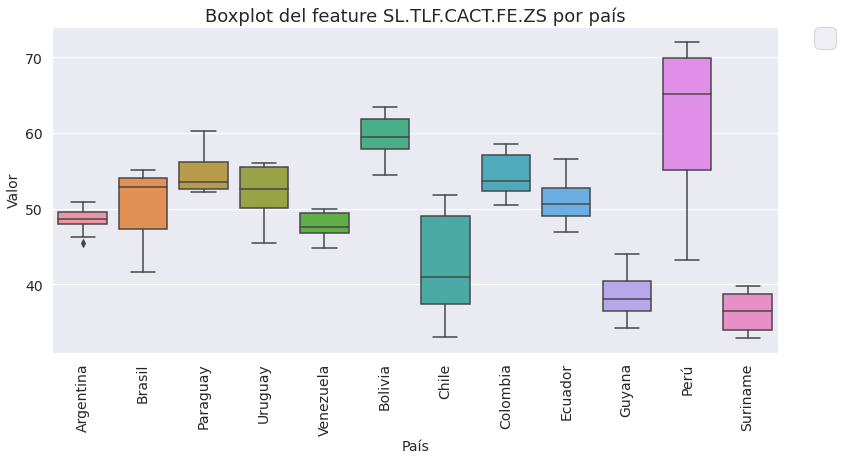

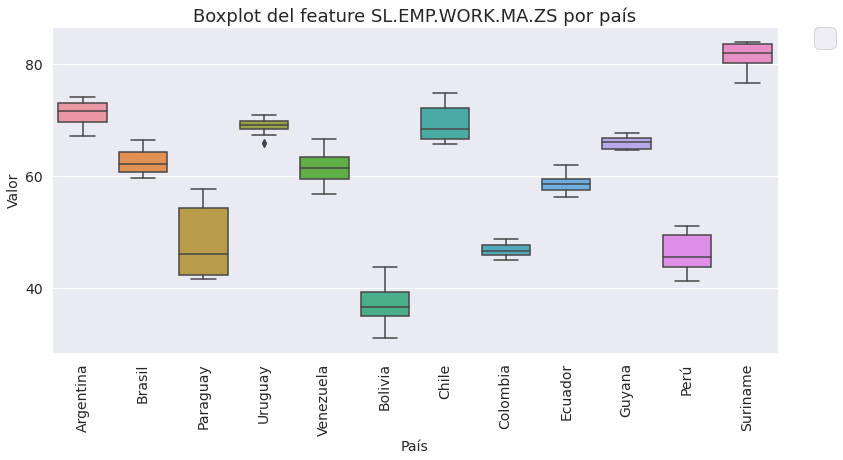

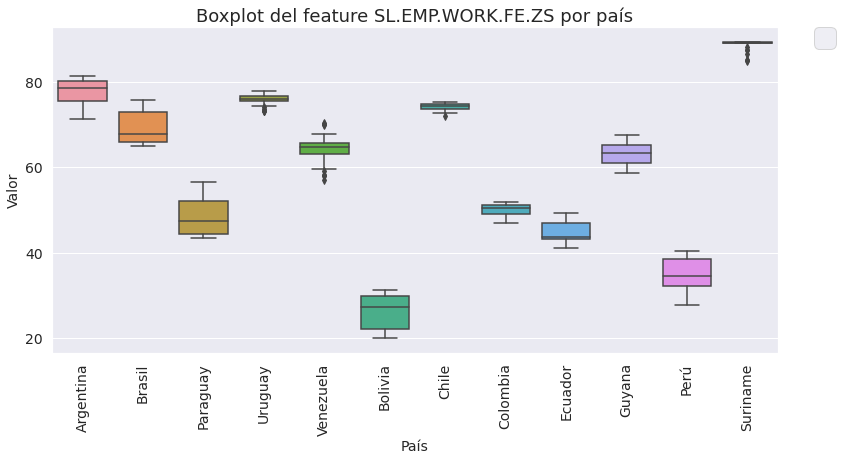

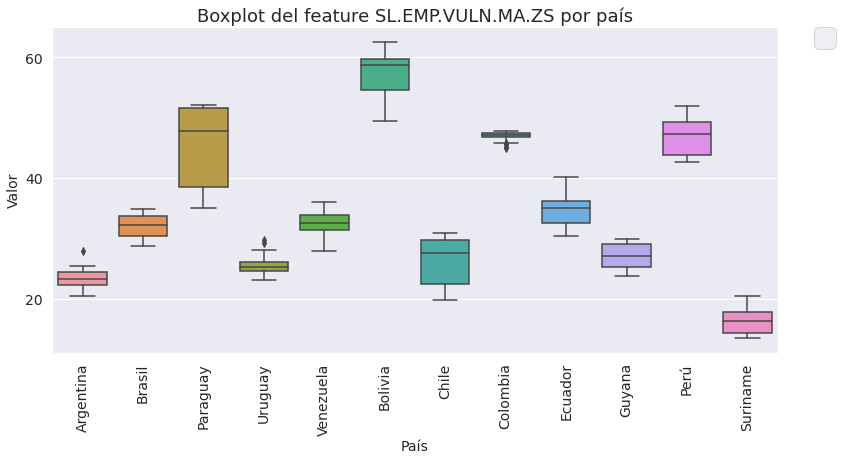

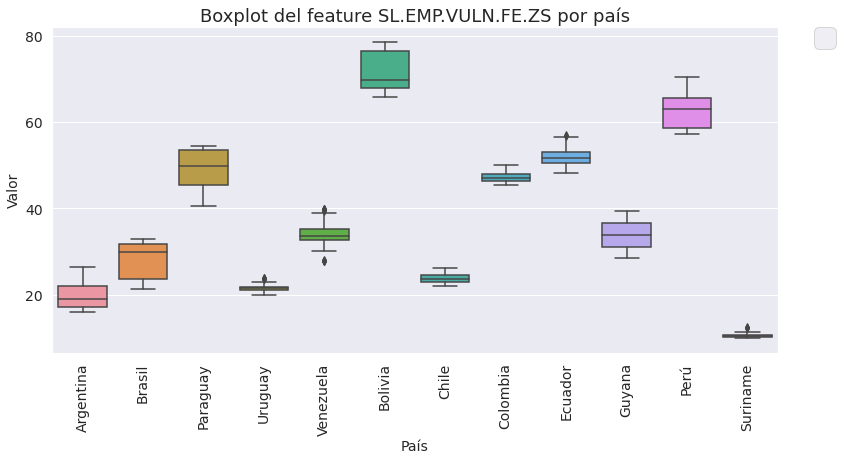

In [ ]:
GenderIDbyCountry = GenderIDbyCountry.copy()
GenderIDFeatures = GenderIDbyCountry[0]["Indicator Code"].unique()
GenderDataMelt = GenderDataMelt.copy()

for Features in GenderIDFeatures:
    plt.figure(figsize=(13,6))
    sns.boxplot(data=GenderDataMelt[GenderDataMelt["Indicator Code"]==Features], x="Country Name", y="value")
    plt.title("Boxplot del feature "+ str(Features) + " por país", fontsize=18)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('País', fontsize=14)
    plt.ylabel('Valor', fontsize=14)


#### Series Temporales de los Features por País

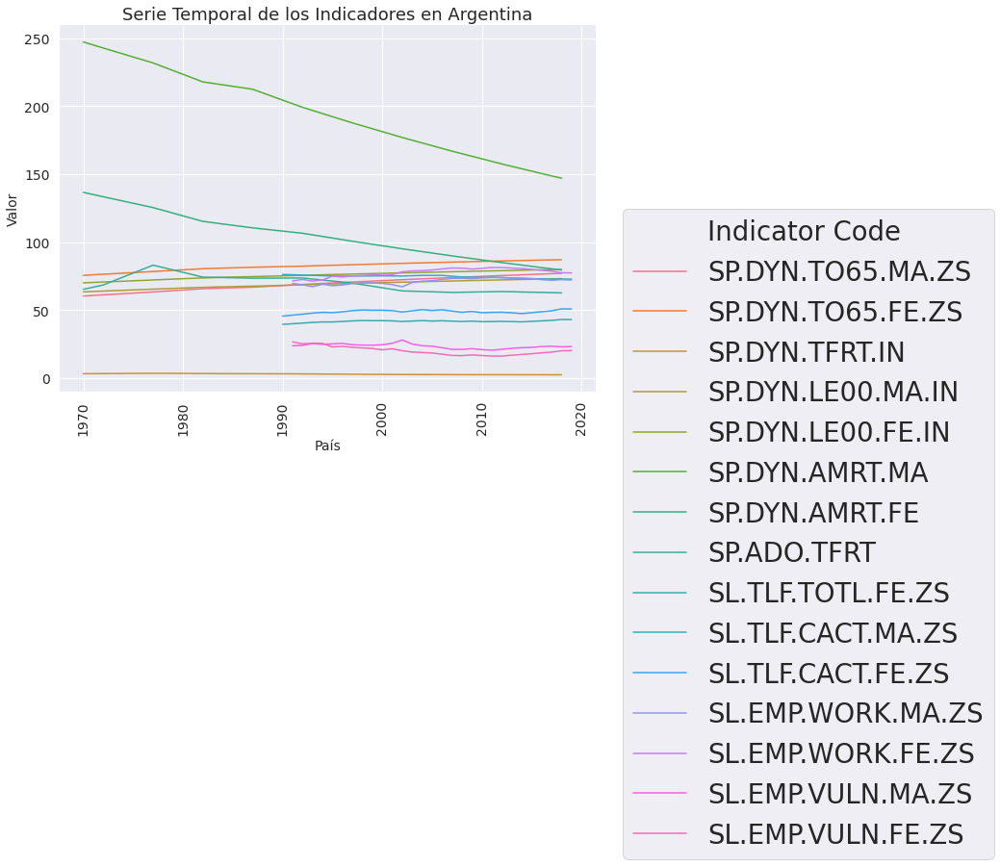

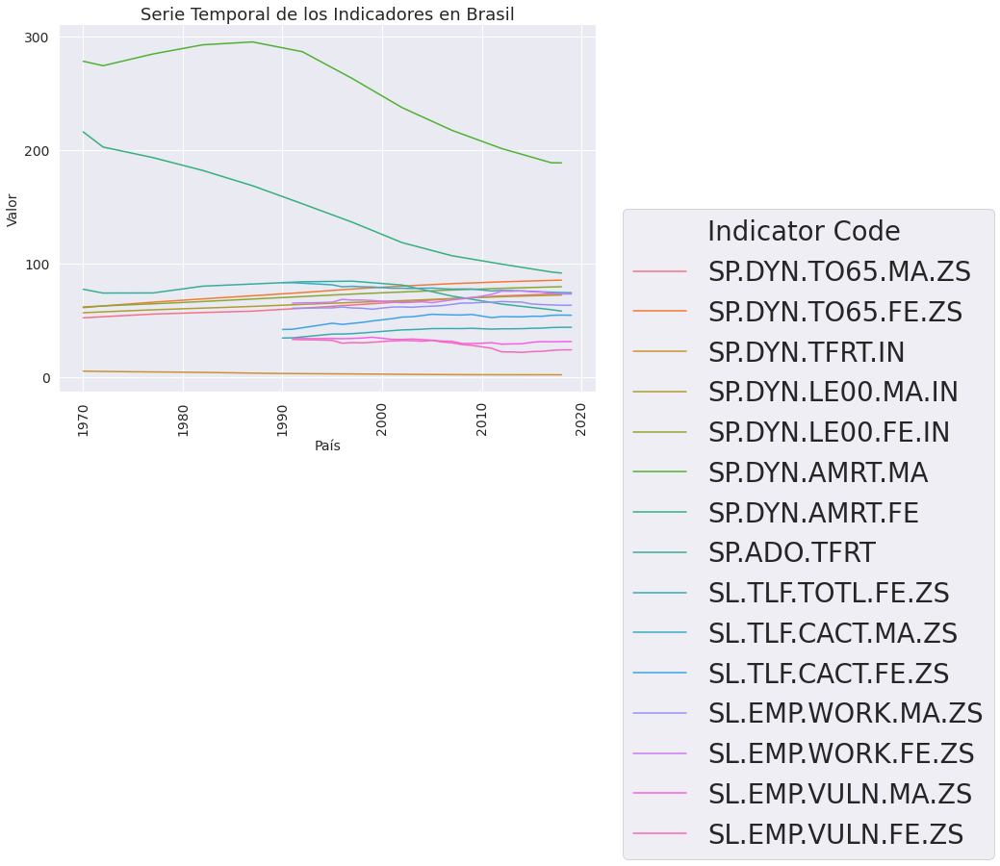

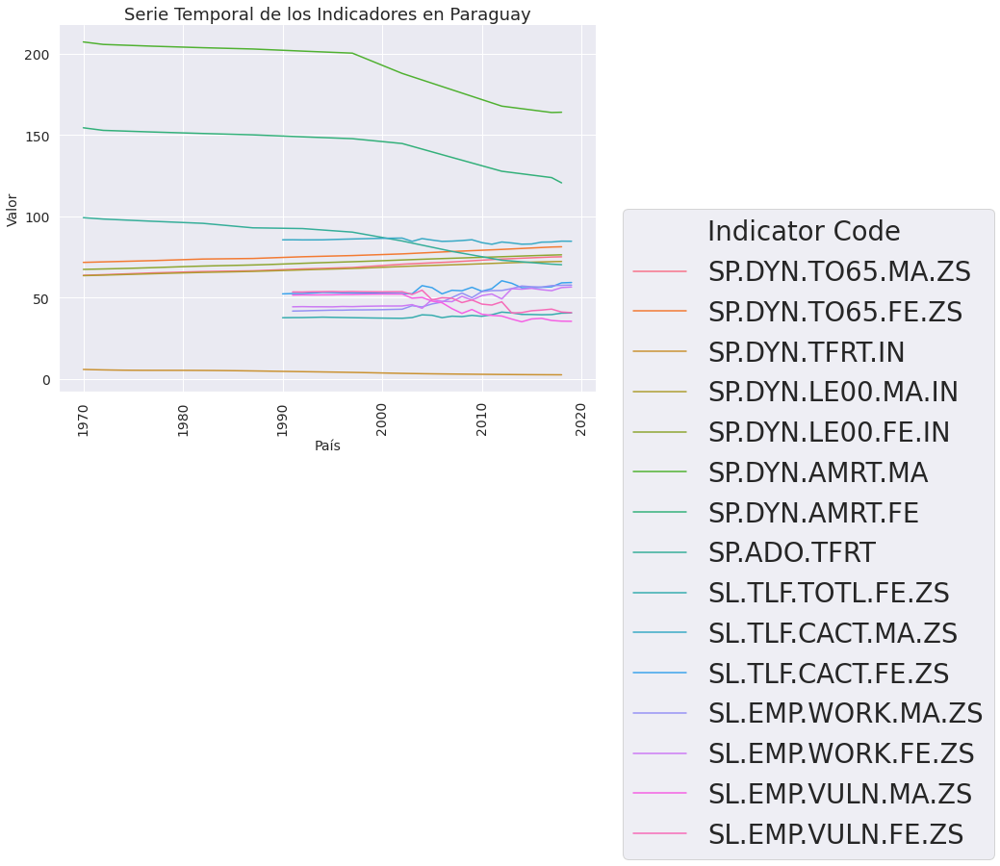

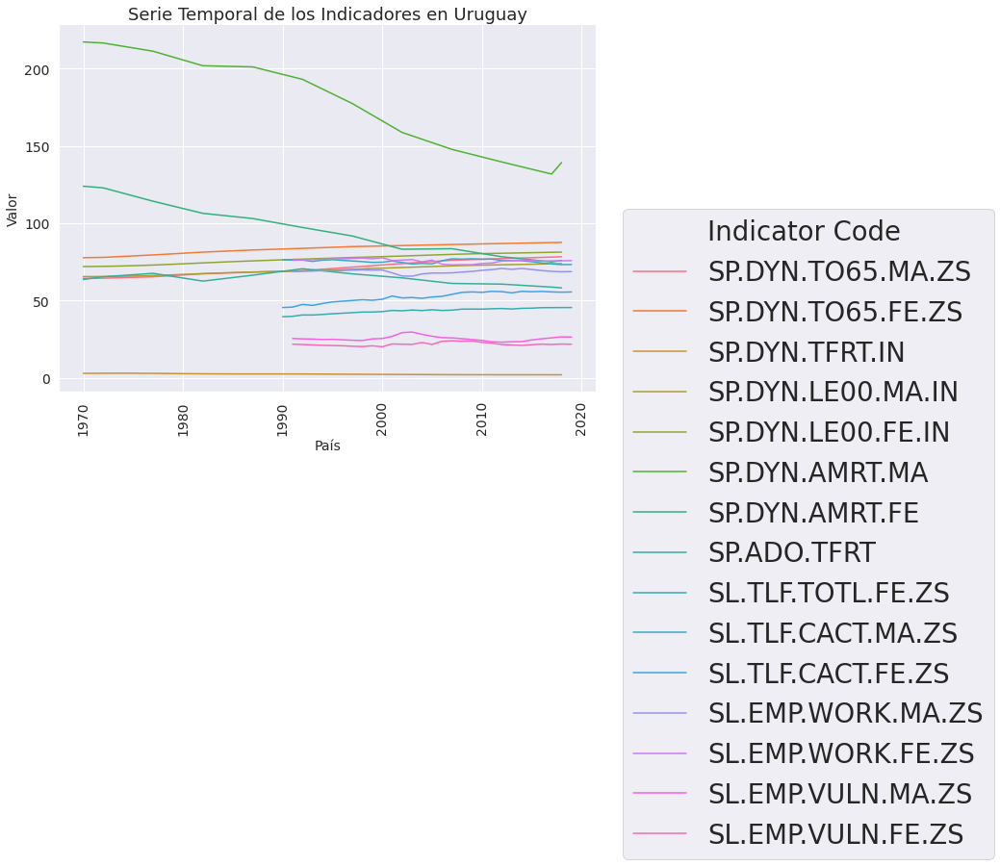

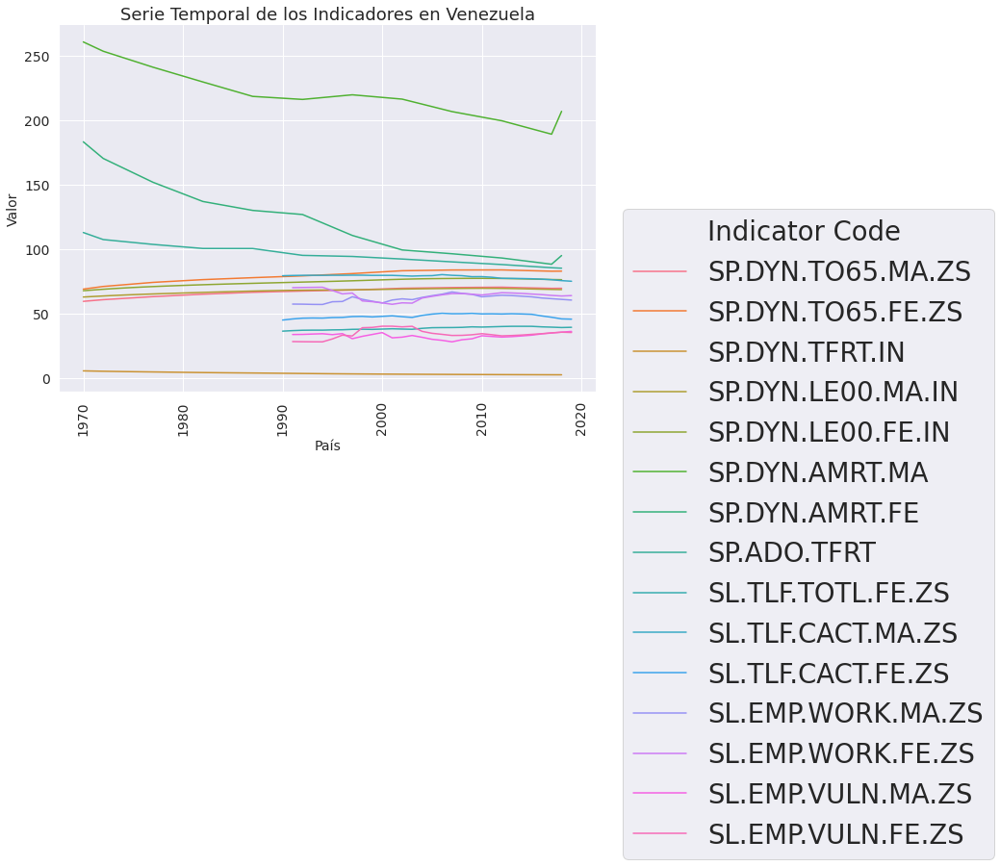

...

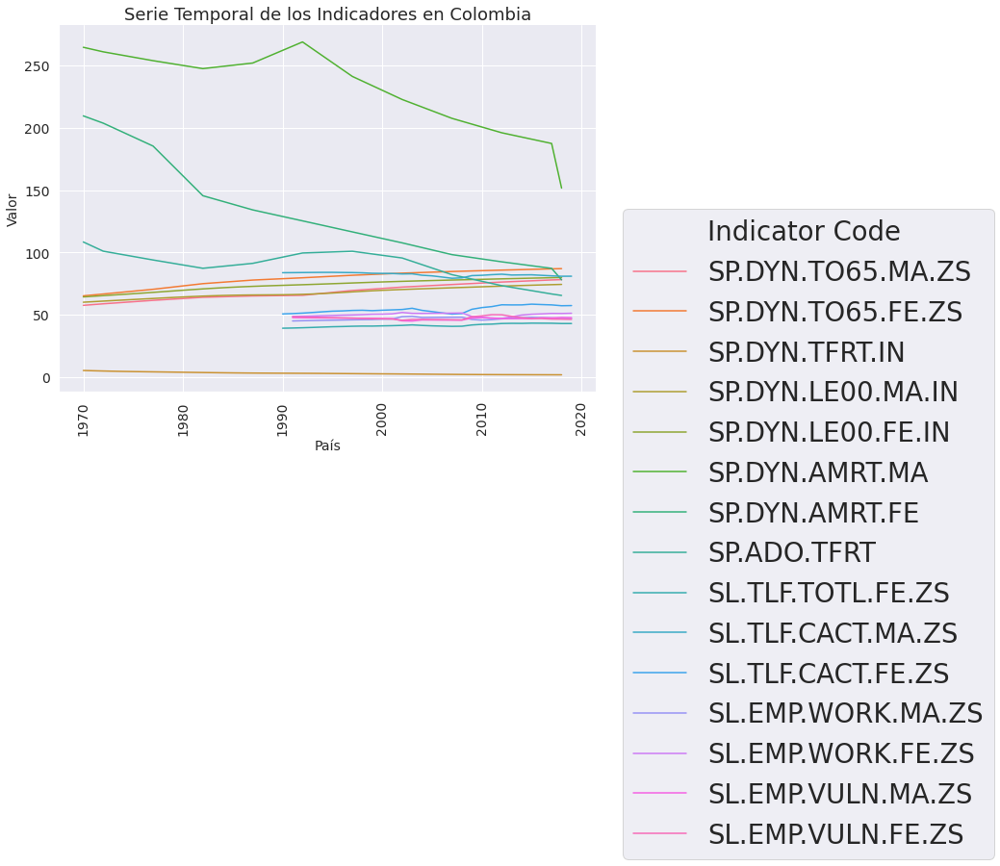

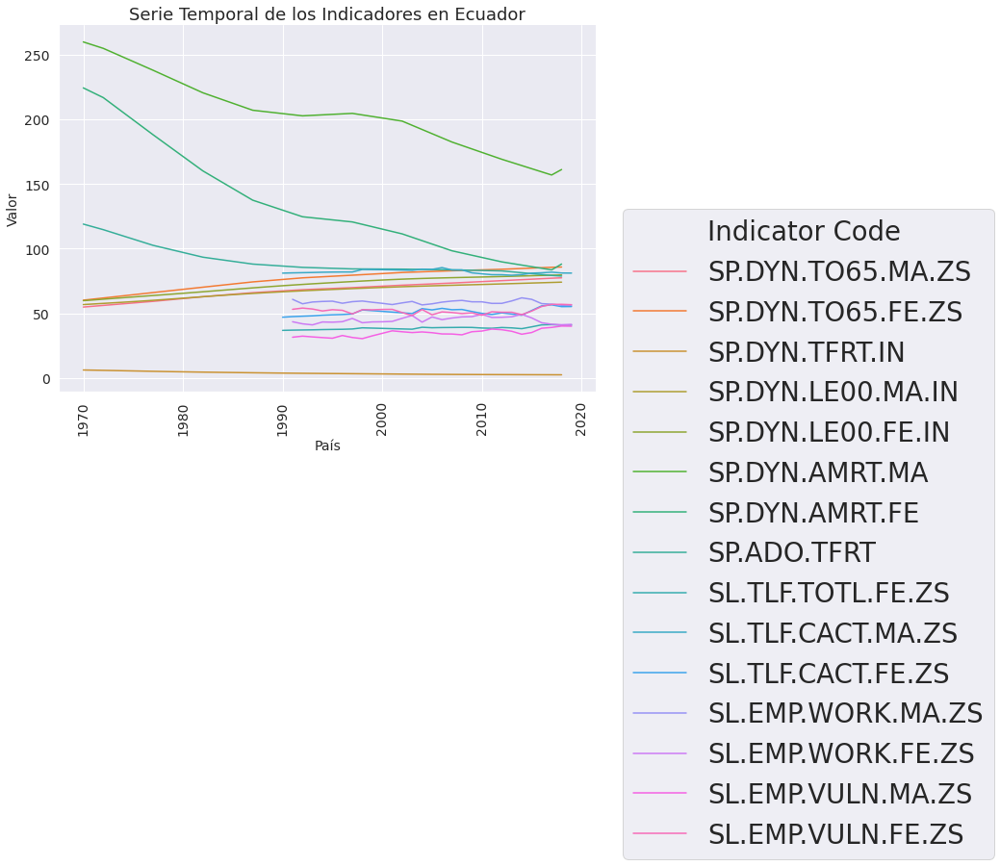

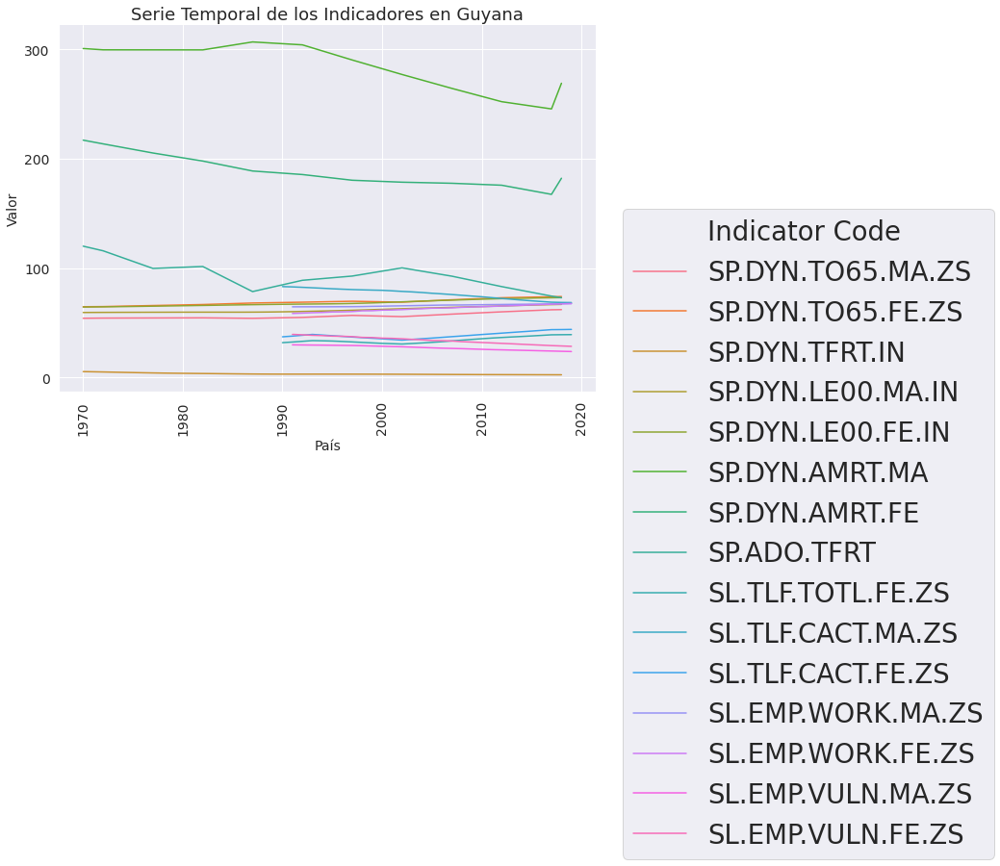

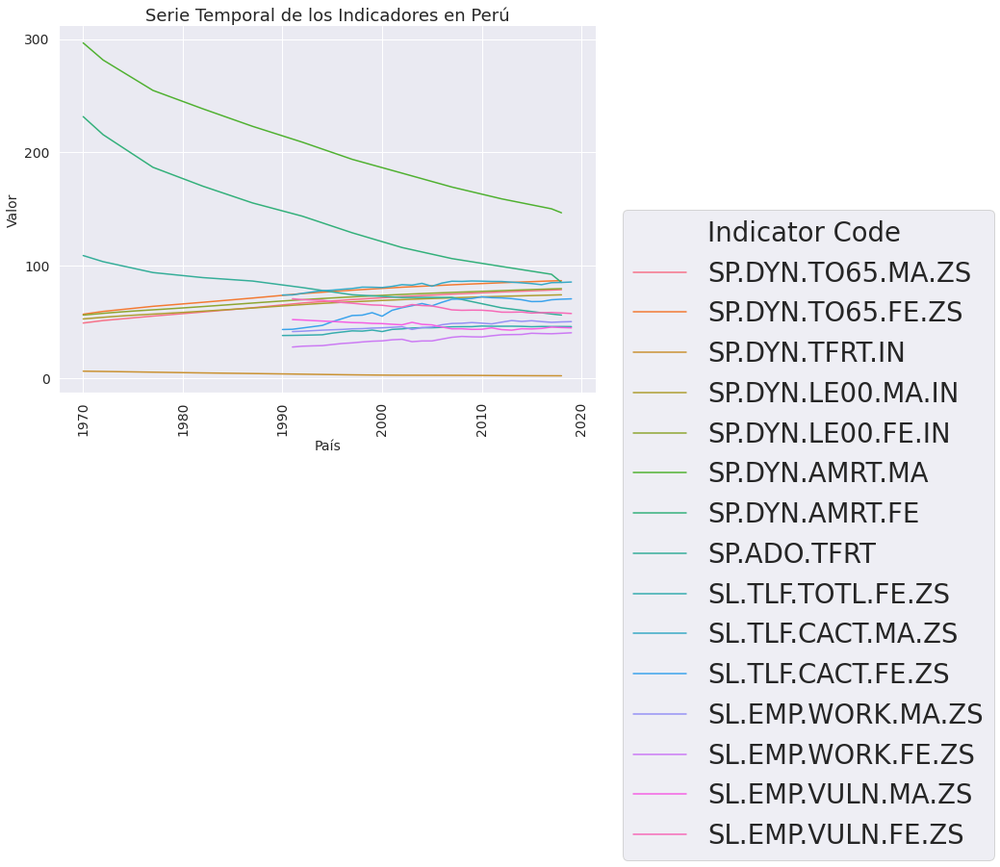

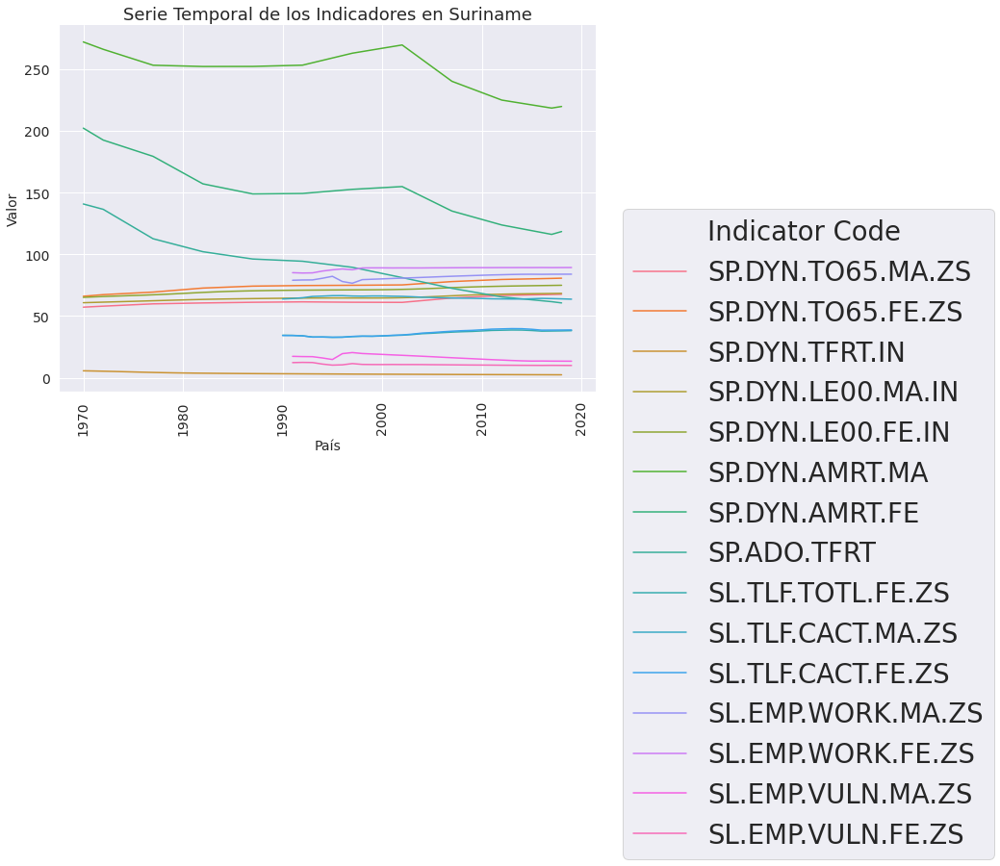

In [ ]:
countries = gender['Country Name'].drop_duplicates().to_list()
GenderDataMelt = GenderDataMelt.copy()
for country in countries:
    plt.figure(figsize=(10,7))
    sns.lineplot(data=GenderDataMelt[GenderDataMelt["Country Name"]==country], x="Year", y="value", hue="Indicator Code")
    plt.title("Serie Temporal de los Indicadores en " + str(country), fontsize=18)
    sns.despine()
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('País', fontsize=14)
    plt.ylabel('Valor', fontsize=14)
    plt.xticks(rotation=90)
    plt.legend(bbox_to_anchor=(1.05, 0.5), loc='upper left', borderaxespad=0.)

En términos generales, puede observarse que en todos los países en ánálisis, la Tasa de mortalidad, adultos, mujeres (por cada 1.000 mujeres adultas) (SP.DYN.AMRT.FE) y la Tasa de mortalidad, adultos, varones (por cada 1.000 varones adultos) (SP.DYN.AMRT.MA ), muestran una tendencia a la baja.


Llama la atención el comportamiento de la tasa de mortalidad masculina en Brasil, que muestra un aumento hasta el año 1987 y luego decrece.
A su vez, la tasa de mortalidad tanto masculina como femenina en Guyana muestra una tendencia a la baja, sin embargo, en los últimos años aumentó. Venezuela muestra una situación similar a Guyana. 


##### Gráficos Particulares: Casos Especiales

###### Brasil

(array([1960., 1970., 1980., 1990., 2000., 2010., 2020., 2030.]),
 <a list of 8 Text major ticklabel objects>)

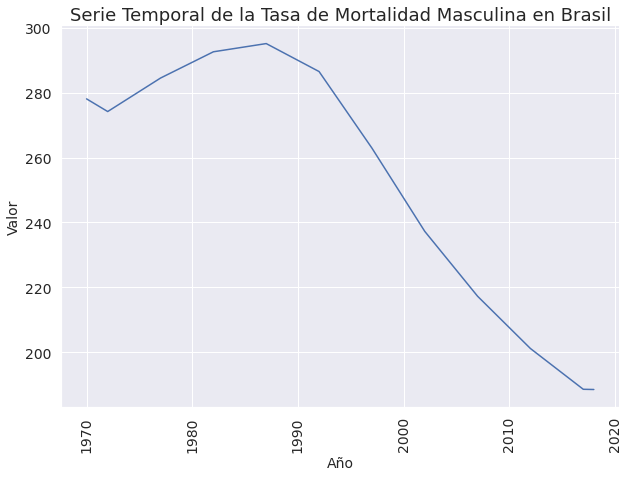

In [ ]:
_condicion = (GenderDataMelt["Country Name"]=="Brasil") & (GenderDataMelt["Indicator Code"]=="SP.DYN.AMRT.MA")
plt.figure(figsize=(10,7))
sns.lineplot(data=GenderDataMelt[_condicion] , x="Year", y="value")
plt.title("Serie Temporal de la Tasa de Mortalidad Masculina en Brasil", fontsize=18)
sns.despine()
plt.xticks(fontsize=14, rotation=90)
plt.yticks(fontsize=14)
plt.xlabel('Año', fontsize=14)
plt.ylabel('Valor', fontsize=14)
plt.xticks(rotation=90)


In [ ]:
_condicion = (GenderDataMelt["Country Name"]=="Brasil") & (GenderDataMelt["Indicator Code"]=="SP.DYN.AMRT.MA")
_df = GenderDataMelt[_condicion]
_min = float(GenderDataMelt[_condicion]["value"].min())
_year_min = _df[_df["value"] == _min]
_year_min = int(_year_min["Year"])
print( "El valor mínimo que asume la variable es " + str(_min) + " en el año " + str(_year_min) + ".")
_max = float(GenderDataMelt[_condicion]["value"].max())
_year_max = _df[_df["value"] == _max]
_year_max = int(_year_max["Year"])
print( "El valor máximo que asume la variable es " + str(_max) + " en el año " + str(_year_max) + ".")

El valor mínimo que asume la variable es 188.528 en el año 2018.
El valor máximo que asume la variable es 295.126 en el año 1987.


###### Guyana

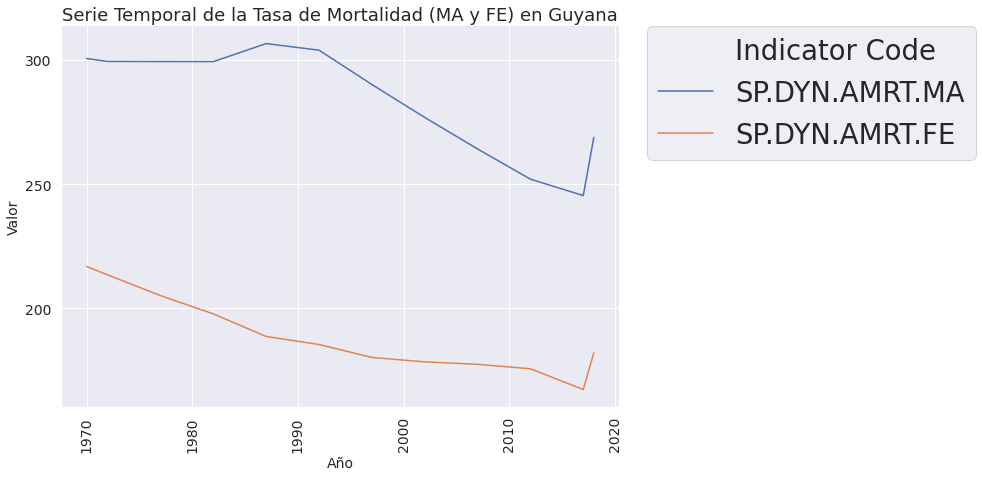

In [ ]:
_condicion = (GenderDataMelt["Country Name"]=="Guyana") & ((GenderDataMelt["Indicator Code"]=="SP.DYN.AMRT.MA") | (GenderDataMelt["Indicator Code"]=="SP.DYN.AMRT.FE"))
plt.figure(figsize=(10,7))
sns.lineplot(data=GenderDataMelt[_condicion] , x="Year", y="value", hue = "Indicator Code")
plt.title("Serie Temporal de la Tasa de Mortalidad (MA y FE) en Guyana", fontsize=18)
sns.despine()
plt.xticks(fontsize=14, rotation=90)
plt.yticks(fontsize=14)
plt.xlabel('Año', fontsize=14)
plt.ylabel('Valor', fontsize=14)
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)


In [ ]:
_condicion = ((GenderDataMelt["Country Name"]=="Guyana") & ((GenderDataMelt["Indicator Code"]=="SP.DYN.AMRT.MA") | (GenderDataMelt["Indicator Code"]=="SP.DYN.AMRT.FE")))
_df = GenderDataMelt[_condicion]
_features = ["SP.DYN.AMRT.MA", "SP.DYN.AMRT.FE"]

for Feature in _features:
          _min = float(_df[_df["Indicator Code"] == Feature]["value"].min())
          _year_min = _df[(_df["Indicator Code"] == Feature) & (_df["value"] == _min)]
          _year_min = int(_year_min["Year"])
          print( "El valor mínimo que asume la variable " + str(Feature) + " es " + str(_min) + " en el año " + str(_year_min) + ".")
          _max = float(_df[_df["Indicator Code"] == Feature]["value"].max())
          _year_max = _df[(_df["Indicator Code"] == Feature) & (_df["value"] == _max)]
          _year_max = int(_year_max["Year"])
          print( "El valor máximo que asume la variable " + str(Feature) + " es " + str(_max) + " en el año " + str(_year_max) + ".")


El valor mínimo que asume la variable SP.DYN.AMRT.MA es 245.418 en el año 2017.
El valor máximo que asume la variable SP.DYN.AMRT.MA es 306.616 en el año 1987.
El valor mínimo que asume la variable SP.DYN.AMRT.FE es 167.33900000000003 en el año 2017.
El valor máximo que asume la variable SP.DYN.AMRT.FE es 216.875 en el año 1970.


###### Venezuela

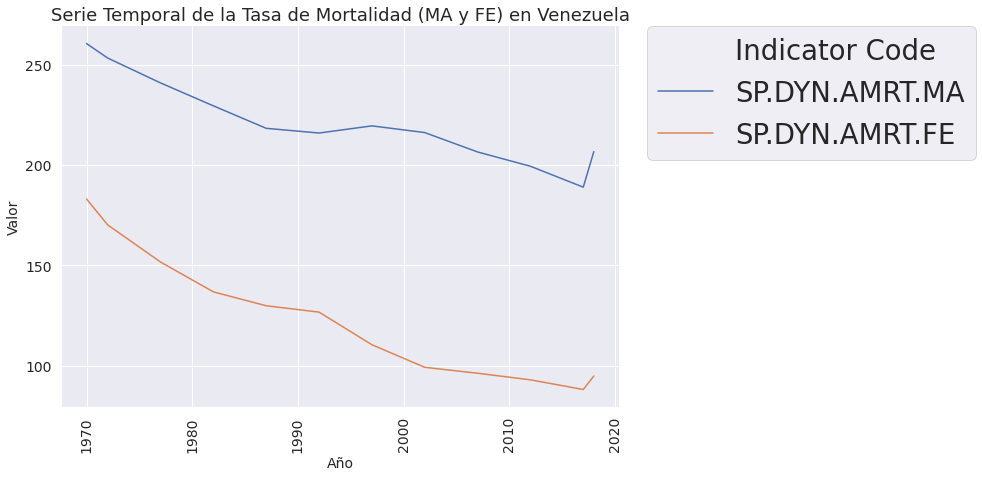

In [ ]:
_condicion = (GenderDataMelt["Country Name"]=="Venezuela") & ((GenderDataMelt["Indicator Code"]=="SP.DYN.AMRT.MA") | (GenderDataMelt["Indicator Code"]=="SP.DYN.AMRT.FE"))
plt.figure(figsize=(10,7))
sns.lineplot(data=GenderDataMelt[_condicion] , x="Year", y="value", hue = "Indicator Code")
plt.title("Serie Temporal de la Tasa de Mortalidad (MA y FE) en Venezuela", fontsize=18)
sns.despine()
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.xticks(fontsize=14, rotation=90)
plt.yticks(fontsize=14)
plt.xlabel('Año', fontsize=14)
plt.ylabel('Valor', fontsize=14)
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

In [ ]:
_condicion = (GenderDataMelt["Country Name"]=="Venezuela") & ((GenderDataMelt["Indicator Code"]=="SP.DYN.AMRT.MA") | (GenderDataMelt["Indicator Code"]=="SP.DYN.AMRT.FE"))
_df = GenderDataMelt[_condicion]
_features = ["SP.DYN.AMRT.MA", "SP.DYN.AMRT.FE"]

for Feature in _features:
          _min = float(_df[_df["Indicator Code"] == Feature]["value"].min())
          _year_min = _df[(_df["Indicator Code"] == Feature) & (_df["value"] == _min)]
          _year_min = int(_year_min["Year"])
          print( "El valor mínimo que asume la variable " + str(Feature) + " es " + str(_min) + " en el año " + str(_year_min) + ".")
          _max = float(_df[_df["Indicator Code"] == Feature]["value"].max())
          _year_max = _df[(_df["Indicator Code"] == Feature) & (_df["value"] == _max)]
          _year_max = int(_year_max["Year"])
          print( "El valor máximo que asume la variable " + str(Feature) + " es " + str(_max) + " en el año " + str(_year_max) + ".")

El valor mínimo que asume la variable SP.DYN.AMRT.MA es 188.942 en el año 2017.
El valor máximo que asume la variable SP.DYN.AMRT.MA es 260.522 en el año 1970.
El valor mínimo que asume la variable SP.DYN.AMRT.FE es 88.069 en el año 2017.
El valor máximo que asume la variable SP.DYN.AMRT.FE es 183.023 en el año 1970.


### Determinación de Año a Predecir

Una vez seleccionados los indicadores a predecir por país para la dimensión de género, se verifica que todos los indicadores seleccionados tengan información para el año 2019, para elegirlo como año prueba. Si no se cumple la condición, entonces, se replica el análisis para el año 2018, y se opta por considerarlo como año a predecir.

In [ ]:
featureWOData_2019  = GenderData["2019"].isna().sum()
Data_2019 = (featureWOData_2019/len(GenderData["2019"]))*100

print("De las 15 features seleccionadas para género, el " + str(round(Data_2019, 2)) + "% no posee información para el año 2019." )

featureWOData_2018  = GenderData["2018"].isna().sum()

Data_2018 = (featureWOData_2018/len(GenderData["2018"]))*100

print("De las 15 features seleccionadas para género, el " + str(Data_2018) + "% no posee información para el año 2018." )



De las 15 features seleccionadas para género, el 53.33% no posee información para el año 2019.
De las 15 features seleccionadas para género, el 0.0% no posee información para el año 2018.


Se llega a la conclusión que no existe suficiente información para el año 2019, por eso se selecciona como año a predecir el 2018.

##SALUD


¿Cuántos tipos de Features diferentes existen por indicador considerado? ¿Todos los países mantienen esa misma cantidad para el mismo indicador?

In [ ]:
print("El indicador de salud tiene " + str(len(health["features"].unique())) + " features.")
print("El análisis se lleva a cabo consdierando " + str(len(health["Country Name"].unique())) + " países.")
print(health["Country Name"].unique())

El indicador de salud tiene 112 features.
El análisis se lleva a cabo consdierando 12 países.
['Argentina' 'Brasil' 'Paraguay' 'Uruguay' 'Venezuela' 'Bolivia' 'Chile'
 'Colombia' 'Ecuador' 'Guyana' 'Perú' 'Suriname']


In [ ]:
countries = health['Country Name'].unique()

for countries in countries:
    
    print("La cantidad de features que posee " + str(countries) + ": " + str(health[health['Country Name']==countries]['features'].count()) )

La cantidad de features que posee Argentina: 112
La cantidad de features que posee Brasil: 112
La cantidad de features que posee Paraguay: 112
La cantidad de features que posee Uruguay: 112
La cantidad de features que posee Venezuela: 112
La cantidad de features que posee Bolivia: 112
La cantidad de features que posee Chile: 112
La cantidad de features que posee Colombia: 112
La cantidad de features que posee Ecuador: 112
La cantidad de features que posee Guyana: 112
La cantidad de features que posee Perú: 112
La cantidad de features que posee Suriname: 112


### Análisis por Feature para toda la Región

¿Cuál es la proporción de valores nulos para cada Feature dentro de cada Indicador con respecto al intervalo temporal considerado? ¿Estos valores nulos se encuentran dispersos a lo largo de todo el intervalo temporal o existen agrupamientos (más chicos y/o más grandes) de los mismos? ¿Qué decisión se podría tomar con respecto a los mismos en un futuro?


In [ ]:
print("Los features de salud que existen son los siguientes: \n", str(health['features'].unique()))

Los features de salud que existen son los siguientes: 
 ['Población, hombres (% del total)' 'Población, hombres'
 'Población, mujeres (% del total)' 'Población, mujeres'
 'Población, total' 'Crecimiento de la población (% anual)'
 'Tasa de inactividad por edades, personas menores de 15 años (% de la población en edad de trabajar)'
 'Tasa de inactividad por edades, personas de 65 años y más (% de la población en edad de trabajar)'
 'Tasa de inactividad por edades (% de la población en edad de trabajar)'
 'Proporción de sexos al nacer (mujeres cada 1000 hombres)'
 'Población de 80\xa0años en adelante, varones (% de la población masculina)'
 'Población de 80\xa0años en adelante, mujeres (% de la población femenina)'
 'Población de 75 a 79\xa0años, varones (% de la población masculina)'
 'Población de 75 a 79\xa0años, mujeres (% de la población femenina)'
 'Población de 70 a 74\xa0años, varones (% de la población masculina)'
 'Población de 70 a 74\xa0años, mujeres (% de la población femeni

Para llevar a cabo el análisis de los datos nulos, se construye una matriz por feature y por año en la que se muestra el porcentaje de registros existentes para cada combinación considerando toda la región.

In [ ]:
HealthValuesByICode = health.groupby("Indicator Code").count().drop(["Country Code", "Country Name", "Indicator", "features"], axis=1)
HealthValuesByICode["Valor"] = HealthValuesByICode.sum(axis=1)
HealthValuesByICode = HealthValuesByICode.sort_values(by=['Valor'], ascending=False)
HealthValuesByICode = ((HealthValuesByICode/12)*100).drop(columns = ["Valor"])
HealthValuesByICode = HealthValuesByICode.rename(columns = lambda x : str(x)[:4])
round(HealthValuesByICode,2)

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Indicator Code,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SP.POP.0014.TO,100.00,100.0,100.0,100.0,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.0,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,0.00
SP.POP.2024.FE.5Y,100.00,100.0,100.0,100.0,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.0,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,0.00
SP.POP.4549.MA.5Y,100.00,100.0,100.0,100.0,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.0,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,0.00
SP.POP.4549.FE.5Y,100.00,100.0,100.0,100.0,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.0,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,0.00
SP.POP.4044.MA.5Y,100.00,100.0,100.0,100.0,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.0,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SH.STA.STNT.ZS,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,25.00,16.67,0.0,25.00,16.67,16.67,8.33,8.33,33.33,25.00,41.67,16.67,25.0,33.33,41.67,16.67,25.0,33.33,41.67,33.33,41.67,41.67,25.0,25.00,25.00,16.67,33.33,16.67,33.33,8.33,33.33,8.33,8.33,8.33
SH.STA.WAST.ZS,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,25.00,8.33,0.0,25.00,16.67,16.67,8.33,8.33,33.33,25.00,41.67,16.67,25.0,33.33,41.67,16.67,25.0,33.33,41.67,33.33,41.67,41.67,25.0,25.00,25.00,16.67,33.33,16.67,33.33,8.33,33.33,8.33,8.33,8.33
SH.STA.OWGH.ZS,0.00,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,16.67,8.33,0.0,16.67,16.67,16.67,8.33,8.33,33.33,25.00,41.67,16.67,25.0,33.33,41.67,16.67,25.0,33.33,41.67,33.33,41.67,41.67,25.0,25.00,25.00,16.67,33.33,16.67,33.33,8.33,33.33,8.33,8.33,8.33


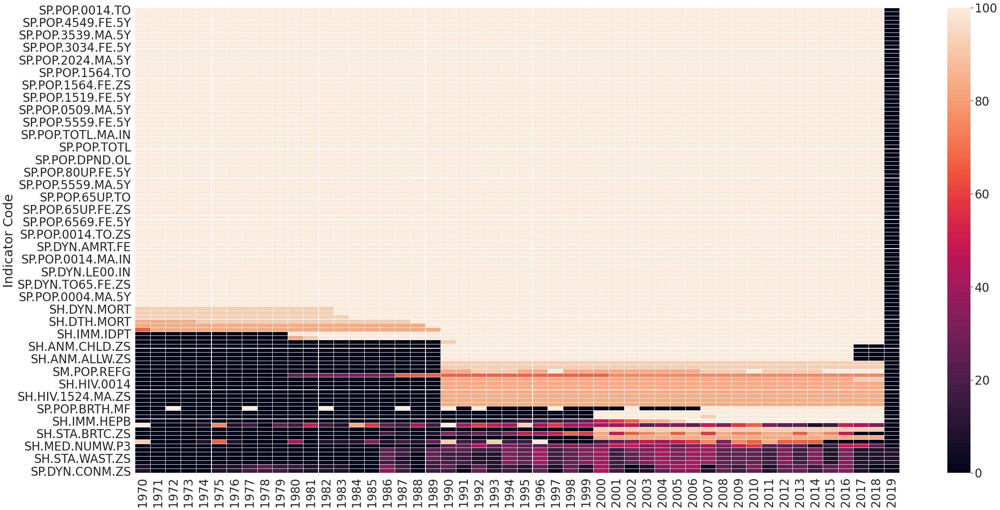

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(HealthValuesByICode, cbar=True, linewidths=0.1,  vmin=0, vmax=100)
sns.set(font_scale=2.5)

Este Indicador contiene la mayoria de sus datos completos, con muy pocos año con datos null.

In [ ]:
HealthValuesByICode = HealthValuesByICode.reset_index()
HealthValuesByICode["features"] = HealthValuesByICode["Indicator Code"]
HealthValuesByICode["features"] = HealthValuesByICode["features"].map(health.set_index("Indicator Code")["features"].to_dict())
FeaturesHealthSelection = HealthValuesByICode.iloc[0:90][["Indicator Code", "features"]].set_index("Indicator Code")
FeaturesHealthSelection

,features
Indicator Code,
SP.POP.0014.TO,"Población entre 0 y 14 años de edad, total"
SP.POP.2024.FE.5Y,"Población de 20 a 24 años, mujeres (% de la población femenina)"
SP.POP.4549.MA.5Y,"Población de 45 a 49 años, varones (% de la población masculina)"
SP.POP.4549.FE.5Y,"Población de 45 a 49 años, mujeres (% de la población femenina)"
SP.POP.4044.MA.5Y,"Población de 40 a 44 años, varones (% de la población masculina)"
...,...
SH.DYN.AIDS.ZS,"Prevalencia de VIH, total (% de la población entre 15 y 24 años de edad)"
SH.HIV.INCD.TL,Adultos (de 15 años en adelante) y niños (de 0 a 14 años) recientemente infectados por el VIH
SM.POP.REFG,Población de refugiados por país o territorio de asilo


### Análisis por País para cada **Feature**

Volviendo a los resultados del punto 2, elegir como mínimo 15 Features por Indicador con al menos el 50% de valores no nulos (y en lo posible los mismos para todos los países) y mostrar gráficamente, con gráficos de distribución o de cajas por ejemplo, la distribución de los mismos. ¿Qué se puede observar de estas distribuciones? ¿Son normales? ¿Qué sucede con los outliers? ¿Observan alguna similitud entre los features elegidos?. Para estos mismos 15 Features realizar el gráfico de línea de su serie temporal y analizarlo.

In [ ]:
HealthDataByCountry = health.groupby("Country Name").count().drop(["features", "Indicator", "Country Code", "Indicator Code"], axis=1)
HealthDataByCountry["Valor"] = HealthDataByCountry.sum(axis=1)
HealthDataByCountry = HealthDataByCountry.sort_values(by=['Valor'], ascending=False)
HealthDataByCountry = ((HealthDataByCountry/len(RelevantFeatures["Indicator Code"].unique()))*100).drop(columns = ["Valor"])
HealthDataByCountry = HealthDataByCountry.rename(columns = lambda x : str(x)[:4])
round(HealthDataByCountry,2)


NameError: ignored

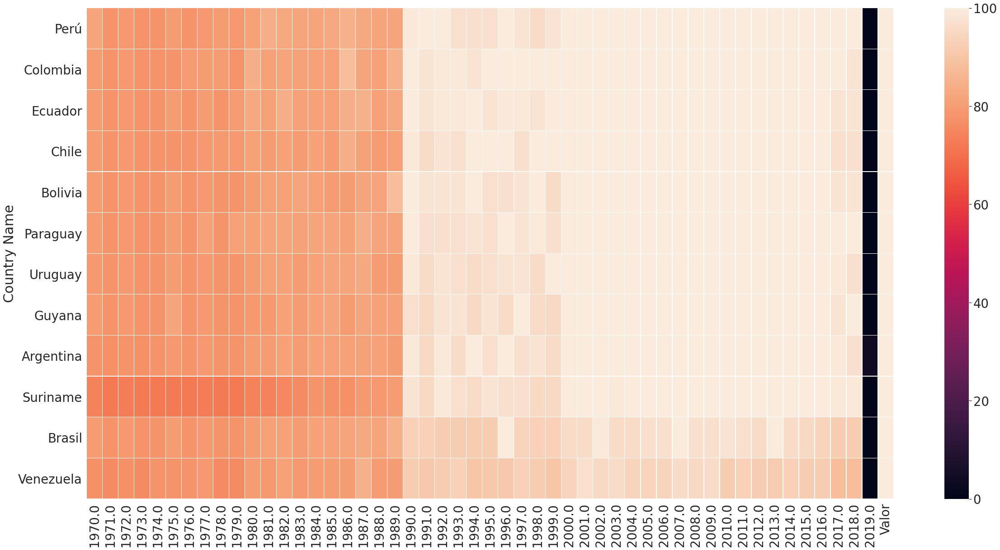

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(HealthDataByCountry, cbar=True, linewidths=.3, vmin=0, vmax=100)

Podemos observar que todos los paises tienen buena informacion, salvo para el año 2019.

Se realiza un heatmap considerando como centro el 50% de esta forma se puede visualizar cuáles son las combinaciones que tienen mas del 50% de registros con datos.

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(HealthDataByCountry, cbar=True, linewidths=.3, center=50, cmap="PRGn")

In [ ]:
print("El % de países que tienen más del 50% de los features con datos para cada año es: \n\n" + str(round((HealthDataByCountry[HealthDataByCountry>50].count()/len(health["Country Name"].unique()))*100, 0).astype(int)))

Se modifica la estructura del dataset para poder analizar el porcentaje de registros con datos por país, por feature y por año, para decidir qué features considerar para cada país.

In [ ]:
RelevantFeaturesByID = health.drop(["Country Code", "Indicator", "features"], axis=1)
RelevantFeaturesByID = RelevantFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
RelevantFeaturesByID["Porcentaje de Registros"] = (RelevantFeaturesByID.sum(axis=1)/50)*100
RelevantFeaturesByID = RelevantFeaturesByID["Porcentaje de Registros"].reset_index().sort_values(by='Indicator Code', ascending=False)

countries = health['Country Name'].drop_duplicates().to_list()
for countries in countries:
    plt.figure(figsize=(20, 10))
    sns.barplot(x="Indicator Code", y="Porcentaje de Registros", data=RelevantFeaturesByID[RelevantFeaturesByID["Country Name"]== countries], color = "r")
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('Indicator Code', fontsize=14)
    plt.ylabel('Porcentaje con Datos', fontsize=14)
    plt.title("Porcentaje con Datos por Indicador de " + str(countries) + "\n", fontsize=16)
    plt.axhline(y=50,linewidth=1, color='black')

In [ ]:
RelevantFeaturesByID = health.drop(["Country Code", "Indicator", "features"], axis=1)
RelevantFeaturesByID = RelevantFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
RelevantFeaturesByID["Porcentaje de Registros"] = (RelevantFeaturesByID.sum(axis=1)/50)*100
RelevantFeaturesByID["Mayor a 50%"] = RelevantFeaturesByID["Porcentaje de Registros"]>50
RelevantFeaturesByID = RelevantFeaturesByID[["Porcentaje de Registros" , "Mayor a 50%"]].reset_index().sort_values(by='Indicator Code', ascending=False)
countries = gender['Country Name'].drop_duplicates()
IDbyCountry = []
for countries in countries:
       IDbyCountry.append( RelevantFeaturesByID.loc[RelevantFeaturesByID["Country Name"]==countries].iloc[0:50] )
IDbyCountry

In [ ]:
HealthIDFeatures = IDbyCountry[0]["Indicator Code"].unique()
HealthIDFeatures

In [ ]:
print("Asignación de ID Code elegidos con su respectivo feature." )
health[health["Indicator Code"].isin(HealthIDFeatures)][["Indicator Code", "features"]].drop_duplicates().reset_index().drop(columns=["index"])

###Histograma por Feature para cada país

Para realizar los siguientes análisis, se construye un dataset que tenga solo las columnas relevantes de análisis y que solo considere los ID Features seleccionados en el paso anterior.

In [ ]:
columns=health.columns
HealthData=health.drop(["Indicator", "Country Code", "features"], axis=1).rename(columns = lambda x : str(x)[:4] if x in columns[5:] else x)
HealthData=HealthData[HealthData["Indicator Code"].isin(HealthIDFeatures)]
HealthData

In [ ]:
HealthDataMelt = pd.melt(HealthData, id_vars = ["Indicator Code" , "Country Name"])
HealthDataMelt["variable"] = pd.to_numeric(HealthDataMelt["variable"] )
HealthDataMelt = HealthDataMelt.rename(columns = {"variable": "Year"})

In [ ]:
arg=HealthDataMelt[HealthDataMelt["Country Name"]=="Argentina"]
bra=HealthDataMelt[HealthDataMelt["Country Name"]=="Brasil"]
ur=HealthDataMelt[HealthDataMelt["Country Name"]=="Uruguay"]
par=HealthDataMelt[HealthDataMelt["Country Name"]=="Paraguay"]
ven=HealthDataMelt[HealthDataMelt["Country Name"]=="Venezuela"]
bol=HealthDataMelt[HealthDataMelt["Country Name"]=="Bolivia"]
chi=HealthDataMelt[HealthDataMelt["Country Name"]=="Chile"]
guy=HealthDataMelt[HealthDataMelt["Country Name"]=="Guyana"]
sur=HealthDataMelt[HealthDataMelt["Country Name"]=="Suriname"]
col=HealthDataMelt[HealthDataMelt["Country Name"]=="Colombia"]
ecu=HealthDataMelt[HealthDataMelt["Country Name"]=="Ecuador"]
per=HealthDataMelt[HealthDataMelt["Country Name"]=="Perú"]

In [ ]:
for HealthIDFeatures in HealthIDFeatures:
    plt.figure(figsize=(13,6))
    sns.distplot(arg[arg["Indicator Code"]==HealthIDFeatures]["value"], label="arg", hist=False)
    sns.distplot(bra[bra["Indicator Code"]==HealthIDFeatures]["value"], label="bra", hist=False)
    sns.distplot(ur[ur["Indicator Code"]==HealthIDFeatures]["value"], label="ur", hist=False)
    sns.distplot(par[par["Indicator Code"]==HealthIDFeatures]["value"], label="par", hist=False)
    sns.distplot(ven[ven["Indicator Code"]==HealthIDFeatures]["value"], label="ven", hist=False)
    sns.distplot(bol[bol["Indicator Code"]==HealthIDFeatures]["value"], label="bol", hist=False)
    sns.distplot(chi[chi["Indicator Code"]==HealthIDFeatures]["value"], label="chi", hist=False)
    sns.distplot(guy[guy["Indicator Code"]==HealthIDFeatures]["value"], label="guy", hist=False)
    sns.distplot(sur[sur["Indicator Code"]==HealthIDFeatures]["value"], label="sur", hist=False)
    sns.distplot(col[col["Indicator Code"]==HealthIDFeatures]["value"], label="col", hist=False)
    sns.distplot(ecu[ecu["Indicator Code"]==HealthIDFeatures]["value"], label="ecu", hist=False)
    sns.distplot(per[per["Indicator Code"]==HealthIDFeatures]["value"], label="per", hist=False)
    plt.title("Histograma del feature "+ str(HealthIDFeatures) + " por país")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    

### BoxPlot por Feature

Para profundizar el análisis llevado a cabo hasta ahora, se construyen Box Plot para cada feature por país. 

In [ ]:
health

In [ ]:
HealthIDFeatures

In [ ]:
HealthDataMelt[HealthDataMelt["Indicator Code"] == 'SP.POP.TOTL.FE.IN'].features.tolist()[0]


In [ ]:
HealthDataMelt = pd.melt(health, id_vars = ["features","Country Code","Indicator" ,"Indicator Code" , "Country Name"])
HealthDataMelt["variable"] = pd.to_numeric(HealthDataMelt["variable"] )
HealthDataMelt = HealthDataMelt.rename(columns = {"variable": "Year"})

In [ ]:
for F in HealthIDFeatures:
  plt.figure(figsize=(20,20))
  bplt = sns.boxplot(data=HealthDataMelt[HealthDataMelt["Indicator Code"] == F], x="Country Name", y="value")
  plt.title(str(HealthDataMelt[HealthDataMelt["Indicator Code"] == F].features.tolist()[0]))
  plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
  bplt.set_xticklabels(bplt.get_xticklabels(), rotation=45)


## EDUCACIÓN

1. ¿Cuántos **tipos de Features diferentes** existen por indicador considerado? ¿Todos los países mantienen esa misma cantidad para el mismo indicador?

Existen 106 features diferentes por país para el indicador educación. Todos los países poseen la misma cantidad.

In [ ]:
print("El indicador de educación tiene " + str(len(education["features"].unique())) + " features.")
print("El análisis se lleva a cabo consdierando " + str(len(education["Country Name"].unique())) + " países.")
print(education["Country Name"].unique())

In [ ]:
countries = education['Country Name'].unique()

for countries in countries:
    
    print("La cantidad de features que posee " + str(countries) + ": " + str(education[education['Country Name']==countries]['features'].count()) )

### Análisis por Feature para toda la Región

2. ¿Cuál es la proporción de valores nulos para cada Feature dentro de cada Indicador con respecto al intervalo temporal considerado? ¿Estos valores nulos se encuentran dispersos a lo largo de todo el intervalo temporal o existen agrupamientos (más chicos y/o más grandes) de los mismos? ¿Qué decisión se podría tomar con respecto a los mismos en un futuro?
3. ¿Cómo es la distribución de valores nulos por año (por columnas del dataset)?. Teniendo en cuenta que el objetivo final de la mentoría es realizar una predicción de cada Feature para el año 2019, ¿se disponen de datos suficientes para comparar las predicciones que se obtendrán con el valor real en ese año?

In [ ]:
print("Los features de educación que existen son los siguientes: \n", str(education['features'].unique()))

Para llevar a cabo el análisis de los datos nulos, se construye una matriz por feature y por año en la que se muestra el porcentaje de registros existentes para cada combinación considerando toda la región (promedio de todos los países).

In [ ]:
EducationValuesByICode = education.groupby("Indicator Code").count().drop(["Country Code", "Country Name", "Indicator", "features"], axis=1)
EducationValuesByICode["Valor"] = EducationValuesByICode.sum(axis=1)
EducationValuesByICode = EducationValuesByICode.sort_values(by=['Valor'], ascending=False)
EducationValuesByICode = ((EducationValuesByICode/12)*100).drop(columns = ["Valor"])
EducationValuesByICode = EducationValuesByICode.rename(columns = lambda x : str(x)[:4])
round(EducationValuesByICode,2)


Se construye un mapa de calor para visualizar aquellas features con mayor porcentaje de registros, mientras mas oscuro el color menos proporción de registros hay para dicha combinación.

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(EducationValuesByICode, cbar=True, linewidths=0.1,  vmin=0, vmax=100)
#sns.set(font_scale=2.5)

Tomando el promedio de los países se observa como, para la mayoria de los features, hay valores nulos hasta 1997 y en 2018/2019. Donde exite menor proporción de valores nulos para la mayoría de los features es en el intervalo de tiempo desde 1998 a 2017. Por su parte, hay unos pocos features (los primeros del mapa de calor) que no siguen estas tendencias y poseen gran porporción de valores no nulos para la mayoria de los años.

In [ ]:
EducationByYear = pd.melt(education.drop(["Country Code", "Country Name", "Indicator", "features"], axis=1), id_vars = ["Indicator Code"])
EducationByYear["variable"] = pd.to_numeric(EducationByYear["variable"] )
EducationByYear = EducationByYear.rename(columns = {"variable": "Year"})
TotalData_1997 = (EducationByYear["Year"]<=1997).sum()
WithData_1997 = ((EducationByYear["Year"]<=1997) & (EducationByYear["value"]>0)).sum()

print( "El % de registros sin datos para el período de 1970 a 1997 es de: " +  str(round((1 - (WithData_1997/TotalData_1997))*100,2)) + "%") 

TotalData_2019 = (EducationByYear["Year"]>1997).sum()
WithData_2019 = ((EducationByYear["Year"]>1997) & (EducationByYear["value"]>0)).sum()
Check = len (EducationByYear) == (TotalData_2019 + TotalData_1997 )


print( "El % de registros sin datos para el período de 1991 a 2019 es de: " +  str(round((1 - (WithData_2019/TotalData_2019))*100,2)) + "%") 

### Análisis por País para cada Feature


Se seleccionan los primeros 15 features que poseen más datos:

In [ ]:
EducationValuesByICode=EducationValuesByICode.reset_index()
EducationValuesByICode["features"] = EducationValuesByICode["Indicator Code"]
EducationValuesByICode["features"] = EducationValuesByICode["features"].map(education.set_index("Indicator Code")["features"].to_dict())
FeaturesEducationSelection = EducationValuesByICode.iloc[0:15][["Indicator Code", "features"]].set_index("Indicator Code")
FeaturesEducationSelection

Se construye una matriz para determinar cuál es el porcentaje de registros con datos considerando las 15 features seleccionadas por país y año. 

In [ ]:
EducationIDCode = FeaturesEducationSelection.reset_index()['Indicator Code'].to_list()

RelevantFeaturesEducation = education[education["Indicator Code"].isin(EducationIDCode)]
EducationDataByCountry = RelevantFeaturesEducation.groupby("Country Name").count().drop(["features", "Indicator", "Country Code", "Indicator Code"], axis=1)
EducationDataByCountry["Valor"] = EducationDataByCountry.sum(axis=1)
EducationDataByCountry = EducationDataByCountry.sort_values(by=['Valor'], ascending=False)
EducationDataByCountry = ((EducationDataByCountry/len(RelevantFeaturesEducation["Indicator Code"].unique()))*100).drop(columns = ["Valor"])
EducationDataByCountry = EducationDataByCountry.rename(columns = lambda x : str(x)[:4])
round(EducationDataByCountry,2)

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(EducationDataByCountry, cbar=True, linewidths=.3, vmin=0, vmax=100)

Se realiza un heatmap considerando como centro el 50% de esta forma se puede visualizar cuáles son las combinaciones que tienen mas del 50% de registros con datos.

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(EducationDataByCountry, cbar=True, linewidths=.3, center=50, cmap="PRGn")

In [ ]:
print("El % de países que tienen más del 50% de los features con datos para cada año es: \n" + str(round((EducationDataByCountry[EducationDataByCountry>50].count()/len(education["Country Name"].unique()))*100, 0).astype(int)))

In [ ]:
EducationByYear = pd.melt(RelevantFeaturesEducation, id_vars = ["features", "Indicator" , "Country Name","Country Code", "Indicator Code"])
EducationByYear["variable"] = pd.to_numeric(EducationByYear["variable"] )
EducationByYear = EducationByYear.rename(columns = {"variable": "Year"})
EducationByYear["Year"] = EducationByYear["Year"].apply(lambda x: str(x)[:4])

EducationByYear

A partir de 1997, la mayoría de los paises en análisis tienen información para más del 50% de los features relevantes. Esto se evidencia en el heatmap, donde aquellas combinaciones con más del 50% de registros se muestran en diferentes tonalidades de verdes. Aquellas combinaciones que no alcanzan el 50% de los registros tienen diferentes tonalidades de violeta. El gráfico anticipa que para el caso de Brasil deberan contemplarse otros features puesto que pareciera presentar gran cantidad de nulos.

Se modifica la estructura del dataset para poder analizar el porcentaje de registros con datos por país, por feature y por año, para decidir qué features considerar para cada país.

In [ ]:
EducationRelevantFeaturesByID = RelevantFeaturesEducation.drop(["Country Code", "Indicator", "features"], axis=1)
EducationRelevantFeaturesByID = EducationRelevantFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
EducationRelevantFeaturesByID["Porcentaje de Registros"] = (EducationRelevantFeaturesByID.sum(axis=1)/50)*100
#RelevantFeaturesByID = RelevantFeaturesByID["Porcentaje de Registros"].reset_index().sort_values(by='Porcentaje de Registros', ascending=True)
EducationRelevantFeaturesByID = EducationRelevantFeaturesByID["Porcentaje de Registros"].reset_index().sort_values(by='Indicator Code', ascending=False)

countries = education['Country Name'].drop_duplicates().to_list()
for countries in countries:
    plt.figure(figsize=(20, 10))
    sns.barplot(x="Indicator Code", y="Porcentaje de Registros", data=EducationRelevantFeaturesByID[EducationRelevantFeaturesByID["Country Name"]== countries], color = "r")
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('Indicator Code', fontsize=14)
    plt.ylabel('Porcentaje con Datos', fontsize=14)
    plt.title("Porcentaje con Datos por Indicador de " + str(countries) + "\n", fontsize=16)
    plt.axhline(y=50,linewidth=1, color='black')

In [ ]:
EducationRelevantFeaturesByID = RelevantFeaturesEducation.drop(["Country Code", "Indicator", "features"], axis=1)
EducationRelevantFeaturesByID = EducationRelevantFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
EducationRelevantFeaturesByID["Porcentaje de Registros"] = (EducationRelevantFeaturesByID.sum(axis=1)/50)*100
EducationRelevantFeaturesByID["Mayor a 50%"] = EducationRelevantFeaturesByID["Porcentaje de Registros"]>50
EducationRelevantFeaturesByID = EducationRelevantFeaturesByID[["Porcentaje de Registros" , "Mayor a 50%"]].reset_index().sort_values(by='Indicator Code', ascending=False)
countries = education['Country Name'].drop_duplicates()
EducationIDbyCountry = []
for countries in countries:
       EducationIDbyCountry.append( EducationRelevantFeaturesByID.loc[EducationRelevantFeaturesByID["Country Name"]==countries].iloc[0:15] )
EducationIDbyCountry

De aquí se desprende que para Guyana y Brasil deben cambiarse algunos features.

In [ ]:
# Buscamos primeros 15 features con mas datos para Brasil

BraEducationValuesByICode = education[education["Country Name"]=="Brasil"].groupby("Indicator Code").count().drop(["Country Code", "Indicator", "features"], axis=1)
BraEducationValuesByICode["Valor"] = BraEducationValuesByICode.sum(axis=1)
BraEducationValuesByICode = BraEducationValuesByICode.sort_values(by=['Valor'], ascending=False)
BraEducationValuesByICode = ((BraEducationValuesByICode/12)*100).drop(columns = ["Valor"])
BraEducationValuesByICode = BraEducationValuesByICode.rename(columns = lambda x : str(x)[:4])

BraEducationValuesByICode.reset_index().iloc[0:15]["Indicator Code"].to_list()

In [ ]:
# Buscamos primeros 15 features con mas datos para Brasil

BraEducationValuesByICode = education[education["Country Name"]=="Brasil"].groupby("Indicator Code").count().drop(["Country Code", "Indicator", "features"], axis=1)
BraEducationValuesByICode["Valor"] = BraEducationValuesByICode.sum(axis=1)
BraEducationValuesByICode = BraEducationValuesByICode.sort_values(by=['Valor'], ascending=False)
BraEducationValuesByICode = ((BraEducationValuesByICode/12)*100).drop(columns = ["Valor"])
BraEducationValuesByICode = BraEducationValuesByICode.rename(columns = lambda x : str(x)[:4])

BraEducationValuesByICode.reset_index().iloc[0:15]["Indicator Code"].to_list()

De lo anterior se decide añadir a la lista de features, dado que Brasil y Guyana disponen más datos al respecto, a los indicadores SE.TER.ENRL.TC.ZS, SE.PRE.ENRL.TC.ZS, SL.TLF.TOTL.IN, SL.TLF.TOTL.FE.ZS, SE.PRM.REPT.ZS, SL.UEM.TOTL.FE.ZS. Nos quedan, en total, 21 features.

In [ ]:
EducationIDbyCountry = EducationIDbyCountry.copy()
EducationIDFeatures = EducationIDbyCountry[0]["Indicator Code"].to_list() + ["SE.TER.ENRL.TC.ZS", "SE.PRE.ENRL.TC.ZS", "SL.TLF.TOTL.IN", "SL.TLF.TOTL.FE.ZS", "SE.PRM.REPT.ZS", "SL.UEM.TOTL.FE.ZS"]
EducationIDFeatures

In [ ]:
print("Asignación de ID Code elegidos con su respectivo feature." )
education[education["Indicator Code"].isin(EducationIDFeatures)][["Indicator Code", "features"]].drop_duplicates().reset_index().drop(columns=["index"])

#### Histograma por Feature para cada país




Para realizar los siguientes análisis, se construye un dataset que tenga solo las columnas relevantes de análisis y que solo considere los ID Features seleccionados en el paso anterior.

In [ ]:
columns=education.columns
EducationData=education.drop(["Indicator", "Country Code", "features"], axis=1).rename(columns = lambda x : str(x)[:4] if x in columns[5:] else x)
EducationData=EducationData[EducationData["Indicator Code"].isin(EducationIDFeatures)]
EducationData

In [ ]:
EducationDataMelt = pd.melt(EducationData, id_vars = ["Indicator Code" , "Country Name"])
EducationDataMelt["variable"] = pd.to_numeric(EducationDataMelt["variable"] )
EducationDataMelt = EducationDataMelt.rename(columns = {"variable": "Year"})
EducationDataMelt

Se crea un dataset para cada país:

In [ ]:
EducationDataMelt = EducationDataMelt.copy()
arg_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Argentina"]
bra_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Brasil"]
ur_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Uruguay"]
par_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Paraguay"]
ven_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Venezuela"]
bol_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Bolivia"]
chi_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Chile"]
guy_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Guyana"]
sur_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Suriname"]
col_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Colombia"]
ecu_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Ecuador"]
per_ed=EducationDataMelt[EducationDataMelt["Country Name"]=="Perú"]

Se grafican los histogramas para cada ID Features:

In [ ]:
EducationIDbyCountry = EducationIDbyCountry.copy()
EducationIDFeatures = EducationIDbyCountry[0]["Indicator Code"].unique()

for EducationIDFeatures in EducationIDFeatures:
    plt.figure(figsize=(13,6))
    sns.distplot(arg_ed[arg_ed["Indicator Code"]==EducationIDFeatures]["value"], label="arg", hist=False)
    sns.distplot(bra_ed[bra_ed["Indicator Code"]==EducationIDFeatures]["value"], label="bra", hist=False)
    sns.distplot(ur_ed[ur_ed["Indicator Code"]==EducationIDFeatures]["value"], label="ur", hist=False)
    sns.distplot(par_ed[par_ed["Indicator Code"]==EducationIDFeatures]["value"], label="par", hist=False)
    sns.distplot(ven_ed[ven_ed["Indicator Code"]==EducationIDFeatures]["value"], label="ven", hist=False)
    sns.distplot(bol_ed[bol_ed["Indicator Code"]==EducationIDFeatures]["value"], label="bol", hist=False)
    sns.distplot(chi_ed[chi_ed["Indicator Code"]==EducationIDFeatures]["value"], label="chi", hist=False)
    sns.distplot(guy_ed[guy_ed["Indicator Code"]==EducationIDFeatures]["value"], label="guy", hist=False)
    sns.distplot(sur_ed[sur_ed["Indicator Code"]==EducationIDFeatures]["value"], label="sur", hist=False)
    sns.distplot(col_ed[col_ed["Indicator Code"]==EducationIDFeatures]["value"], label="col", hist=False)
    sns.distplot(ecu_ed[ecu_ed["Indicator Code"]==EducationIDFeatures]["value"], label="ecu", hist=False)
    sns.distplot(per_ed[per_ed["Indicator Code"]==EducationIDFeatures]["value"], label="per", hist=False)
    plt.title("Histograma del feature "+ str(EducationIDFeatures) + " por país", fontsize=18)
    plt.legend( loc='upper right', borderaxespad=0.5)
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('Valor', fontsize=14)
  

    

Del analisis de los histogramas por features para cada país se desprende que existe gran heterogeneidad entre países para muchos de los features considerados, presentando funciones de densidad diversas.

#### BoxPlot por Feature

Para profundizar el análisis llevado a cabo hasta ahora, se construyen Box Plot para cada feature por país.

In [ ]:
EducationIDbyCountry = EducationIDbyCountry.copy()
EducationIDFeatures = EducationIDbyCountry[0]["Indicator Code"].unique()
EducationDataMelt = EducationDataMelt.copy()

for EducationIDFeatures in EducationIDFeatures:
    plt.figure(figsize=(13,6))
    sns.boxplot(data=EducationDataMelt[EducationDataMelt["Indicator Code"]==EducationIDFeatures], x="Country Name", y="value")
    plt.title("Boxplot del feature "+ str(EducationIDFeatures) + " por país", fontsize=18)
    plt.legend(bbox_to_anchor=(1.05, 1), borderaxespad=0.)
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('País', fontsize=14)
    plt.ylabel('Valor', fontsize=14)

Del analisis de los boxplot por indicador se vuelve a observar que existe mucha heterogeneidad entre países. La presencia de outliers para algunos features es practicamente nula, mientras que para otros es importante y ejerce presión sobre la media.

#### Series Temporales de los Features por País

In [ ]:
countries = education['Country Name'].drop_duplicates().to_list()

for countries in countries:
    plt.figure(figsize=(10,7))
    sns.lineplot(data=EducationDataMelt[EducationDataMelt["Country Name"]==countries], x="Year", y="value", hue="Indicator Code")
    plt.title("Serie Temporal de los Indicadores en " + str(countries))
    sns.despine()
    plt.xticks(rotation=90)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

5. Elegir un Indicador de su interés y 5 features relacionados al mismo, también de su interés, y trazar la serie temporal sus valores a lo largo de los años. ¿Se observa alguna tendencia o algún patrón que se repite cada tanto?

In [ ]:
# Creo el dataset con las features elegidas
preferred_features_list=['Proporción de inscripciones de mujeres con respecto a varones en la educación terciaria (%)',
                         'Proporción de inscripciones de mujeres con respecto a varones en la educación secundaria (%)',
                         'Proporción de inscripciones de mujeres con respecto a varones en la educación primaria (%)',
                         'Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)',
                         'Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)']
dataset_education_feat=education.drop(["Indicator", "Country Code", "Indicator Code"], axis=1).rename(columns = lambda x : str(x)[:4] if x in columns[5:] else x)

# Le aplico el melt para poder graficar
dataset_education_feat_alt = pd.melt(dataset_education_feat[dataset_education_feat["features"].isin(preferred_features_list)], id_vars = ["features" , "Country Name"])
dataset_education_feat_alt["variable"] = pd.to_numeric(dataset_education_feat_alt["variable"] )
dataset_education_feat_alt = dataset_education_feat_alt.rename(columns = {"variable": "Year"})

In [ ]:
countries = education['Country Name'].drop_duplicates().to_list()

for countries in countries:
    plt.figure(figsize=(10,7))
    sns.lineplot(data=dataset_education_feat_alt[dataset_education_feat_alt["Country Name"]==countries], x="Year", y="value", hue="features")
    plt.title("Serie Temporal de los Features Preferidos en " + str(countries))
    sns.despine()
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)


En todos los países el desempleo femenino es mayor al masculino y pareciera respoden a los mismos shocks dado que se mueven de manera similar. Para algunos países en particular, la diferencia positiva entre desempleo femenino y masculino ha disminuido en la última decada, como es el caso de Bolivia, Paraguay y Chile.

En relación a la proporción de inscripciones femeninas, respecto a las masculinas, en los distintos niveles escolares, para algunos países no ha variado y para otros presenta una tendencia creciente, como es el caso de Perú, Ecuador, Colombia y Bolivia.

### Determinación de Año a Predecir

Una vez seleccionados los indicadores a predecir por país para la dimensión de educación, se verifica que todos los indicadores seleccionados tengan información para el año 2019, para elegirlo como año prueba. Si no se cumple la condición, entonces, se replica el análisis para el año 2018, y se opta por considerarlo como año a predecir.

In [ ]:
featureWOData_2019_Ed  = EducationData["2019"].isna().sum()
Data_2019_Ed = (featureWOData_2019_Ed/len(EducationData["2019"]))*100

print("De las 21 features seleccionadas para educación, el " + str(round(Data_2019_Ed, 2)) + "% no posee información para el año 2019." )

featureWOData_2018_Ed  = EducationData["2018"].isna().sum()

Data_2018_Ed = (featureWOData_2018/len(EducationData["2018"]))*100

print("De las 21 features seleccionadas para educación, el " + str(Data_2018_Ed) + "% no posee información para el año 2018." )



Por lo tanto, tomaremos el año 2018 como base.

## PROTECCIÓN SOCIAL

1. ¿Cuántos **tipos de Features diferentes** existen por indicador considerado? ¿Todos los países mantienen esa misma cantidad para el mismo indicador?

In [ ]:
print("El indicador de Protección Social tiene " + str(len(social_protection["features"].unique())) + " features.")
print("El análisis se lleva a cabo consdierando " + str(len(social_protection["Country Name"].unique())) + " países.")
print(social_protection["Country Name"].unique())

El indicador de Protección Social tiene 93 features.
El análisis se lleva a cabo consdierando 12 países.
['Argentina' 'Brasil' 'Paraguay' 'Uruguay' 'Venezuela' 'Bolivia' 'Chile'
 'Colombia' 'Ecuador' 'Guyana' 'Perú' 'Suriname']


In [ ]:
countries = social_protection['Country Name'].unique()

for countries in countries:
    
    print("La cantidad de features que posee " + str(countries) + ": " + str(social_protection[social_protection['Country Name']==countries]['features'].count()) )

La cantidad de features que posee Argentina: 93
La cantidad de features que posee Brasil: 93
La cantidad de features que posee Paraguay: 93
La cantidad de features que posee Uruguay: 93
La cantidad de features que posee Venezuela: 93
La cantidad de features que posee Bolivia: 93
La cantidad de features que posee Chile: 93
La cantidad de features que posee Colombia: 93
La cantidad de features que posee Ecuador: 93
La cantidad de features que posee Guyana: 93
La cantidad de features que posee Perú: 93
La cantidad de features que posee Suriname: 93


### Análisis por Feature para toda la Región

2.  ¿Cuál es la **proporción de valores nulos** para cada Feature dentro de cada Indicador con respecto al intervalo temporal considerado? ¿Estos valores nulos se encuentran dispersos a lo largo de todo el intervalo temporal o existen agrupamientos (más chicos y/o más grandes) de los mismos? ¿Qué decisión se podría tomar con respecto a los mismos en un futuro?

In [ ]:
print("Los features de Protección Social que existen son los siguientes: \n", str(social_protection['features'].unique()))

Los features de Protección Social que existen son los siguientes: 
 ['Desempleo, total (% de la población activa total) (estimación modelado OIT)'
 'Desempleo, total (% de participación total en la fuerza laboral) (estimación nacional)'
 'Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)'
 'Desempleo, varones (% de participación masculina en la fuerza laboral) (estimación nacional)'
 'Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)'
 'Desempleo, mujeres (% de participación femenina en la fuerza laboral) (estimación nacional)'
 'Proporción de jóvenes sin educación, empleo ni capacitación, total (% de la población total de jóvenes)'
 'Proporción de jóvenes sin educación, empleo ni capacitación, varones (% de la población de varones jóvenes)'
 'Proporción de jóvenes sin educación, empleo ni capacitación, mujeres (% de la población de mujeres jóvenes)'
 'Personas desempleadas con educación intermedia (% del desempleo total)'


Para llevar a cabo el análisis de los datos nulos, se construye una matriz por feature y por año en la que se muestra el porcentaje de registros existentes para cada combinación considerando toda la región.

In [ ]:
SocProtValuesByICode = social_protection.groupby("Indicator Code").count().drop(["Country Code", "Country Name", "Indicator", "features"], axis=1)
SocProtValuesByICode["Valor"] = SocProtValuesByICode.sum(axis=1)
SocProtValuesByICode = SocProtValuesByICode.sort_values(by=['Valor'], ascending=False)
SocProtValuesByICode = ((SocProtValuesByICode/12)*100).drop(columns = ["Valor"])
SocProtValuesByICode = SocProtValuesByICode.rename(columns = lambda x : str(x)[:4])
round(SocProtValuesByICode,2)


,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Indicator Code,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SL.UEM.TOTL.NE.ZS,25.0,33.33,41.67,41.67,41.67,58.33,50.0,66.67,50.0,58.33,66.67,66.67,75.0,66.67,75.0,58.33,83.33,91.67,58.33,75.0,83.33,66.67,91.67,83.33,75.0,83.33,91.67,83.33,66.67,83.33,66.67,75.00,83.33,75.00,83.33,83.33,83.33,83.33,83.33,91.67,75.00,91.67,91.67,83.33,83.33,75.00,66.67,75.00,83.33,16.67
SL.TLF.ACTI.ZS,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.0,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00
SL.TLF.CACT.FE.ZS,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.0,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00
SL.TLF.CACT.MA.ZS,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.0,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00
SL.TLF.CACT.ZS,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.0,100.00,100.00,100.00,100.00,100.0,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SL.TLF.INTM.MA.ZS,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,8.33,8.33,8.33,25.00,16.67,25.00,25.00,33.33,50.00,50.00,58.33,66.67,50.00,58.33,75.00,58.33,75.00,83.33,75.00,83.33,66.67,66.67,75.00,75.00,16.67
SL.TLF.PART.ZS,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,8.33,8.33,8.33,16.67,25.00,25.00,25.00,16.67,25.00,66.67,58.33,58.33,66.67,58.33,58.33,58.33,33.33,41.67,41.67,16.67
SL.TLF.PART.MA.ZS,0.0,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.00,8.33,8.33,8.33,16.67,25.00,25.00,25.00,16.67,25.00,66.67,58.33,58.33,66.67,58.33,58.33,58.33,33.33,41.67,41.67,16.67


Se construye un mapa de calor para visualizar aquellas features con mayor porcentaje de registros, mientras mas oscuro el color menos proporción de registros hay para dicha combinación.

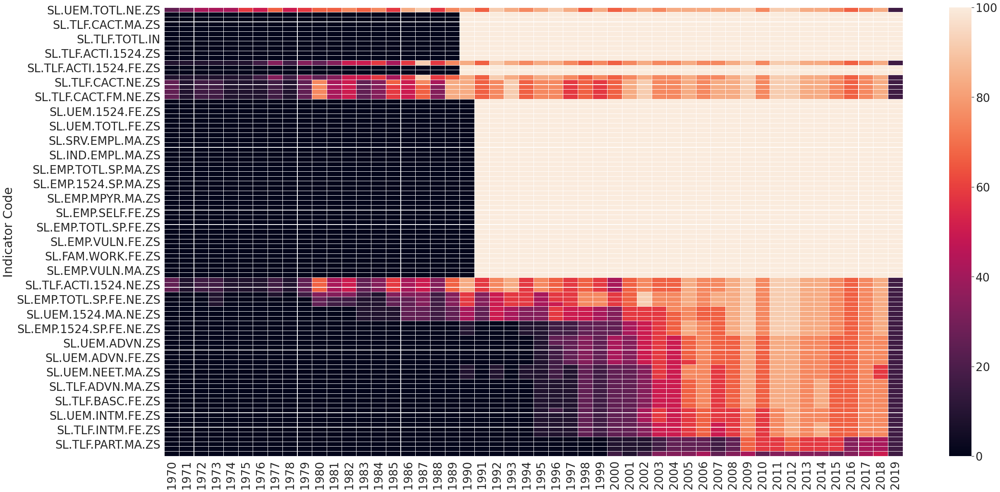

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(SocProtValuesByICode, cbar=True, linewidths=0.1,  vmin=0, vmax=100)
#sns.set(font_scale=2.5)

Como puede observarse graficamente, durante el periodo de 1970 a 1990 se concentra la mayor cantidad de nulos.

In [ ]:
SocProtByYear = pd.melt(social_protection.drop(["Country Code", "Country Name", "Indicator", "features"], axis=1), id_vars = ["Indicator Code"])
SocProtByYear["variable"] = pd.to_numeric(SocProtByYear["variable"] )
SocProtByYear = SocProtByYear.rename(columns = {"variable": "Year"})
TotalData_1990 = (SocProtByYear["Year"]<=1990).sum()
WithData_1990 = ((SocProtByYear["Year"]<=1990) & (SocProtByYear["value"]>0)).sum()

print( "El % de registros sin datos para el período de 1970 a 1990 es de: " +  str(round((1 - (WithData_1990/TotalData_1990))*100,2)) + "%") 

TotalData_2019 = (SocProtByYear["Year"]>1990).sum()
WithData_2019 = ((SocProtByYear["Year"]>1990) & (SocProtByYear["value"]>0)).sum()
Check = len (SocProtByYear) == (TotalData_2019 + TotalData_1990 )


print( "El % de registros sin datos para el período de 1991 a 2019 es de: " +  str(round((1 - (WithData_2019/TotalData_2019))*100,2)) + "%") 


El % de registros sin datos para el período de 1970 a 1990 es de: 94.62%
El % de registros sin datos para el período de 1991 a 2019 es de: 22.19%




Se seleccionan en un principio los 30 features con mas datos en toda la región:

In [ ]:
SocProtByYear = SocProtByYear.copy()

SocProtByYear = SocProtByYear.reset_index()
SocProtByYear["features"] = SocProtByYear["Indicator Code"]
SocProtByYear["features"] = SocProtByYear["features"].map(social_protection.set_index("Indicator Code")["features"].to_dict())
FeaturesSocProtSelection = SocProtByYear.iloc[0:30][["Indicator Code", "features"]].set_index("Indicator Code")
FeaturesSocProtSelection

,features
Indicator Code,
SL.UEM.TOTL.ZS,"Desempleo, total (% de la población activa total) (estimación modelado OIT)"
SL.UEM.TOTL.NE.ZS,"Desempleo, total (% de participación total en la fuerza laboral) (estimación nacional)"
SL.UEM.TOTL.MA.ZS,"Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)"
SL.UEM.TOTL.MA.NE.ZS,"Desempleo, varones (% de participación masculina en la fuerza laboral) (estimación nacional)"
SL.UEM.TOTL.FE.ZS,"Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)"
SL.UEM.TOTL.FE.NE.ZS,"Desempleo, mujeres (% de participación femenina en la fuerza laboral) (estimación nacional)"
SL.UEM.NEET.ZS,"Proporción de jóvenes sin educación, empleo ni capacitación, total (% de la población total de jóvenes)"
SL.UEM.NEET.MA.ZS,"Proporción de jóvenes sin educación, empleo ni capacitación, varones (% de la población de varones jóvenes)"
SL.UEM.NEET.FE.ZS,"Proporción de jóvenes sin educación, empleo ni capacitación, mujeres (% de la población de mujeres jóvenes)"


### Análisis por País para cada Feature

4. Volviendo a los resultados del punto 2, elegir como mínimo 15 Features por Indicador con al menos el 50% de valores no nulos (y en lo posible los mismos para todos los países) y mostrar gráficamente, con gráficos de distribución o de cajas por ejemplo, la distribución de los mismos. ¿Qué se puede observar de estas distribuciones? ¿Son normales? ¿Qué sucede con los outliers? ¿Observan alguna similitud entre los features elegidos?. Para estos mismos 15 Features realizar el gráfico de línea de su serie temporal y analizarlo.

Se construye una matriz para determinar cuál es el porcentaje de registros con datos considerando las 32 features seleccionadas por país y año. Es decir, por ejemplo, para Perú en el año 1970 el 3.33% de los features tiene valores.

In [ ]:
SocProtIDCode = FeaturesSocProtSelection.reset_index()['Indicator Code'].to_list()

RelevantFeaturesSocProt = social_protection[social_protection["Indicator Code"].isin(SocProtIDCode)]
SocProtDataByCountry = RelevantFeaturesSocProt.groupby("Country Name").count().drop(["features", "Indicator", "Country Code", "Indicator Code"], axis=1)
SocProtDataByCountry["Valor"] = SocProtDataByCountry.sum(axis=1)
SocProtDataByCountry = SocProtDataByCountry.sort_values(by=['Valor'], ascending=False)
SocProtDataByCountry = ((SocProtDataByCountry/len(RelevantFeaturesSocProt["Indicator Code"].unique()))*100).drop(columns = ["Valor"])
SocProtDataByCountry = SocProtDataByCountry.rename(columns = lambda x : str(x)[:4])
round(SocProtDataByCountry,2)

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Country Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Brasil,0.00,0.00,3.33,3.33,0.00,0.00,10.00,10.00,10.00,10.00,0.00,10.00,10.00,10.00,10.00,20.00,20.00,20.0,20.0,20.00,26.67,26.67,46.67,46.67,26.67,90.00,90.00,90.00,90.00,90.00,26.67,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,26.67,90.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00
Ecuador,0.00,0.00,0.00,0.00,3.33,3.33,0.00,3.33,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.0,10.0,10.00,16.67,36.67,36.67,36.67,36.67,36.67,46.67,46.67,46.67,36.67,100.00,100.00,46.67,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00
Perú,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,10.0,0.0,6.67,16.67,36.67,36.67,36.67,26.67,26.67,56.67,66.67,66.67,66.67,56.67,66.67,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,90.00,26.67
Uruguay,10.00,10.00,10.00,10.00,10.00,0.00,0.00,0.00,0.00,0.00,3.33,10.00,10.00,0.00,20.00,0.00,10.00,10.0,0.0,0.00,26.67,46.67,46.67,46.67,46.67,46.67,30.00,30.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,26.67
Chile,0.00,0.00,0.00,0.00,0.00,3.33,10.00,10.00,10.00,10.00,10.00,10.00,10.00,20.00,10.00,0.00,20.00,0.0,20.0,20.00,36.67,46.67,56.67,46.67,56.67,36.67,56.67,46.67,90.00,46.67,90.00,46.67,46.67,90.00,46.67,46.67,90.00,76.67,46.67,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,26.67
Paraguay,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.00,10.00,0.00,10.00,10.00,10.00,10.00,10.00,10.0,10.0,10.00,16.67,36.67,36.67,46.67,46.67,36.67,36.67,36.67,26.67,30.00,36.67,26.67,90.00,90.00,90.00,86.67,90.00,90.00,90.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,90.00,90.00,46.67,26.67
Argentina,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,10.00,10.00,10.00,3.33,3.33,10.0,10.0,10.00,16.67,36.67,36.67,36.67,36.67,36.67,36.67,36.67,36.67,36.67,36.67,36.67,66.67,66.67,100.00,100.00,100.00,30.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,26.67,26.67,100.00,100.00,26.67
Bolivia,0.00,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,10.00,20.00,20.0,10.0,10.00,16.67,36.67,36.67,36.67,36.67,46.67,66.67,66.67,26.67,36.67,66.67,36.67,36.67,26.67,36.67,80.00,80.00,80.00,90.00,100.00,26.67,90.00,90.00,90.00,90.00,90.00,90.00,90.00,80.00,26.67
Colombia,0.00,0.00,0.00,0.00,0.00,10.00,0.00,10.00,0.00,0.00,10.00,3.33,3.33,10.00,10.00,10.00,10.00,10.0,0.0,0.00,6.67,46.67,46.67,36.67,46.67,36.67,46.67,36.67,36.67,36.67,36.67,46.67,46.67,56.67,46.67,56.67,26.67,46.67,46.67,100.00,100.00,100.00,100.00,100.00,100.00,100.00,90.00,90.00,90.00,26.67


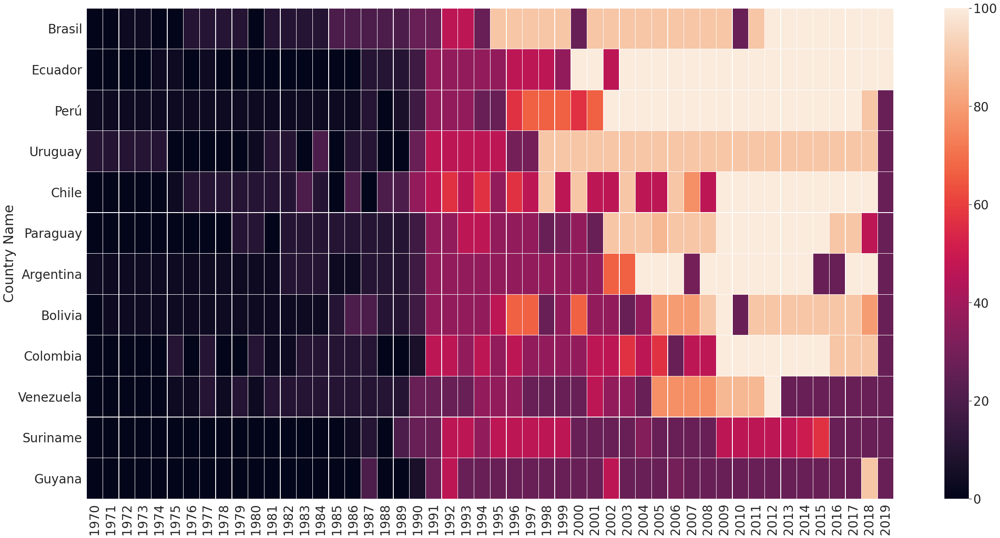

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(SocProtDataByCountry, cbar=True, linewidths=.3, vmin=0, vmax=100)

Se realiza un heatmap considerando como centro el 50% de esta forma se puede visualizar cuáles son las combinaciones que tienen mas del 50% de registros con datos.

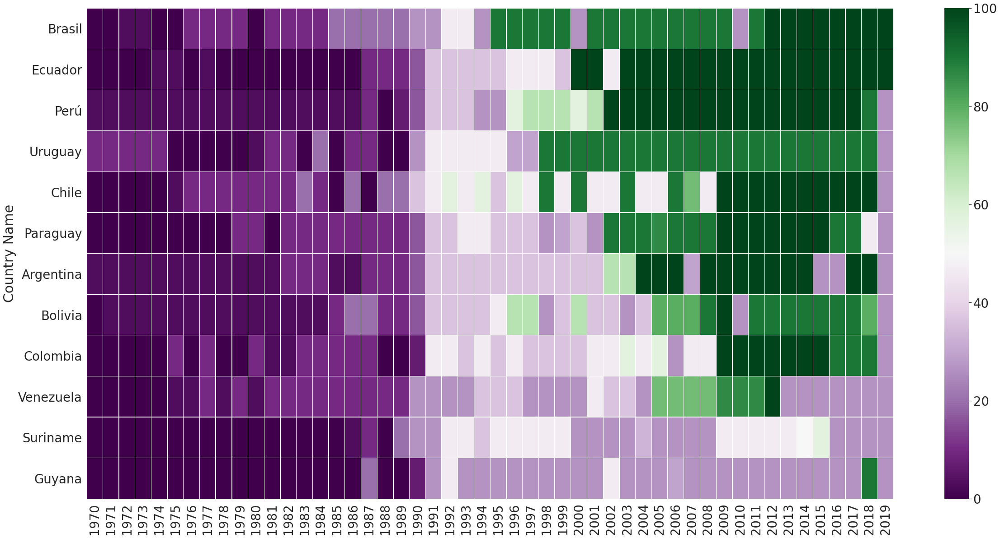

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(SocProtDataByCountry, cbar=True, linewidths=.3, center=50, cmap="PRGn")

In [ ]:
print("El % de países que tienen más del 50% de los features con datos para cada año es: \n" + str(round((SocProtDataByCountry[SocProtDataByCountry>50].count()/len(social_protection["Country Name"].unique()))*100, 0).astype(int)))

El % de países que tienen más del 50% de los features con datos para cada año es: 
1970    0 
1971    0 
1972    0 
1973    0 
1974    0 
1975    0 
1976    0 
1977    0 
1978    0 
1979    0 
1980    0 
1981    0 
1982    0 
1983    0 
1984    0 
1985    0 
1986    0 
1987    0 
1988    0 
1989    0 
1990    0 
1991    0 
1992    8 
1993    0 
1994    8 
1995    8 
1996    33
1997    25
1998    33
1999    25
2000    42
2001    33
2002    42
2003    67
2004    50
2005    75
2006    75
2007    67
2008    67
2009    83
2010    67
2011    83
2012    83
2013    75
2014    75
2015    75
2016    67
2017    75
2018    75
2019    17
dtype: int64


In [ ]:
SocProtByYear = pd.melt(RelevantFeaturesSocProt, id_vars = ["features", "Indicator" , "Country Name","Country Code", "Indicator Code"])
SocProtByYear["variable"] = pd.to_numeric(SocProtByYear["variable"] )
SocProtByYear = SocProtByYear.rename(columns = {"variable": "Year"})
SocProtByYear["Year"] = SocProtByYear["Year"].apply(lambda x: str(x)[:4])

SocProtByYear

,features,Indicator,Country Name,Country Code,Indicator Code,Year,value
0,"Desempleo, total (% de la población activa total) (estimación modelado OIT)",Social_protection,Argentina,ARG,SL.UEM.TOTL.ZS,1970,NaN
1,"Desempleo, total (% de participación total en la fuerza laboral) (estimación nacional)",Social_protection,Argentina,ARG,SL.UEM.TOTL.NE.ZS,1970,4.800000
2,"Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)",Social_protection,Argentina,ARG,SL.UEM.TOTL.MA.ZS,1970,NaN
3,"Desempleo, varones (% de participación masculina en la fuerza laboral) (estimación nacional)",Social_protection,Argentina,ARG,SL.UEM.TOTL.MA.NE.ZS,1970,NaN
4,"Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)",Social_protection,Argentina,ARG,SL.UEM.TOTL.FE.ZS,1970,NaN
...,...,...,...,...,...,...,...
17995,"Población activa, mujeres (% de la población activa total)",Social_protection,Suriname,SUR,SL.TLF.TOTL.FE.ZS,2019,38.159372
17996,"Empleo de tiempo parcial, total (% del total de empleo)",Social_protection,Suriname,SUR,SL.TLF.PART.ZS,2019,NaN
17997,"Empleo de tiempo parcial, hombres (% del total de hombres empleados)",Social_protection,Suriname,SUR,SL.TLF.PART.MA.ZS,2019,NaN
17998,"Empleo de tiempo parcial, mujeres (% del total de mujeres empleadas)",Social_protection,Suriname,SUR,SL.TLF.PART.FE.ZS,2019,NaN


A partir de 1991, todos los paises en análisis tienen información para más del 50% de los features relevantes. Esto se evidencia en el heatmap, donde aquellas combinaciones con más del 50% de registros se muestran en diferentes tonalidades de verdes. Aquellas combinaciones que no alcanzan el 50% de los registros tienen diferentes tonalidades de violeta.

Se modifica la estructura del dataset para poder analizar el porcentaje de registros con datos por país, por feature y por año, para decidir qué features considerar para cada país.

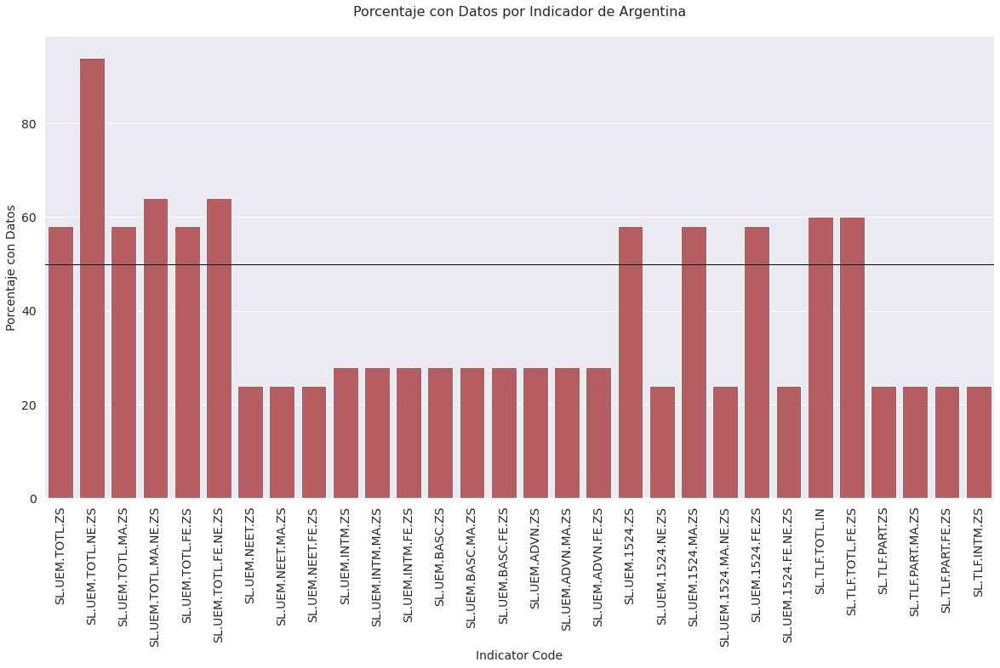

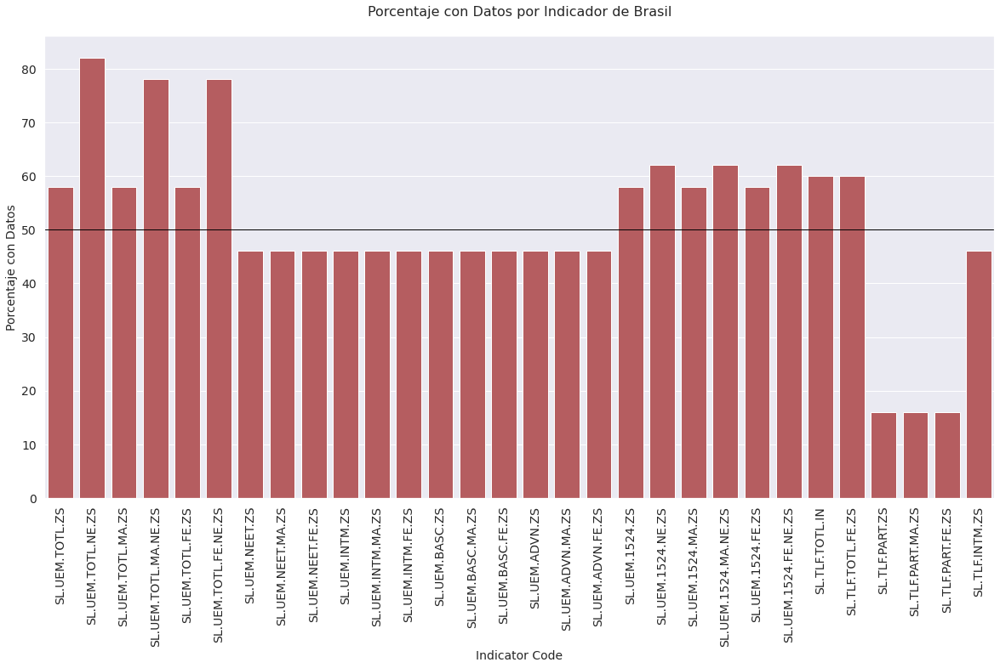

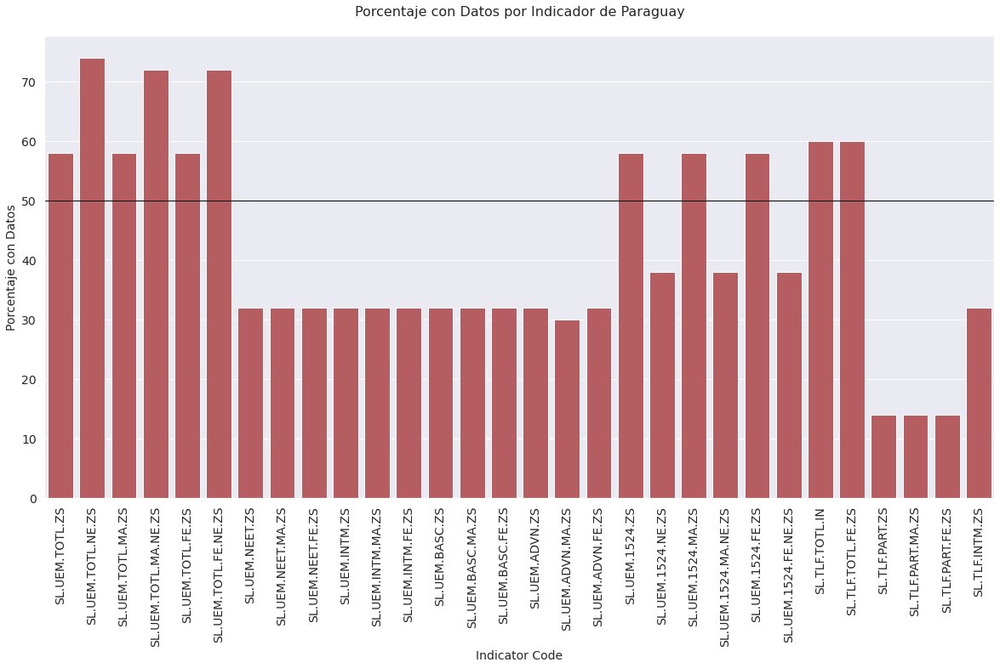

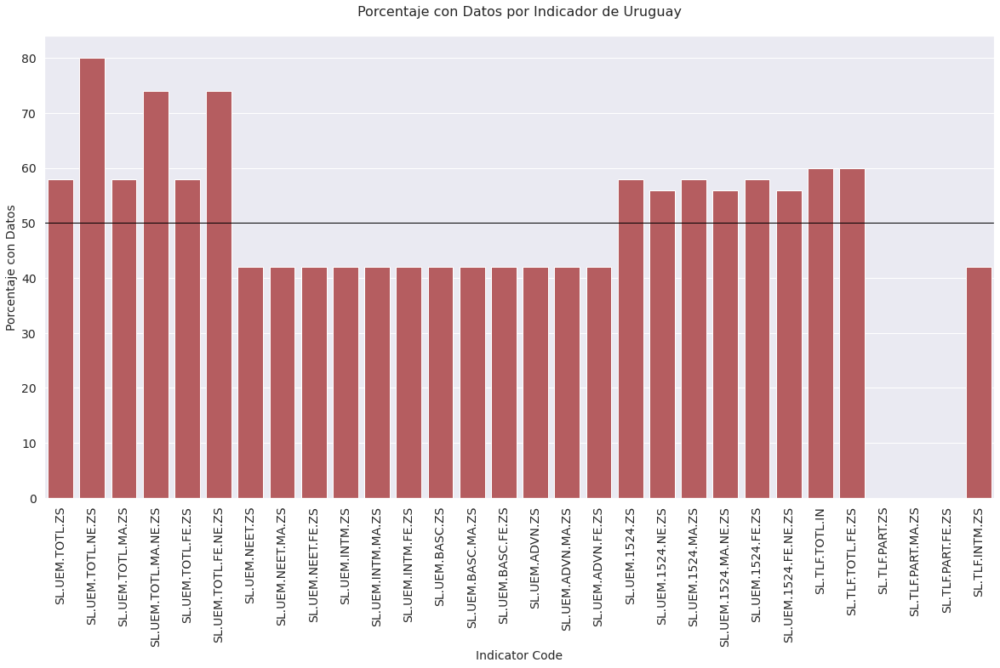

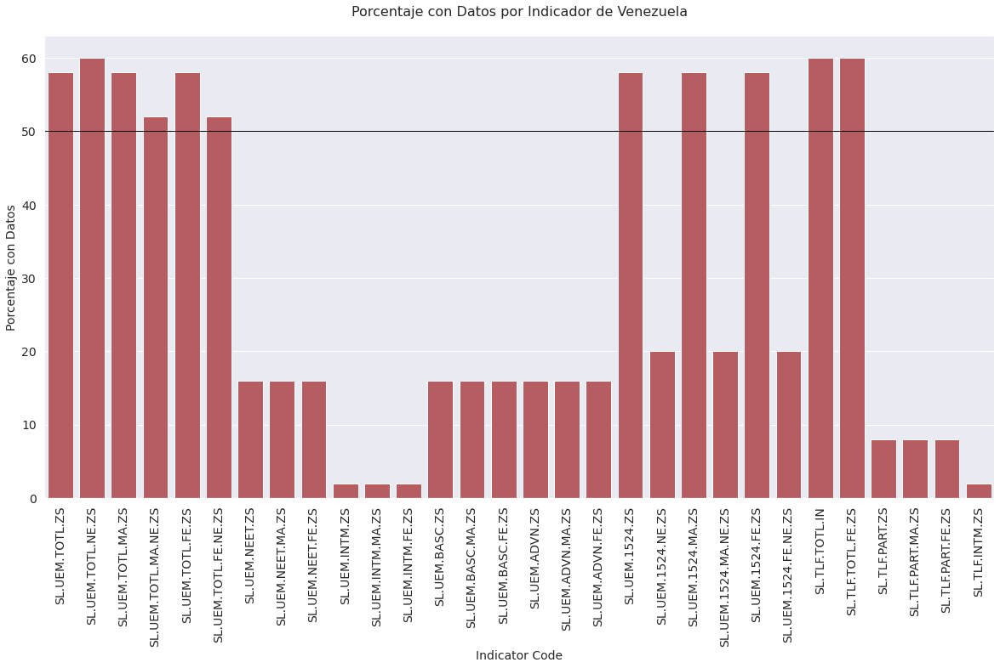

...

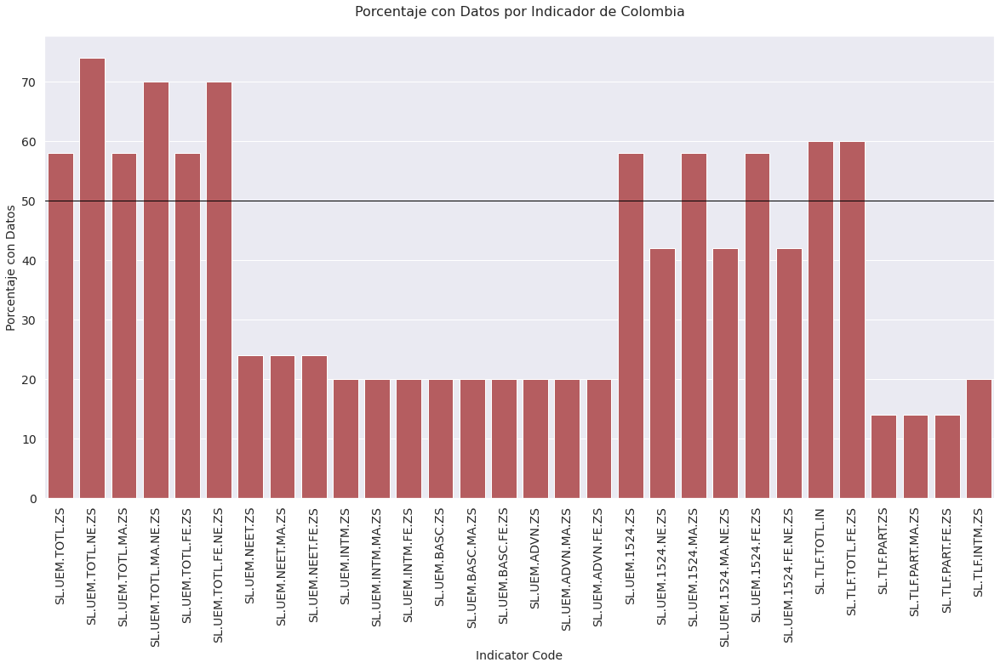

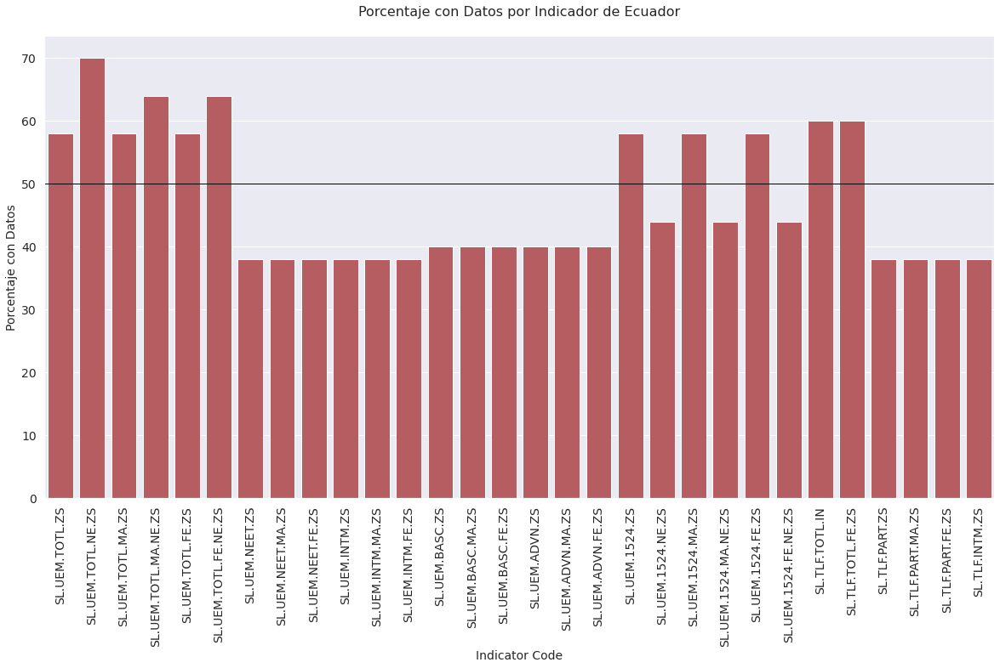

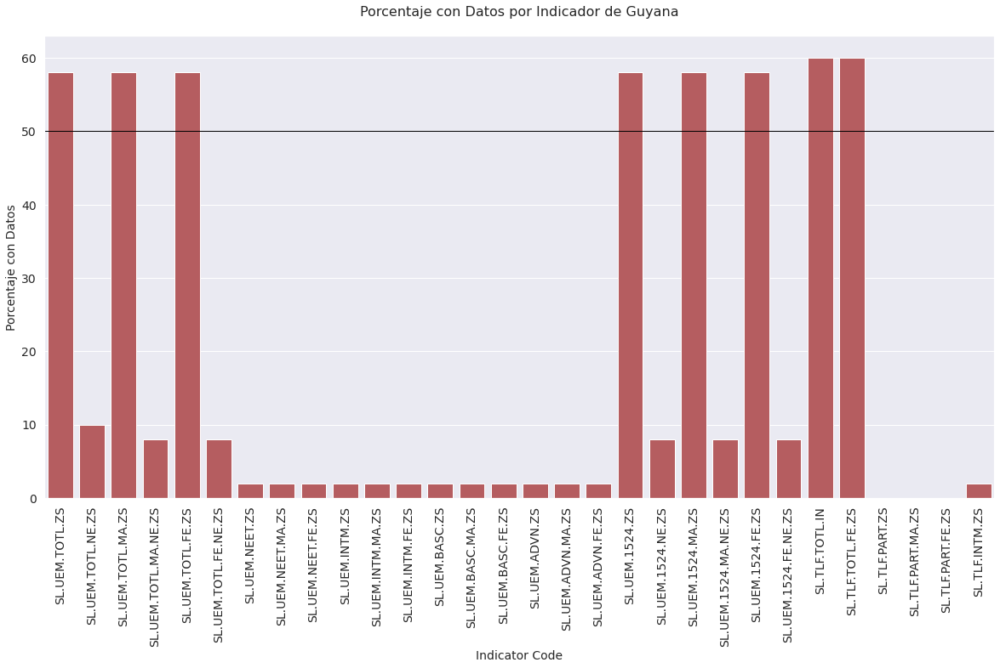

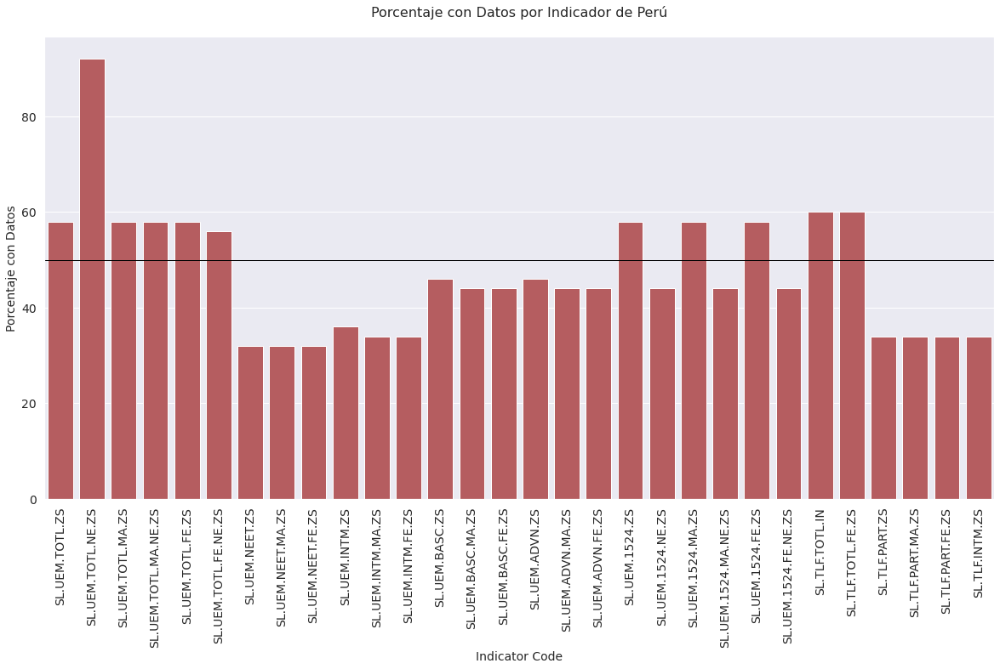

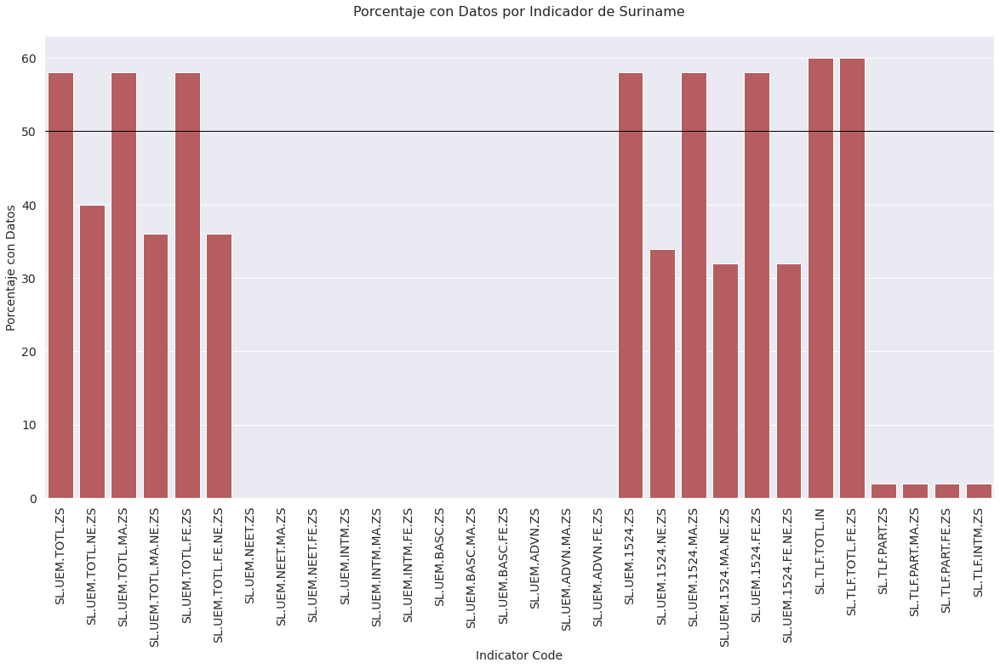

In [ ]:
SocProtFeaturesByID = RelevantFeaturesSocProt.drop(["Country Code", "Indicator", "features"], axis=1)
SocProtFeaturesByID = SocProtFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
SocProtFeaturesByID["Porcentaje de Registros"] = (SocProtFeaturesByID.sum(axis=1)/50)*100
SocProtFeaturesByID = SocProtFeaturesByID["Porcentaje de Registros"].reset_index().sort_values(by='Indicator Code', ascending=False)

countries = social_protection['Country Name'].drop_duplicates().to_list()
for country in countries:
    plt.figure(figsize=(20, 10))
    sns.barplot(x="Indicator Code", y="Porcentaje de Registros", data=SocProtFeaturesByID[SocProtFeaturesByID["Country Name"]== country], color = "r")
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('Indicator Code', fontsize=14)
    plt.ylabel('Porcentaje con Datos', fontsize=14)
    plt.title("Porcentaje con Datos por Indicador de " + str(country) + "\n", fontsize=16)
    plt.axhline(y=50,linewidth=1, color='black')

In [ ]:
SocProtFeaturesByID = RelevantFeaturesSocProt.drop(["Country Code", "Indicator", "features"], axis=1)
SocProtFeaturesByID = SocProtFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
SocProtFeaturesByID["Porcentaje de Registros"] = (SocProtFeaturesByID.sum(axis=1)/50)*100
SocProtFeaturesByID["Mayor a 50%"] = SocProtFeaturesByID["Porcentaje de Registros"]>50
SocProtFeaturesByID = SocProtFeaturesByID[["Porcentaje de Registros" , "Mayor a 50%"]].reset_index().sort_values(by='Indicator Code', ascending=False)
countries = gender['Country Name'].drop_duplicates()
SocProtIDbyCountry = []
for country in countries:
       SocProtIDbyCountry.append( SocProtFeaturesByID.loc[SocProtFeaturesByID["Country Name"]==country].iloc[0:15] )
SocProtIDbyCountry

[   Country Name        Indicator Code  Porcentaje de Registros  Mayor a 50%
 29  Argentina    SL.UEM.TOTL.ZS        58.0                     True       
 28  Argentina    SL.UEM.TOTL.NE.ZS     94.0                     True       
 27  Argentina    SL.UEM.TOTL.MA.ZS     58.0                     True       
 26  Argentina    SL.UEM.TOTL.MA.NE.ZS  64.0                     True       
 25  Argentina    SL.UEM.TOTL.FE.ZS     58.0                     True       
 24  Argentina    SL.UEM.TOTL.FE.NE.ZS  64.0                     True       
 23  Argentina    SL.UEM.NEET.ZS        24.0                     False      
 22  Argentina    SL.UEM.NEET.MA.ZS     24.0                     False      
 21  Argentina    SL.UEM.NEET.FE.ZS     24.0                     False      
 20  Argentina    SL.UEM.INTM.ZS        28.0                     False      
 19  Argentina    SL.UEM.INTM.MA.ZS     28.0                     False      
 18  Argentina    SL.UEM.INTM.FE.ZS     28.0                     False      

In [ ]:
SocProtIDFeatures = IDbyCountry[0]["Indicator Code"].unique()
SocProtIDFeatures

array(['SL.UEM.TOTL.ZS', 'SL.UEM.TOTL.NE.ZS', 'SL.UEM.TOTL.MA.ZS',
       'SL.UEM.TOTL.MA.NE.ZS', 'SL.UEM.TOTL.FE.ZS',
       'SL.UEM.TOTL.FE.NE.ZS', 'SL.UEM.NEET.ZS', 'SL.UEM.NEET.MA.ZS',
       'SL.UEM.NEET.FE.ZS', 'SL.UEM.INTM.ZS', 'SL.UEM.INTM.MA.ZS',
       'SL.UEM.INTM.FE.ZS', 'SL.UEM.BASC.ZS', 'SL.UEM.BASC.MA.ZS',
       'SL.UEM.BASC.FE.ZS'], dtype=object)

In [ ]:
                                                                                                 
print("Asignación de ID Code elegidos con su respectivo feature." )
social_protection[social_protection["Indicator Code"].isin(SocProtIDFeatures)][["Indicator Code", "features"]].drop_duplicates().reset_index().drop(columns=["index"])

Asignación de ID Code elegidos con su respectivo feature.


,Indicator Code,features
0,SL.UEM.TOTL.ZS,"Desempleo, total (% de la población activa total) (estimación modelado OIT)"
1,SL.UEM.TOTL.NE.ZS,"Desempleo, total (% de participación total en la fuerza laboral) (estimación nacional)"
2,SL.UEM.TOTL.MA.ZS,"Desempleo, varones (% de la población activa masculina) (estimación modelado OIT)"
3,SL.UEM.TOTL.MA.NE.ZS,"Desempleo, varones (% de participación masculina en la fuerza laboral) (estimación nacional)"
4,SL.UEM.TOTL.FE.ZS,"Desempleo, mujeres (% de la población activa femenina) (estimación modelado OIT)"
5,SL.UEM.TOTL.FE.NE.ZS,"Desempleo, mujeres (% de participación femenina en la fuerza laboral) (estimación nacional)"
6,SL.UEM.NEET.ZS,"Proporción de jóvenes sin educación, empleo ni capacitación, total (% de la población total de jóvenes)"
7,SL.UEM.NEET.MA.ZS,"Proporción de jóvenes sin educación, empleo ni capacitación, varones (% de la población de varones jóvenes)"
8,SL.UEM.NEET.FE.ZS,"Proporción de jóvenes sin educación, empleo ni capacitación, mujeres (% de la población de mujeres jóvenes)"
9,SL.UEM.INTM.ZS,Personas desempleadas con educación intermedia (% del desempleo total)


#### Histograma por Feature para cada país

Para realizar los siguientes análisis, se construye un dataset que tenga solo las columnas relevantes de análisis y que solo considere los ID Features seleccionados en el paso anterior. 

In [ ]:
columns=social_protection.columns
SocProtData=social_protection.drop(["Indicator", "Country Code", "features"], axis=1).rename(columns = lambda x : str(x)[:4] if x in columns[5:] else x)
SocProtData=SocProtData[SocProtData["Indicator Code"].isin(SocProtIDFeatures)]

In [ ]:
SocProtDataMelt = pd.melt(SocProtData, id_vars = ["Indicator Code" , "Country Name"])
SocProtDataMelt["variable"] = pd.to_numeric(SocProtDataMelt["variable"] )
SocProtDataMelt = SocProtDataMelt.rename(columns = {"variable": "Year"})

Se crea un dataset por país

In [ ]:
SocProtDataMelt = SocProtDataMelt.copy()
arg=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Argentina"]
bra=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Brasil"]
ur=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Uruguay"]
par=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Paraguay"]
ven=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Venezuela"]
bol=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Bolivia"]
chi=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Chile"]
guy=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Guyana"]
sur=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Suriname"]
col=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Colombia"]
ecu=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Ecuador"]
per=SocProtDataMelt[SocProtDataMelt["Country Name"]=="Perú"]

Se grafican los histogramas para cada ID Features

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:198: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:198: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.6/dist-packages/sea

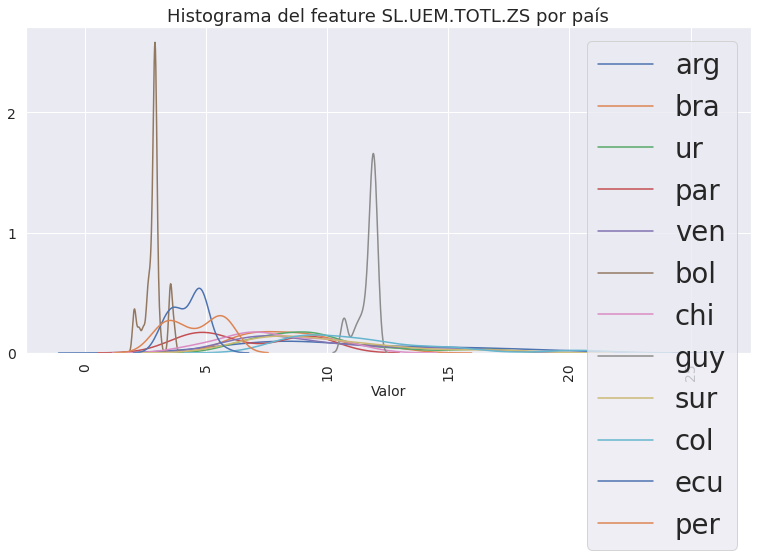

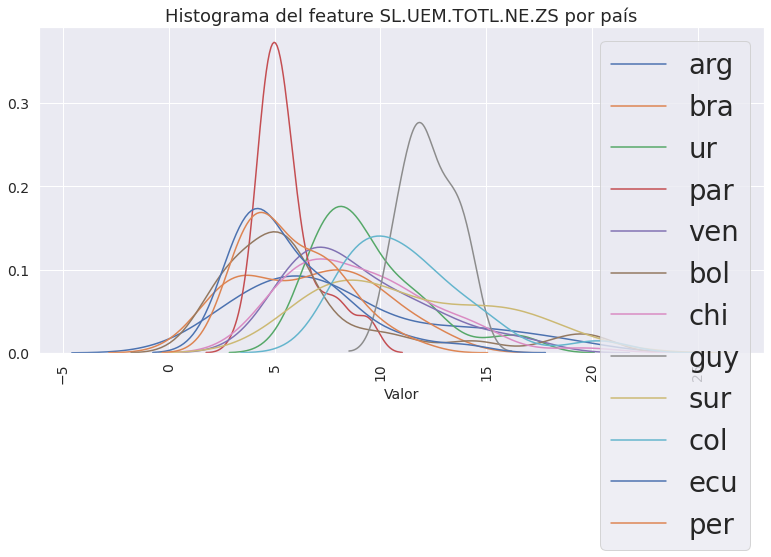

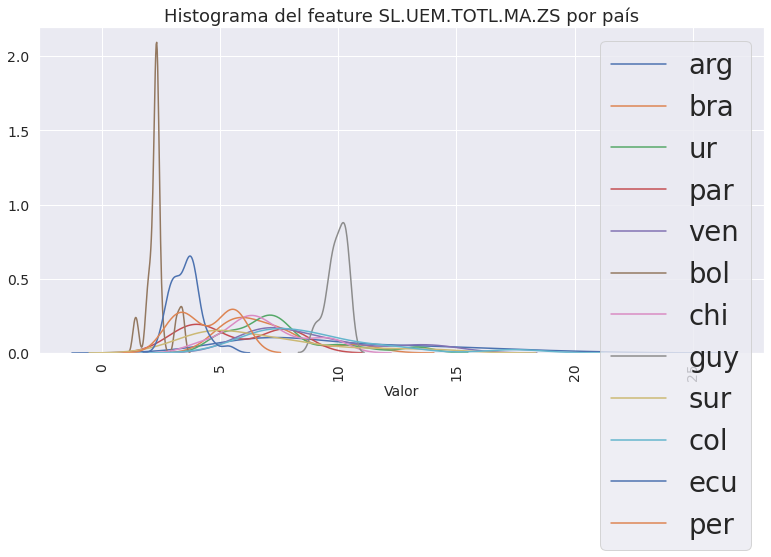

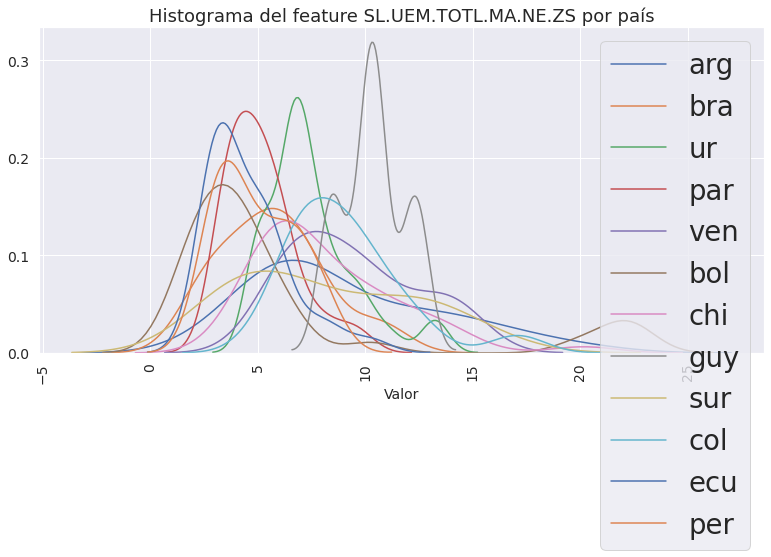

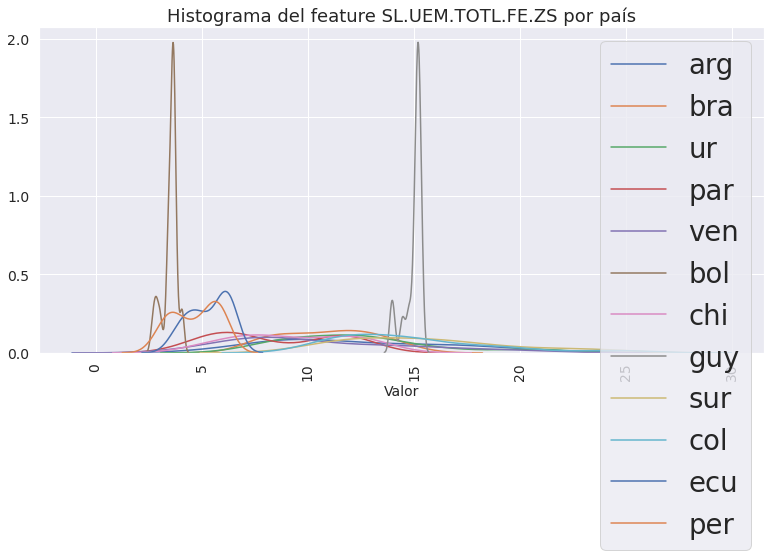

...

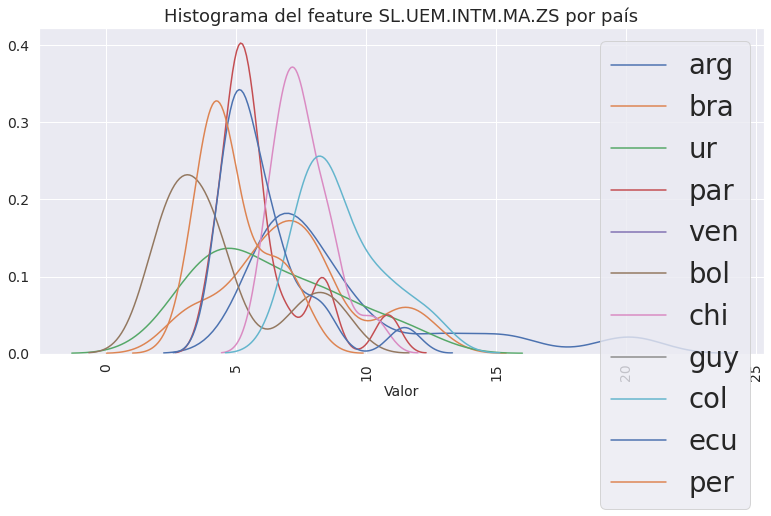

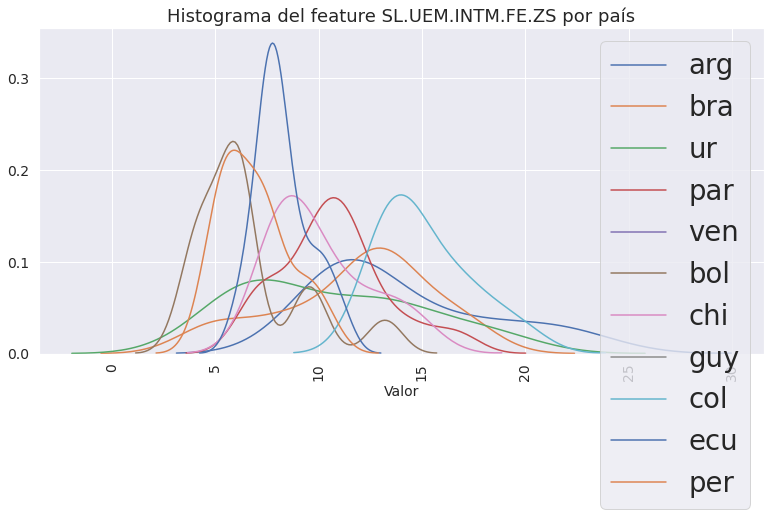

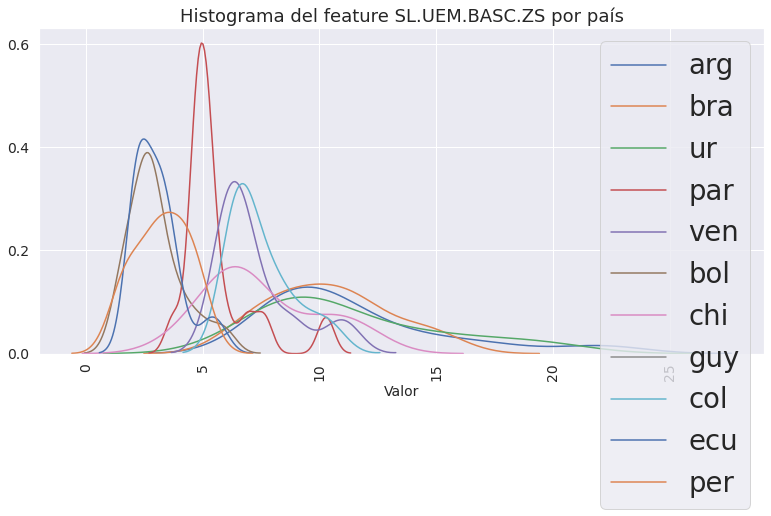

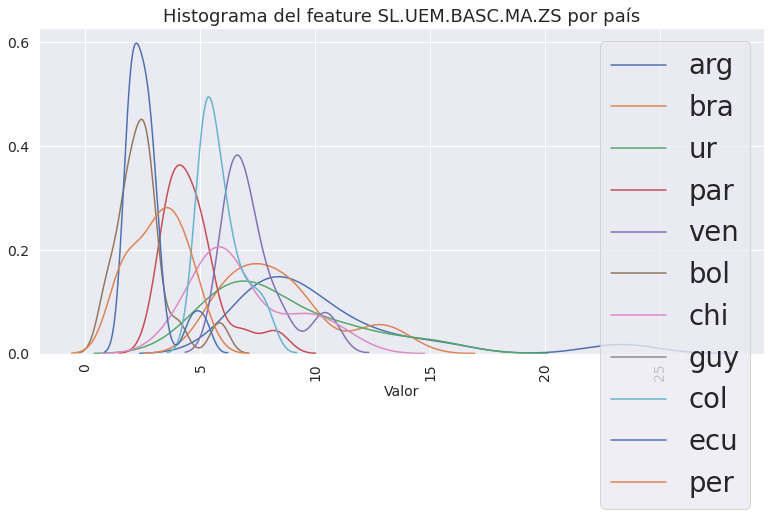

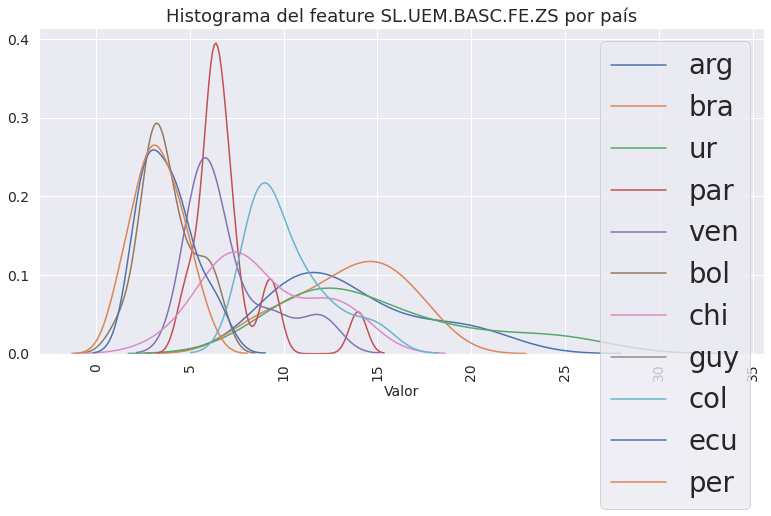

In [ ]:
SocProtIDbyCountry = SocProtIDbyCountry.copy()
SocProtIDFeatures = SocProtIDbyCountry[0]["Indicator Code"].unique()

for Features in SocProtIDFeatures:
    plt.figure(figsize=(13,6))
    sns.distplot(arg[arg["Indicator Code"]==Features]["value"], label="arg", hist=False)
    sns.distplot(bra[bra["Indicator Code"]==Features]["value"], label="bra", hist=False)
    sns.distplot(ur[ur["Indicator Code"]==Features]["value"], label="ur", hist=False)
    sns.distplot(par[par["Indicator Code"]==Features]["value"], label="par", hist=False)
    sns.distplot(ven[ven["Indicator Code"]==Features]["value"], label="ven", hist=False)
    sns.distplot(bol[bol["Indicator Code"]==Features]["value"], label="bol", hist=False)
    sns.distplot(chi[chi["Indicator Code"]==Features]["value"], label="chi", hist=False)
    sns.distplot(guy[guy["Indicator Code"]==Features]["value"], label="guy", hist=False)
    sns.distplot(sur[sur["Indicator Code"]==Features]["value"], label="sur", hist=False)
    sns.distplot(col[col["Indicator Code"]==Features]["value"], label="col", hist=False)
    sns.distplot(ecu[ecu["Indicator Code"]==Features]["value"], label="ecu", hist=False)
    sns.distplot(per[per["Indicator Code"]==Features]["value"], label="per", hist=False)
    plt.title("Histograma del feature "+ str(Features) + " por país", fontsize=18)
    plt.legend( loc='upper right', borderaxespad=0.5)
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('Valor', fontsize=14)
    

Como puede evidenciarse en todos los histogramas, las distribuciones de cada feature en los diferentes países difiere bastante. Es decir, en la región cada uno de los features se distribuye diferente dependiendo del país que se analice. Es posible que con un análisis mas detallado de cada feature, se encuentren países donde la feature se distribuye similar.

#### BoxPlot por Feature

Para profundizar el análisis llevado a cabo hasta ahora, se construyen Box Plot para cada feature por país. 

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


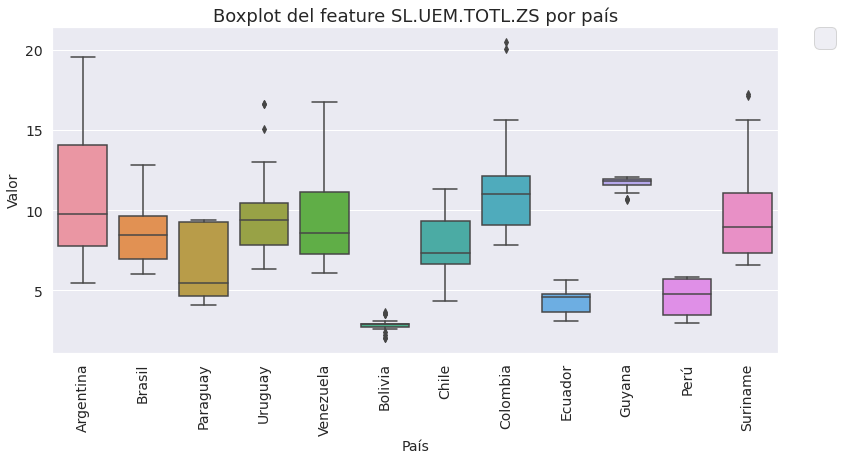

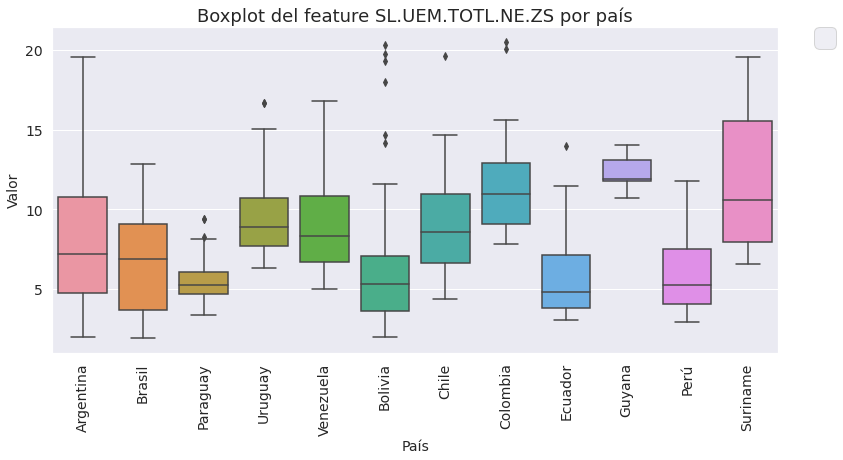

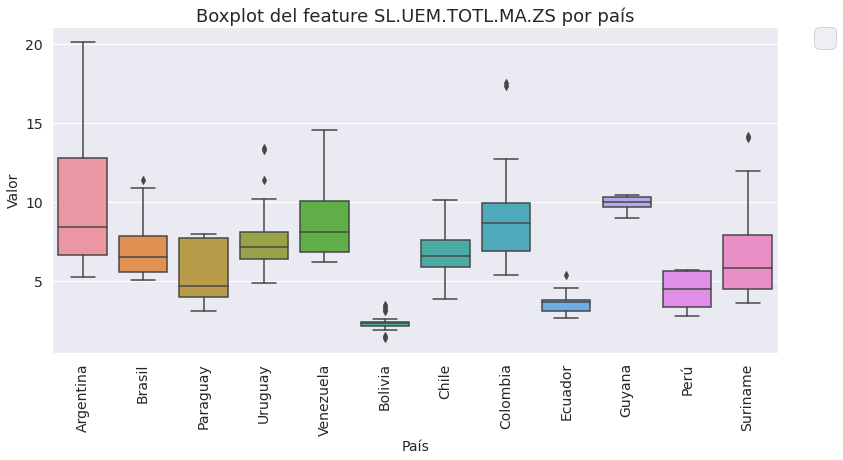

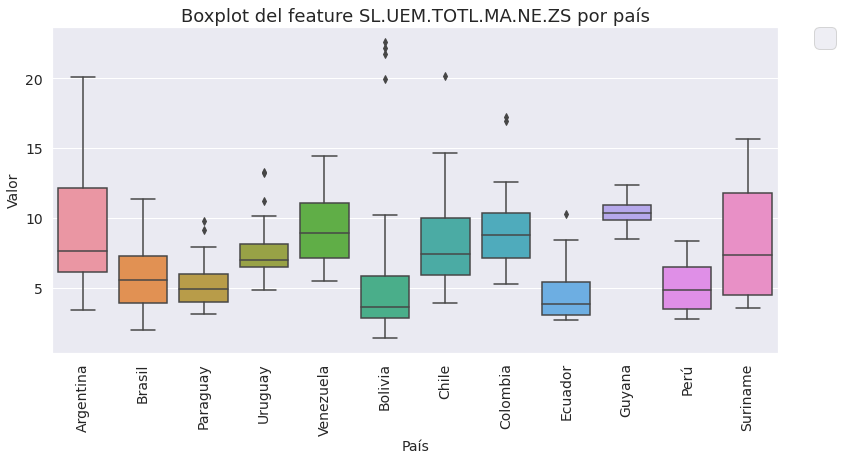

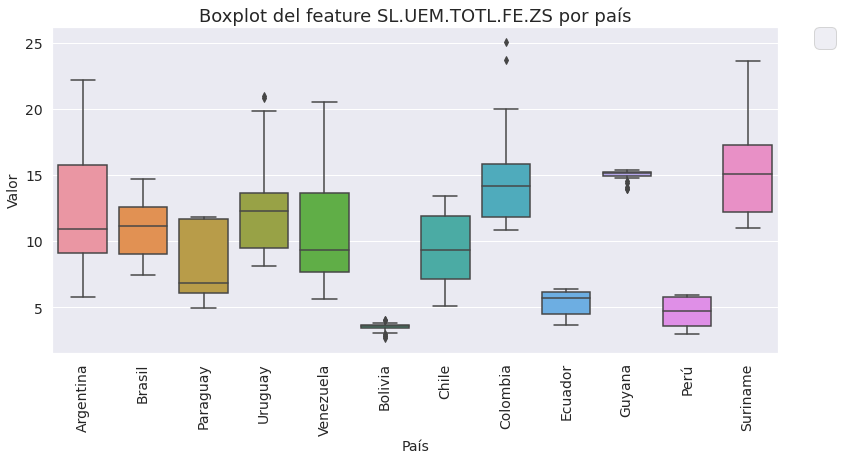

...

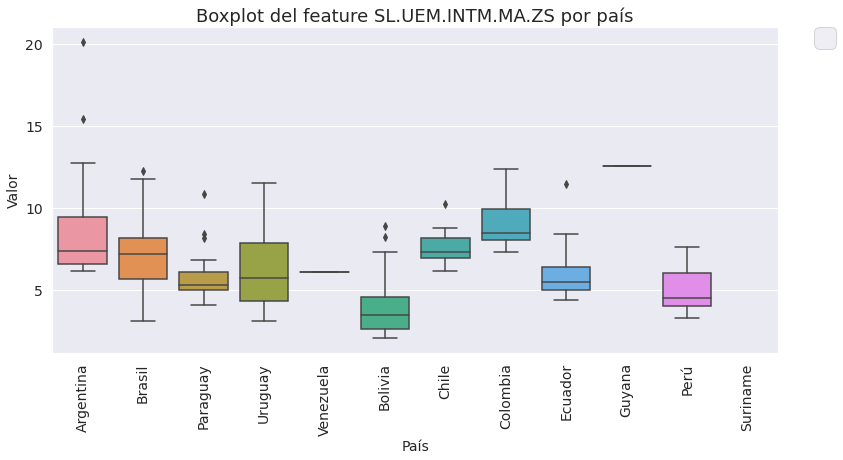

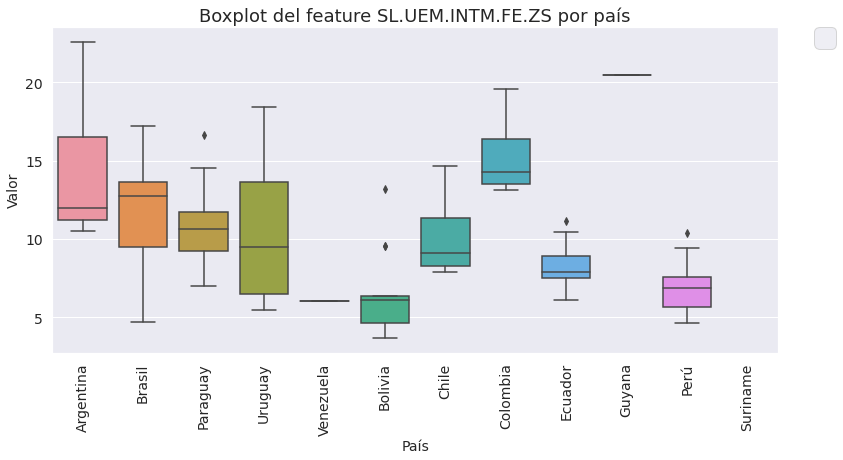

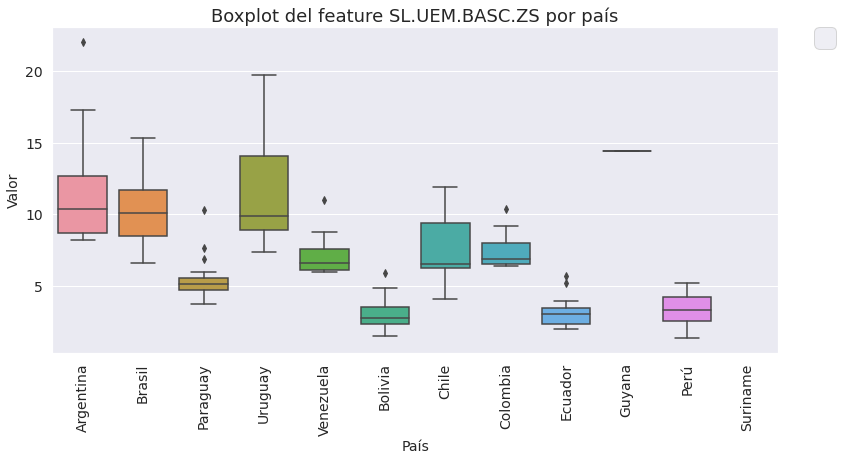

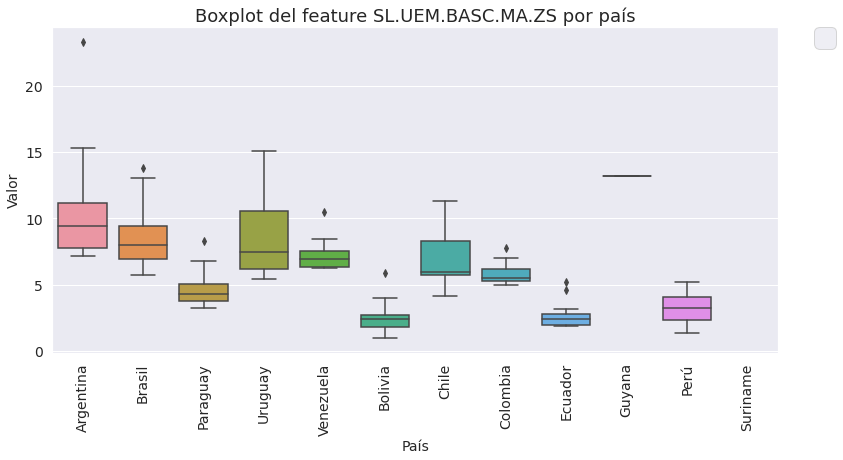

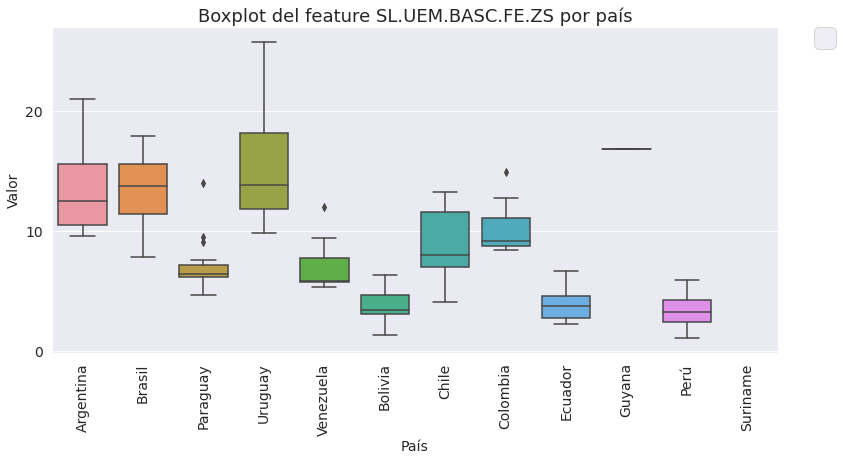

In [ ]:
SocProtIDbyCountry = SocProtIDbyCountry.copy()
SocProtIDFeatures = SocProtIDbyCountry[0]["Indicator Code"].unique()
SocProtDataMelt = SocProtDataMelt.copy()

for Features in SocProtIDFeatures:
    plt.figure(figsize=(13,6))
    sns.boxplot(data=SocProtDataMelt[SocProtDataMelt["Indicator Code"]==Features], x="Country Name", y="value")
    plt.title("Boxplot del feature "+ str(Features) + " por país", fontsize=18)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('País', fontsize=14)
    plt.ylabel('Valor', fontsize=14)


#### Series Temporales de los Features por País

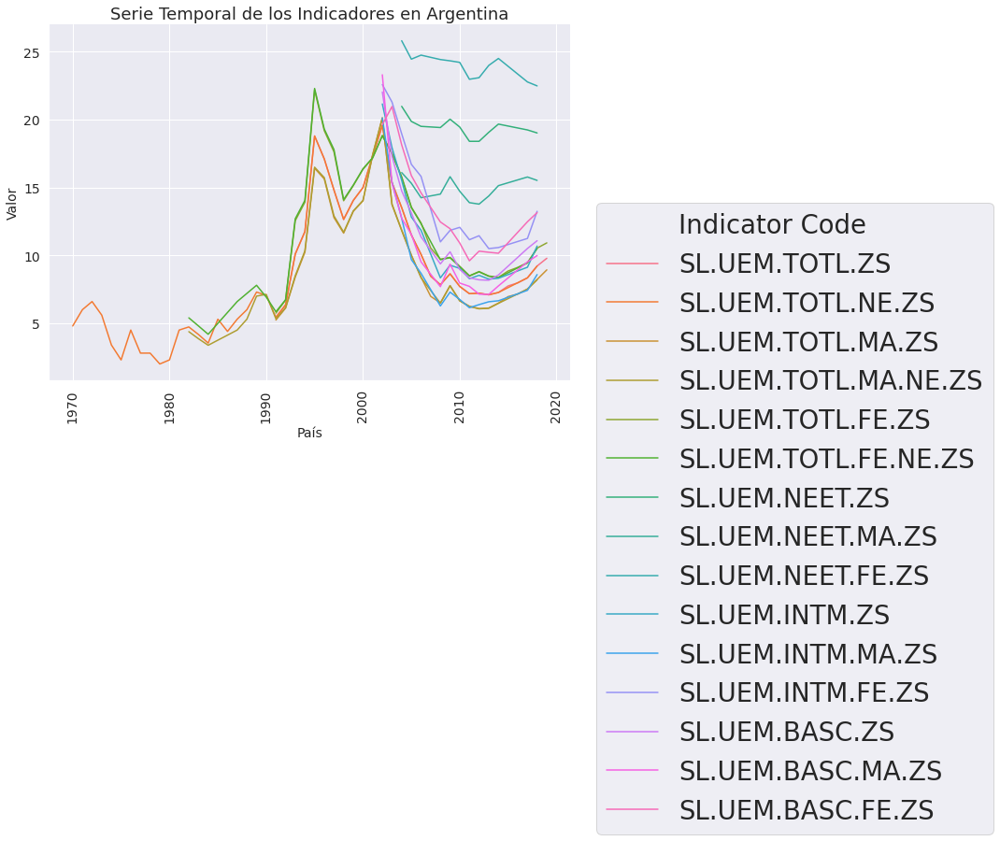

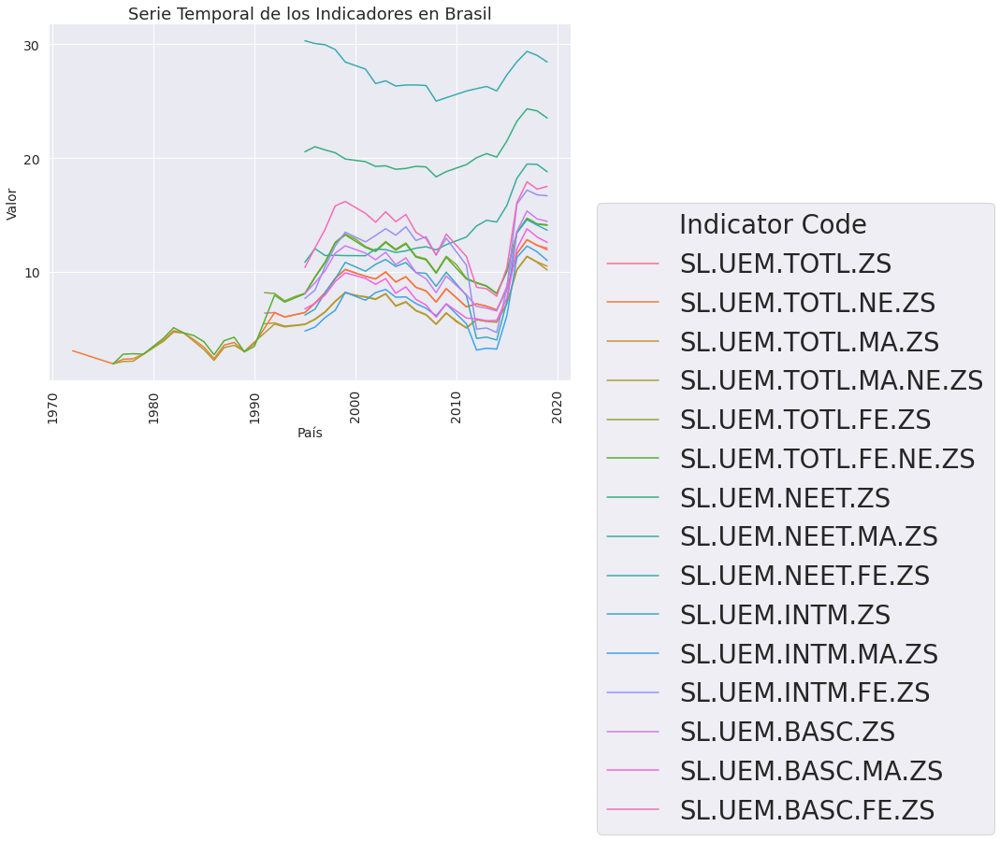

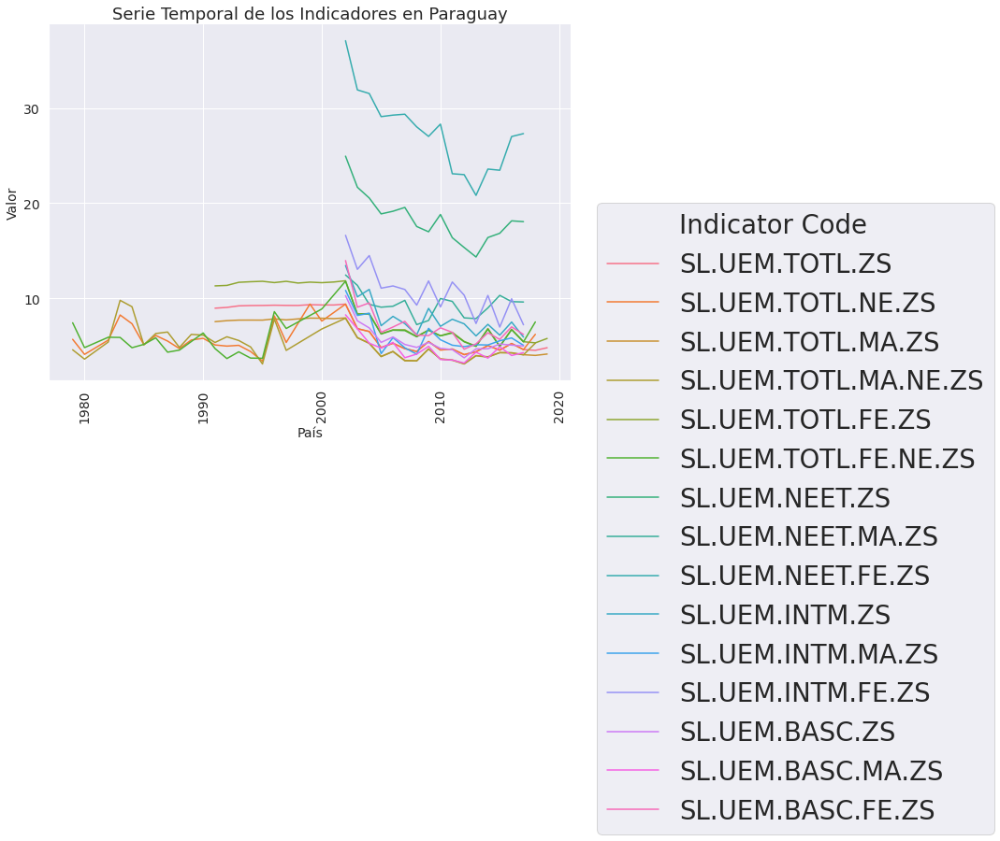

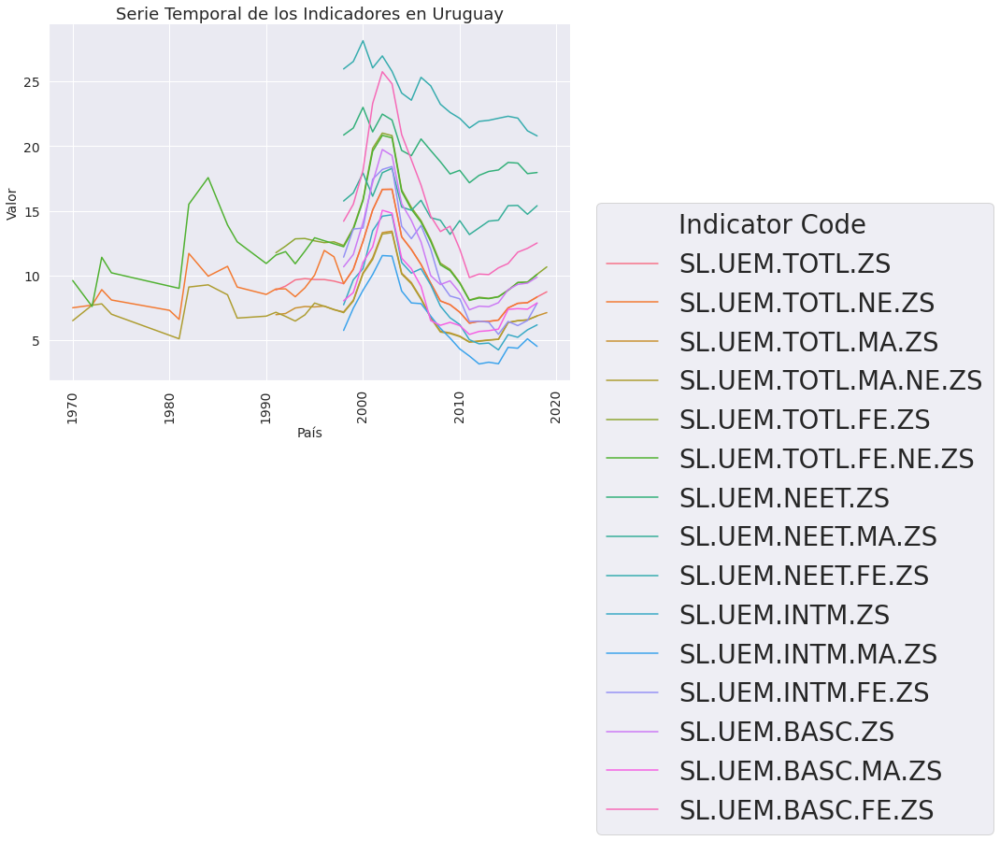

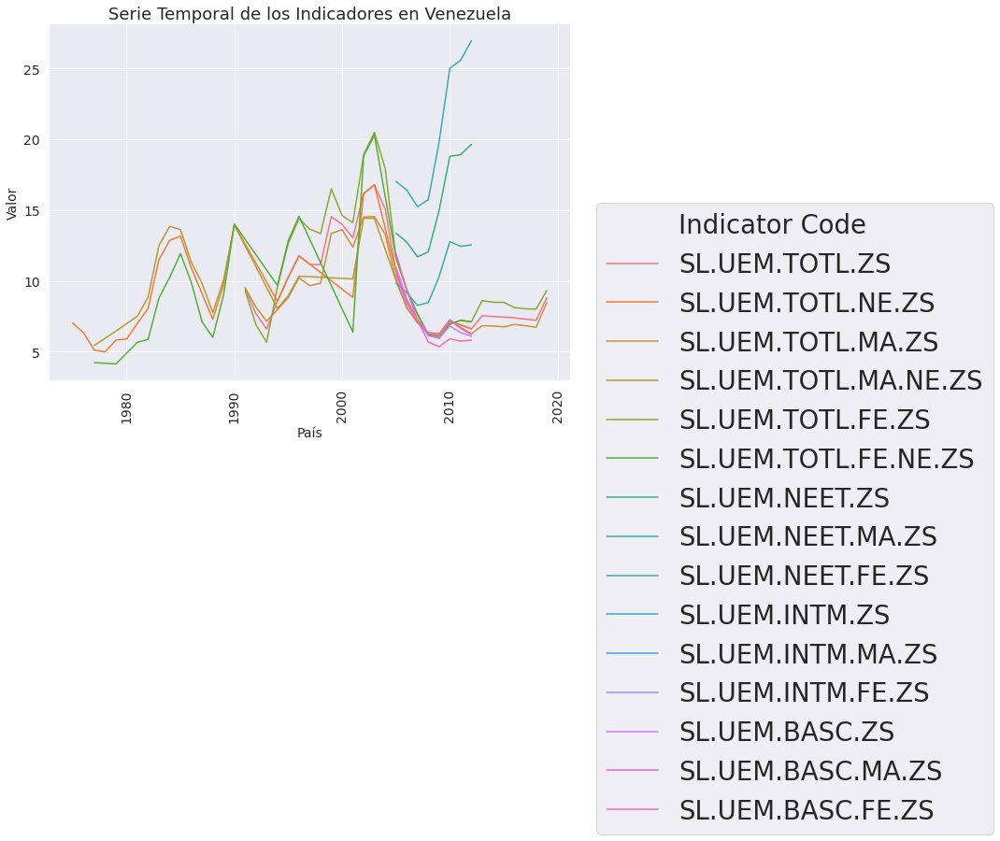

...

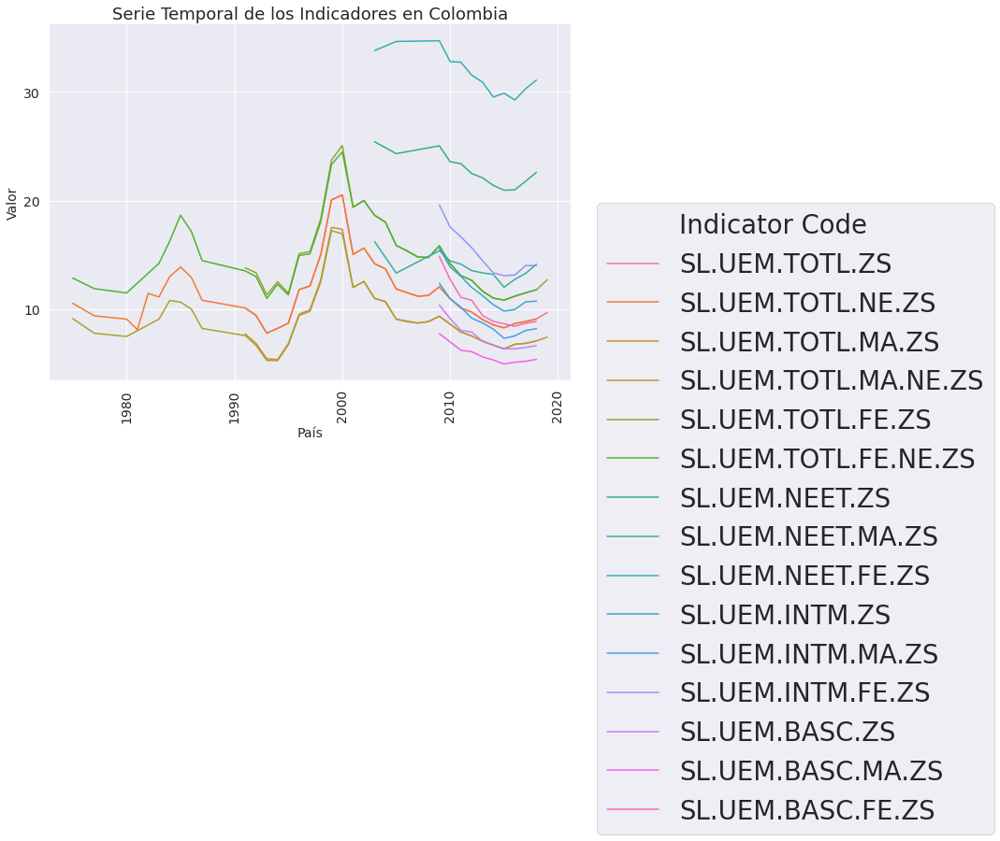

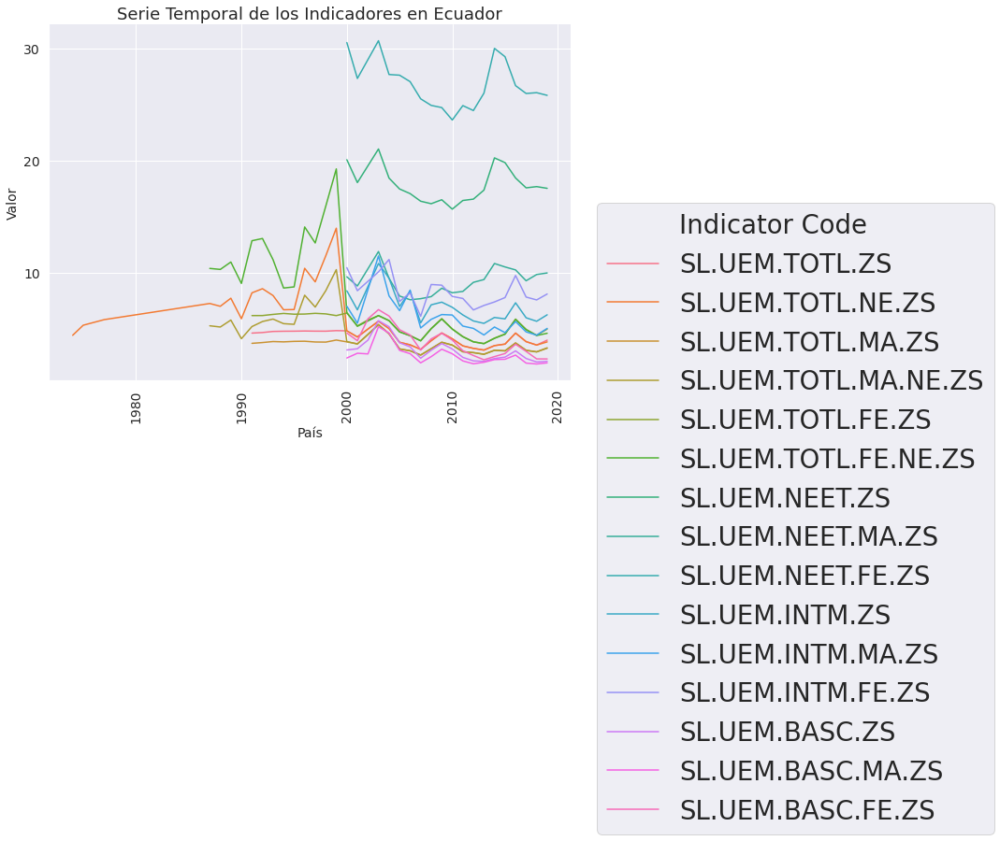

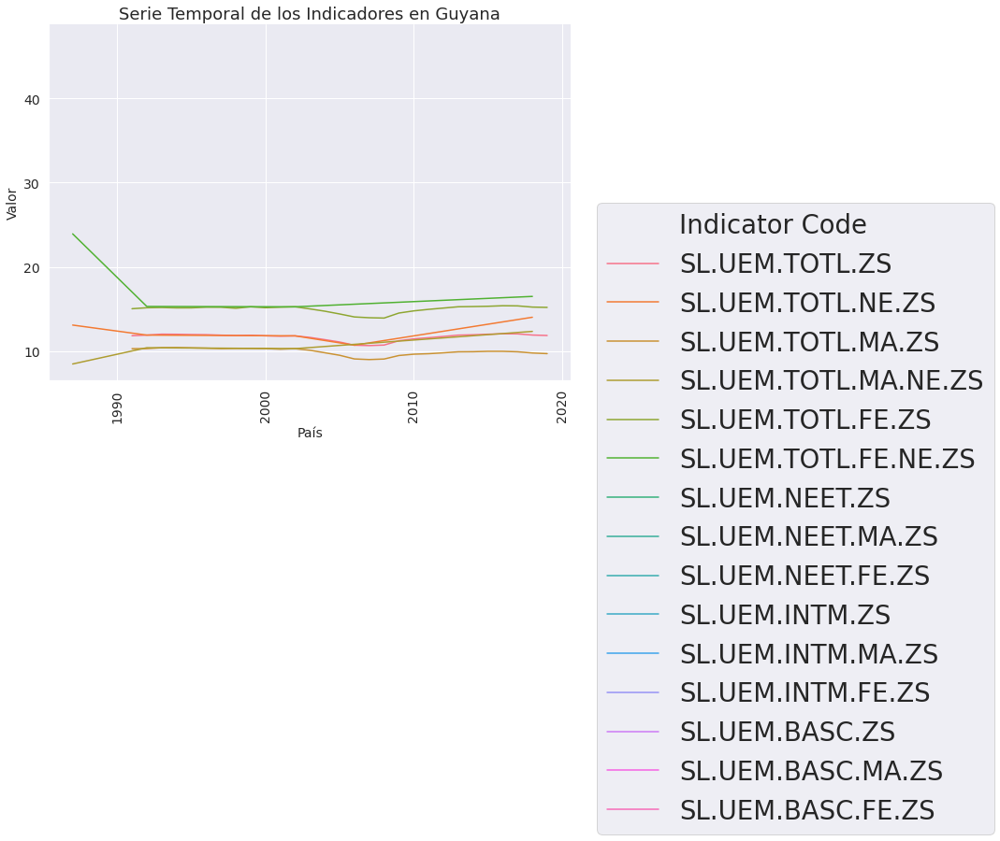

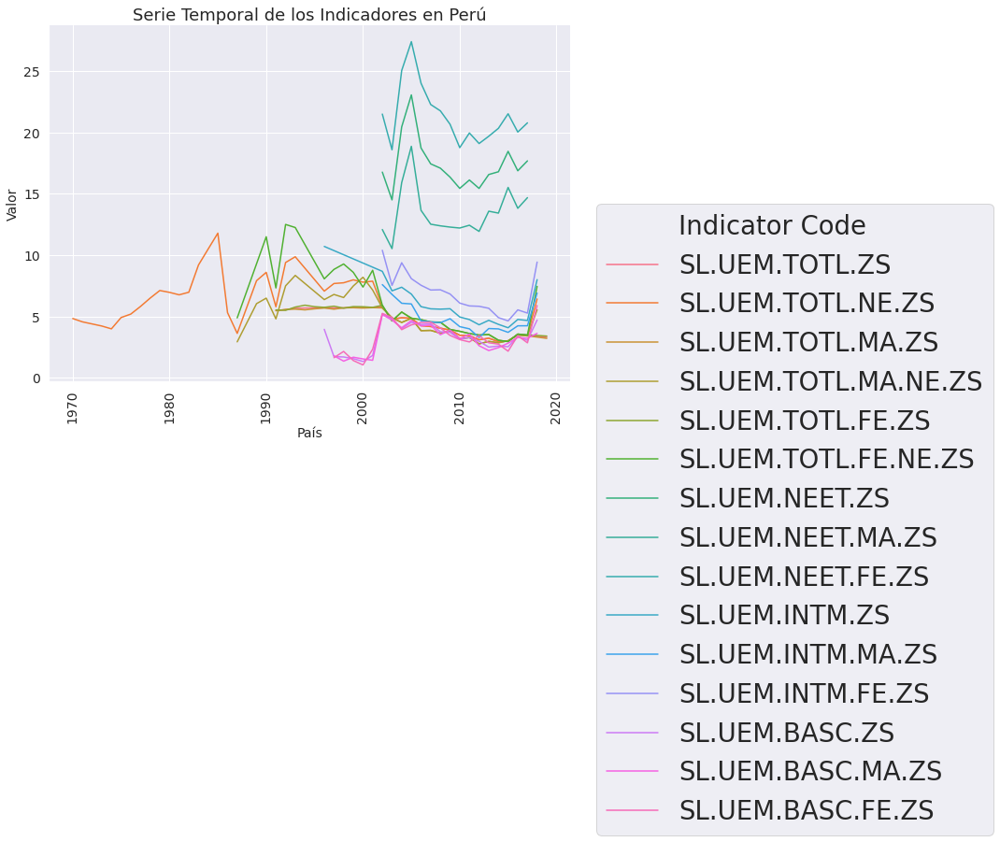

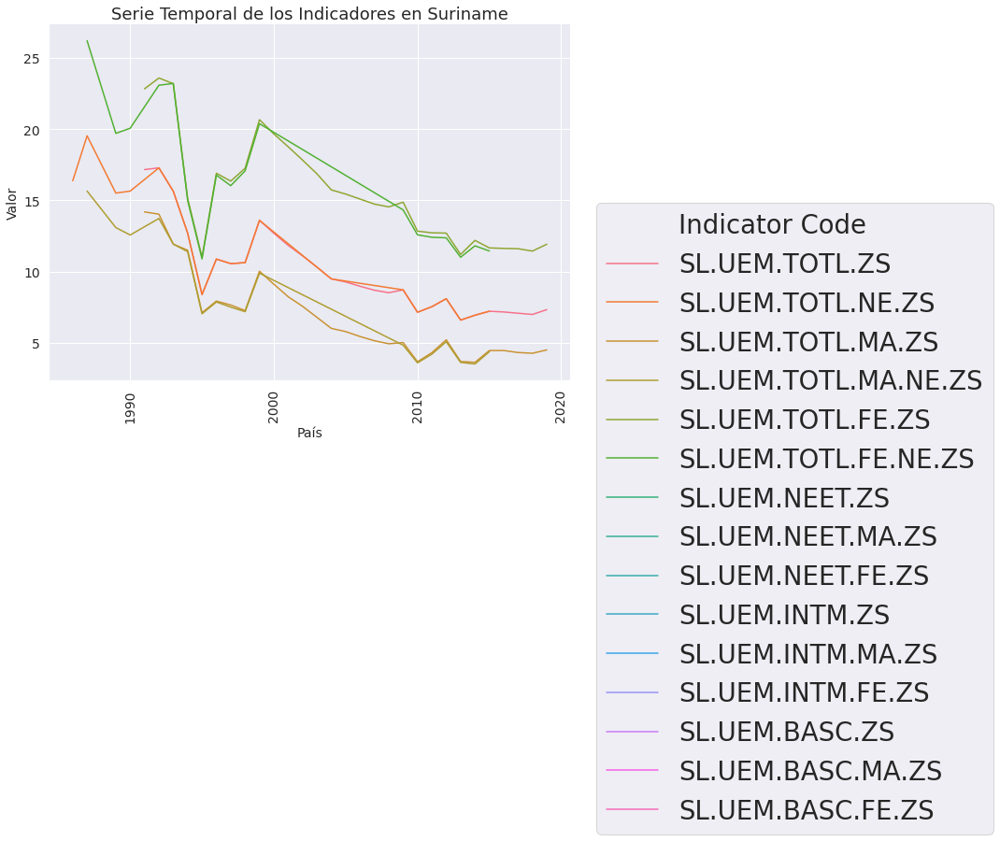

In [ ]:
countries = social_protection['Country Name'].drop_duplicates().to_list()
SocProtDataMelt = SocProtDataMelt.copy()
for country in countries:
    plt.figure(figsize=(10,7))
    sns.lineplot(data=SocProtDataMelt[SocProtDataMelt["Country Name"]==country], x="Year", y="value", hue="Indicator Code")
    plt.title("Serie Temporal de los Indicadores en " + str(country), fontsize=18)
    sns.despine()
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('País', fontsize=14)
    plt.ylabel('Valor', fontsize=14)
    plt.xticks(rotation=90)
    plt.legend(bbox_to_anchor=(1.05, 0.5), loc='upper left', borderaxespad=0.)

### Determinación de Año a Predecir

Una vez seleccionados los indicadores a predecir por país para la dimensión de educación, se verifica que todos los indicadores seleccionados tengan información para el año 2019, para elegirlo como año prueba. Si no se cumple la condición, entonces, se replica el análisis para el año 2018, y se opta por considerarlo como año a predecir.

In [ ]:
featureWOData_2019  = SocProtData["2019"].isna().sum()
SPData_2019 = (featureWOData_2019/len(SocProtData["2019"]))*100

print("De las 15 features seleccionadas para Protección Social, el " + str(round(SPData_2019, 2)) + "% no posee información para el año 2019." )

featureWOData_2018  = SocProtData["2018"].isna().sum()

SPData_2018 = (featureWOData_2018/len(SocProtData["2018"]))*100

print("De las 15 features seleccionadas para Protección Social, el " + str(round(SPData_2018, 2)) + "% no posee información para el año 2018." )



De las 15 features seleccionadas para Protección Social, el 66.67% no posee información para el año 2019.
De las 15 features seleccionadas para Protección Social, el 21.67% no posee información para el año 2018.


Teniendo el cuenta que para el año 2019 falta información en mas del 50% se decide seleccionar el año 2018

## POBREZA

1. ¿Cuántos **tipos de Features diferentes** existen por indicador considerado? ¿Todos los países mantienen esa misma cantidad para el mismo indicador?

In [ ]:
print("El indicador de Pobreza tiene " + str(len(poverty["features"].unique())) + " features.")
print("El análisis se lleva a cabo consdierando " + str(len(poverty["Country Name"].unique())) + " países.")
print(poverty["Country Name"].unique())

El indicador de Pobreza tiene 15 features.
El análisis se lleva a cabo consdierando 12 países.
['Argentina' 'Brasil' 'Paraguay' 'Uruguay' 'Venezuela' 'Bolivia' 'Chile'
 'Colombia' 'Ecuador' 'Guyana' 'Perú' 'Suriname']


In [ ]:
countries = poverty['Country Name'].unique()

for country in countries:
    
    print("La cantidad de features que posee " + str(country) + ": " + str(poverty[poverty['Country Name']==country]['features'].count()) )

La cantidad de features que posee Argentina: 15
La cantidad de features que posee Brasil: 15
La cantidad de features que posee Paraguay: 15
La cantidad de features que posee Uruguay: 15
La cantidad de features que posee Venezuela: 15
La cantidad de features que posee Bolivia: 15
La cantidad de features que posee Chile: 15
La cantidad de features que posee Colombia: 15
La cantidad de features que posee Ecuador: 15
La cantidad de features que posee Guyana: 15
La cantidad de features que posee Perú: 15
La cantidad de features que posee Suriname: 15


### Análisis por Feature para toda la Región

2.  ¿Cuál es la **proporción de valores nulos** para cada Feature dentro de cada Indicador con respecto al intervalo temporal considerado? ¿Estos valores nulos se encuentran dispersos a lo largo de todo el intervalo temporal o existen agrupamientos (más chicos y/o más grandes) de los mismos? ¿Qué decisión se podría tomar con respecto a los mismos en un futuro?

In [ ]:
print("Los features de Pobreza que existen son los siguientes: \n", str(poverty['features'].unique()))

Los features de Pobreza que existen son los siguientes: 
 ['Poverty gap at $5.50 a day (2011 PPP) (%)'
 'Poverty headcount ratio at $5.50 a day (2011 PPP) (% of population)'
 'Tasa de incidencia de la pobreza, sobre la base de la línea de pobreza nacional (% de la población)'
 'Poverty gap at $3.20 a day (2011 PPP) (%)'
 'Poverty headcount ratio at $3.20 a day (2011 PPP) (% of population)'
 'Índice de Gini' 'Brecha de pobreza a $1,90 por día (2011 PPA) (%)'
 'Tasa de incidencia de la pobreza, sobre la base de $1,90 por día (2011 PPA) (% de la población)'
 'Participación en el ingreso del 20% peor remunerado de la población'
 'Participación en el ingreso del 10% peor remunerado de la población'
 'Participación en el ingreso del 10% mejor remunerado de la población'
 'Participación en el ingreso del 20% mejor remunerado de la población'
 'Participación en el ingreso del cuarto quintilo (20%) de la población en orden decreciente de remuneraciones'
 'Participación en el ingreso del tercer 

Para llevar a cabo el análisis de los datos nulos, se construye una matriz por feature y por año en la que se muestra el porcentaje de registros existentes para cada combinación considerando toda la región.

In [ ]:
PovertyValuesByICode = poverty.groupby("Indicator Code").count().drop(["Country Code", "Country Name", "Indicator", "features"], axis=1)
PovertyValuesByICode["Valor"] = PovertyValuesByICode.sum(axis=1)
PovertyValuesByICode = PovertyValuesByICode.sort_values(by=['Valor'], ascending=False)
PovertyValuesByICode = ((PovertyValuesByICode/12)*100).drop(columns = ["Valor"])
PovertyValuesByICode = PovertyValuesByICode.rename(columns = lambda x : str(x)[:4])
round(PovertyValuesByICode,2)

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Indicator Code,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
SI.POV.DDAY,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,16.67,8.33,8.33,8.33,8.33,16.67,33.33,8.33,16.67,25.0,8.33,66.67,16.67,25.0,41.67,41.67,50.00,58.33,75.00,58.33,66.67,66.67,75.00,75.00,75.00,75.0,58.33,66.67,75.00,50.0,75.00,66.67,75.00,66.67,66.67,66.67,75.00,66.67,0.00
SI.POV.GAPS,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,16.67,8.33,8.33,8.33,8.33,16.67,33.33,8.33,16.67,25.0,8.33,66.67,16.67,25.0,41.67,41.67,50.00,58.33,75.00,58.33,66.67,66.67,75.00,75.00,75.00,75.0,58.33,66.67,75.00,50.0,75.00,66.67,75.00,66.67,66.67,66.67,75.00,66.67,0.00
SI.POV.LMIC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,16.67,8.33,8.33,8.33,8.33,16.67,33.33,8.33,16.67,25.0,8.33,66.67,16.67,25.0,41.67,41.67,50.00,58.33,75.00,58.33,66.67,66.67,75.00,75.00,75.00,75.0,58.33,66.67,75.00,50.0,75.00,66.67,75.00,66.67,66.67,66.67,75.00,66.67,0.00
SI.POV.LMIC.GP,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,16.67,8.33,8.33,8.33,8.33,16.67,33.33,8.33,16.67,25.0,8.33,66.67,16.67,25.0,41.67,41.67,50.00,58.33,75.00,58.33,66.67,66.67,75.00,75.00,75.00,75.0,58.33,66.67,75.00,50.0,75.00,66.67,75.00,66.67,66.67,66.67,75.00,66.67,0.00
SI.POV.UMIC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,16.67,8.33,8.33,8.33,8.33,16.67,33.33,8.33,16.67,25.0,8.33,66.67,16.67,25.0,41.67,41.67,50.00,58.33,75.00,58.33,66.67,66.67,75.00,75.00,75.00,75.0,58.33,66.67,75.00,50.0,75.00,66.67,75.00,66.67,66.67,66.67,75.00,66.67,0.00
SI.POV.UMIC.GP,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,16.67,8.33,8.33,8.33,8.33,16.67,33.33,8.33,16.67,25.0,8.33,66.67,16.67,25.0,41.67,41.67,50.00,58.33,75.00,58.33,66.67,66.67,75.00,75.00,75.00,75.0,58.33,66.67,75.00,50.0,75.00,66.67,75.00,66.67,66.67,66.67,75.00,66.67,0.00
SI.DST.02ND.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,16.67,8.33,8.33,8.33,8.33,16.67,33.33,8.33,16.67,25.0,8.33,58.33,16.67,25.0,41.67,41.67,50.00,58.33,75.00,58.33,66.67,66.67,75.00,75.00,75.00,75.0,58.33,66.67,75.00,50.0,75.00,66.67,75.00,66.67,66.67,66.67,75.00,66.67,0.00
SI.DST.03RD.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,16.67,8.33,8.33,8.33,8.33,16.67,33.33,8.33,16.67,25.0,8.33,58.33,16.67,25.0,41.67,41.67,50.00,58.33,75.00,58.33,66.67,66.67,75.00,75.00,75.00,75.0,58.33,66.67,75.00,50.0,75.00,66.67,75.00,66.67,66.67,66.67,75.00,66.67,0.00
SI.DST.04TH.20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.33,16.67,8.33,8.33,8.33,8.33,16.67,33.33,8.33,16.67,25.0,8.33,58.33,16.67,25.0,41.67,41.67,50.00,58.33,75.00,58.33,66.67,66.67,75.00,75.00,75.00,75.0,58.33,66.67,75.00,50.0,75.00,66.67,75.00,66.67,66.67,66.67,75.00,66.67,0.00


Se construye un mapa de calor para visualizar aquellas features con mayor porcentaje de registros, mientras mas oscuro el color menos proporción de registros hay para dicha combinación.

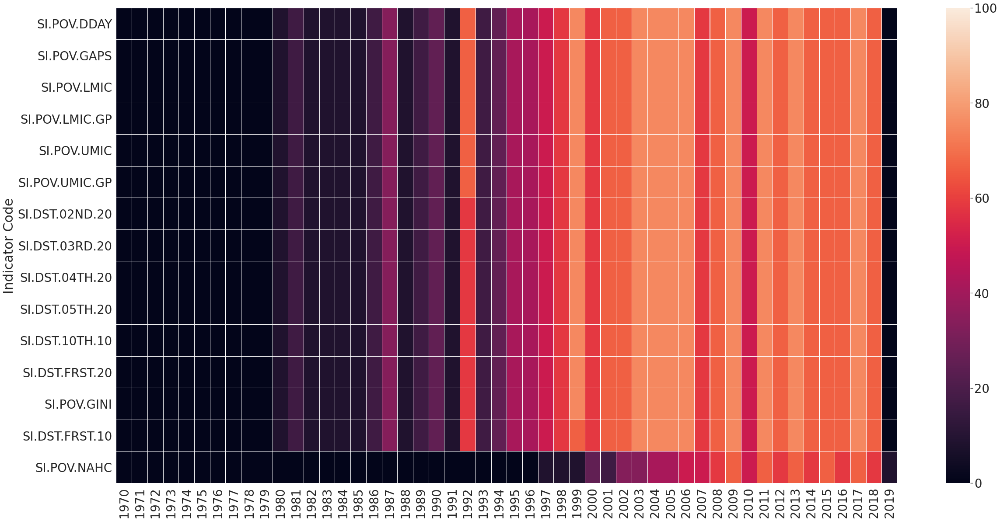

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(PovertyValuesByICode, cbar=True, linewidths=0.1,  vmin=0, vmax=100)

Como puede observarse graficamente, durante el periodo de 1970 a 1992 se concentra la mayor cantidad de nulos.

In [ ]:
PovertyByYear = pd.melt(poverty.drop(["Country Code", "Country Name", "Indicator", "features"], axis=1), id_vars = ["Indicator Code"])
PovertyByYear["variable"] = pd.to_numeric(PovertyByYear["variable"] )
PovertyByYear = PovertyByYear.rename(columns = {"variable": "Year"})
TotalData_1992 = (PovertyByYear["Year"]<=1992).sum()
WithData_1992 = ((PovertyByYear["Year"]<=1992) & (PovertyByYear["value"]>0)).sum()

print( "El % de registros sin datos para el período de 1970 a 1992 es de: " +  str(round((1 - (WithData_1990/TotalData_1990))*100,2)) + "%") 

TotalData_2019 = (PovertyByYear["Year"]>1992).sum()
WithData_2019 = ((PovertyByYear["Year"]>1992) & (PovertyByYear["value"]>0)).sum()
Check = len (PovertyByYear) == (TotalData_2019 + TotalData_1990 )


print( "El % de registros sin datos para el período de 1993 a 2019 es de: " +  str(round((1 - (WithData_2019/TotalData_2019))*100,2)) + "%") 


El % de registros sin datos para el período de 1970 a 1992 es de: 94.62%
El % de registros sin datos para el período de 1993 a 2019 es de: 42.18%


Dado que la dimensión pobreza tiene 15 features en total, se analizará en detalle cada uno de ellos.

In [ ]:
PovertyByYear = PovertyByYear.copy()
PovertyByYear = PovertyByYear.reset_index()
PovertyByYear["features"] = PovertyByYear["Indicator Code"]
PovertyByYear["features"] = PovertyByYear["features"].map(poverty.set_index("Indicator Code")["features"].to_dict())
print( "La descripción de cada ID Indicator a considerar es la siguiente: ")
FeaturesPovertySelection = PovertyByYear[["Indicator Code", "features"]].drop_duplicates().set_index("Indicator Code")
FeaturesPovertySelection

La descripción de cada ID Indicator a considerar es la siguiente: 


,features
Indicator Code,
SI.POV.UMIC.GP,Poverty gap at $5.50 a day (2011 PPP) (%)
SI.POV.UMIC,Poverty headcount ratio at $5.50 a day (2011 PPP) (% of population)
SI.POV.NAHC,"Tasa de incidencia de la pobreza, sobre la base de la línea de pobreza nacional (% de la población)"
SI.POV.LMIC.GP,Poverty gap at $3.20 a day (2011 PPP) (%)
SI.POV.LMIC,Poverty headcount ratio at $3.20 a day (2011 PPP) (% of population)
SI.POV.GINI,Índice de Gini
SI.POV.GAPS,"Brecha de pobreza a $1,90 por día (2011 PPA) (%)"
SI.POV.DDAY,"Tasa de incidencia de la pobreza, sobre la base de $1,90 por día (2011 PPA) (% de la población)"
SI.DST.FRST.20,Participación en el ingreso del 20% peor remunerado de la población


### Análisis por País para cada Feature

4. Volviendo a los resultados del punto 2, elegir como mínimo 15 Features por Indicador con al menos el 50% de valores no nulos (y en lo posible los mismos para todos los países) y mostrar gráficamente, con gráficos de distribución o de cajas por ejemplo, la distribución de los mismos. ¿Qué se puede observar de estas distribuciones? ¿Son normales? ¿Qué sucede con los outliers? ¿Observan alguna similitud entre los features elegidos?. Para estos mismos 15 Features realizar el gráfico de línea de su serie temporal y analizarlo.

In [ ]:
PovertyIDCode = FeaturesPovertySelection.reset_index()['Indicator Code'].to_list()

RelevantFeaturesPoverty = poverty[poverty["Indicator Code"].isin(PovertyIDCode)]
PovertyDataByCountry = RelevantFeaturesSocProt.groupby("Country Name").count().drop(["features", "Indicator", "Country Code", "Indicator Code"], axis=1)
PovertyDataByCountry["Valor"] = PovertyDataByCountry.sum(axis=1)
PovertyDataByCountry = PovertyDataByCountry.sort_values(by=['Valor'], ascending=False)
PovertyDataByCountry = ((PovertyDataByCountry/len(RelevantFeaturesSocProt["Indicator Code"].unique()))*100).drop(columns = ["Valor"])
PovertyDataByCountry = PovertyDataByCountry.rename(columns = lambda x : str(x)[:4])
round(PovertyDataByCountry,2)

,1970,1971,1972,1973,1974,1975,1976,1977,1978,1979,1980,1981,1982,1983,1984,1985,1986,1987,1988,1989,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
Country Name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Brasil,0.00,0.00,3.33,3.33,0.00,0.00,10.00,10.00,10.00,10.00,0.00,10.00,10.00,10.00,10.00,20.00,20.00,20.0,20.0,20.00,26.67,26.67,46.67,46.67,26.67,90.00,90.00,90.00,90.00,90.00,26.67,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,26.67,90.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00
Ecuador,0.00,0.00,0.00,0.00,3.33,3.33,0.00,3.33,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.0,10.0,10.00,16.67,36.67,36.67,36.67,36.67,36.67,46.67,46.67,46.67,36.67,100.00,100.00,46.67,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00
Perú,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,10.0,0.0,6.67,16.67,36.67,36.67,36.67,26.67,26.67,56.67,66.67,66.67,66.67,56.67,66.67,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,90.00,26.67
Uruguay,10.00,10.00,10.00,10.00,10.00,0.00,0.00,0.00,0.00,0.00,3.33,10.00,10.00,0.00,20.00,0.00,10.00,10.0,0.0,0.00,26.67,46.67,46.67,46.67,46.67,46.67,30.00,30.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,90.00,26.67
Chile,0.00,0.00,0.00,0.00,0.00,3.33,10.00,10.00,10.00,10.00,10.00,10.00,10.00,20.00,10.00,0.00,20.00,0.0,20.0,20.00,36.67,46.67,56.67,46.67,56.67,36.67,56.67,46.67,90.00,46.67,90.00,46.67,46.67,90.00,46.67,46.67,90.00,76.67,46.67,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,26.67
Paraguay,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,10.00,10.00,0.00,10.00,10.00,10.00,10.00,10.00,10.0,10.0,10.00,16.67,36.67,36.67,46.67,46.67,36.67,36.67,36.67,26.67,30.00,36.67,26.67,90.00,90.00,90.00,86.67,90.00,90.00,90.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,90.00,90.00,46.67,26.67
Argentina,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,10.00,10.00,10.00,3.33,3.33,10.0,10.0,10.00,16.67,36.67,36.67,36.67,36.67,36.67,36.67,36.67,36.67,36.67,36.67,36.67,66.67,66.67,100.00,100.00,100.00,30.00,100.00,100.00,100.00,100.00,100.00,100.00,100.00,26.67,26.67,100.00,100.00,26.67
Bolivia,0.00,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,3.33,10.00,20.00,20.0,10.0,10.00,16.67,36.67,36.67,36.67,36.67,46.67,66.67,66.67,26.67,36.67,66.67,36.67,36.67,26.67,36.67,80.00,80.00,80.00,90.00,100.00,26.67,90.00,90.00,90.00,90.00,90.00,90.00,90.00,80.00,26.67
Colombia,0.00,0.00,0.00,0.00,0.00,10.00,0.00,10.00,0.00,0.00,10.00,3.33,3.33,10.00,10.00,10.00,10.00,10.0,0.0,0.00,6.67,46.67,46.67,36.67,46.67,36.67,46.67,36.67,36.67,36.67,36.67,46.67,46.67,56.67,46.67,56.67,26.67,46.67,46.67,100.00,100.00,100.00,100.00,100.00,100.00,100.00,90.00,90.00,90.00,26.67


En la tabla es posible observar la falta de información en todos los países para todos los features de pobreza durante el período 1970 a 1979. En 1980 solamente en Argentina se miden algunos indicadores (estaría bueno poner cuáles), sin embargo, es solo hay algo de información para ese año luego viene un período de 5 años (1981-1985) donde nuevamente no se mide ningún indicador en Argentina.

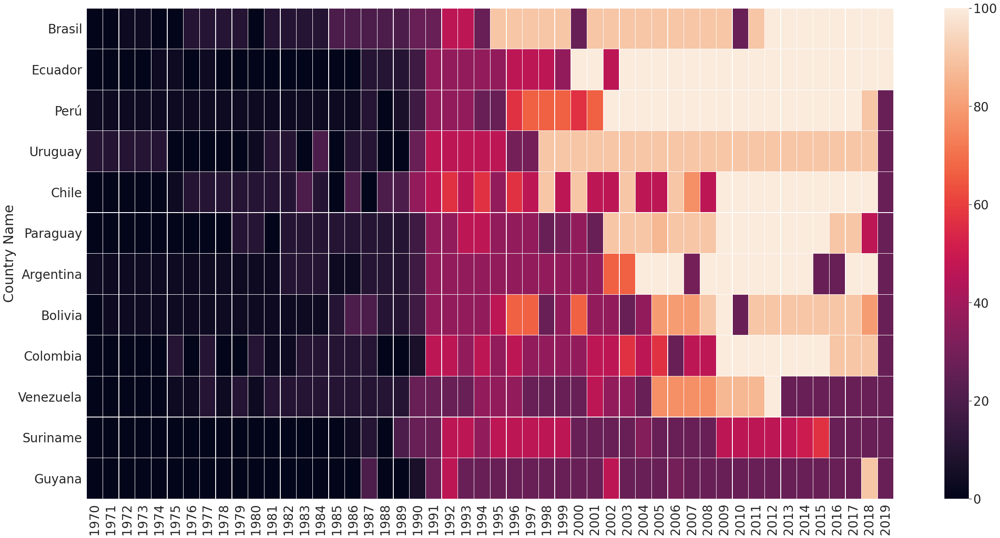

In [ ]:
PovertyDataByCountry = PovertyDataByCountry.copy()
plt.figure(figsize=(40, 20))
sns.heatmap(PovertyDataByCountry, cbar=True, linewidths=.3, vmin=0, vmax=100)

Por su parte en el hetmatp, se evidencia la falta de información de Guyana y Suriname para todo el período en ánalisis.

Se realiza un heatmap considerando como centro el 50% de esta forma se puede visualizar cuáles son las combinaciones que tienen mas del 50% de registros con datos.

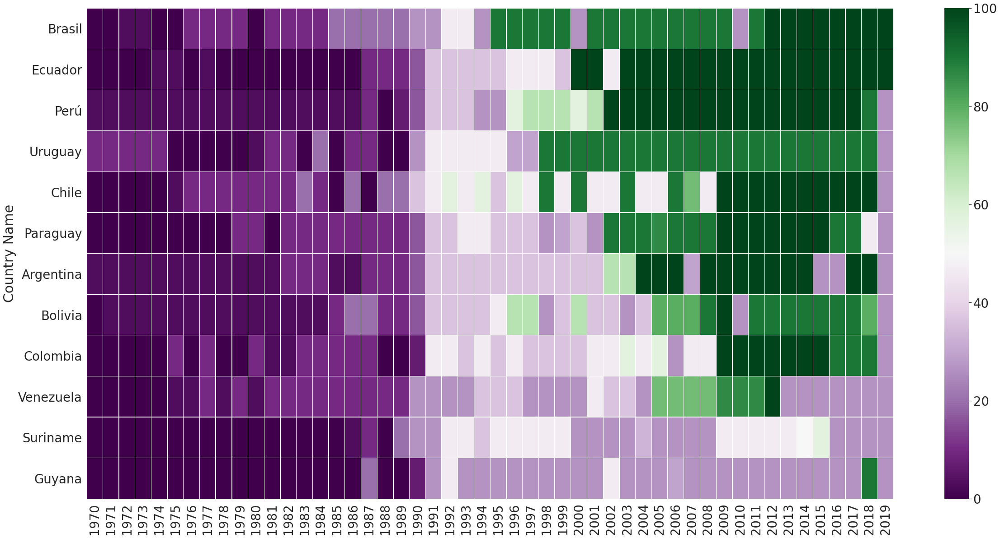

In [ ]:
PovertyDataByCountry = PovertyDataByCountry.copy()
plt.figure(figsize=(40, 20))
sns.heatmap(PovertyDataByCountry, cbar=True, linewidths=.3, center=50, cmap="PRGn", vmin=0, vmax=100)

Como puede observarse en el heatmap anteriormente graficado, en general existe muy poca información para el análisis de pobreza. Ninguno de los cuadrantes muestra tonalidades verdes, lo que implica que en ningun país para ningún año se tienen más del 50% de los registros con datos.

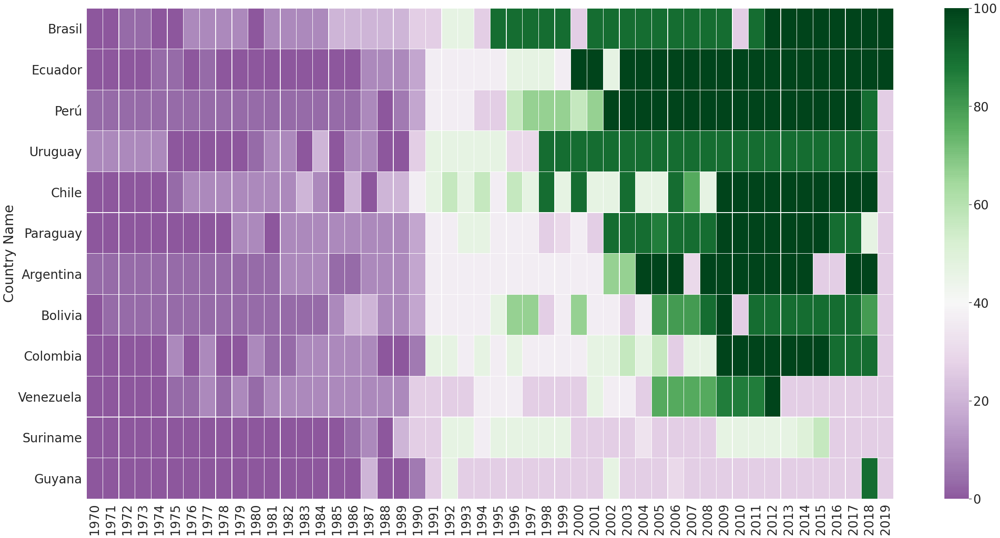

In [ ]:
PovertyDataByCountry = PovertyDataByCountry.copy()
plt.figure(figsize=(40, 20))
sns.heatmap(PovertyDataByCountry, cbar=True, linewidths=.3, center=40, cmap="PRGn", vmin=0, vmax=100)

Con el propósito de comprender mejor la falta de datos, se realizó el hetmap anterior, donde se considera como centro 45. Implicando que aquellas combinaciones que tengan más del 45% de los registros con datos mostrarán tonalidades verdes.



In [ ]:
print("El % de países que tienen más del 45% de los features con datos para cada año es: \n" + str(round((PovertyDataByCountry[PovertyDataByCountry>45].count()/len(poverty["Country Name"].unique()))*100, 0).astype(int)))

El % de países que tienen más del 45% de los features con datos para cada año es: 
1970    0 
1971    0 
1972    0 
1973    0 
1974    0 
1975    0 
1976    0 
1977    0 
1978    0 
1979    0 
1980    0 
1981    0 
1982    0 
1983    0 
1984    0 
1985    0 
1986    0 
1987    0 
1988    0 
1989    0 
1990    0 
1991    25
1992    50
1993    42
1994    33
1995    33
1996    58
1997    50
1998    50
1999    42
2000    42
2001    58
2002    75
2003    67
2004    67
2005    83
2006    75
2007    75
2008    83
2009    92
2010    75
2011    92
2012    92
2013    83
2014    83
2015    75
2016    67
2017    75
2018    83
2019    17
dtype: int64


In [ ]:
PovertyByYear = pd.melt(poverty, id_vars = ["features", "Indicator" , "Country Name","Country Code", "Indicator Code"])
PovertyByYear["variable"] = pd.to_numeric(PovertyByYear["variable"] )
PovertyByYear = PovertyByYear.rename(columns = {"variable": "Year"})
PovertyByYear["Year"] = PovertyByYear["Year"].apply(lambda x: str(x)[:4])

PovertyByYear

,features,Indicator,Country Name,Country Code,Indicator Code,Year,value
0,Poverty gap at $5.50 a day (2011 PPP) (%),Poverty,Argentina,ARG,SI.POV.UMIC.GP,1970,NaN
1,Poverty headcount ratio at $5.50 a day (2011 PPP) (% of population),Poverty,Argentina,ARG,SI.POV.UMIC,1970,NaN
2,"Tasa de incidencia de la pobreza, sobre la base de la línea de pobreza nacional (% de la población)",Poverty,Argentina,ARG,SI.POV.NAHC,1970,NaN
3,Poverty gap at $3.20 a day (2011 PPP) (%),Poverty,Argentina,ARG,SI.POV.LMIC.GP,1970,NaN
4,Poverty headcount ratio at $3.20 a day (2011 PPP) (% of population),Poverty,Argentina,ARG,SI.POV.LMIC,1970,NaN
...,...,...,...,...,...,...,...
8995,Participación en el ingreso del 10% mejor remunerado de la población,Poverty,Suriname,SUR,SI.DST.10TH.10,2019,NaN
8996,Participación en el ingreso del 20% mejor remunerado de la población,Poverty,Suriname,SUR,SI.DST.05TH.20,2019,NaN
8997,Participación en el ingreso del cuarto quintilo (20%) de la población en orden decreciente de remuneraciones,Poverty,Suriname,SUR,SI.DST.04TH.20,2019,NaN
8998,Participación en el ingreso del tercer quintilo (20%) de la población en orden decreciente de remuneraciones,Poverty,Suriname,SUR,SI.DST.03RD.20,2019,NaN


Se modifica la estructura del dataset para poder analizar el porcentaje de registros con datos por país, por feature y por año, para decidir qué features considerar para cada país.

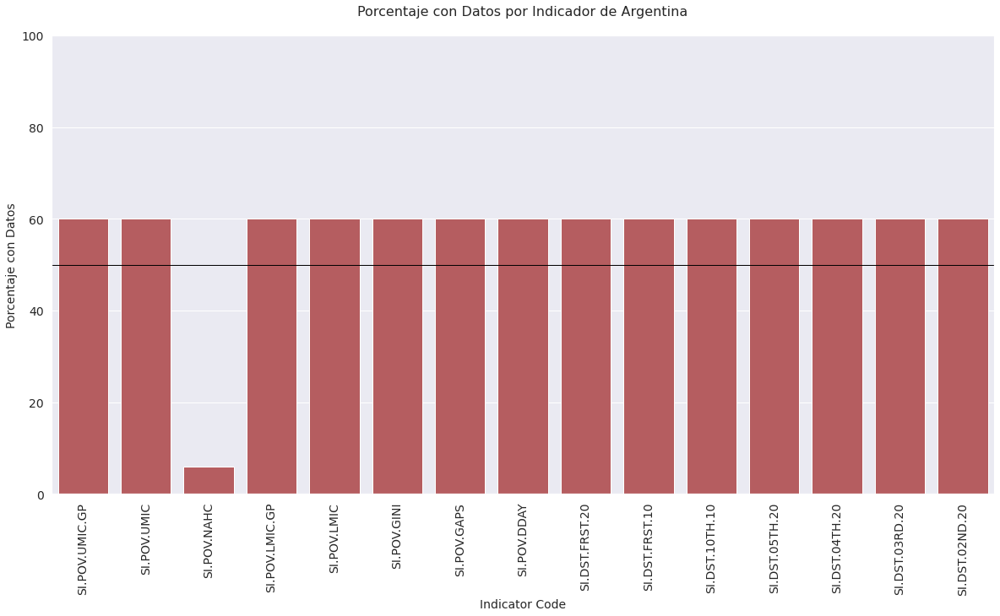

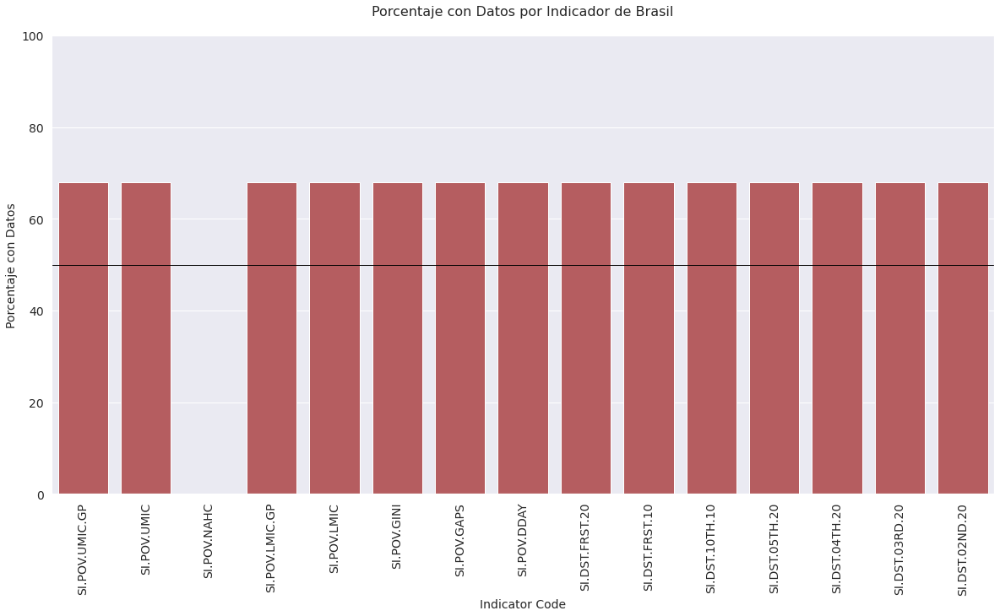

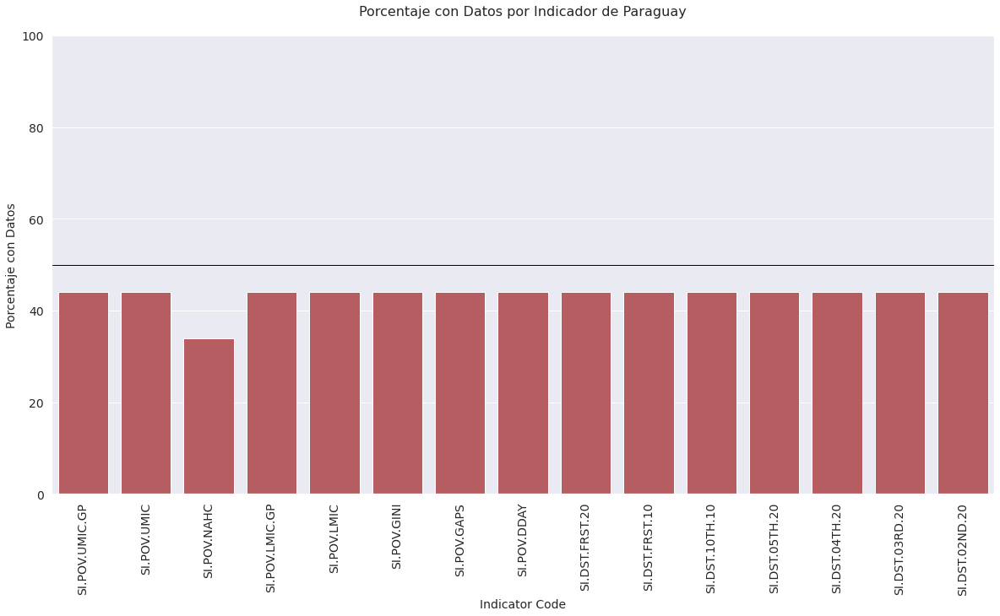

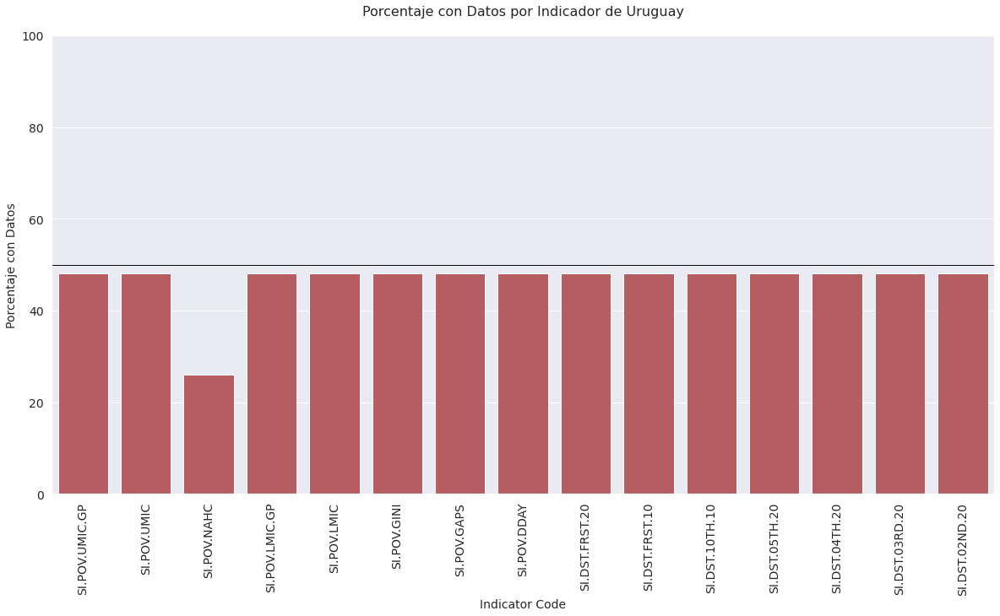

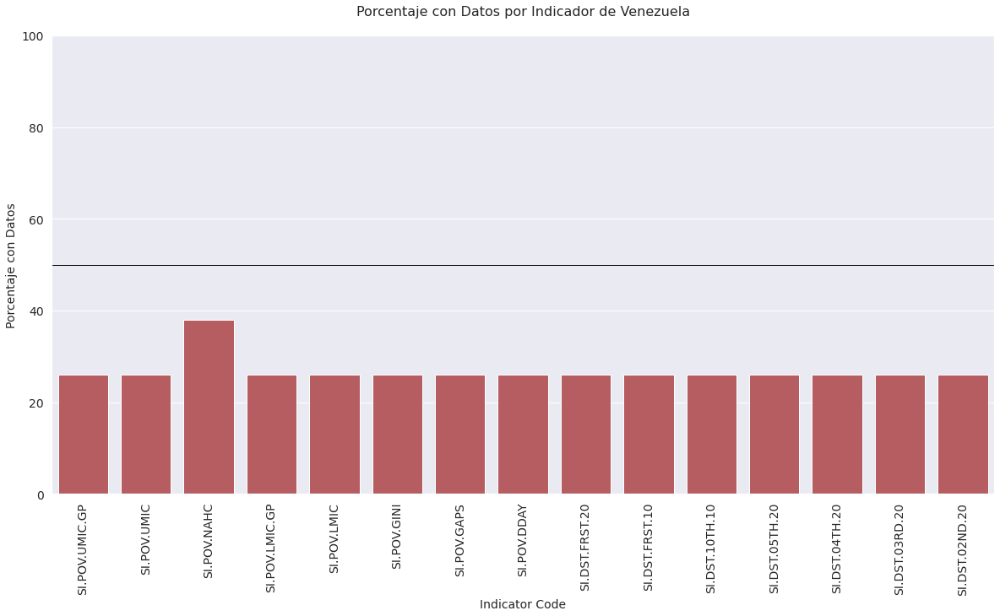

...

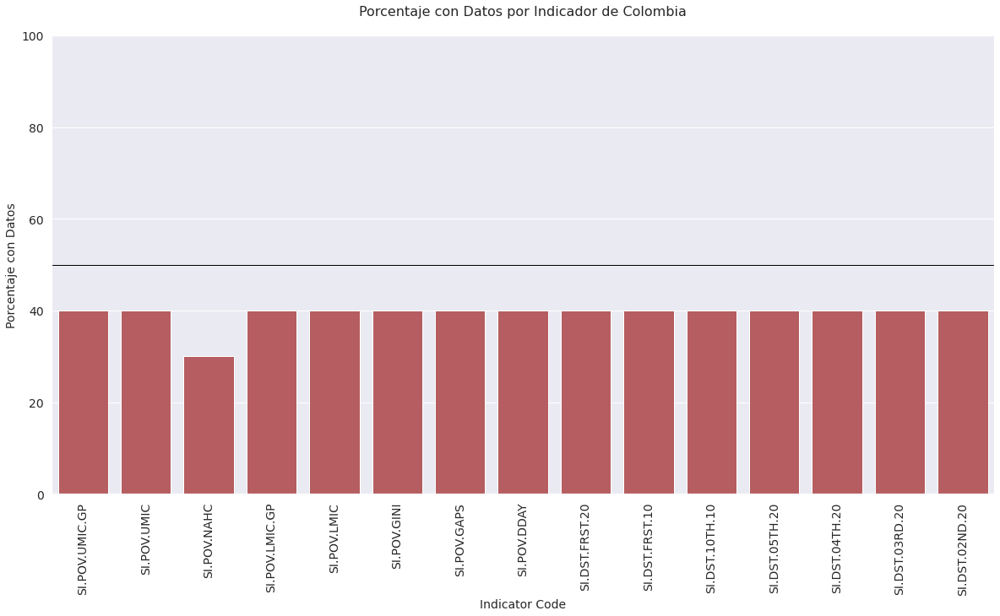

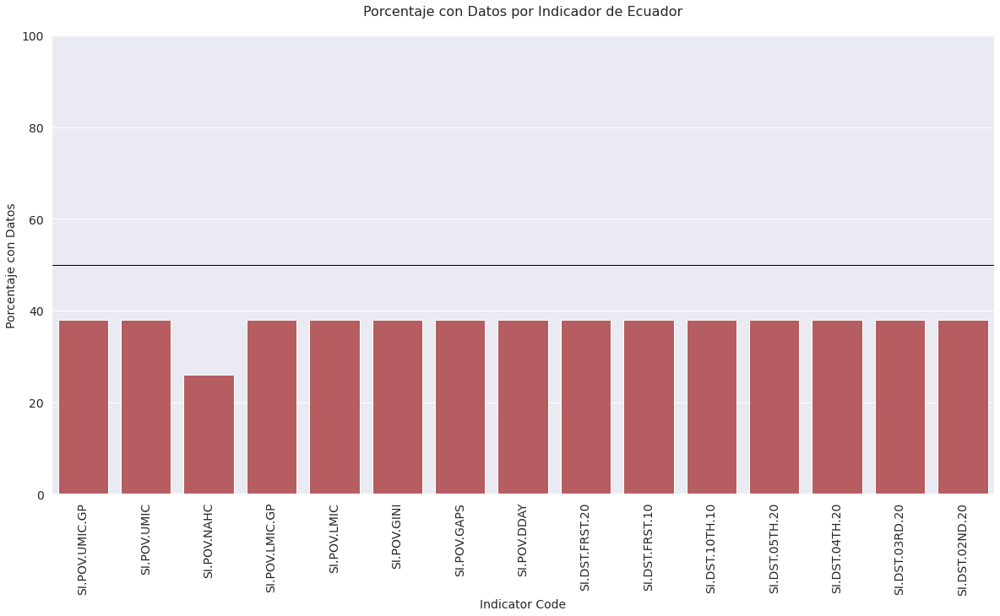

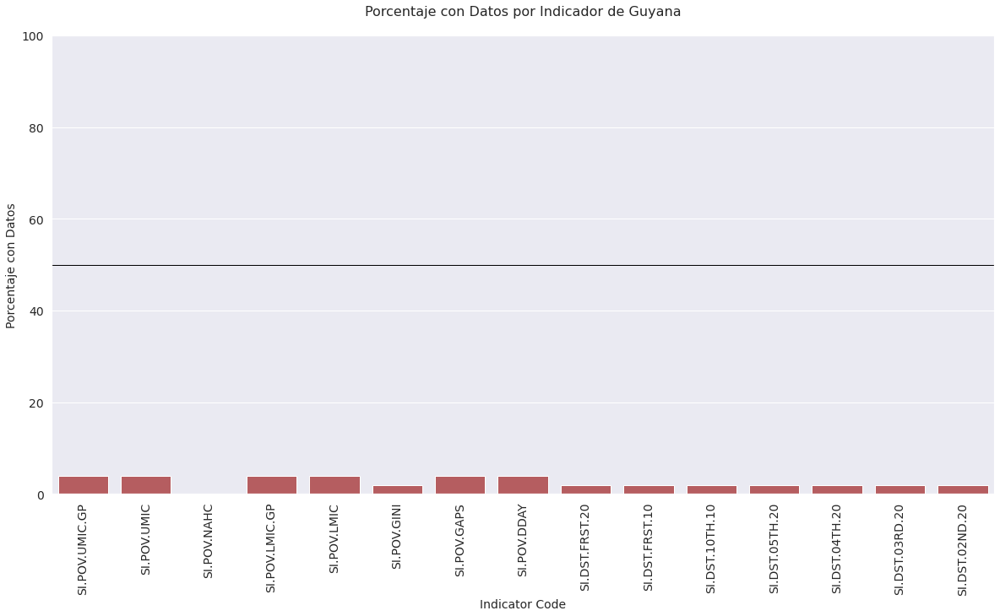

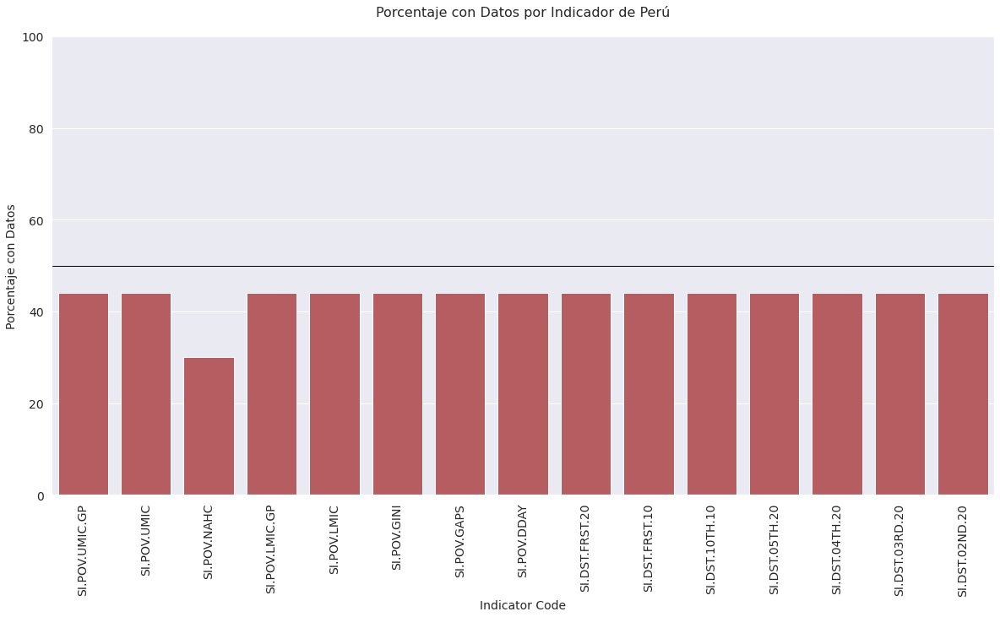

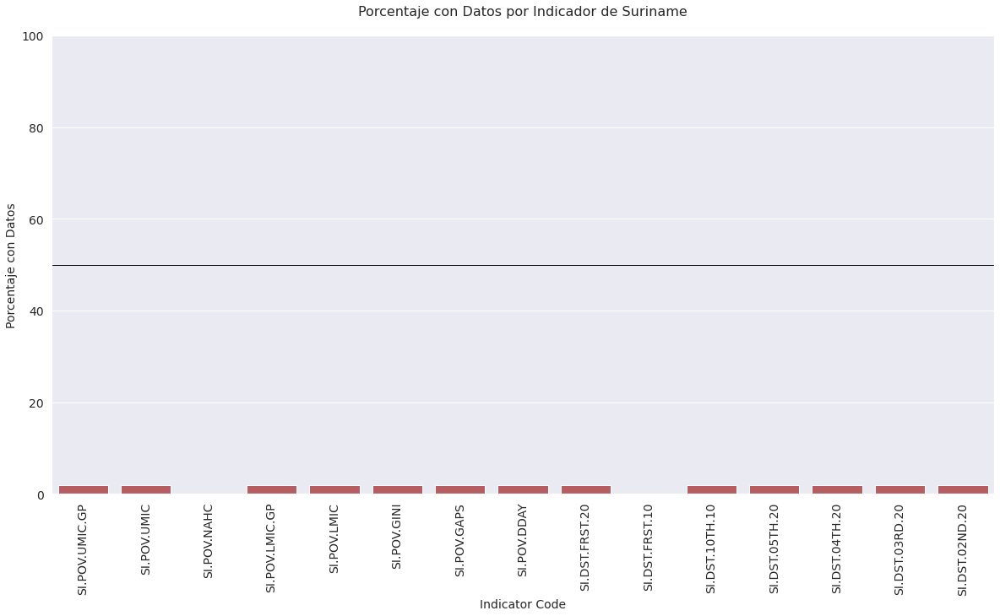

In [ ]:
PovertyFeaturesByID = poverty.drop(["Country Code", "Indicator", "features"], axis=1)
PovertyFeaturesByID = PovertyFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
PovertyFeaturesByID["Porcentaje de Registros"] = (PovertyFeaturesByID.sum(axis=1)/50)*100
PovertyFeaturesByID = PovertyFeaturesByID["Porcentaje de Registros"].reset_index().sort_values(by='Indicator Code', ascending=False)

countries = poverty['Country Name'].drop_duplicates().to_list()

for country in countries:
    plt.figure(figsize=(20, 10))
    sns.barplot(x="Indicator Code", y="Porcentaje de Registros", data=PovertyFeaturesByID[PovertyFeaturesByID["Country Name"]== country], color = "r")
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('Indicator Code', fontsize=14)
    plt.ylabel('Porcentaje con Datos', fontsize=14)
    plt.title("Porcentaje con Datos por Indicador de " + str(country) + "\n", fontsize=16)
    plt.gca().set_ylim(0,100)
    plt.axhline(y=50,linewidth=1, color='black')


In [ ]:
PovertyFeaturesByID = poverty.drop(["Country Code", "Indicator", "features"], axis=1)
PovertyFeaturesByID = PovertyFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
PovertyFeaturesByID["Porcentaje de Registros"] = (PovertyFeaturesByID.sum(axis=1)/50)*100
PovertyFeaturesByID["Mayor a 50%"] = PovertyFeaturesByID["Porcentaje de Registros"]>50
PovertyFeaturesByID = PovertyFeaturesByID[["Porcentaje de Registros" , "Mayor a 50%"]].reset_index().sort_values(by='Indicator Code', ascending=False)
countries = poverty['Country Name'].drop_duplicates()
PovertyIDbyCountry = []
for country in countries:
       PovertyIDbyCountry.append( PovertyFeaturesByID.loc[PovertyFeaturesByID["Country Name"]==country].iloc[0:15] )
PovertyIDbyCountry

[   Country Name  Indicator Code  Porcentaje de Registros  Mayor a 50%
 14  Argentina    SI.POV.UMIC.GP  60.0                     True       
 13  Argentina    SI.POV.UMIC     60.0                     True       
 12  Argentina    SI.POV.NAHC     6.0                      False      
 11  Argentina    SI.POV.LMIC.GP  60.0                     True       
 10  Argentina    SI.POV.LMIC     60.0                     True       
 9   Argentina    SI.POV.GINI     60.0                     True       
 8   Argentina    SI.POV.GAPS     60.0                     True       
 7   Argentina    SI.POV.DDAY     60.0                     True       
 6   Argentina    SI.DST.FRST.20  60.0                     True       
 5   Argentina    SI.DST.FRST.10  60.0                     True       
 4   Argentina    SI.DST.10TH.10  60.0                     True       
 3   Argentina    SI.DST.05TH.20  60.0                     True       
 2   Argentina    SI.DST.04TH.20  60.0                     True       
 1   A

#### Histograma por Feature para cada país

Para realizar los siguientes análisis, se construye un dataset que tenga solo las columnas relevantes de análisis y que solo considere los ID Features seleccionados en el paso anterior. 

In [ ]:
PovertyIDFeatures = poverty["Indicator Code"].unique()
columns=poverty.columns
PovertyData=poverty.drop(["Indicator", "Country Code", "features"], axis=1).rename(columns = lambda x : str(x)[:4] if x in columns[5:] else x)
PovertyData=PovertyData[PovertyData["Indicator Code"].isin(PovertyIDFeatures)]

In [ ]:
PovertyDataMelt = pd.melt(PovertyData, id_vars = ["Indicator Code" , "Country Name"])
PovertyDataMelt["variable"] = pd.to_numeric(PovertyDataMelt["variable"] )
PovertyDataMelt = PovertyDataMelt.rename(columns = {"variable": "Year"})

Se crea un dataset por país

In [ ]:
PovertyDataMelt = PovertyDataMelt.copy()

arg=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Argentina"]
bra=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Brasil"]
ur=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Uruguay"]
par=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Paraguay"]
ven=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Venezuela"]
bol=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Bolivia"]
chi=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Chile"]
guy=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Guyana"]
sur=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Suriname"]
col=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Colombia"]
ecu=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Ecuador"]
per=PovertyDataMelt[PovertyDataMelt["Country Name"]=="Perú"]

Se grafican los histogramas para cada ID Features

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:283: UserWarning: Data must have variance to compute a kernel density estimate.
  warnings.warn(msg, UserWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:198: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:198: RuntimeWarning: Mean of empty slice.
  line, = ax.plot(a.mean(), 0)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.6/dist-packages/sea

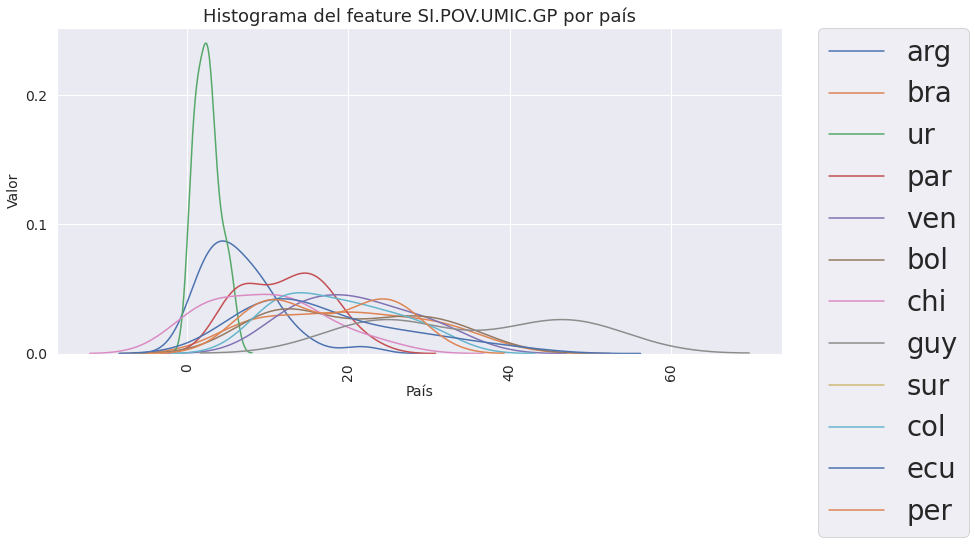

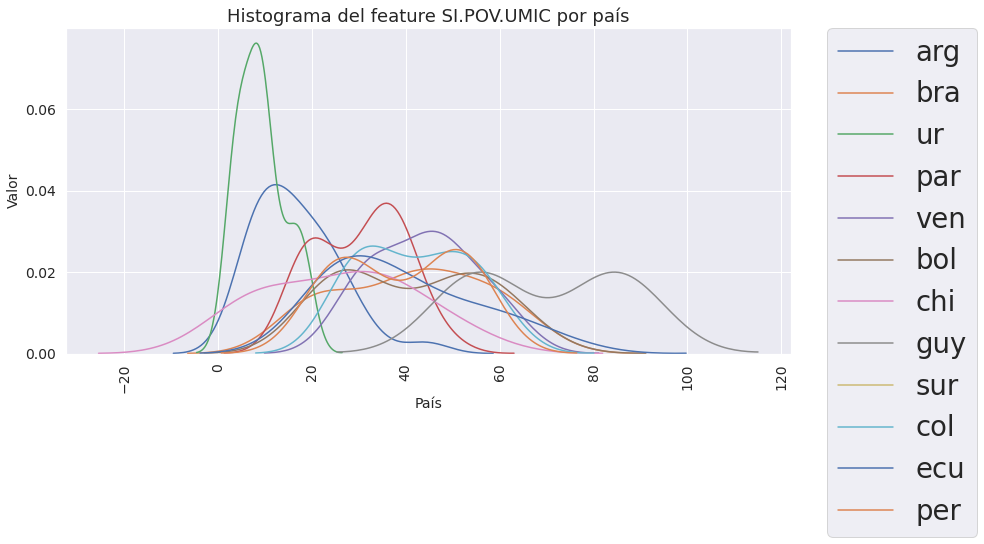

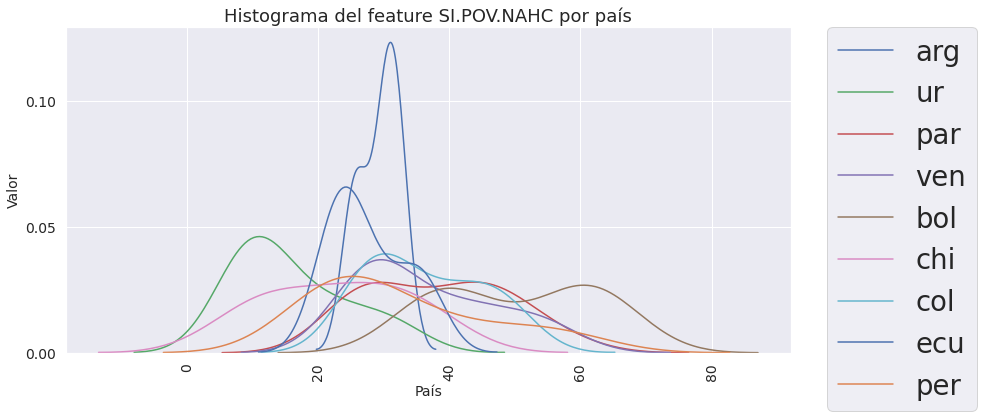

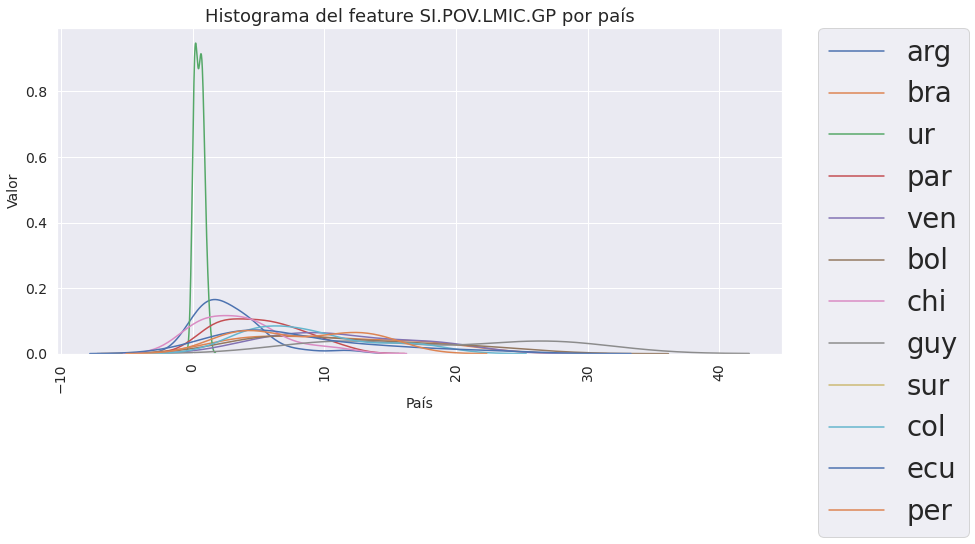

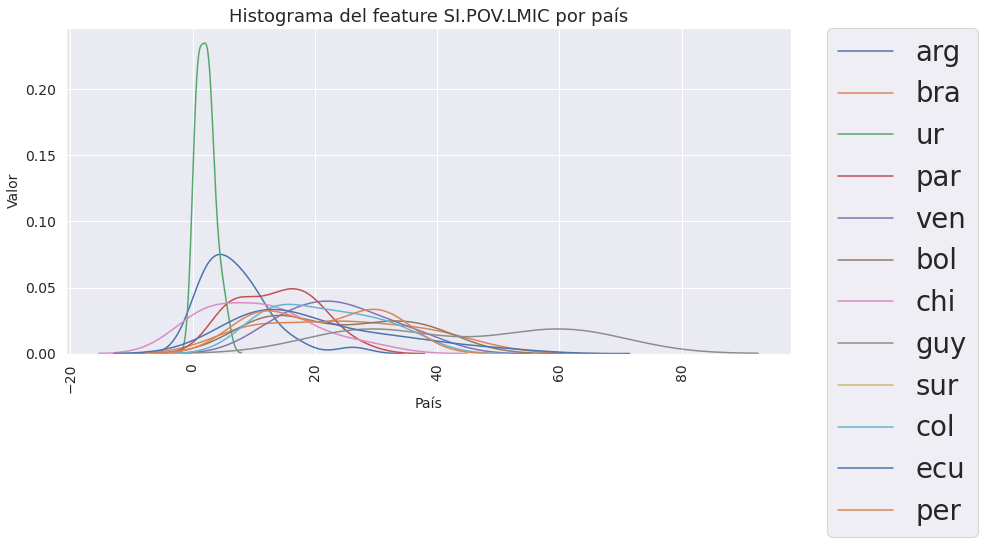

...

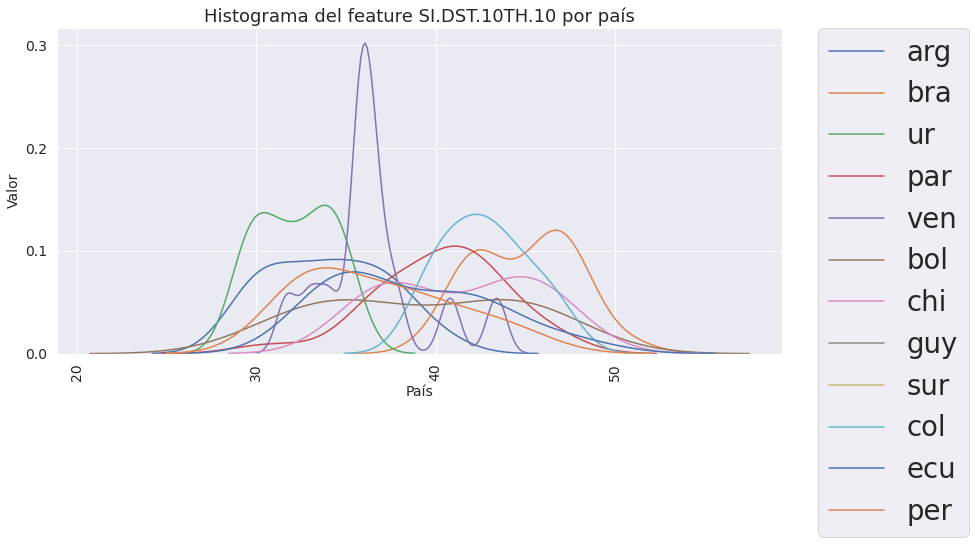

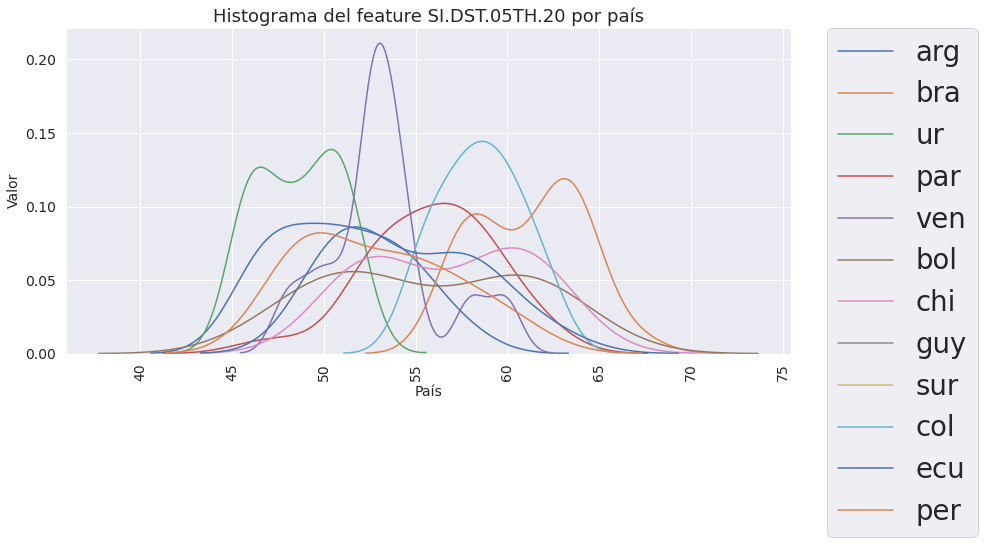

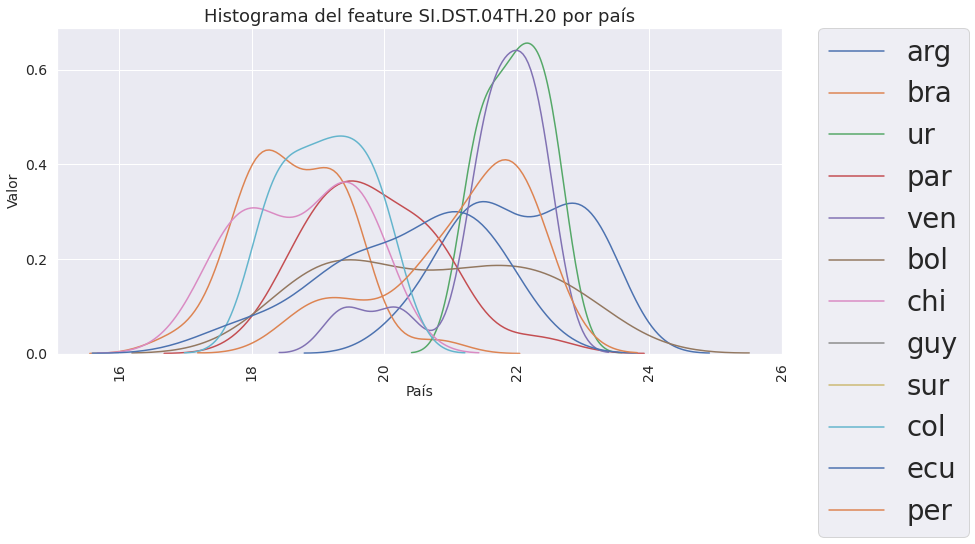

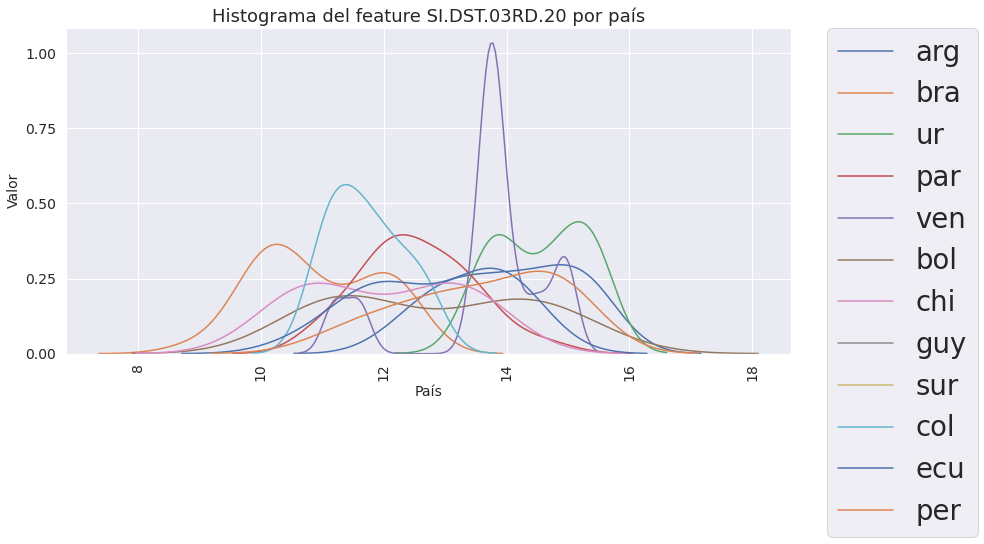

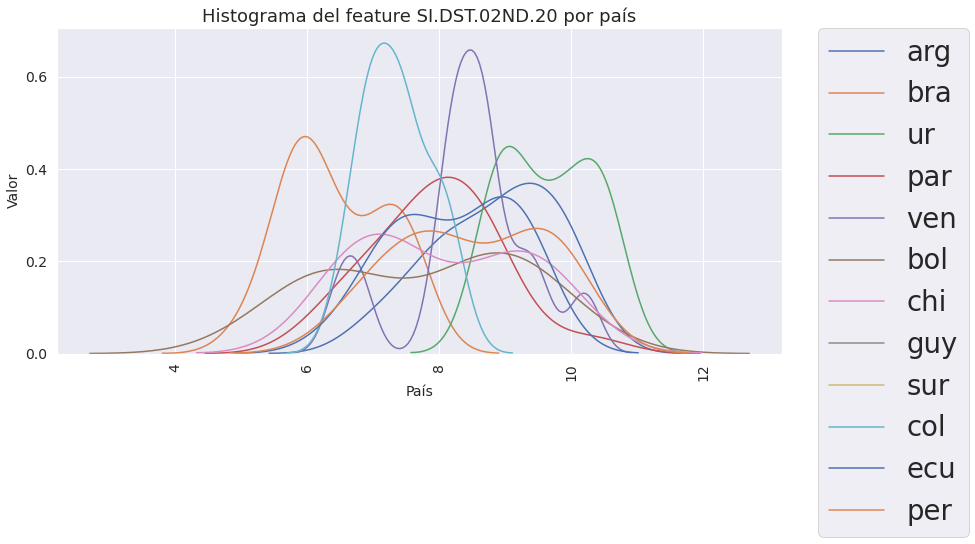

In [ ]:

for Features in PovertyIDFeatures:
    plt.figure(figsize=(13,6))
    sns.distplot(arg[arg["Indicator Code"]==Features]["value"], label="arg", hist=False)
    sns.distplot(bra[bra["Indicator Code"]==Features]["value"], label="bra", hist=False)
    sns.distplot(ur[ur["Indicator Code"]==Features]["value"], label="ur", hist=False)
    sns.distplot(par[par["Indicator Code"]==Features]["value"], label="par", hist=False)
    sns.distplot(ven[ven["Indicator Code"]==Features]["value"], label="ven", hist=False)
    sns.distplot(bol[bol["Indicator Code"]==Features]["value"], label="bol", hist=False)
    sns.distplot(chi[chi["Indicator Code"]==Features]["value"], label="chi", hist=False)
    sns.distplot(guy[guy["Indicator Code"]==Features]["value"], label="guy", hist=False)
    sns.distplot(sur[sur["Indicator Code"]==Features]["value"], label="sur", hist=False)
    sns.distplot(col[col["Indicator Code"]==Features]["value"], label="col", hist=False)
    sns.distplot(ecu[ecu["Indicator Code"]==Features]["value"], label="ecu", hist=False)
    sns.distplot(per[per["Indicator Code"]==Features]["value"], label="per", hist=False)
    plt.title("Histograma del feature "+ str(Features) + " por país", fontsize=18)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('País', fontsize=14)
    plt.ylabel('Valor', fontsize=14)
    

A pesar de la falta de información, puede observarse que las distribuciones de cada feature en los diferentes países difiere bastante.

#### BoxPlot por Feature

Para profundizar el análisis llevado a cabo hasta ahora, se construyen Box Plot para cada feature por país.

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


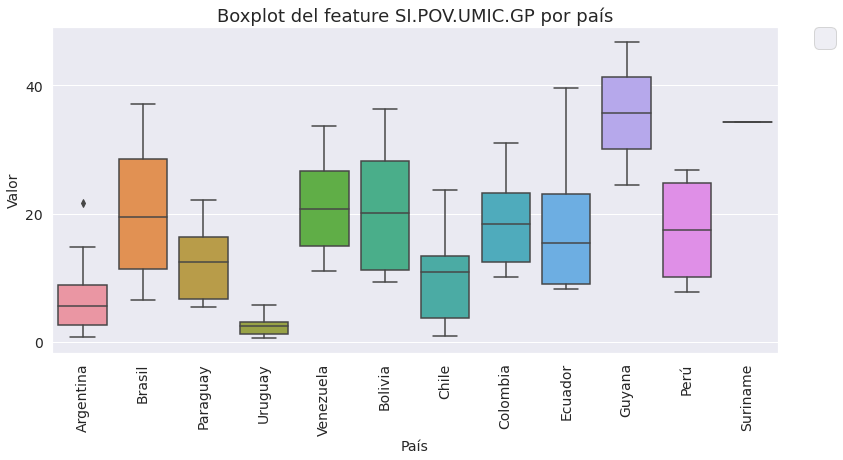

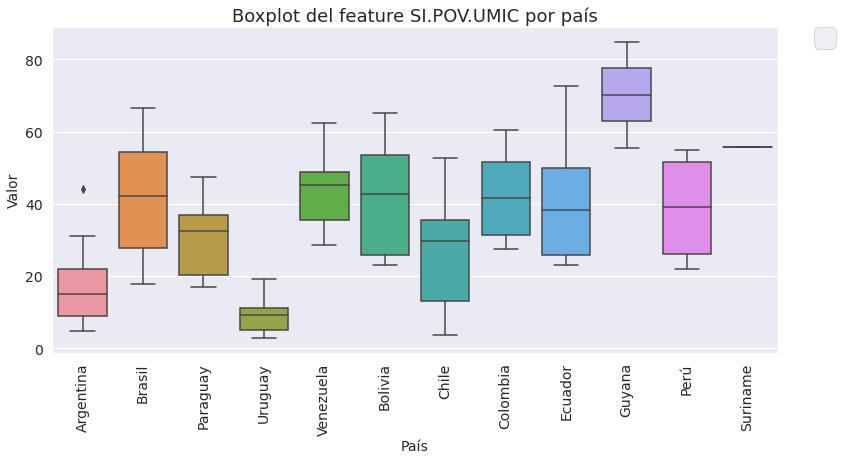

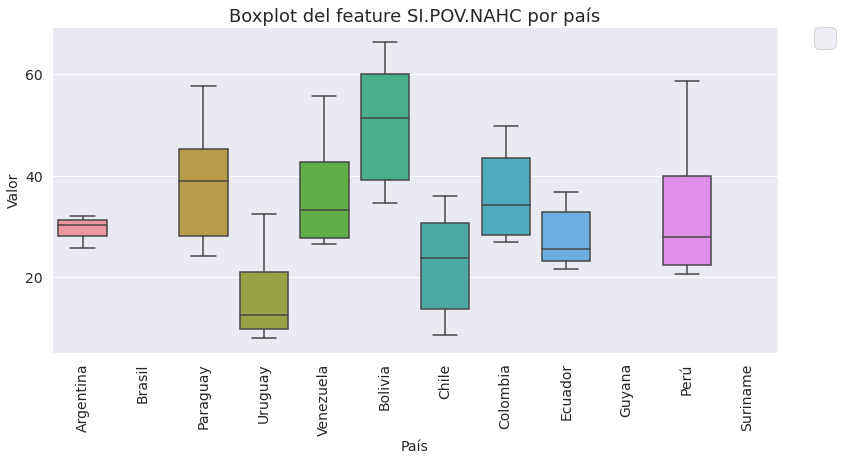

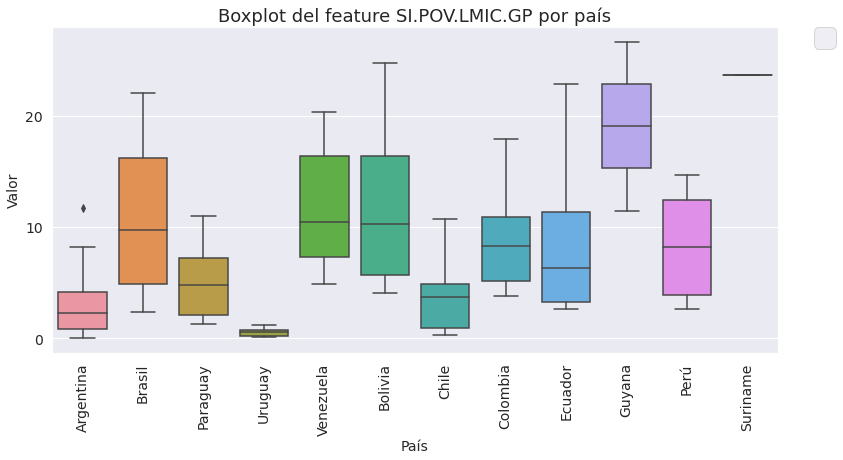

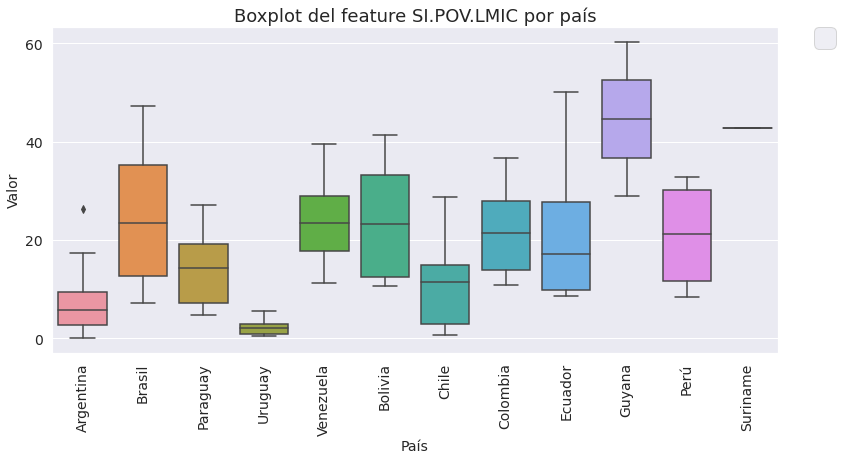

...

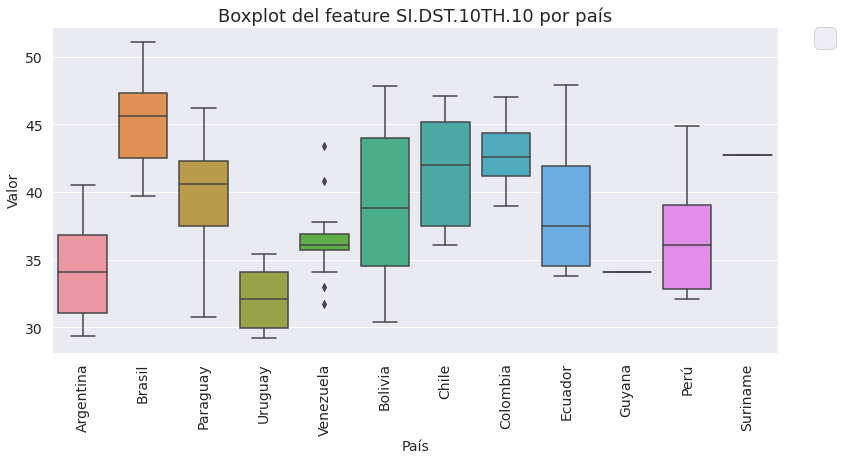

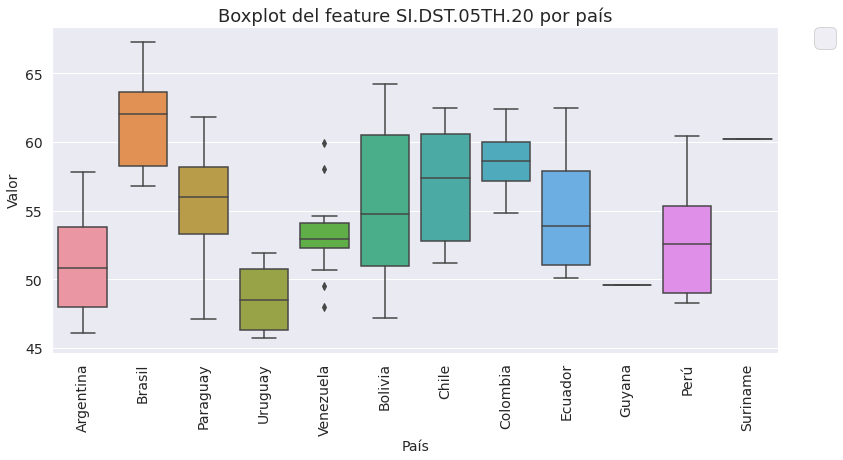

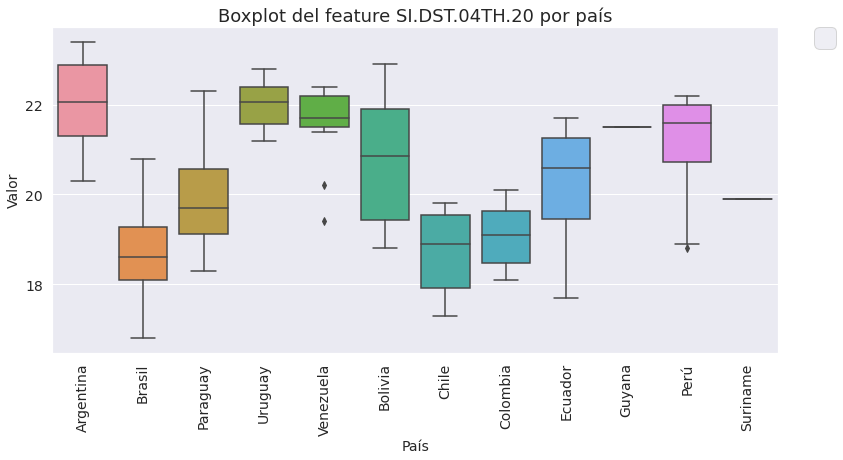

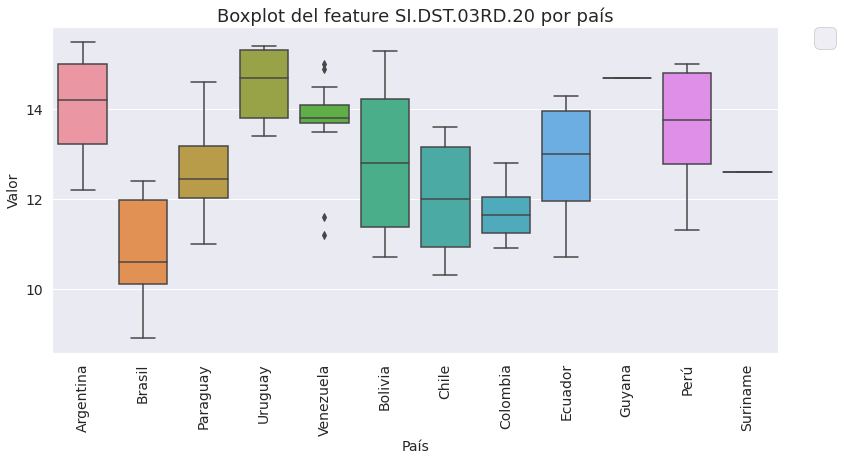

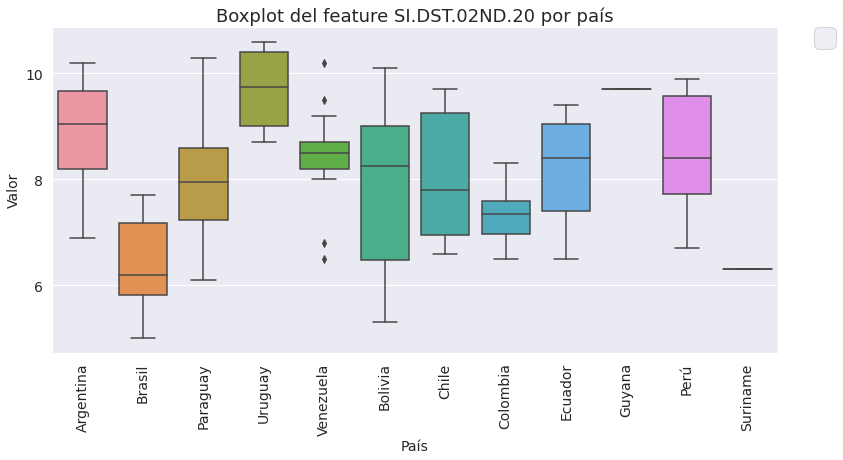

In [ ]:
PovertyIDbyCountry = PovertyIDbyCountry.copy()
PovertyIDFeatures = PovertyIDbyCountry[0]["Indicator Code"].unique()
PovertyDataMelt = PovertyDataMelt.copy()

for Features in PovertyIDFeatures:
    plt.figure(figsize=(13,6))
    sns.boxplot(data=PovertyDataMelt[PovertyDataMelt["Indicator Code"]==Features], x="Country Name", y="value")
    plt.title("Boxplot del feature "+ str(Features) + " por país", fontsize=18)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('País', fontsize=14)
    plt.ylabel('Valor', fontsize=14)


#### Series Temporales de los Features por País

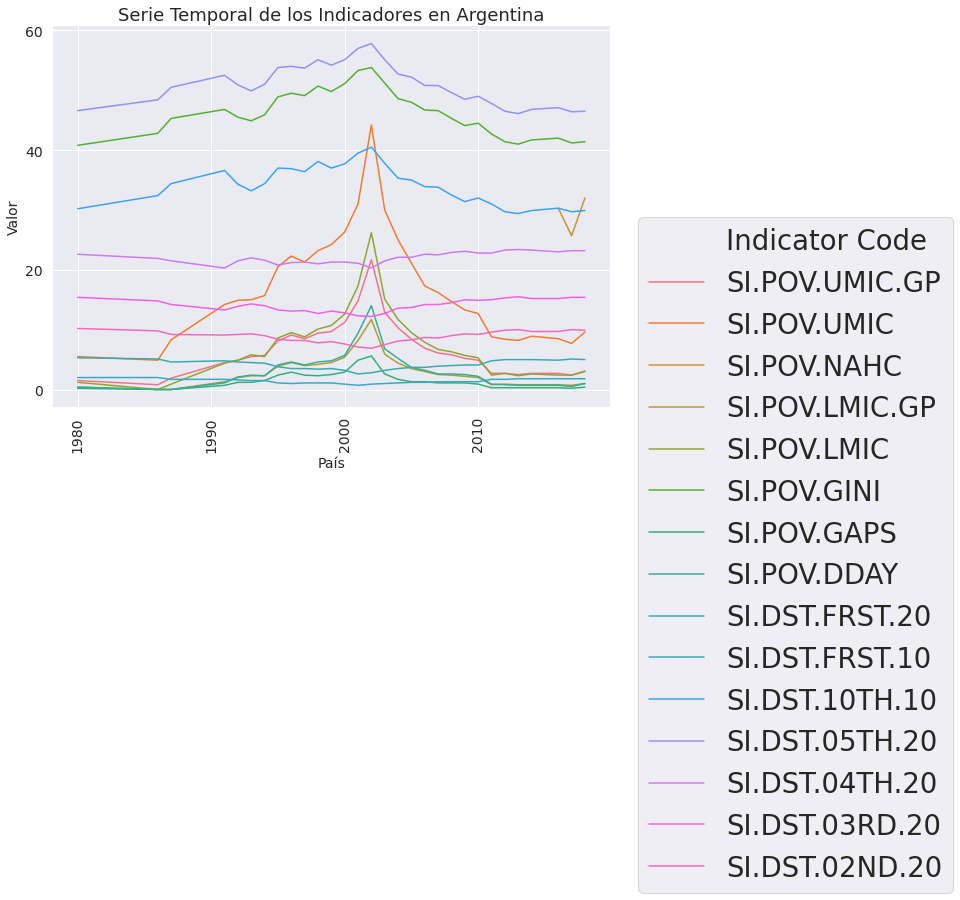

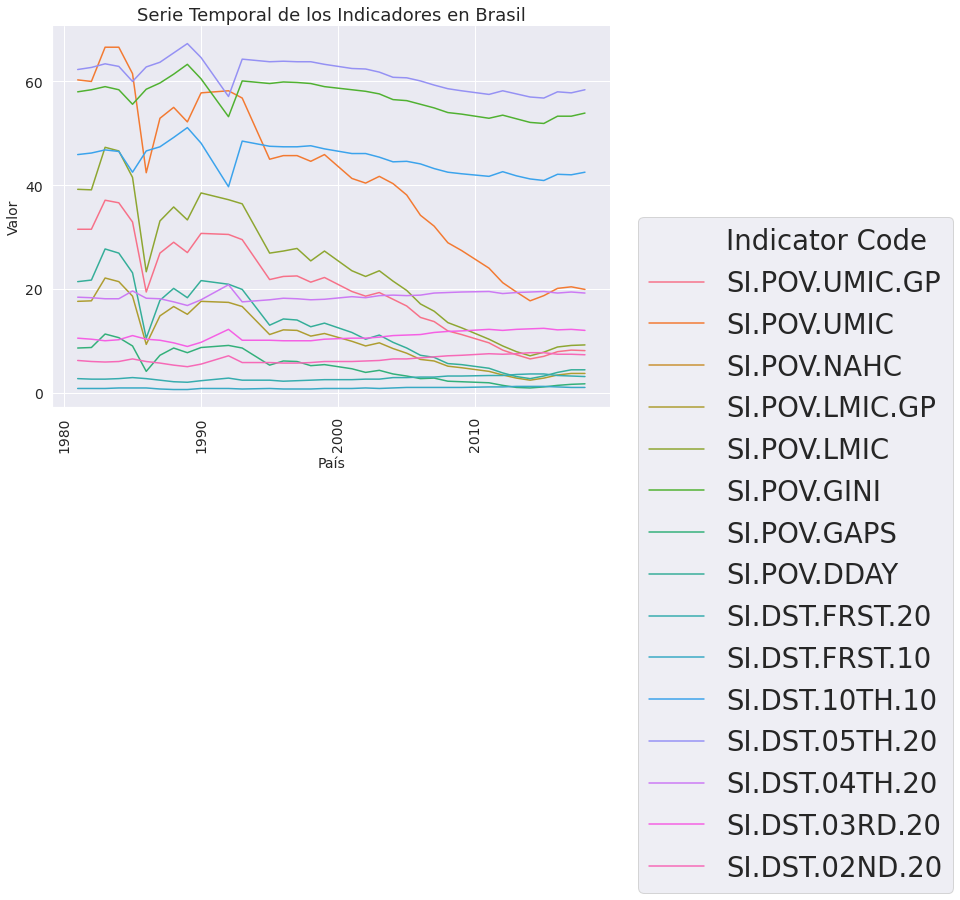

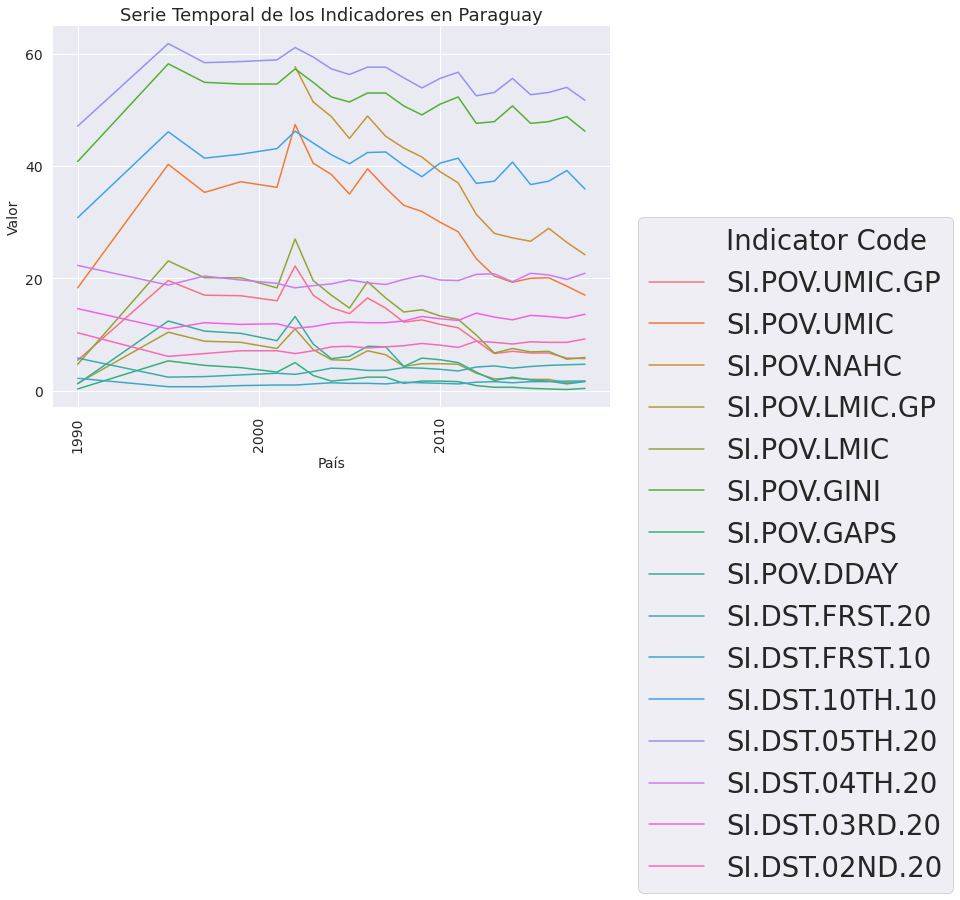

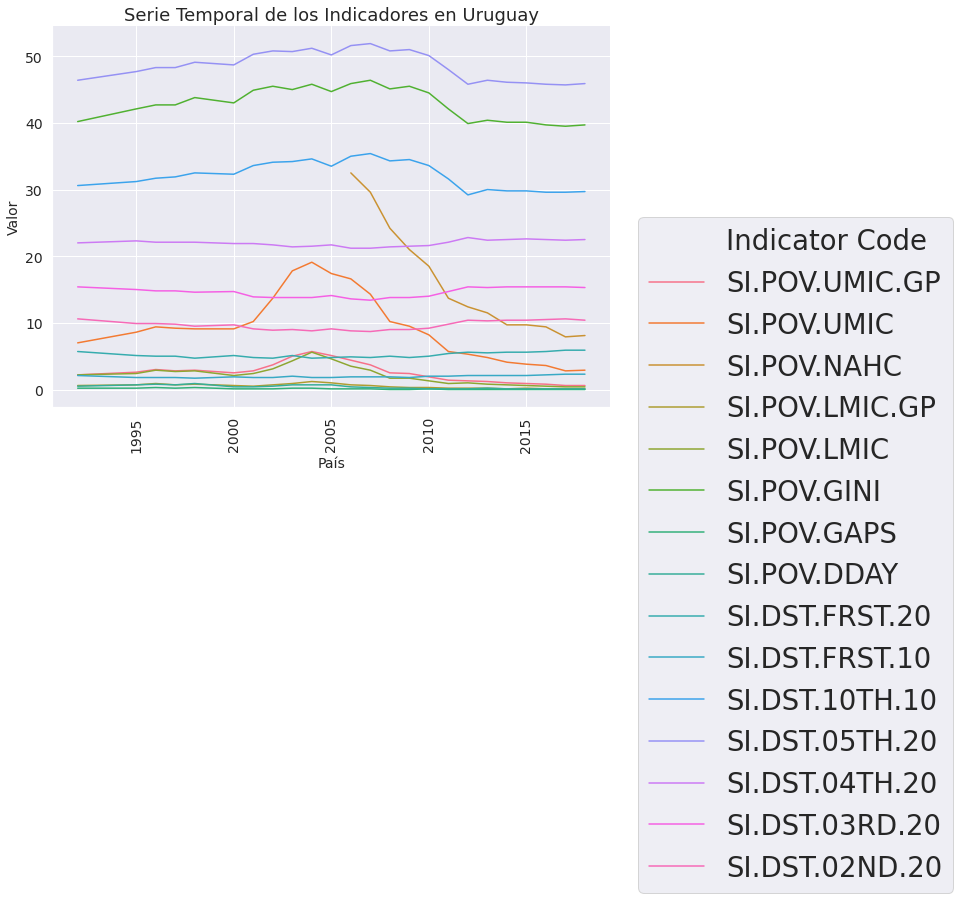

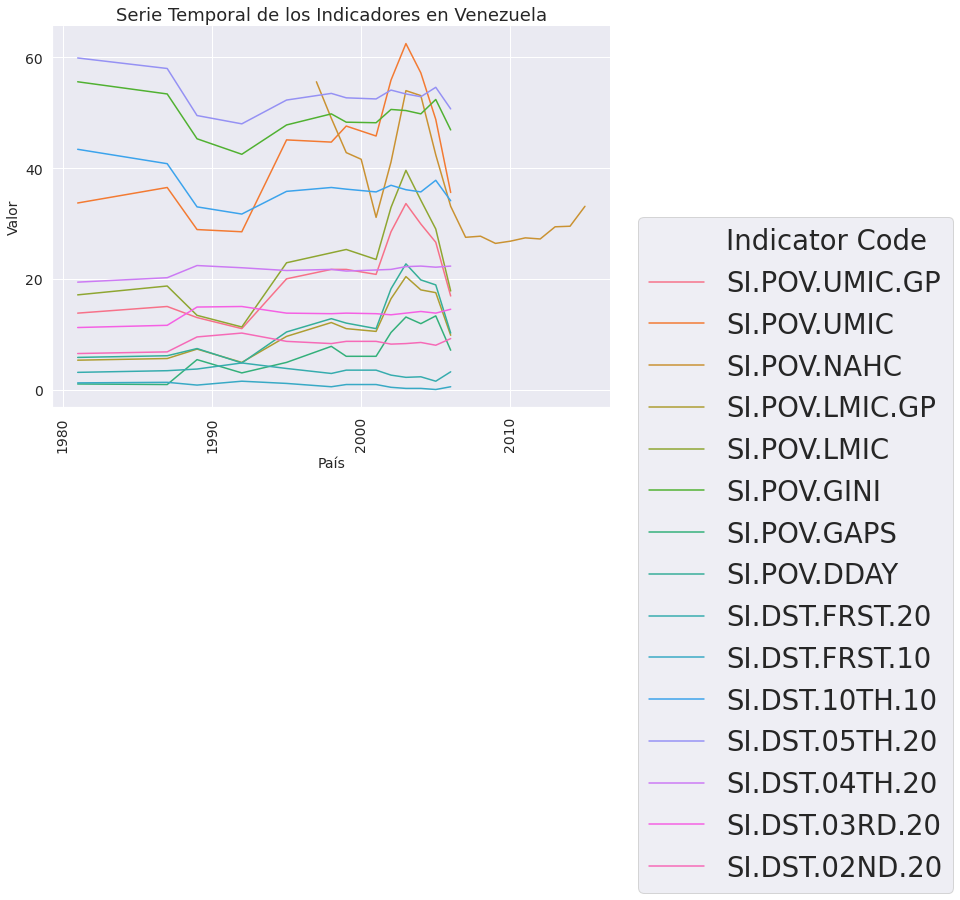

...

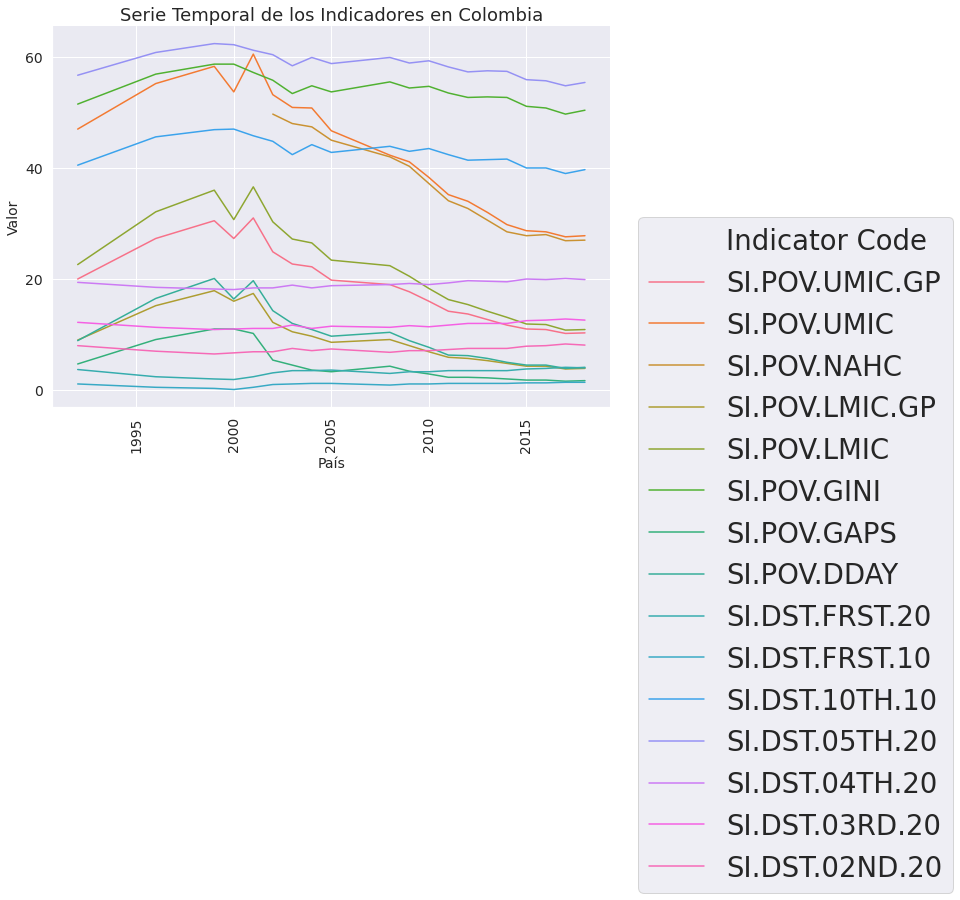

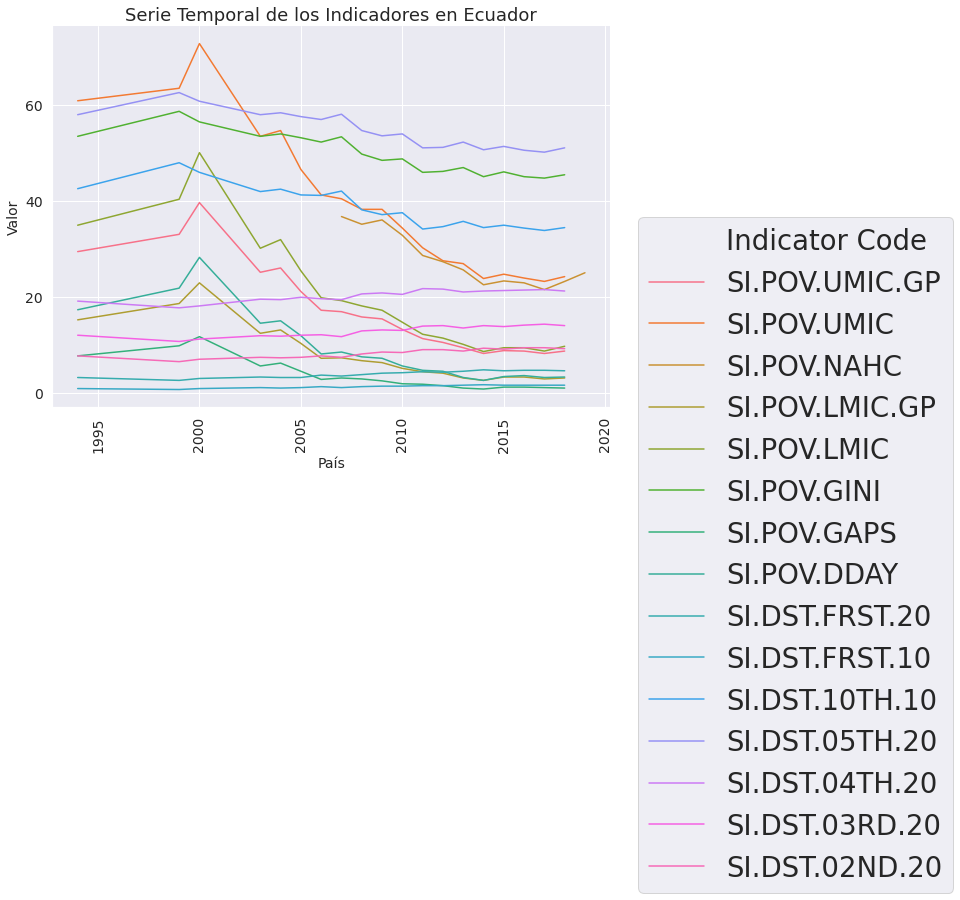

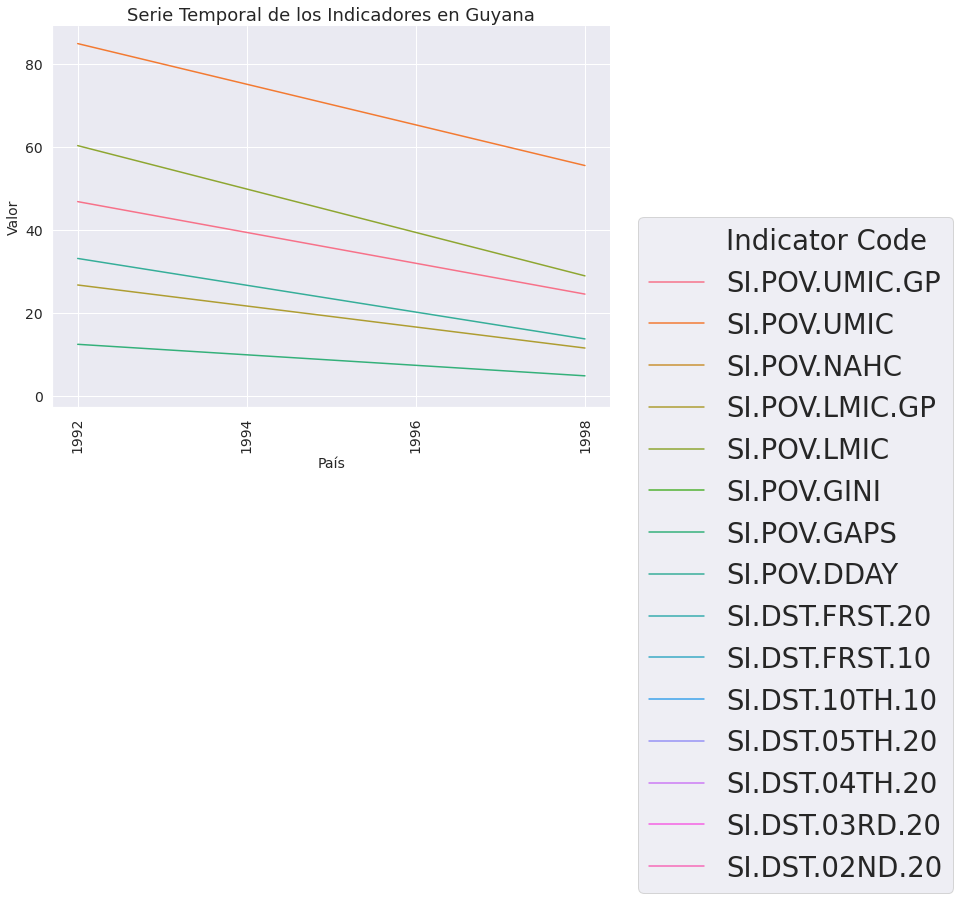

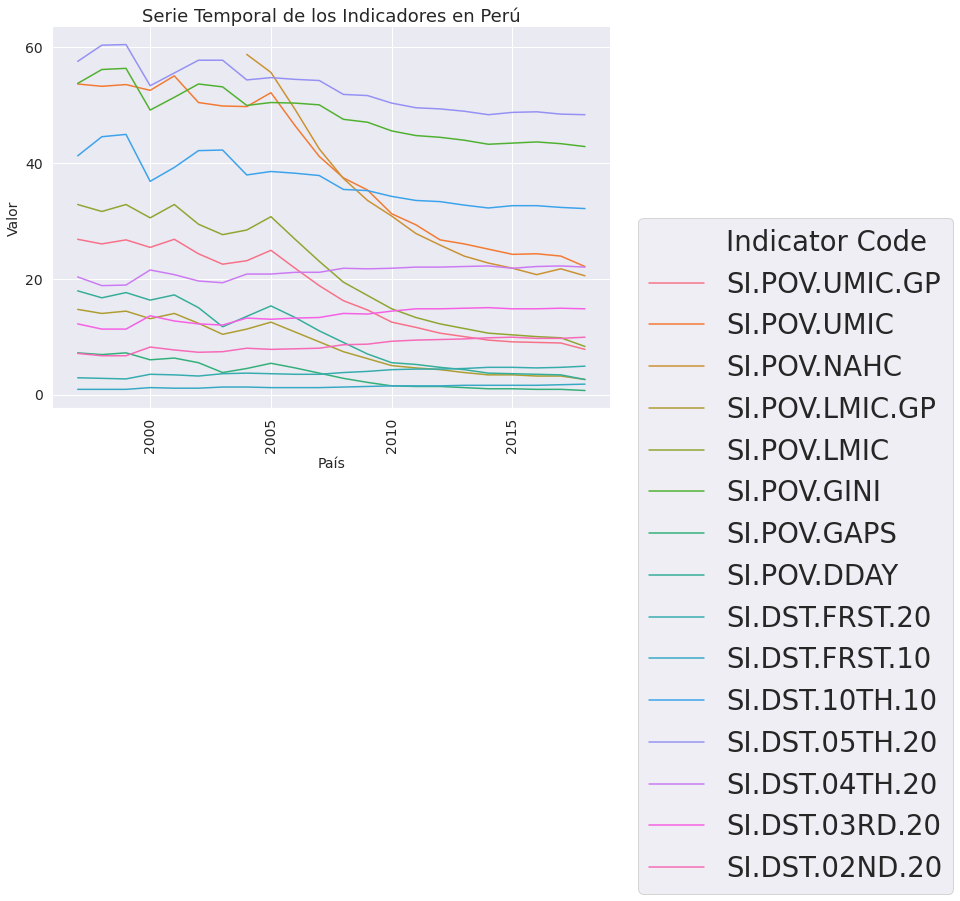

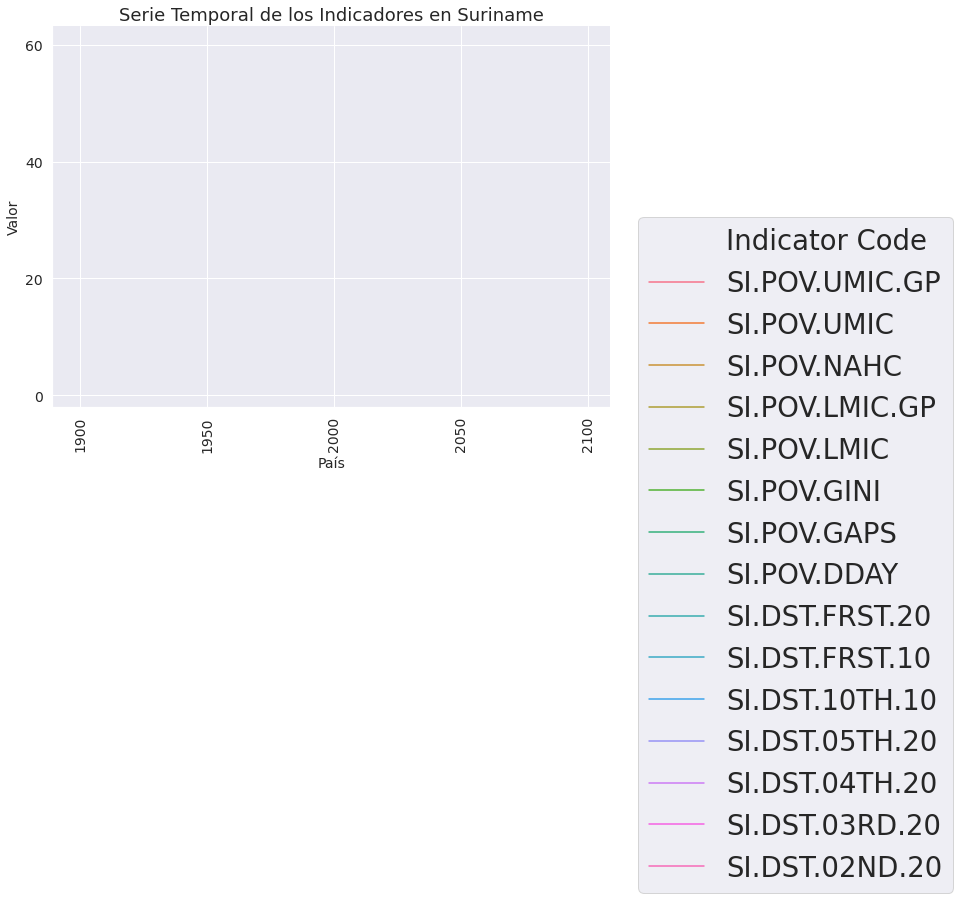

In [ ]:
countries = poverty['Country Name'].drop_duplicates().to_list()
PovertyDataMelt = PovertyDataMelt.copy()
for country in countries:
    plt.figure(figsize=(10,7))
    sns.lineplot(data=PovertyDataMelt[PovertyDataMelt["Country Name"]==country], x="Year", y="value", hue="Indicator Code")
    plt.title("Serie Temporal de los Indicadores en " + str(country), fontsize=18)
    sns.despine()
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('País', fontsize=14)
    plt.ylabel('Valor', fontsize=14)
    plt.xticks(rotation=90)
    plt.legend(bbox_to_anchor=(1.05, 0.5), loc='upper left', borderaxespad=0.)

### Determinación de Año a Predecir

Una vez seleccionados los indicadores a predecir por país para la dimensión de educación, se verifica que todos los indicadores seleccionados tengan información para el año 2019, para elegirlo como año prueba. Si no se cumple la condición, entonces, se replica el análisis para el año 2018, y se opta por considerarlo como año a predecir.

In [ ]:
featureWOData_2019  = PovertyData["2019"].isna().sum()
POData_2019 = (featureWOData_2019/len(PovertyData["2019"]))*100

print("De las 15 features seleccionadas para Protección Social, el " + str(round(POData_2019, 2)) + "% no posee información para el año 2019." )

featureWOData_2018  = PovertyData["2018"].isna().sum()

POData_2018 = (featureWOData_2018/len(PovertyData["2018"]))*100

print("De las 15 features seleccionadas para Protección Social, el " + str(round(POData_2018, 2)) + "% no posee información para el año 2018." )



De las 15 features seleccionadas para Protección Social, el 99.44% no posee información para el año 2019.
De las 15 features seleccionadas para Protección Social, el 33.89% no posee información para el año 2018.


Teniendo el cuenta que para el año 2019 falta información, se decide seleccionar el año 2018.

## MEDIO AMBIENTE

1. ¿Cuántos **tipos de Features diferentes** existen por indicador considerado? ¿Todos los países mantienen esa misma cantidad para el mismo indicador?

In [ ]:
print("El indicador de Medio Ambiente tiene " + str(len(environment["features"].unique())) + " features.")
print("El análisis se lleva a cabo consdierando " + str(len(environment["Country Name"].unique())) + " países.")
print(environment["Country Name"].unique())

In [ ]:
countries = environment['Country Name'].unique()

for countries in countries:
    
    print("La cantidad de features que posee " + str(countries) + ": " + str(environment[environment['Country Name']==countries]['features'].count()) )

### Análisis por Feature para toda la Región

2.  ¿Cuál es la **proporción de valores nulos** para cada Feature dentro de cada Indicador con respecto al intervalo temporal considerado? ¿Estos valores nulos se encuentran dispersos a lo largo de todo el intervalo temporal o existen agrupamientos (más chicos y/o más grandes) de los mismos? ¿Qué decisión se podría tomar con respecto a los mismos en un futuro?

In [ ]:
print("Los features de Medio Ambiente que existen son los siguientes: \n", str(environment['features'].unique()))

Para llevar a cabo el análisis de los datos nulos, se construye una matriz por feature y por año en la que se muestra el porcentaje de registros existentes para cada combinación considerando toda la región.

In [ ]:
EnviroValuesByICode = environment.groupby("Indicator Code").count().drop(["Country Code", "Country Name", "Indicator", "features"], axis=1)
EnviroValuesByICode["Valor"] = EnviroValuesByICode.sum(axis=1)
EnviroValuesByICode = EnviroValuesByICode.sort_values(by=['Valor'], ascending=False)
EnviroValuesByICode = ((EnviroValuesByICode/12)*100).drop(columns = ["Valor"])
EnviroValuesByICode = EnviroValuesByICode.rename(columns = lambda x : str(x)[:4])
round(EnviroValuesByICode,2)

Se construye un mapa de calor para visualizar aquellas features con mayor porcentaje de registros, mientras mas oscuro el color menos proporción de registros hay para dicha combinación.

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(EnviroValuesByICode, cbar=True, linewidths=0.1,  vmin=0, vmax=100)
#sns.set(font_scale=2.5)

Como se observa en el grafico, durante el periodo de 1970 a 1990 para ciertos indicadores se concentra la mayor cantidad de nulos. Es importante destacar que desde el año 2009 hasta la actualidad empieza a crecer la cantidad de datos nulos de los indicadores. Para el año 2013 ya hay una gran cantidad de datos nulos que sigue creciendo hasta el punto en el cual no hay indicador que tenga informacion en el año 2019, lo que condicionará nuestra predicción.

In [ ]:
EnviroByYear = pd.melt(environment.drop(["Country Code", "Country Name", "Indicator", "features"], axis=1), id_vars = ["Indicator Code"])
EnviroByYear["variable"] = pd.to_numeric(EnviroByYear["variable"] )
EnviroByYear = EnviroByYear.rename(columns = {"variable": "Year"})
TotalData_1990 = (EnviroByYear["Year"]<1990).sum()
WithData_1990 = ((EnviroByYear["Year"]<1990) & (EnviroByYear["value"]>0)).sum()

print("El % de registros sin datos para el período de 1970 a 1990 es de: " +  str(round((1 - (WithData_1990/TotalData_1990))*100,2)) + "%") 

TotalData_2008 = ((1990<=EnviroByYear["Year"])&(EnviroByYear["Year"]<=2008)).sum()
WithData_2008 = (((1990<=EnviroByYear["Year"])&(EnviroByYear["Year"]<=2008)) & (EnviroByYear["value"]>0)).sum()

print("El % de registros sin datos para el período de 1991 a 2008 es de: " +  str(round((1 - (WithData_2008/TotalData_2008))*100,2)) + "%") 

TotalData_2019 = (EnviroByYear["Year"]>=2009).sum()
WithData_2019 = ((EnviroByYear["Year"]>=2009) & (EnviroByYear["value"]>0)).sum()

Check = len (EnviroByYear) == (TotalData_2019 + TotalData_2008 + TotalData_1990 )

print("El % de registros sin datos para el período de 2009 a 2019 es de: " +  str(round((1 - (WithData_2019/TotalData_2019))*100,2)) + "%") 

Se seleccionan en un principio los 30 features con mas datos en toda la región:

In [ ]:
EnviroByYear = EnviroByYear.reset_index()
EnviroByYear["features"] = EnviroByYear["Indicator Code"]
EnviroByYear["features"] = EnviroByYear["features"].map(environment.set_index("Indicator Code")["features"].to_dict())
FeaturesEnviroSelection = EnviroByYear.iloc[0:15][["Indicator Code", "features"]].set_index("Indicator Code")
FeaturesEnviroSelection

### Análisis por País para cada Feature

4. Volviendo a los resultados del punto 2, elegir como mínimo 15 Features por Indicador con al menos el 50% de valores no nulos (y en lo posible los mismos para todos los países) y mostrar gráficamente, con gráficos de distribución o de cajas por ejemplo, la distribución de los mismos. ¿Qué se puede observar de estas distribuciones? ¿Son normales? ¿Qué sucede con los outliers? ¿Observan alguna similitud entre los features elegidos?. Para estos mismos 15 Features realizar el gráfico de línea de su serie temporal y analizarlo.

Se construye una matriz para determinar cuál es el porcentaje de registros con datos considerando las 30 features seleccionadas por país y año. 

In [ ]:
EnviroIDCode = FeaturesEnviroSelection.reset_index()['Indicator Code'].to_list()
RelevantFeaturesEnviro = environment[environment["Indicator Code"].isin(EnviroIDCode)]

EnviroDataByCountry = RelevantFeaturesEnviro.groupby("Country Name").count().drop(["features", "Indicator", "Country Code", "Indicator Code"], axis=1)
EnviroDataByCountry["Valor"] = EnviroDataByCountry.sum(axis=1)
EnviroDataByCountry = EnviroDataByCountry.sort_values(by=['Valor'], ascending=False)
EnviroDataByCountry = ((EnviroDataByCountry/len(RelevantFeaturesEnviro["Indicator Code"].unique()))*100).drop(columns = ["Valor"])
EnviroDataByCountry = EnviroDataByCountry.rename(columns = lambda x : str(x)[:4])
round(EnviroDataByCountry,2)

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(EnviroDataByCountry, cbar=True, linewidths=.3, vmin=0, vmax=100)

Se realiza un heatmap considerando como centro el 50% de esta forma se puede visualizar cuáles son las combinaciones que tienen mas del 50% de registros con datos.

In [ ]:
plt.figure(figsize=(40, 20))
sns.heatmap(EnviroDataByCountry, cbar=True, linewidths=.3, center=50, cmap="PRGn")

In [ ]:
print("El % de países que tienen más del 50% de los features con datos para cada año es: \n" + str(round((EnviroDataByCountry[EnviroDataByCountry>50].count()/len(environment["Country Name"].unique()))*100, 0).astype(int)))

In [ ]:
EnviroByYear = pd.melt(RelevantFeaturesEnviro, id_vars = ["features", "Indicator" , "Country Name","Country Code", "Indicator Code"])
EnviroByYear["variable"] = pd.to_numeric(EnviroByYear["variable"] )
EnviroByYear = EnviroByYear.rename(columns = {"variable": "Year"})
EnviroByYear["Year"] = EnviroByYear["Year"].apply(lambda x: str(x)[:4])

EnviroByYear

A partir de 1991, todos los paises en análisis tienen información para más del 50% de los features relevantes. Esto se evidencia en el heatmap, donde aquellas combinaciones con más del 50% de registros se muestran en diferentes tonalidades de verdes. A partir del 2015 abundan las conmbinaciones que no alcanzan el 50% de los registros, lo que se visualiza al irse perdiendo el color verde y apareciendo las diferentes tonalidades de violeta.

Se modifica la estructura del dataset para poder analizar el porcentaje de registros con datos por país, por feature y por año, para decidir qué features considerar para cada país.

In [ ]:
RelevantFeaturesByID = RelevantFeaturesEnviro.drop(["Country Code", "Indicator", "features"], axis=1)
RelevantFeaturesByID = RelevantFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
RelevantFeaturesByID["Porcentaje de Registros"] = (RelevantFeaturesByID.sum(axis=1)/50)*100
# RelevantFeaturesByID = RelevantFeaturesByID["Porcentaje de Registros"].reset_index().sort_values(by='Porcentaje de Registros', ascending=True)
RelevantFeaturesByID = RelevantFeaturesByID["Porcentaje de Registros"].reset_index().sort_values(by='Indicator Code', ascending=False)

countries = environment['Country Name'].drop_duplicates().to_list()
for countries in countries:
    plt.figure(figsize=(20, 10))
    sns.barplot(x="Indicator Code", y="Porcentaje de Registros", data=RelevantFeaturesByID[RelevantFeaturesByID["Country Name"]== countries], color = "r")
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('Indicator Code', fontsize=14)
    plt.ylabel('Porcentaje con Datos', fontsize=14)
    plt.title("Porcentaje con Datos por Indicador de " + str(countries) + "\n", fontsize=16)
    plt.axhline(y=50,linewidth=1, color='black')


In [ ]:
EnviroRelevantFeaturesByID = RelevantFeaturesEnviro.drop(["Country Code", "Indicator", "features"], axis=1)
EnviroRelevantFeaturesByID = EnviroRelevantFeaturesByID.groupby(["Country Name", "Indicator Code"]).count()
EnviroRelevantFeaturesByID["Porcentaje de Registros"] = (EnviroRelevantFeaturesByID.sum(axis=1)/50)*100
EnviroRelevantFeaturesByID["Mayor a 50%"] = EnviroRelevantFeaturesByID["Porcentaje de Registros"]>50
EnviroRelevantFeaturesByID = EnviroRelevantFeaturesByID[["Porcentaje de Registros" , "Mayor a 50%"]].reset_index().sort_values(by='Indicator Code', ascending=False)
countries = environment['Country Name'].drop_duplicates()
EnviroIDbyCountry = []
for countries in countries:
       EnviroIDbyCountry.append( EnviroRelevantFeaturesByID.loc[EnviroRelevantFeaturesByID["Country Name"]==countries].iloc[0:15] )
EnviroIDbyCountry

De la salida anterior se desprende que no todos los features seleccionados posee más del 50% de datos para todos los países. En particular, para Paraguay, Venezuela, Guyana y Suriname tendremos que considerar features adicionales. Se prosigue armando una lista general que contenga la lista de features anterior con algunos adicionales en funcion de los features con más datos para estos ultimos países.

In [ ]:
# Buscamos primeros 15 features con mas datos para Paraguay

ParEnviroValuesByICode = environment[environment["Country Name"]=="Paraguay"].groupby("Indicator Code").count().drop(["Country Code", "Indicator", "features"], axis=1)
ParEnviroValuesByICode["Valor"] = ParEnviroValuesByICode.sum(axis=1)
ParEnviroValuesByICode = ParEnviroValuesByICode.sort_values(by=['Valor'], ascending=False)
ParEnviroValuesByICode = ((ParEnviroValuesByICode/12)*100).drop(columns = ["Valor"])
ParEnviroValuesByICode = ParEnviroValuesByICode.rename(columns = lambda x : str(x)[:4])

ParEnviroValuesByICode.reset_index().iloc[0:15]["Indicator Code"].to_list()

In [ ]:
# Buscamos primeros 15 features con mas datos para Venezuela

VenEnviroValuesByICode = environment[environment["Country Name"]=="Venezuela"].groupby("Indicator Code").count().drop(["Country Code", "Indicator", "features"], axis=1)
VenEnviroValuesByICode["Valor"] = VenEnviroValuesByICode.sum(axis=1)
VenEnviroValuesByICode = VenEnviroValuesByICode.sort_values(by=['Valor'], ascending=False)
VenEnviroValuesByICode = ((VenEnviroValuesByICode/12)*100).drop(columns = ["Valor"])
VenEnviroValuesByICode = VenEnviroValuesByICode.rename(columns = lambda x : str(x)[:4])

VenEnviroValuesByICode.reset_index().iloc[0:15]["Indicator Code"].to_list()

In [ ]:
# Buscamos primeros 15 features con mas datos para Guyana

GuyEnviroValuesByICode = environment[environment["Country Name"]=="Guyana"].groupby("Indicator Code").count().drop(["Country Code", "Indicator", "features"], axis=1)
GuyEnviroValuesByICode["Valor"] = GuyEnviroValuesByICode.sum(axis=1)
GuyEnviroValuesByICode = GuyEnviroValuesByICode.sort_values(by=['Valor'], ascending=False)
GuyEnviroValuesByICode = ((GuyEnviroValuesByICode/12)*100).drop(columns = ["Valor"])
GuyEnviroValuesByICode = GuyEnviroValuesByICode.rename(columns = lambda x : str(x)[:4])

GuyEnviroValuesByICode.reset_index().iloc[0:15]["Indicator Code"].to_list()

In [ ]:
# Buscamos primeros 15 features con mas datos para Suriname

SurEnviroValuesByICode = environment[environment["Country Name"]=="Suriname"].groupby("Indicator Code").count().drop(["Country Code", "Indicator", "features"], axis=1)
SurEnviroValuesByICode["Valor"] = SurEnviroValuesByICode.sum(axis=1)
SurEnviroValuesByICode = SurEnviroValuesByICode.sort_values(by=['Valor'], ascending=False)
SurEnviroValuesByICode = ((SurEnviroValuesByICode/12)*100).drop(columns = ["Valor"])
SurEnviroValuesByICode = SurEnviroValuesByICode.rename(columns = lambda x : str(x)[:4])

SurEnviroValuesByICode.reset_index().iloc[0:15]["Indicator Code"].to_list()

Como Paraguay tenía 8 False, deberiamos agregar 8 features por él. Visualizando sus primeros 15 features con más datos, que no coincidan con la lista original, elegimos los siguientes: 
"AG.LND.TOTL.K2", 
"AG.SRF.TOTL.K2", 
"NY.ADJ.DKAP.CD'", 
"NY.ADJ.AEDU.GN.ZS", 
"NY.ADJ.DCO2.CD", 
"NY.ADJ.DFOR.CD", 
"NY.ADJ.DMIN.CD", 
"ER.FSH.PROD.MT".

Venezuela debería agregar 4 features, y dentro de su lista se encuentran features coincidentes con los de Paraguay, de manera que no agregamos ningun extra por el. En el caso de Guyana deberiamos agregar dos y sucede lo mismo que antes, de modo que tampoco agregamos ninguno por el. 

En el caso de Suriname, por su parte, deberiamos agregar 8 features. Visualizando sus primeros 15 features con más datos se observa que 7 de ellos coinciden con los de Paraguay. Consecuentemente, solo debemos agregar 1 y se escoje:
"NY.ADJ.AEDU.CD"

In [ ]:
EnviroIDbyCountry = EnviroIDbyCountry.copy()
EnviroIDFeatures = EnviroIDbyCountry[0]["Indicator Code"].to_list() +  [ "AG.LND.TOTL.K2", "AG.SRF.TOTL.K2", "NY.ADJ.DKAP.CD'", "NY.ADJ.AEDU.GN.ZS", "NY.ADJ.DCO2.CD", "NY.ADJ.DFOR.CD", "NY.ADJ.DMIN.CD", "ER.FSH.PROD.MT", "NY.ADJ.AEDU.CD"]
EnviroIDFeatures

In [ ]:
print("Asignación de ID Code elegidos con su respectivo feature." )
environment[environment["Indicator Code"].isin(EnviroIDFeatures)][["Indicator Code", "features"]].drop_duplicates().reset_index().drop(columns=["index"])

#### Histograma por Feature para cada país

Para realizar los siguientes análisis, se construye un dataset que tenga solo las columnas relevantes de análisis y que solo considere los ID Features seleccionados en el paso anterior. 

In [ ]:
columns=environment.columns
EnviroData=environment.drop(["Indicator", "Country Code", "features"], axis=1).rename(columns = lambda x : str(x)[:4] if x in columns[5:] else x)
EnviroData=EnviroData[EnviroData["Indicator Code"].isin(EnviroIDFeatures)]

In [ ]:
EnviroDataMelt = pd.melt(EnviroData, id_vars = ["Indicator Code" , "Country Name"])
EnviroDataMelt["variable"] = pd.to_numeric(EnviroDataMelt["variable"] )
EnviroDataMelt = EnviroDataMelt.rename(columns = {"variable": "Year"})

Se crea un dataset por país

In [ ]:
arg_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Argentina"]
bra_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Brasil"]
ur_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Uruguay"]
par_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Paraguay"]
ven_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Venezuela"]
bol_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Bolivia"]
chi_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Chile"]
guy_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Guyana"]
sur_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Suriname"]
col_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Colombia"]
ecu_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Ecuador"]
per_env=EnviroDataMelt[EnviroDataMelt["Country Name"]=="Perú"]

Se grafican los histogramas para cada ID Features

In [ ]:
for EnviroIDFeatures in EnviroIDFeatures:
    plt.figure(figsize=(13,6))
    sns.distplot(arg_env[arg_env["Indicator Code"]==EnviroIDFeatures]["value"], label="arg", hist=False)
    sns.distplot(bra_env[bra_env["Indicator Code"]==EnviroIDFeatures]["value"], label="bra", hist=False)
    sns.distplot(ur_env[ur_env["Indicator Code"]==EnviroIDFeatures]["value"], label="ur", hist=False)
    sns.distplot(par_env[par_env["Indicator Code"]==EnviroIDFeatures]["value"], label="par", hist=False)
    sns.distplot(ven_env[ven_env["Indicator Code"]==EnviroIDFeatures]["value"], label="ven", hist=False)
    sns.distplot(bol_env[bol_env["Indicator Code"]==EnviroIDFeatures]["value"], label="bol", hist=False)
    sns.distplot(chi_env[chi_env["Indicator Code"]==EnviroIDFeatures]["value"], label="chi", hist=False)
    sns.distplot(guy_env[guy_env["Indicator Code"]==EnviroIDFeatures]["value"], label="guy", hist=False)
    sns.distplot(sur_env[sur_env["Indicator Code"]==EnviroIDFeatures]["value"], label="sur", hist=False)
    sns.distplot(col_env[col_env["Indicator Code"]==EnviroIDFeatures]["value"], label="col", hist=False)
    sns.distplot(ecu_env[ecu_env["Indicator Code"]==EnviroIDFeatures]["value"], label="ecu", hist=False)
    sns.distplot(per_env[per_env["Indicator Code"]==EnviroIDFeatures]["value"], label="per", hist=False)
    plt.title("Histograma del feature "+ str(EnviroIDFeatures) + " por país")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    

En el caso de Environment, no se observa una heterogeneidad tan grande entre las distribuciones de las features entre países como para otros indicadores. Sin embargo, existen algunas diferencias para casos particulares de features. El país de la región que pareciera tener un comportamiento sustanciamente distinto al de sus pares de la región para muchos features es Suriname.

#### BoxPlot por Feature

Para profundizar el análisis llevado a cabo hasta ahora, se construyen Box Plot para cada feature por país. 

In [ ]:
EnviroIDbyCountry = EnviroIDbyCountry.copy()
EnviroIDFeatures = EnviroIDbyCountry[0]["Indicator Code"].unique()
EnviroDataMelt = EnviroDataMelt.copy()

for EnviroIDFeatures in EnviroIDFeatures:
    plt.figure(figsize=(13,6))
    sns.boxplot(data=EnviroDataMelt[EnviroDataMelt["Indicator Code"]==EnviroIDFeatures], x="Country Name", y="value")
    plt.title("Boxplot del feature "+ str(EnviroIDFeatures) + " por país", fontsize=18)
    plt.legend(bbox_to_anchor=(1.05, 1), borderaxespad=0.)
    plt.xticks(fontsize=14, rotation=90)
    plt.yticks(fontsize=14)
    plt.xlabel('País', fontsize=14)
    plt.ylabel('Valor', fontsize=14)

El analisis del boxplot permite observar las grandes diferencias que existen entre países para muchos de los features en cuanto a sus medidas de posición. Algunos países presentan un gran rango de datos y otros países tienen mayor concentración de los mismos, dependiendo del feature particular. Brasil, Bolivia y Venezuela en general son países de mayor dispersión de datos, respecto a otros como Argentina o Uruguay que para ningún feature presentan gran variabilidad. 

#### Series Temporales de los Features por País

In [ ]:
countries = environment['Country Name'].drop_duplicates().to_list()

for countries in countries:
    plt.figure(figsize=(10,7))
    sns.lineplot(data=EnviroDataMelt[EnviroDataMelt["Country Name"]==countries], x="Year", y="value", hue="Indicator Code")
    plt.title("Serie Temporal de los Indicadores en " + str(countries))
    sns.despine()
    plt.xticks(rotation=90)
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

## Determinación del Año a Predecir

Una vez seleccionados los indicadores a predecir por país para la dimensión de educación, se verifica que todos los indicadores seleccionados tengan información para el año 2019, para elegirlo como año prueba. Si no se cumple la condición, entonces, se replica el análisis para años anteriores hasta encontrar un año con la totalidad de datos.

In [ ]:
featureWOData_2019_Env  = EnviroData["2019"].isna().sum()
Data_2019_Env = (featureWOData_2019_Env/len(EnviroData["2019"]))*100
print("De las features seleccionadas para educación, el " + str(round(Data_2019_Env, 2)) + "% no posee información para el año 2019." )

featureWOData_2018_Env  = EnviroData["2018"].isna().sum()
Data_2018_Env = (featureWOData_2018_Env/len(EnviroData["2018"]))*100
print("De las features seleccionadas para educación, el " + str(Data_2018_Env) + "% no posee información para el año 2018." )

featureWOData_2017_Env  = EnviroData["2017"].isna().sum()
Data_2017_Env = (featureWOData_2017_Env/len(EnviroData["2017"]))*100
print("De las features seleccionadas para educación, el " + str(Data_2017_Env) + "% no posee información para el año 2017." )

featureWOData_2016_Env  = EnviroData["2016"].isna().sum()
Data_2016_Env = (featureWOData_2016_Env/len(EnviroData["2016"]))*100
print("De las features seleccionadas para educación, el " + str(Data_2016_Env) + "% no posee información para el año 2016." )

featureWOData_2015_Env  = EnviroData["2015"].isna().sum()
Data_2015_Env = (featureWOData_2015_Env/len(EnviroData["2015"]))*100
print("De las features seleccionadas para educación, el " + str(Data_2015_Env) + "% no posee información para el año 2015." )

featureWOData_2014_Env  = EnviroData["2014"].isna().sum()
Data_2014_Env = (featureWOData_2014_Env/len(EnviroData["2014"]))*100
print("De las features seleccionadas para educación, el " + str(Data_2014_Env) + "% no posee información para el año 2014." )

featureWOData_2013_Env  = EnviroData["2013"].isna().sum()
Data_2013_Env = (featureWOData_2013_Env/len(EnviroData["2013"]))*100
print("De las features seleccionadas para educación, el " + str(Data_2013_Env) + "% no posee información para el año 2013." )

featureWOData_2012_Env  = EnviroData["2012"].isna().sum()
Data_2012_Env = (featureWOData_2012_Env/len(EnviroData["2012"]))*100
print("De las features seleccionadas para educación, el " + str(Data_2012_Env) + "% no posee información para el año 2012." )

featureWOData_2011_Env  = EnviroData["2011"].isna().sum()
Data_2011_Env = (featureWOData_2011_Env/len(EnviroData["2011"]))*100
print("De las features seleccionadas para educación, el " + str(Data_2011_Env) + "% no posee información para el año 2011." )

featureWOData_2010_Env  = EnviroData["2010"].isna().sum()
Data_2010_Env = (featureWOData_2010_Env/len(EnviroData["2010"]))*100
print("De las features seleccionadas para educación, el " + str(Data_2010_Env) + "% no posee información para el año 2010." )

Si desestimamos para la predicción algunos features para ciertos países, entonces podriamos estimar el año 2018. Sin embargo, recién para la proyección del 2011 contariamos con todos los datos del año anterior para todos los países.

## FEATURES DUPLICADOS ENTRE DIMENSIONES

In [ ]:
dataset
features_repetidas = dataset.groupby("features").count()

#dataset["features repetidas"] = dataset["features"]
features_repetidas["Features Repetido"] = features_repetidas["Indicator"]>12

#features_repetidas.reset_index() #[["features", "Indicator", "Features Repetido"]]
#features_repetidas[features_repetidas["Features Repetido"]==True][["features", "Indicator"]]


## Consignas

### Parte I: Análisis estadístico 

#### Por Indicadores segmentado por país 

El objetivo de esta primera parte es realizar un **estudio profundo, riguroso y detallado a nivel estadístico** de las variables dentro de cada indicador y para cada país en particular, se recomienda utilizar los datasets por indicador.

Para realizar el mismo se disponen de las siguientes preguntas y consignas de guía pero las mismas no son limitantes pues toda información que sume al conocimiento del dataset será de utilidad en los siguientes prácticos y hasta el final de la mentoría. Cada respuesta debe ser debidamente argumentada.

1. ¿Cuántos **tipos de Features diferentes** existen por indicador considerado? ¿Todos los países mantienen esa misma cantidad para el mismo indicador?
2.  ¿Cuál es la **proporción de valores nulos** para cada Feature dentro de cada Indicador con respecto al intervalo temporal considerado? ¿Estos valores nulos se encuentran dispersos a lo largo de todo el intervalo temporal o existen agrupamientos (más chicos y/o más grandes) de los mismos? ¿Qué decisión se podría tomar con respecto a los mismos en un futuro?
3. ¿Cómo es la **distribución de valores nulos por año** (por columnas del dataset)?. Teniendo en cuenta que el objetivo final de la mentoría es realizar una predicción de cada Feature para el año 2019, ¿se disponen de datos suficientes para comparar las predicciones que se obtendrán con el valor real en ese año?
4. Volviendo a los resultados del punto 2, elegir como **mínimo 15 Features por Indicador con al menos el 50% de valores no nulos** (y en lo posible los mismos para todos los países) y mostrar gráficamente, con gráficos de distribución o de cajas por ejemplo, la distribución de los mismos. ¿Qué se puede observar de estas distribuciones? ¿Son normales? ¿Qué sucede con los outliers? ¿Observan alguna similitud entre los features elegidos?. Para estos mismos 15 Features realizar el gráfico de línea de su serie temporal y analizarlo.
5. Elegir un Indicador de su interés y 5 features relacionados al mismo, también de su interés, y trazar la serie temporal sus valores a lo largo de los años. ¿Se observa alguna tendencia o algún patrón que se repite cada tanto?
6. **Pregunta de respuesta abierta y libre:** ¿Qué herramientas estadísticas aprendidas en clase (cálculo de estadísticos, test de hipótesis, probabilidad condicional, etc.) podría ayudar en el análisis de este dataset y el objetivo planteado? 

En base a las respuestas de los puntos anteriores:

7. ¿Existen similitudes y/o diferencias entre los diferentes países considerados? Justifique su respuesta utilizando los datos del análisis previo.

#### Comparación entre Indicadores

8. ¿Existen Features compartidos entre los diferentes Indicadores? En caso de respuesta afirmativa, los valores y la distribución es la misma para cada país? ¿Qué conclusión se podría sacar acerca de que un Feature tenga dos o más indicadores asociados?


6. Pregunta de respuesta abierta y libre: ¿Qué herramientas estadísticas aprendidas en clase (cálculo de estadísticos, test de hipótesis, probabilidad condicional, etc.) podría ayudar en el análisis de este dataset y el objetivo planteado?


En base a las respuestas de los puntos anteriores:

7. ¿Existen similitudes y/o diferencias entre los diferentes países considerados? Justifique su respuesta utilizando los datos del análisis previo.
PARA EL CASO PUNTUAL DE EDUCACIÓN LOS PAÍSES SON SUPER HETEROGENEOS, LO QUE SE PUEDE OBSERVAR EN LOS BOXPLOT DE LOS INDICADORES CON MAYOR CANTIDAD DE DATOS

### Parte II: Preguntas disparadoras desde el punto de vista social:

**OBLIGATORIAS**

1. ¿Qué pueden decir acerca de los valores nulos y no nulos presentes en aquellos Features relacionados con el rol de la mujer y con grupos históricamente marginados? ¿De qué manera cree que el contexto social se refleja en los valores del dataset?

2. ¿Qué conclusiones a nivel social puede sacar de todo lo analizado hasta el momento? ¿Qué considera que sería interesante seguir indagando o explorando?

**OPCIONALES**

1. ¿Existe alguna similitud entre los diferentes indicadores analizados ya sea considerando el comportamiento de un mismo indicador para todos los países o comparando el comportamiento de los indicadores entre sí?

2. ¿Existirá algún tipo de correlación entre los Features de un indicador? ¿Qué herramientas estadísticas aprendidas en clase podría utilizar para responder la pregunta anterior?

## Presentación de resultados 

Realizar un informe en formato notebook, o el que se considere más apropiado, en la cual se presenten los resultados del análisis realizado. El mismo debe estar pensado para un público técnico pero que desconoce los aspectos propios del problema a resolver (por ejemplo, sus compañeros de clase). 

Se evaluará principalmente la claridad del mensaje presentado, el uso de las herramientas y los conceptos desarrollados durante las clases de la materia "Análisis y Visualización". Asimismo, el mismo debe incluir de manera clara los hallazgos y problemas encontrados y las posibles accionar a tomar.

Se aconseja que el informe tenga una estructura ordenada, clara y fácil de leer. Por ejemplo, podría contar con una introducción a la problemática a resolver, una descripción de los datos a emplear, el desarrollo propiamente dicho de todo el trabajo y las conclusiones que se obtuvieron.


## Fecha de entrega

- Semana 22/06/2020: Reunión para mostrar avances, resolver dudas y afinar cuestiones del análisis.
- Semana 29/06/2020: Entrega del práctico. El mismo debe estar subido al [repositorio](https://github.com/jfrau/DiploDatos2020) en la carpeta "Entregas".

## Extra: Info de utilidad sobre visualización en python

Las siguientes imágenes, que pueden encontrarse [aquí](https://matplotlib.org/_images/anatomy.png) y [aquí](/media/fig_map.bc8c7cabd823.png) dan un pantallazo general de la estructura y opciones personalización de un gráfico.

<table><tr>
<td> <img src="https://matplotlib.org/_images/anatomy.png" alt="Drawing" style="width: 400px"/> </td>
<td> <img src="https://files.realpython.com/media/fig_map.bc8c7cabd823.png" alt="Drawing" style="width: 400px height:30px;"/> </td>
</tr></table>

Además, dado que el análisis en este práctico implica realizar muchos gráficos y llevar a cabo comparaciones entre los mismos, los subplots se vuelven en una herramienta bastante útil. A continuación, algunos ejemplos de código que pueden servir al momento de realizar los mismos.

<code>plt.subplots()</code> de la librería matplotlib crea una figura y una grilla de subfiguras (que puede pensarse como una matriz con m filas y n columnas) y permite un buen control de los gráficos individuales. Más info disponible en este [link](https://matplotlib.org/3.1.0/gallery/subplots_axes_and_figures/subplots_demo.html)

In [ ]:
fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2, figsize=(8, 4))
#fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4)) # OTRA FORMA
fig.subplots_adjust(wspace=.2) 

gender['Country Name'].value_counts().plot(kind='bar',ax=ax1)
ax1.set_title('Cantidad de países - Gender')
ax1.set_xlabel('Países')
ax1.set_ylabel('Cantidad')
ax1.grid()

gender['2017.0'].value_counts().plot(kind='hist',ax=ax2)
ax2.set_title('Distribución de valores del año 2000 \n  Gender')
ax2.set_xlabel('Año 2000')
ax2.set_ylabel('Gender')
ax2.yaxis.tick_right()

In [ ]:
fig, axes = plt.subplots(2,3 ,figsize=(8,4), dpi=100, sharex=True)
axes[0,1].axhline(y=60, color='r', linestyle='-')
axes[1,1].grid()
plt.tight_layout()

El siguiente gráfico se encuentra en [https://www.python-course.eu/matplotlib_subplots.php](https://www.python-course.eu/matplotlib_subplots.php) junto con muchos otros ejemplos.

In [ ]:
rows, cols = 2, 3
fig, ax = plt.subplots(rows, cols,
                       sharex='col', 
                       sharey='row')

for row in range(2):
    for col in range(3):
        ax[row, col].text(0.5, 0.5, 
                          str((row, col)),
                          color="green",
                          fontsize=18, 
                          ha='center')


<code>plt.subplot2grid()</code> de la librería matplotlib crea un eje y locaciones específicas en una grilla regular.

 Más info disponible en este [link](https://matplotlib.org/3.2.1/api/_as_gen/matplotlib.pyplot.subplot2grid.html)

In [ ]:
fig = plt.figure(figsize=(20,5))
#Gráfico 1
plt.subplot2grid((1,3),(0,0))
plt.title('TÍTULO GRÁFICO 1')
#Gráfico 2
plt.subplot2grid((1,3),(0,1))
sns.distplot(health['2001.0'].dropna())
plt.title('Distribución del año 2001 \n health ')
#Gráfico 3
plt.subplot2grid((1,3),(0,2))
fig.suptitle('TÍTULO GENERAL', y=1.01) 
plt.title('TITULO GRÁFICO 3')
sns.despine()